# Start Up Funding Analysis



In [ ]:
import gdown
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

pd.options.display.float_format = '{:.0f}'.format

%matplotlib inline

In [ ]:
df = pd.read_csv('/content/investments_VC.csv',encoding='unicode_escape')
df.head()

,permalink,name,homepage_url,category_list,market,funding_total_usd,status,country_code,state_code,region,...,secondary_market,product_crowdfunding,round_A,round_B,round_C,round_D,round_E,round_F,round_G,round_H
0,/organization/waywire,#waywire,http://www.waywire.com,|Entertainment|Politics|Social Media|News|,News,"17,50,000",acquired,USA,NY,New York City,...,0,0,0,0,0,0,0,0,0,0
1,/organization/tv-communications,&TV Communications,http://enjoyandtv.com,|Games|,Games,"40,00,000",operating,USA,CA,Los Angeles,...,0,0,0,0,0,0,0,0,0,0
2,/organization/rock-your-paper,'Rock' Your Paper,http://www.rockyourpaper.org,|Publishing|Education|,Publishing,"40,000",operating,EST,NaN,Tallinn,...,0,0,0,0,0,0,0,0,0,0
3,/organization/in-touch-network,(In)Touch Network,http://www.InTouchNetwork.com,|Electronics|Guides|Coffee|Restaurants|Music|i...,Electronics,"15,00,000",operating,GBR,NaN,London,...,0,0,0,0,0,0,0,0,0,0
4,/organization/r-ranch-and-mine,-R- Ranch and Mine,NaN,|Tourism|Entertainment|Games|,Tourism,"60,000",operating,USA,TX,Dallas,...,0,0,0,0,0,0,0,0,0,0


## Initial EDA

In [ ]:
df.tail()

,permalink,name,homepage_url,category_list,market,funding_total_usd,status,country_code,state_code,region,...,secondary_market,product_crowdfunding,round_A,round_B,round_C,round_D,round_E,round_F,round_G,round_H
54289,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54290,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54291,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54292,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54293,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.shape

(54294, 39)

Drop rows which are entirely empty.

In [ ]:
df.dropna(how='all',inplace=True)

In [ ]:
df.shape

(49438, 39)

In [ ]:
df.columns

Index(['permalink', 'name', 'homepage_url', 'category_list', ' market ',
       ' funding_total_usd ', 'status', 'country_code', 'state_code', 'region',
       'city', 'funding_rounds', 'founded_at', 'founded_month',
       'founded_quarter', 'founded_year', 'first_funding_at',
       'last_funding_at', 'seed', 'venture', 'equity_crowdfunding',
       'undisclosed', 'convertible_note', 'debt_financing', 'angel', 'grant',
       'private_equity', 'post_ipo_equity', 'post_ipo_debt',
       'secondary_market', 'product_crowdfunding', 'round_A', 'round_B',
       'round_C', 'round_D', 'round_E', 'round_F', 'round_G', 'round_H'],
      dtype='object')

Data type of each collumn

In [ ]:
df.dtypes

,0
permalink,object
name,object
homepage_url,object
category_list,object
market,object
funding_total_usd,object
status,object
country_code,object
state_code,object
region,object


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49438 entries, 0 to 49437
Data columns (total 39 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   permalink             49438 non-null  object 
 1   name                  49437 non-null  object 
 2   homepage_url          45989 non-null  object 
 3   category_list         45477 non-null  object 
 4    market               45470 non-null  object 
 5    funding_total_usd    49438 non-null  object 
 6   status                48124 non-null  object 
 7   country_code          44165 non-null  object 
 8   state_code            30161 non-null  object 
 9   region                44165 non-null  object 
 10  city                  43322 non-null  object 
 11  funding_rounds        49438 non-null  float64
 12  founded_at            38554 non-null  object 
 13  founded_month         38482 non-null  object 
 14  founded_quarter       38482 non-null  object 
 15  founded_year          38

Collumns having Null values

In [ ]:
df.isnull().sum()[df.isnull().sum() > 0 ]

,0
name,1
homepage_url,3449
category_list,3961
market,3968
status,1314
country_code,5273
state_code,19277
region,5273
city,6116
founded_at,10884


In [ ]:
df.describe()

,funding_rounds,founded_year,seed,venture,equity_crowdfunding,undisclosed,convertible_note,debt_financing,angel,grant,...,secondary_market,product_crowdfunding,round_A,round_B,round_C,round_D,round_E,round_F,round_G,round_H
count,49438,38482,49438,49438,49438,49438,49438,49438,49438,49438,...,49438,49438,49438,49438,49438,49438,49438,49438,49438,49438
mean,2,2007,217321,7501051,6163,130221,23364,1888157,65419,162845,...,38456,7074,1243955,1492891,1205356,737526,342468,169769,57671,14232
std,1,8,1056985,28471124,199905,2981404,1432046,138204566,658291,5612088,...,3864461,428217,5531974,7472704,7993592,9815218,5406915,6277905,5252312,2716865
min,1,1902,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
25%,1,2006,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
50%,1,2010,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
75%,2,2012,25000,5000000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
max,18,2014,130000000,2351000000,25000000,292432833,300000000,30079503000,63590263,750500000,...,680611554,72000000,319000000,542000000,490000000,1200000000,400000000,1060000000,1000000000,600000000


Drop any duplicate rows

In [ ]:
df = df.drop_duplicates()
print(df.shape)

(49438, 39)


Unique values in a collumn

In [ ]:
cat_columns, num_columns = list() , list()
CAT_THRESHOLD = 20
print("-"*150)
for col in df.columns:
  if df[col].nunique() > CAT_THRESHOLD:
    num_columns.append(col)
    print(col, " : " , df[col].nunique())

  else:
    cat_columns.append(col)
    print(col, " : " , df[col].nunique(),"\n")

  print("-"*150)

------------------------------------------------------------------------------------------------------------------------------------------------------
permalink  :  49436
------------------------------------------------------------------------------------------------------------------------------------------------------
name  :  49350
------------------------------------------------------------------------------------------------------------------------------------------------------
homepage_url  :  45850
------------------------------------------------------------------------------------------------------------------------------------------------------
category_list  :  16675
------------------------------------------------------------------------------------------------------------------------------------------------------
 market   :  753
--------------------------------------------------------------------------------------------------------------------------------------------------

### Data Cleaning

Name collumn Null values replaced with Not available value

In [ ]:
df['name'] = df['name'].fillna(value='Not Available')

Any collumn having null values with same name is replaced by the existing information present for that name in the data.

In [ ]:
name_map_df = df[df['homepage_url'].notnull()][['name','homepage_url']].drop_duplicates().reset_index(drop=True)
df.loc[df['homepage_url'].isnull(),'homepage_url'] = df[df['homepage_url'].isnull()]['name'].map(dict(name_map_df.values))

In [ ]:
name_map_df = df[df['category_list'].notnull()][['name','category_list']].drop_duplicates().reset_index(drop=True)
df.loc[df['category_list'].isnull(),'category_list'] = df[df['category_list'].isnull()]['name'].map(dict(name_map_df.values))

In [ ]:
name_map_df = df[df[' market '].notnull()][['name',' market ']].drop_duplicates().reset_index(drop=True)
df.loc[df[' market '].isnull(),' market '] = df[df[' market '].isnull()]['name'].map(dict(name_map_df.values))

In [ ]:
name_map_df = df[df['status'].notnull()][['name','status']].drop_duplicates().reset_index(drop=True)
df.loc[df['status'].isnull(),'status'] = df[df['status'].isnull()]['name'].map(dict(name_map_df.values))

In [ ]:
name_map_df = df[df['country_code'].notnull()][['name','country_code']].drop_duplicates().reset_index(drop=True)
df.loc[df['country_code'].isnull(),'country_code'] = df[df['country_code'].isnull()]['name'].map(dict(name_map_df.values))

In [ ]:
name_map_df = df[df['state_code'].notnull()][['name','state_code']].drop_duplicates().reset_index(drop=True)
df.loc[df['state_code'].isnull(),'state_code'] = df[df['state_code'].isnull()]['name'].map(dict(name_map_df.values))

In [ ]:
name_map_df = df[df['region'].notnull()][['name','region']].drop_duplicates().reset_index(drop=True)
df.loc[df['region'].isnull(),'region'] = df[df['region'].isnull()]['name'].map(dict(name_map_df.values))

In [ ]:
name_map_df = df[df['city'].notnull()][['name','city']].drop_duplicates().reset_index(drop=True)
df.loc[df['city'].isnull(),'city'] = df[df['city'].isnull()]['name'].map(dict(name_map_df.values))

In [ ]:
name_map_df = df[df['founded_at'].notnull()][['name','founded_at']].drop_duplicates().reset_index(drop=True)
df.loc[df['founded_at'].isnull(),'founded_at'] = df[df['founded_at'].isnull()]['name'].map(dict(name_map_df.values))

In [ ]:
name_map_df = df[df['founded_month'].notnull()][['name','founded_month']].drop_duplicates().reset_index(drop=True)
df.loc[df['founded_month'].isnull(),'founded_month'] = df[df['founded_month'].isnull()]['name'].map(dict(name_map_df.values))

In [ ]:
name_map_df = df[df['founded_quarter'].notnull()][['name','founded_quarter']].drop_duplicates().reset_index(drop=True)
df.loc[df['founded_quarter'].isnull(),'founded_quarter'] = df[df['founded_quarter'].isnull()]['name'].map(dict(name_map_df.values))

In [ ]:
name_map_df = df[df['founded_year'].notnull()][['name','founded_year']].drop_duplicates().reset_index(drop=True)
df.loc[df['founded_year'].isnull(),'founded_year'] = df[df['founded_year'].isnull()]['name'].map(dict(name_map_df.values))

In [ ]:
df.isnull().sum()[df.isnull().sum() > 0 ]

,0
homepage_url,3439
category_list,3948
market,3955
status,1312
country_code,5251
state_code,19248
region,5251
city,6092
founded_at,10852
founded_month,10925


After replacing known null values still unknown values tend to presist. We replace those with Not Available attribute.

In [ ]:
df['homepage_url'] = df['homepage_url'].fillna(value='Not Available')
df['category_list'] = df['category_list'].fillna(value='Not Available')
df[' market '] = df[' market '].fillna(value='Not Available')
df['status'] = df['status'].fillna(value='Not Available')
df['country_code'] = df['country_code'].fillna(value='Not Available')
df['state_code'] = df['state_code'].fillna(value='Not Available')
df['region'] = df['region'].fillna(value='Not Available')
df['city'] = df['city'].fillna(value='Not Available')

Date Time null values replaced with 0

In [ ]:
df['founded_at'] = df['founded_at'].fillna(value='0-0-0')
df['founded_month'] = df['founded_month'].fillna(value='0-0')
df['founded_quarter'] = df['founded_quarter'].fillna(value='0-Q0')
df['founded_year'] = df['founded_year'].fillna(value=0.0)

In [ ]:
df.isnull().sum()[df.isnull().sum() > 0 ]

,0


The data has no null values.

In [ ]:
df['category_list'] = df['category_list'].str.split('|')
df = df.explode('category_list')

Explode the category collumn for categorywise analysis.

In [ ]:
df.shape

(194485, 39)

In [ ]:
df_clean = df[df['category_list']!='']

In [ ]:
df_clean.shape

(103511, 39)

In [ ]:
df_clean = df_clean.drop_duplicates()
print(df_clean.shape)

(103506, 39)


In [ ]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 103506 entries, 0 to 49437
Data columns (total 39 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   permalink             103506 non-null  object 
 1   name                  103506 non-null  object 
 2   homepage_url          103506 non-null  object 
 3   category_list         103506 non-null  object 
 4    market               103506 non-null  object 
 5    funding_total_usd    103506 non-null  object 
 6   status                103506 non-null  object 
 7   country_code          103506 non-null  object 
 8   state_code            103506 non-null  object 
 9   region                103506 non-null  object 
 10  city                  103506 non-null  object 
 11  funding_rounds        103506 non-null  float64
 12  founded_at            103506 non-null  object 
 13  founded_month         103506 non-null  object 
 14  founded_quarter       103506 non-null  object 
 15  founde

In [ ]:
df_clean.isnull().sum()[df_clean.isnull().sum() > 0 ]

,0


Cleaning garbage values

In [ ]:
df_clean[' funding_total_usd '] = df_clean[' funding_total_usd '].str.replace(",","")
df_clean[' funding_total_usd '] = df_clean[' funding_total_usd '].str.replace(' -   ','0')
df_clean[' funding_total_usd '] = df_clean[' funding_total_usd '].astype(int)

### Feature Engineering

Creating new features for analysis

In [ ]:
df_clean['founded_month_num'] = df_clean['founded_month'].str.split('-').apply(lambda x: int(x[1]))
df_clean['founded_quarter_q'] = df_clean['founded_quarter'].str.split('-').apply(lambda x: x[1])
df_clean['founded_year'] = df_clean['founded_year'].astype(int)

In [ ]:
df_clean['first_funding_at_year'] = df_clean['first_funding_at'].str.split('-').apply(lambda x: int(x[0]))
df_clean['last_funding_at_year'] = df_clean['last_funding_at'].str.split('-').apply(lambda x: int(x[0]))
df_clean['first_funding_at_month'] = df_clean['first_funding_at'].str.split('-').apply(lambda x: int(x[1]))
df_clean['last_funding_at_month'] = df_clean['last_funding_at'].str.split('-').apply(lambda x: int(x[1]))

##  Different Sources of Funds

Analysis of different funds a startup can acquire

In [ ]:
df_clean.describe()

,funding_total_usd,funding_rounds,founded_year,seed,venture,equity_crowdfunding,undisclosed,convertible_note,debt_financing,angel,...,round_D,round_E,round_F,round_G,round_H,founded_month_num,first_funding_at_year,last_funding_at_year,first_funding_at_month,last_funding_at_month
count,103506,103506,103506,103506,103506,103506,103506,103506,103506,103506,...,103506,103506,103506,103506,103506,103506,103506,103506,103506,103506
mean,12085551,2,1712,287255,7392058,5259,100576,19374,1333450,87893,...,877997,394556,208944,68722,14527,3,2010,2012,6,6
std,117021388,1,712,1223312,32418900,177865,2560102,1019986,96786095,632943,...,14149105,6116868,7899962,5527624,2664609,4,30,21,4,3
min,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,1,1,1
25%,60000,1,2003,0,0,0,0,0,0,0,...,0,0,0,0,0,1,2009,2011,3,3
50%,882560,1,2009,0,0,0,0,0,0,0,...,0,0,0,0,0,1,2012,2013,6,6
75%,5500000,2,2012,121664,4000000,0,0,0,0,0,...,0,0,0,0,0,6,2013,2014,9,9
max,30079503000,18,2014,130000000,2351000000,25000000,292432833,300000000,30079503000,63590263,...,1200000000,400000000,1060000000,1000000000,600000000,12,2014,2015,12,12


<Axes: xlabel='total', ylabel='fund'>

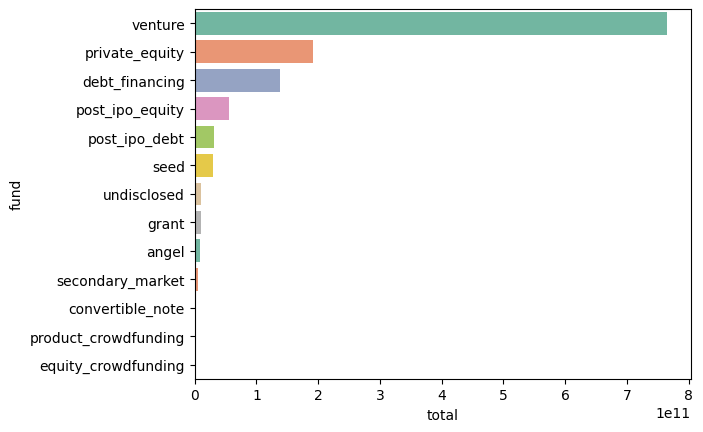

In [ ]:
fundings = [
 'seed',
 'venture',
 'equity_crowdfunding',
 'undisclosed',
 'convertible_note',
 'debt_financing',
 'angel',
 'grant',
 'private_equity',
 'post_ipo_equity',
 'post_ipo_debt',
 'secondary_market',
 'product_crowdfunding',
]

fund_list, total_list = list(), list()
for fund in fundings:
  fund_list.append(fund)
  total_list.append(df_clean[fund].sum())

df_fund = pd.DataFrame({'fund':fund_list,'total':total_list})
df_fund = df_fund.sort_values('total',ascending=False)
sns.barplot(x=df_fund['total'],y=df_fund['fund'],palette='Set2')

Insights: From the above plot it can be seen Venture Fundings is the largest source of funding for start ups.

<Axes: xlabel='total', ylabel='round'>

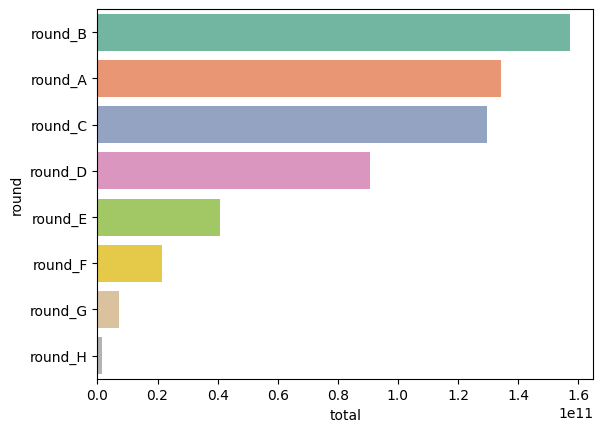

In [ ]:
rounds = ['round_A',
 'round_B',
 'round_C',
 'round_D',
 'round_E',
 'round_F',
 'round_G',
 'round_H',]

round_list, total_list = list(), list()
for round in rounds:
  round_list.append(round)
  total_list.append(df_clean[round].sum())

df_round = pd.DataFrame({'round':round_list,'total':total_list})
df_round = df_round.sort_values('total',ascending=False)
sns.barplot(x=df_round['total'],y=df_round['round'],palette='Set2')

Insights: From the above plot it can be seen Round B Fundings is the largest source of funding for start ups.

Recomendations: Round B always poses a chance of raising more money than any other rounds.

### Univariate distribution of all types of funds

<Axes: xlabel=' funding_total_usd ', ylabel='Density'>

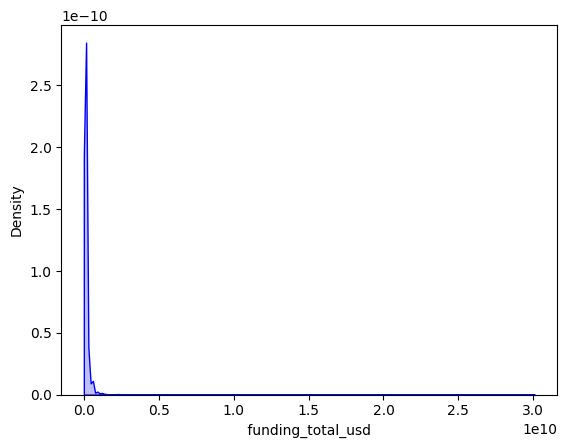

In [ ]:
sns.kdeplot(df_clean[df_clean[' funding_total_usd ']!=0][' funding_total_usd '],shade=True, color='b')

<Axes: xlabel='seed', ylabel='Density'>

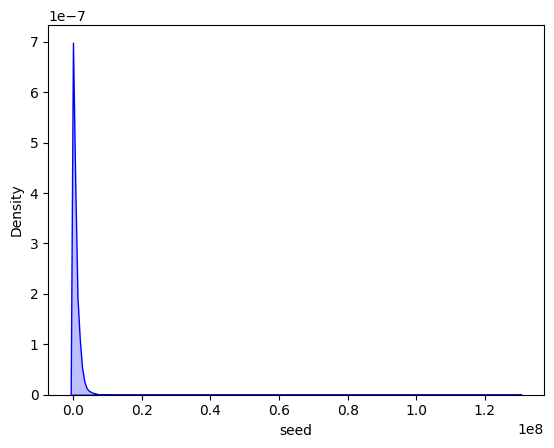

In [ ]:
sns.kdeplot(df_clean[df_clean['seed']!=0]['seed'],shade=True, color='b')

<Axes: xlabel='venture', ylabel='Density'>

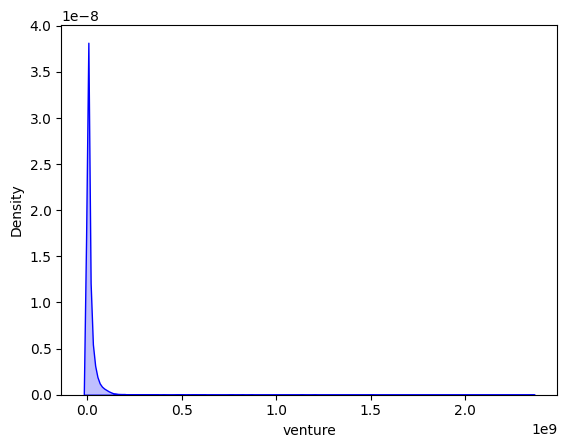

In [ ]:
sns.kdeplot(df_clean[df_clean['venture']!=0]['venture'],shade=True, color='b')

<Axes: xlabel='equity_crowdfunding', ylabel='Density'>

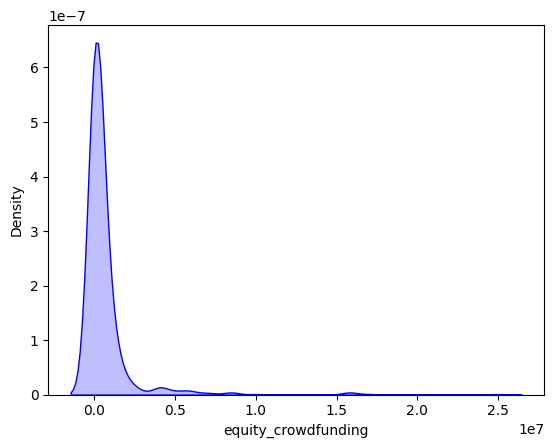

In [ ]:
sns.kdeplot(df_clean[df_clean['equity_crowdfunding']!=0]['equity_crowdfunding'],shade=True, color='b')

<Axes: xlabel='undisclosed', ylabel='Density'>

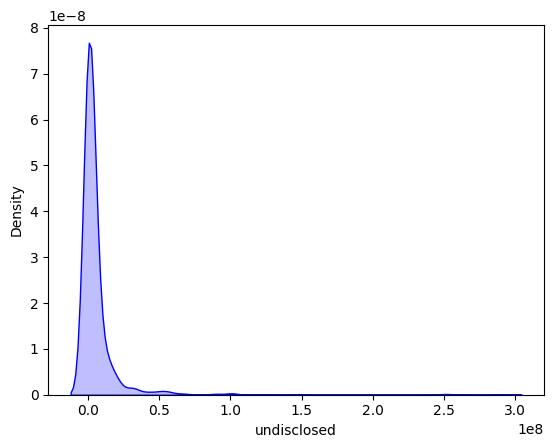

In [ ]:
sns.kdeplot(df_clean[df_clean['undisclosed']!=0]['undisclosed'],shade=True, color='b')

<Axes: xlabel='convertible_note', ylabel='Density'>

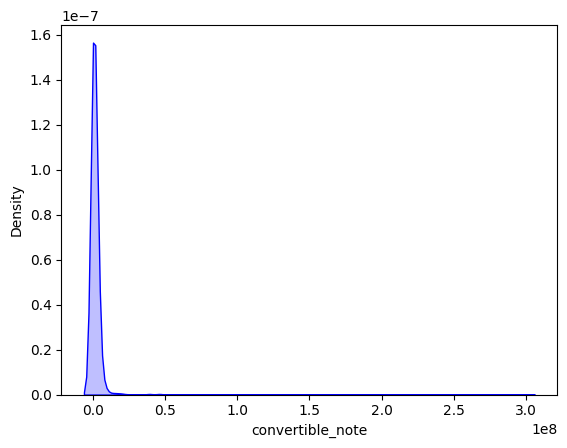

In [ ]:
sns.kdeplot(df_clean[df_clean['convertible_note']!=0]['convertible_note'],shade=True, color='b')

<Axes: xlabel='debt_financing', ylabel='Density'>

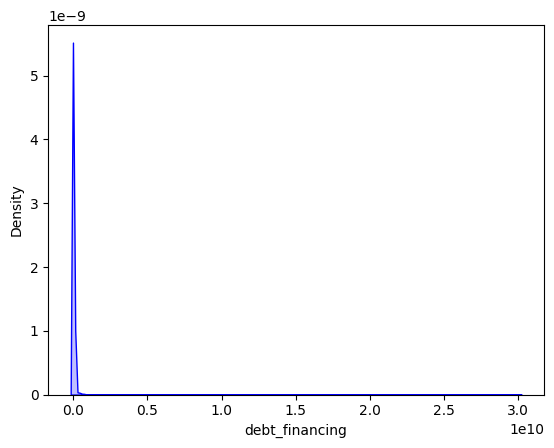

In [ ]:
sns.kdeplot(df_clean[df_clean['debt_financing']!=0]['debt_financing'],shade=True, color='b')

<Axes: xlabel='angel', ylabel='Density'>

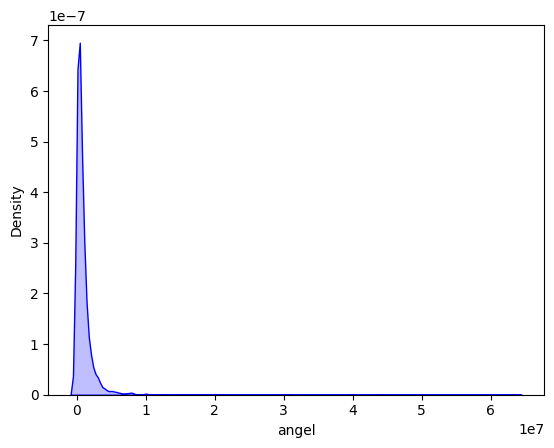

In [ ]:
sns.kdeplot(df_clean[df_clean['angel']!=0]['angel'],shade=True, color='b')

<Axes: xlabel='grant', ylabel='Density'>

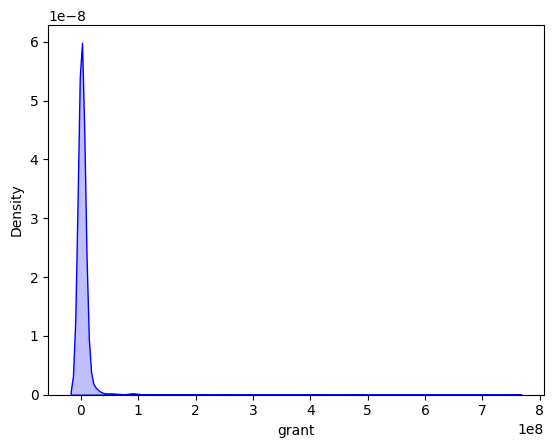

In [ ]:
sns.kdeplot(df_clean[df_clean['grant']!=0]['grant'],shade=True, color='b')

<Axes: xlabel='private_equity', ylabel='Density'>

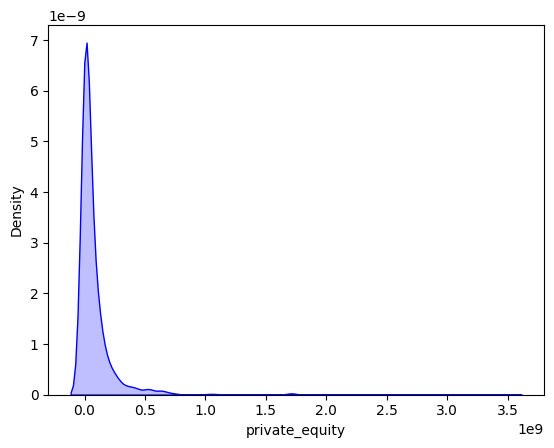

In [ ]:
sns.kdeplot(df_clean[df_clean['private_equity']!=0]['private_equity'],shade=True, color='b')

<Axes: xlabel='post_ipo_equity', ylabel='Density'>

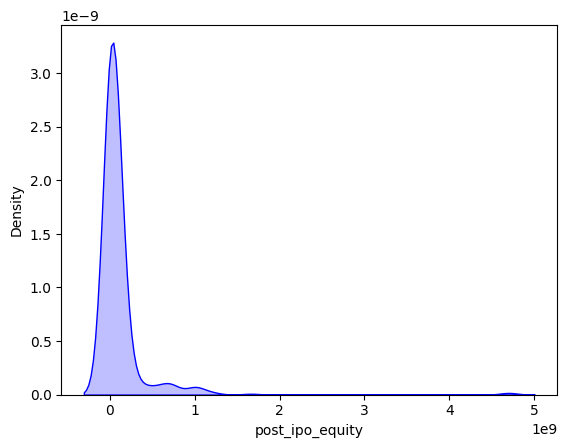

In [ ]:
sns.kdeplot(df_clean[df_clean['post_ipo_equity']!=0]['post_ipo_equity'],shade=True, color='b')

<Axes: xlabel='post_ipo_debt', ylabel='Density'>

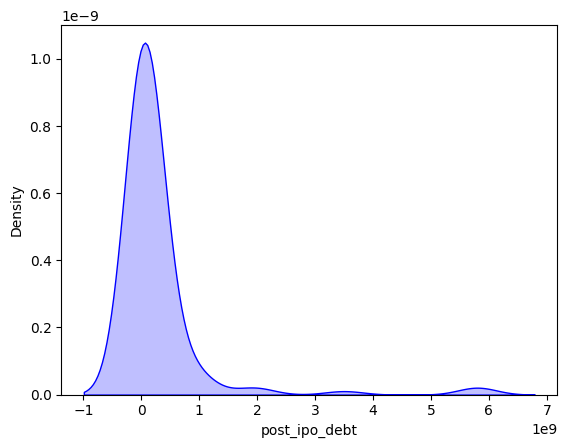

In [ ]:
sns.kdeplot(df_clean[df_clean['post_ipo_debt']!=0]['post_ipo_debt'],shade=True, color='b')

<Axes: xlabel='secondary_market', ylabel='Density'>

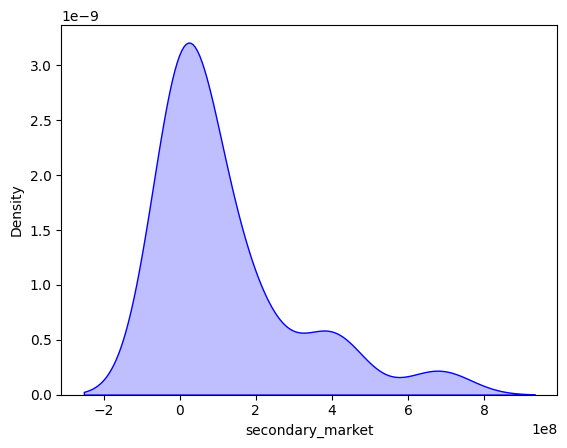

In [ ]:
sns.kdeplot(df_clean[df_clean['secondary_market']!=0]['secondary_market'],shade=True, color='b')

<Axes: xlabel='product_crowdfunding', ylabel='Density'>

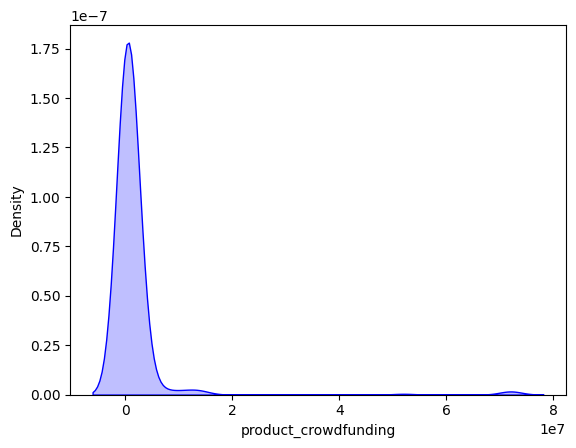

In [ ]:
sns.kdeplot(df_clean[df_clean['product_crowdfunding']!=0]['product_crowdfunding'],shade=True, color='b')

<Axes: xlabel='round_A', ylabel='Density'>

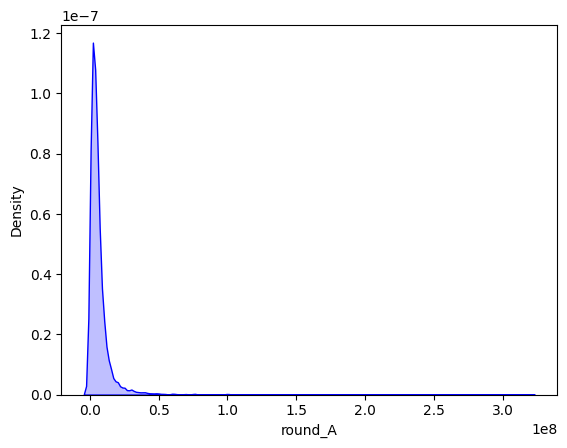

In [ ]:
sns.kdeplot(df_clean[df_clean['round_A']!=0]['round_A'],shade=True, color='b')

<Axes: xlabel='round_B', ylabel='Density'>

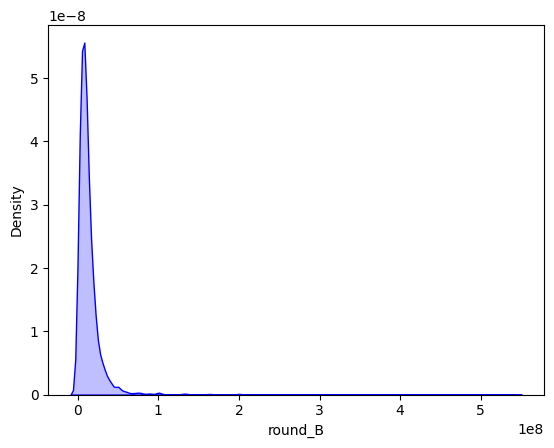

In [ ]:
sns.kdeplot(df_clean[df_clean['round_B']!=0]['round_B'],shade=True, color='b')

<Axes: xlabel='round_C', ylabel='Density'>

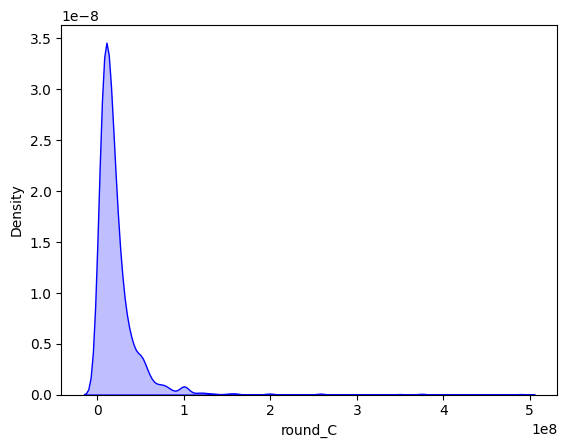

In [ ]:
sns.kdeplot(df_clean[df_clean['round_C']!=0]['round_C'],shade=True, color='b')

<Axes: xlabel='round_D', ylabel='Density'>

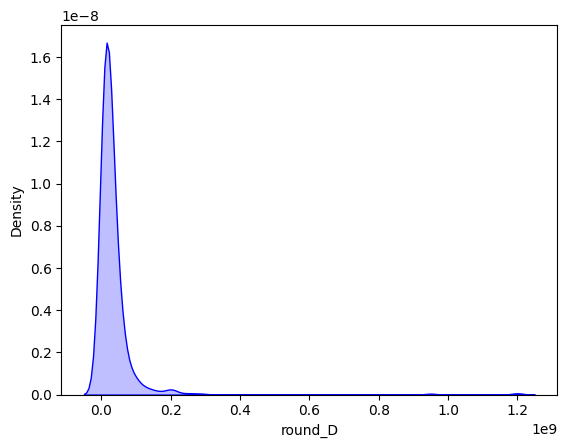

In [ ]:
sns.kdeplot(df_clean[df_clean['round_D']!=0]['round_D'],shade=True, color='b')

<Axes: xlabel='round_E', ylabel='Density'>

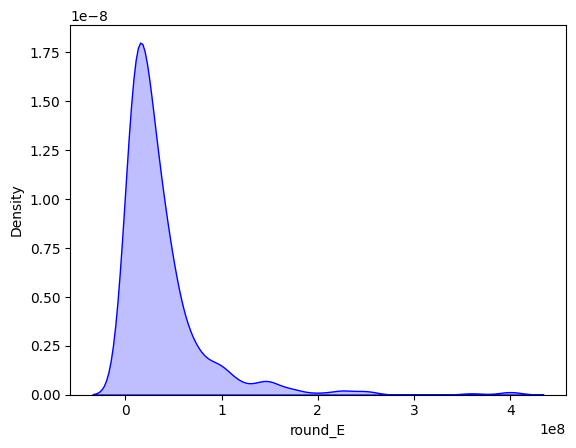

In [ ]:
sns.kdeplot(df_clean[df_clean['round_E']!=0]['round_E'],shade=True, color='b')

<Axes: xlabel='round_F', ylabel='Density'>

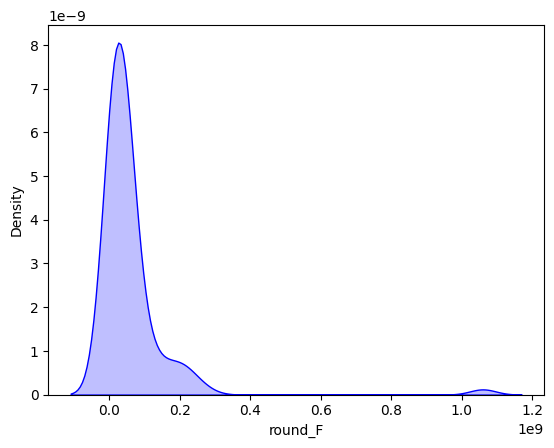

In [ ]:
sns.kdeplot(df_clean[df_clean['round_F']!=0]['round_F'],shade=True, color='b')

<Axes: xlabel='round_G', ylabel='Density'>

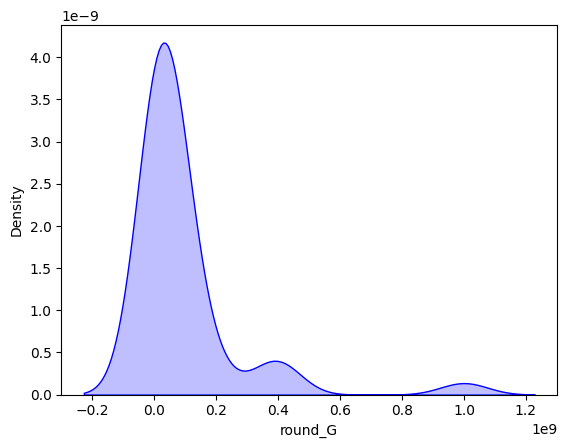

In [ ]:
sns.kdeplot(df_clean[df_clean['round_G']!=0]['round_G'],shade=True, color='b')

<Axes: xlabel='round_H', ylabel='Density'>

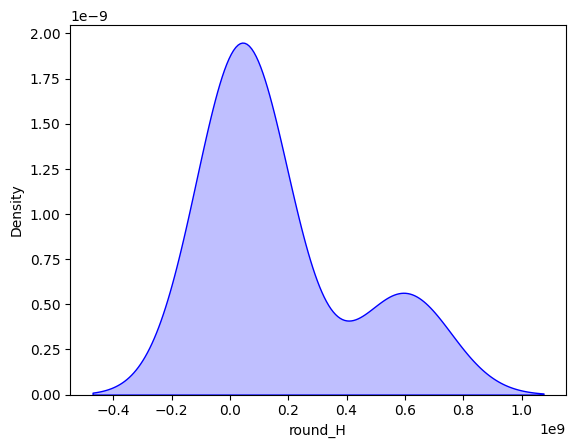

In [ ]:
sns.kdeplot(df_clean[df_clean['round_H']!=0]['round_H'],shade=True, color='b')

## Funding Rounds

<Axes: xlabel='funding_rounds', ylabel='category_list'>

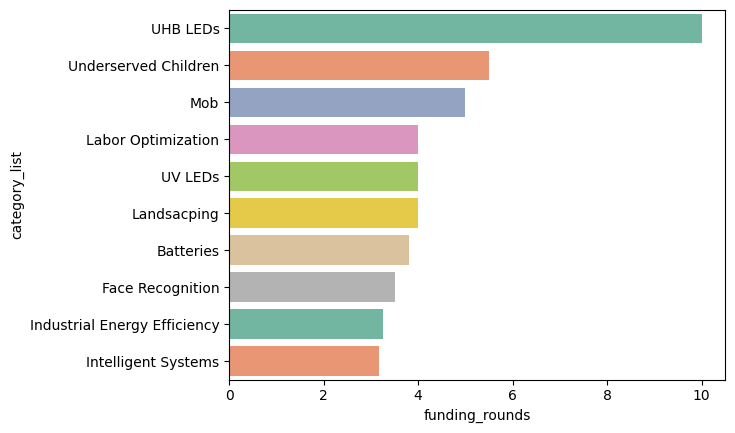

In [ ]:
df_plot = df_clean.groupby('category_list').agg({'funding_rounds':'mean'}).reset_index().sort_values('funding_rounds',ascending=False).head(10)
sns.barplot(x=df_plot['funding_rounds'], y=df_plot['category_list'],palette='Set2')

Insights: From the plot of top 10 categories UHB LEDs have the largest number of avergae funding rounds.

<Axes: xlabel='funding_rounds', ylabel=' market '>

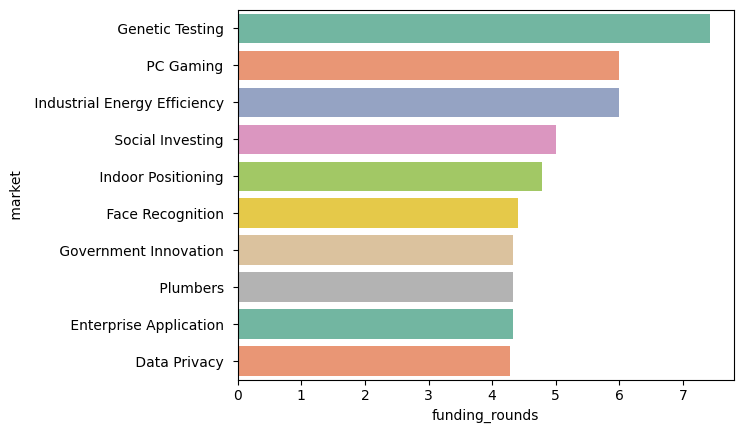

In [ ]:
df_plot = df_clean.groupby(' market ').agg({'funding_rounds':'mean'}).reset_index().sort_values('funding_rounds',ascending=False).head(10)
sns.barplot(x=df_plot['funding_rounds'], y=df_plot[' market '],palette='Set2')

Insights: From the plot of top 10 markets Genetic Testing have the largest number of avergae funding rounds.

<Axes: xlabel='funding_rounds', ylabel='status'>

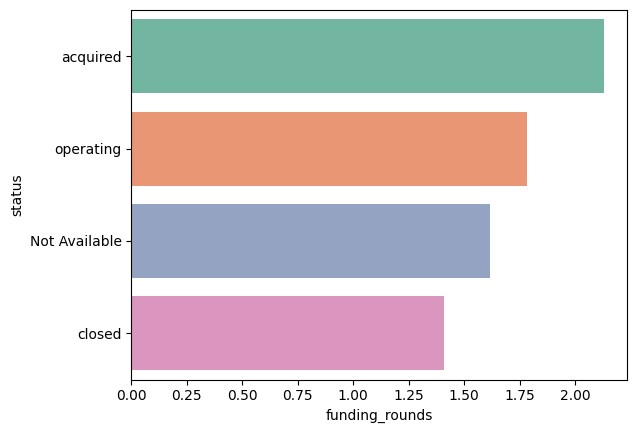

In [ ]:
df_plot = df_clean.groupby('status').agg({'funding_rounds':'mean'}).reset_index().sort_values('funding_rounds',ascending=False).head(10)
sns.barplot(x=df_plot['funding_rounds'], y=df_plot['status'],palette='Set2')

Insights: From the plot of a start up status all startups that have been acquired have the largest number of avergae funding rounds.

<Axes: xlabel='funding_rounds', ylabel='country_code'>

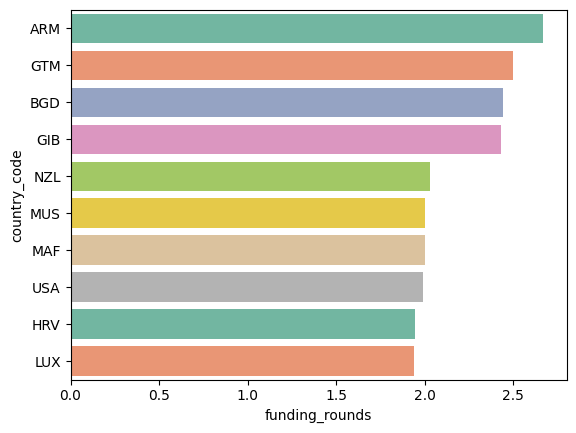

In [ ]:
df_plot = df_clean.groupby('country_code').agg({'funding_rounds':'mean'}).reset_index().sort_values('funding_rounds',ascending=False).head(10)
sns.barplot(x=df_plot['funding_rounds'], y=df_plot['country_code'],palette='Set2')

Insights: From the plot of top 10 countries Armenia have the largest number of avergae funding rounds.

<Axes: xlabel='funding_rounds', ylabel='state_code'>

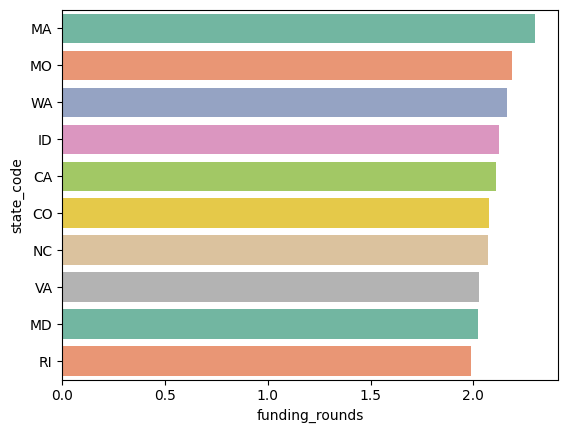

In [ ]:
df_plot = df_clean.groupby('state_code').agg({'funding_rounds':'mean'}).reset_index().sort_values('funding_rounds',ascending=False).head(10)
sns.barplot(x=df_plot['funding_rounds'], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 states Massachusetts has the largest number of avergae funding rounds.

<Axes: xlabel='funding_rounds', ylabel='region'>

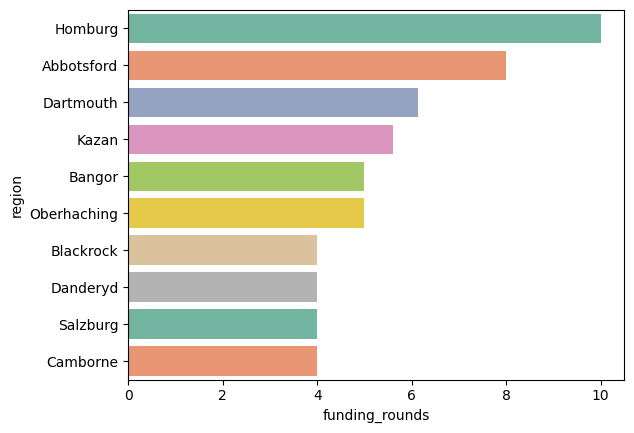

In [ ]:
df_plot = df_clean.groupby('region').agg({'funding_rounds':'mean'}).reset_index().sort_values('funding_rounds',ascending=False).head(10)
sns.barplot(x=df_plot['funding_rounds'], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 cities Homburg has the largest number of avergae funding rounds.

## Total Funding

<Axes: xlabel=' funding_total_usd ', ylabel='category_list'>

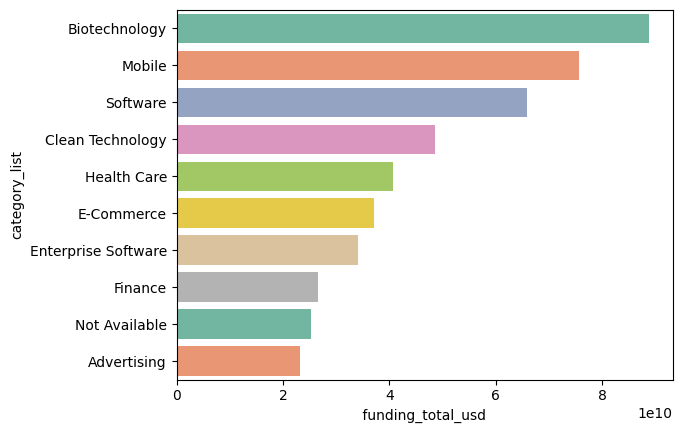

In [ ]:
df_plot = df_clean.groupby('category_list').agg({' funding_total_usd ':'sum'}).reset_index().sort_values(' funding_total_usd ',ascending=False).head(10)
sns.barplot(x=df_plot[' funding_total_usd '], y=df_plot['category_list'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of total fundings.

<Axes: xlabel=' funding_total_usd ', ylabel='category_list'>

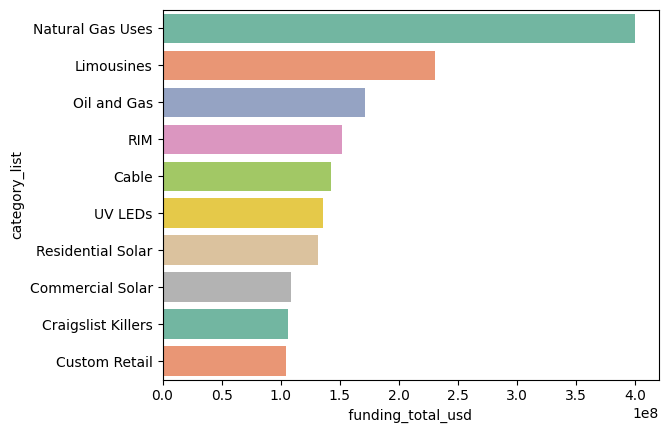

In [ ]:
df_plot = df_clean.groupby('category_list').agg({' funding_total_usd ':'mean'}).reset_index().sort_values(' funding_total_usd ',ascending=False).head(10)
sns.barplot(x=df_plot[' funding_total_usd '], y=df_plot['category_list'],palette='Set2')

Insights: From the plot of top 10 categories Natural Gas Uses have the largest number of avergae fundings.

<Axes: xlabel=' funding_total_usd ', ylabel=' market '>

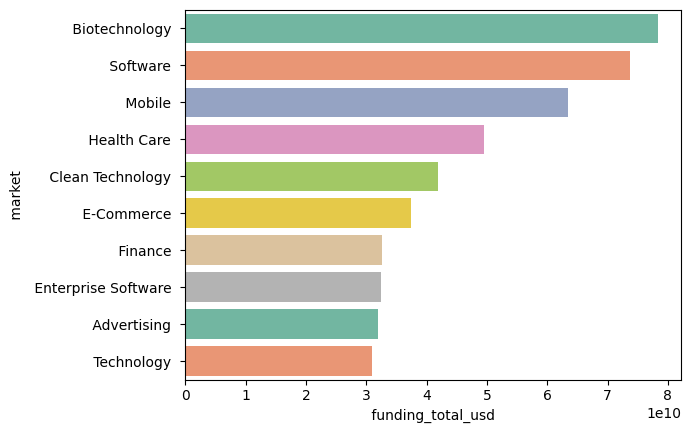

In [ ]:
df_plot = df_clean.groupby(' market ').agg({' funding_total_usd ':'sum'}).reset_index().sort_values(' funding_total_usd ',ascending=False).head(10)
sns.barplot(x=df_plot[' funding_total_usd '], y=df_plot[' market '],palette='Set2')

Insights: From the plot of top 10 markets Biotechnology have the largest number of total fundings.

<Axes: xlabel=' funding_total_usd ', ylabel=' market '>

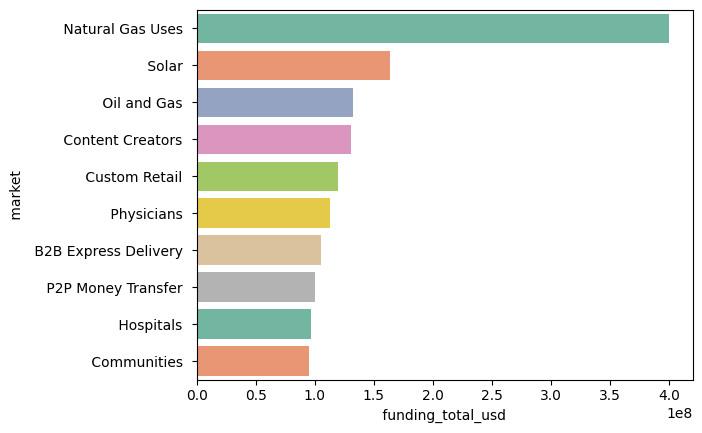

In [ ]:
df_plot = df_clean.groupby(' market ').agg({' funding_total_usd ':'mean'}).reset_index().sort_values(' funding_total_usd ',ascending=False).head(10)
sns.barplot(x=df_plot[' funding_total_usd '], y=df_plot[' market '],palette='Set2')

Insights: From the plot of top 10 markets Natural Gas Uses have the largest number of avergae fundings.

<Axes: xlabel=' funding_total_usd ', ylabel='status'>

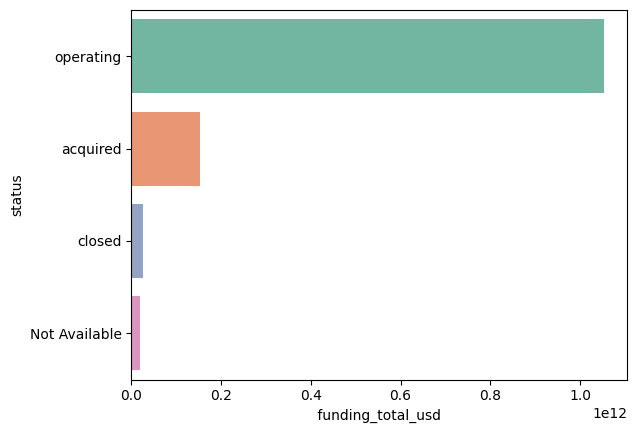

In [ ]:
df_plot = df_clean.groupby('status').agg({' funding_total_usd ':'sum'}).reset_index().sort_values(' funding_total_usd ',ascending=False).head(10)
sns.barplot(x=df_plot[' funding_total_usd '], y=df_plot['status'],palette='Set2')

Insights: From the status plot Operating startups have the largest number of total fundings.

<Axes: xlabel=' funding_total_usd ', ylabel='status'>

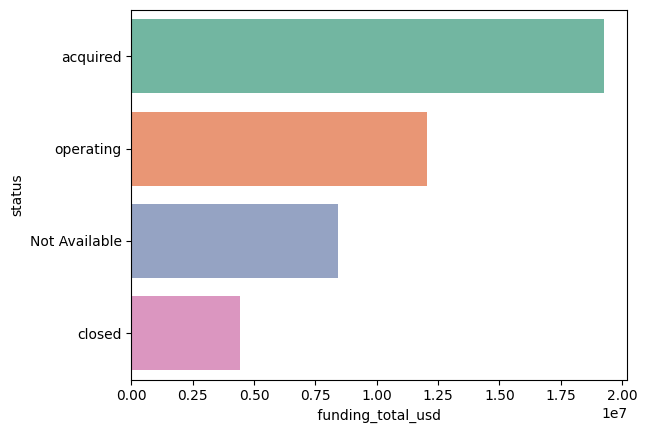

In [ ]:
df_plot = df_clean.groupby('status').agg({' funding_total_usd ':'mean'}).reset_index().sort_values(' funding_total_usd ',ascending=False).head(10)
sns.barplot(x=df_plot[' funding_total_usd '], y=df_plot['status'],palette='Set2')

Insights: From the status plot acquired startups have the largest number of average fundings.

<Axes: xlabel=' funding_total_usd ', ylabel='country_code'>

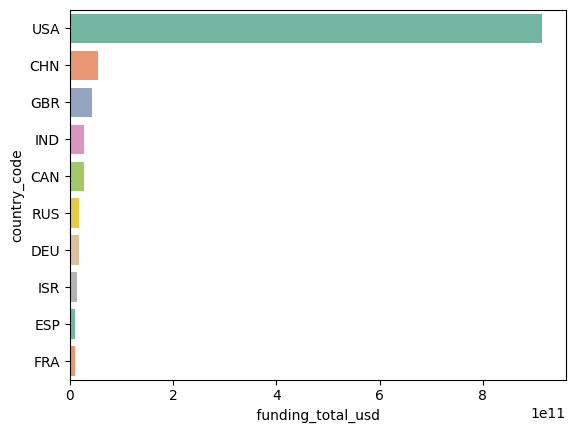

In [ ]:
df_plot = df_clean.groupby('country_code').agg({' funding_total_usd ':'sum'}).reset_index().sort_values(' funding_total_usd ',ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[' funding_total_usd '], y=df_plot['country_code'],palette='Set2')

Insights: From the plot of top 10 countries USA has the largest number of total fundings.

<Axes: xlabel=' funding_total_usd ', ylabel='country_code'>

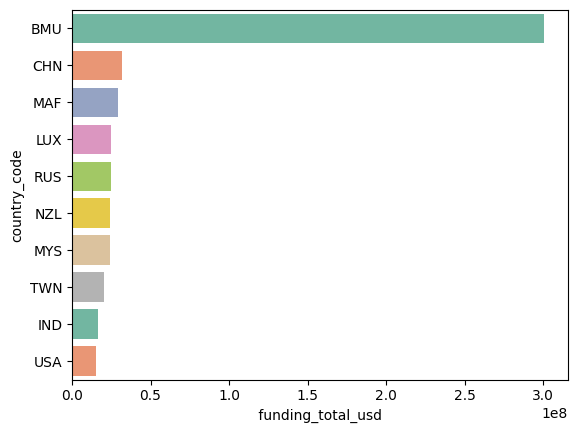

In [ ]:
df_plot = df_clean.groupby('country_code').agg({' funding_total_usd ':'mean'}).reset_index().sort_values(' funding_total_usd ',ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[' funding_total_usd '], y=df_plot['country_code'],palette='Set2')

Insights: From the plot of top 10 countries Bermuda have the largest number of avergae fundings.

<Axes: xlabel=' funding_total_usd ', ylabel='state_code'>

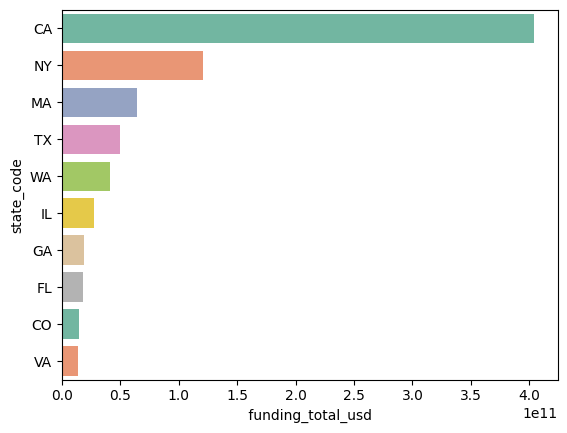

In [ ]:
df_plot = df_clean.groupby('state_code').agg({' funding_total_usd ':'sum'}).reset_index().sort_values(' funding_total_usd ',ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[' funding_total_usd '], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 states California has the largest number of total fundings.

<Axes: xlabel=' funding_total_usd ', ylabel='state_code'>

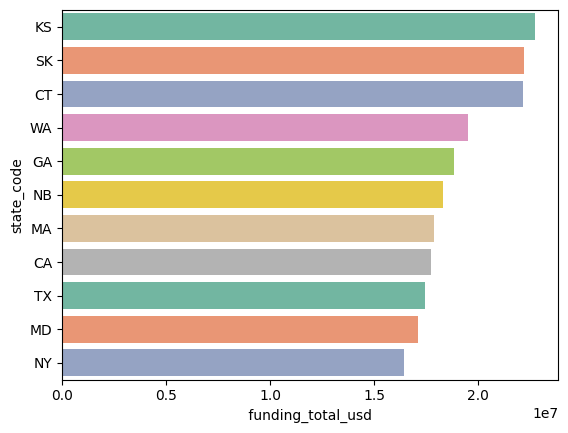

In [ ]:
df_plot = df_clean.groupby('state_code').agg({' funding_total_usd ':'mean'}).reset_index().sort_values(' funding_total_usd ',ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[' funding_total_usd '], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 states Kansas has the largest number of avergae fundings.

<Axes: xlabel=' funding_total_usd ', ylabel='region'>

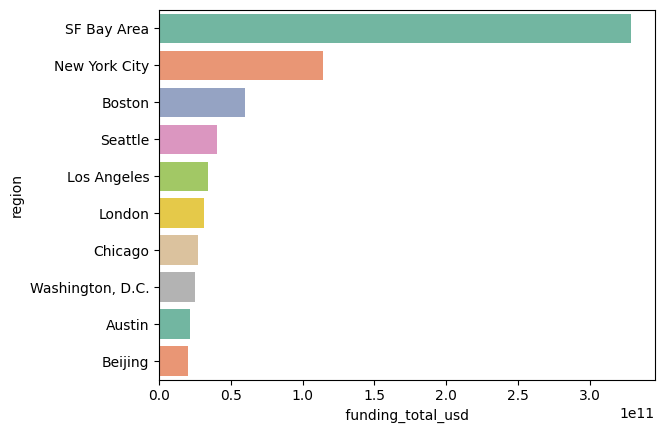

In [ ]:
df_plot = df_clean.groupby('region').agg({' funding_total_usd ':'sum'}).reset_index().sort_values(' funding_total_usd ',ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[' funding_total_usd '], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 cities SF Bay Area has the largest number of total fundings.

<Axes: xlabel=' funding_total_usd ', ylabel='region'>

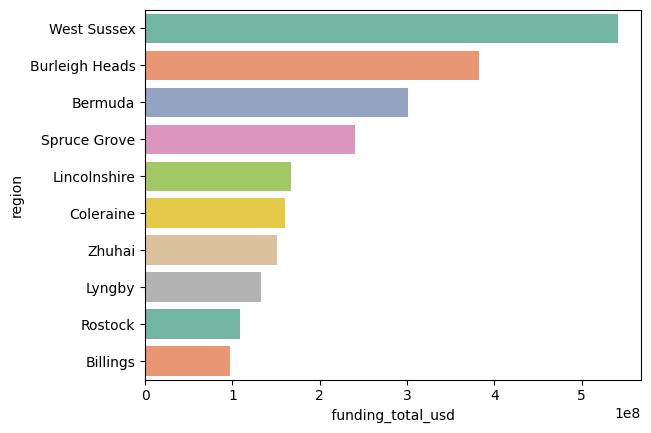

In [ ]:
df_plot = df_clean.groupby('region').agg({' funding_total_usd ':'mean'}).reset_index().sort_values(' funding_total_usd ',ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[' funding_total_usd '], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 cities West Sussex has the largest number of avergae fundings.

<Axes: xlabel='founded_year', ylabel=' funding_total_usd '>

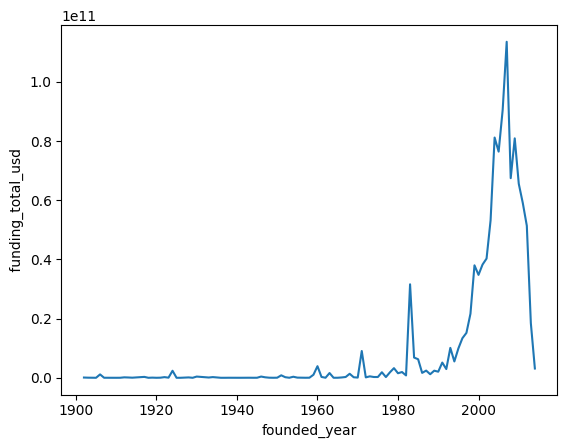

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({' funding_total_usd ':'sum'}).reset_index().sort_values(' funding_total_usd ',ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[' funding_total_usd '], x=df_plot['founded_year'])

Insights: From th above trend it can be seen that startups found in the 21st century recieved the largets amount of total fundings.

<Axes: xlabel='founded_year', ylabel=' funding_total_usd '>

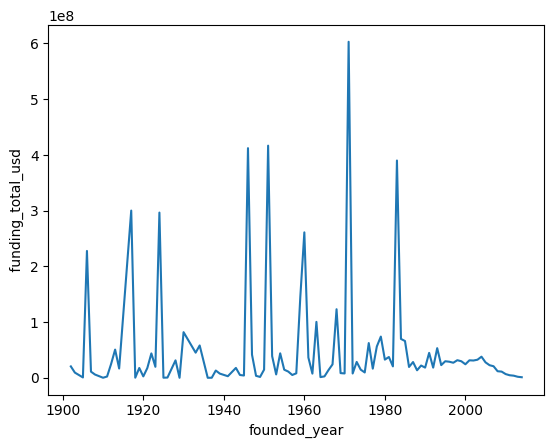

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({' funding_total_usd ':'mean'}).reset_index().sort_values(' funding_total_usd ',ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[' funding_total_usd '], x=df_plot['founded_year'])

Insights: The average plot indicates that large number of startups were found in the 21st century while over the years from 1900 quite alot of start ups have attracted good amount of fundings

<Axes: xlabel='founded_month_num', ylabel=' funding_total_usd '>

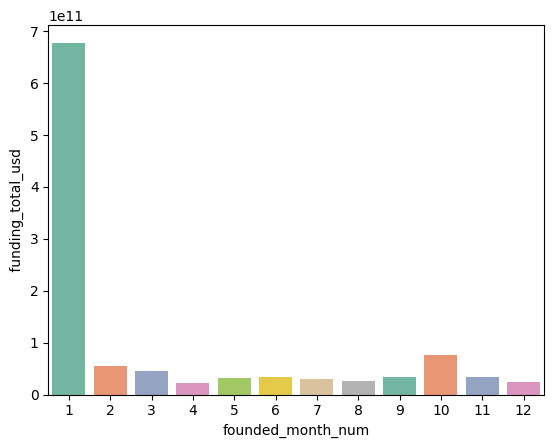

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({' funding_total_usd ':'sum'}).reset_index().sort_values(' funding_total_usd ',ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[' funding_total_usd '], x=df_plot['founded_month_num'],palette='Set2')

Insights: From the above plot it can be seen that start ups founded in the month of January have attracted the most amount of fundings

<Axes: xlabel='founded_month_num', ylabel=' funding_total_usd '>

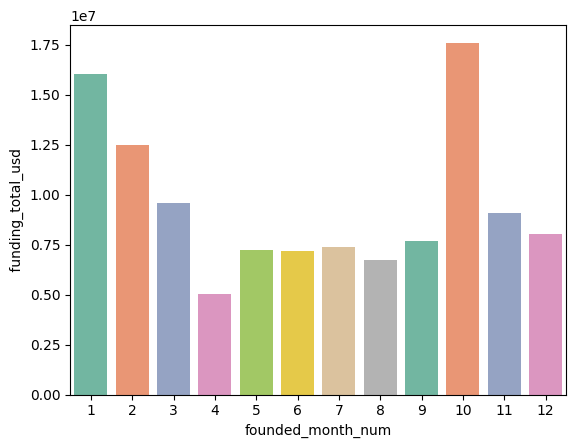

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({' funding_total_usd ':'mean'}).reset_index().sort_values(' funding_total_usd ',ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[' funding_total_usd '], x=df_plot['founded_month_num'],palette='Set2')

Insights: From the above plot it can be seen start ups founded in the  January and October months have attracted the largest amount of average fundings

<Axes: xlabel='founded_quarter_q', ylabel=' funding_total_usd '>

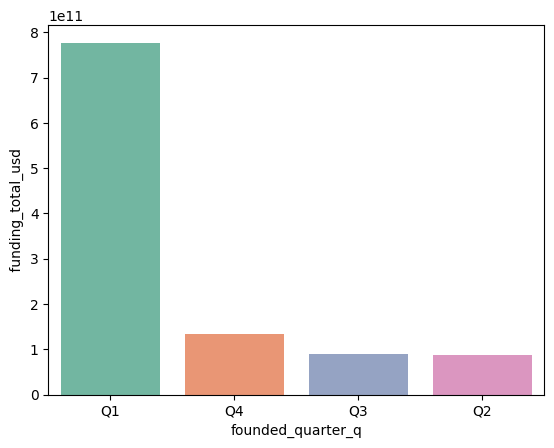

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({' funding_total_usd ':'sum'}).reset_index().sort_values(' funding_total_usd ',ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[' funding_total_usd '], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel=' funding_total_usd '>

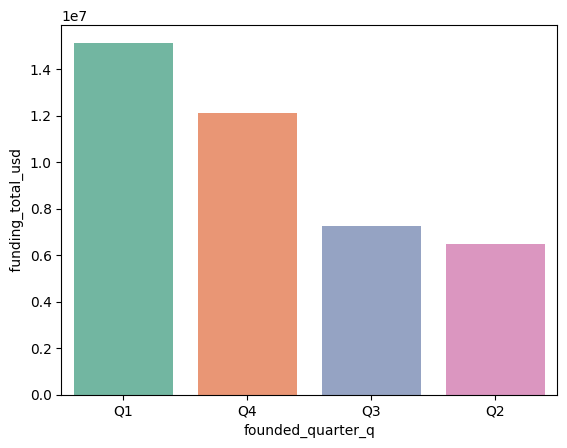

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({' funding_total_usd ':'mean'}).reset_index().sort_values(' funding_total_usd ',ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[' funding_total_usd '], x=df_plot['founded_quarter_q'],palette='Set2')

Insights: From both plots it is evident that startups founded in the first quarter have attracted the most amount of fundings

<Axes: xlabel='first_funding_at_year', ylabel=' funding_total_usd '>

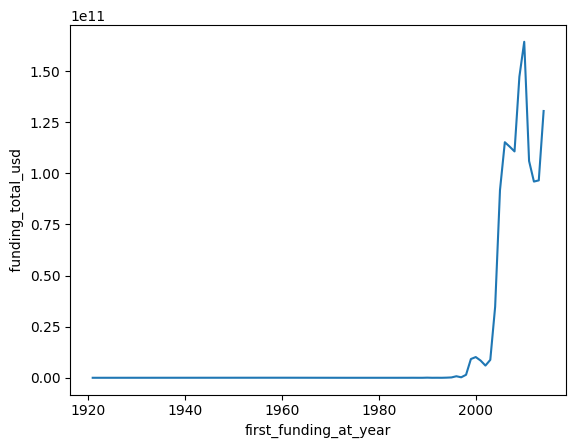

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({' funding_total_usd ':'sum'}).reset_index().sort_values(' funding_total_usd ',ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[' funding_total_usd '], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel=' funding_total_usd '>

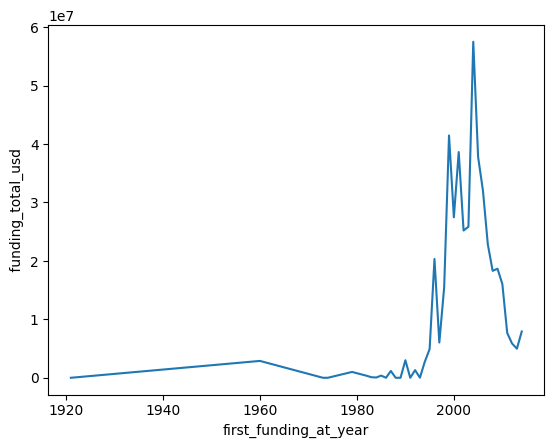

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({' funding_total_usd ':'mean'}).reset_index().sort_values(' funding_total_usd ',ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[' funding_total_usd '], x=df_plot['first_funding_at_year'])

Insights: It can be seen from both plots that alot of start ups recievd their fisrt fundings in the early 21st century indicating that 21st century being the age of start ups




<Axes: xlabel='last_funding_at_year', ylabel=' funding_total_usd '>

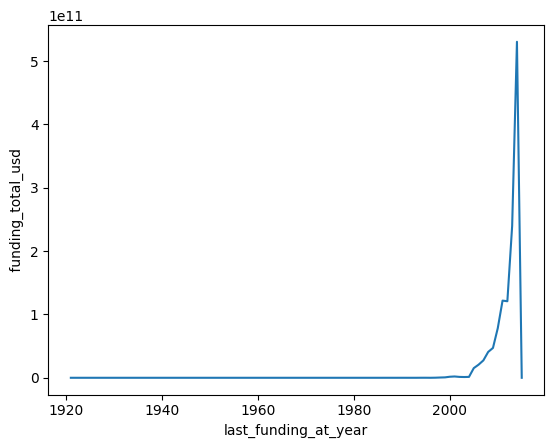

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({' funding_total_usd ':'sum'}).reset_index().sort_values(' funding_total_usd ',ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[' funding_total_usd '], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel=' funding_total_usd '>

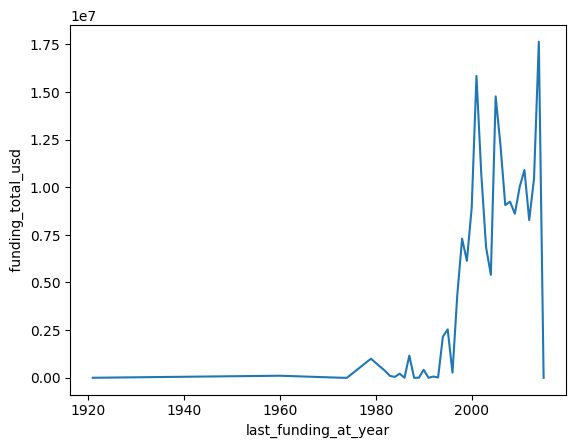

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({' funding_total_usd ':'mean'}).reset_index().sort_values(' funding_total_usd ',ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[' funding_total_usd '], x=df_plot['last_funding_at_year'])

Insights: It can be seen from both plots that alot of start ups recievd their last fundings in the early 21st century indicating that 21st century being the age of start ups and alot of start ups were formed and closed down during this time.

## Seed Funding
1. Seed funding is a way for startups to raise early capital to support their development.
2. It's usually the first round of institutional funding a startup receives, after getting funding from friends, family, angel investors, or an incubator.

Average and Total Analysis of the Seed Funds as shown below.

<Axes: xlabel='seed', ylabel='category_list'>

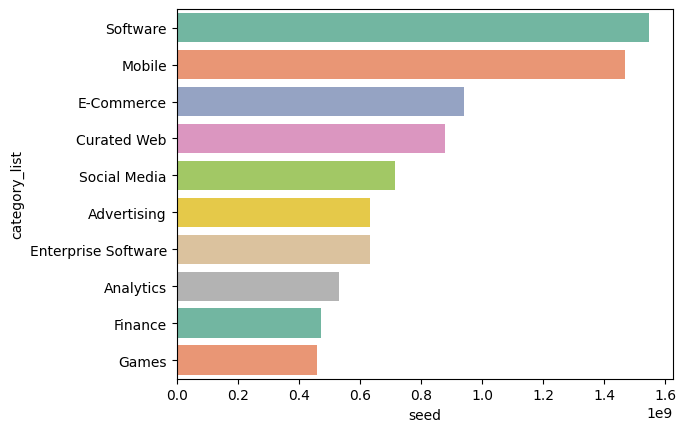

In [ ]:
df_plot = df_clean.groupby('category_list').agg({'seed':'sum'}).reset_index().sort_values('seed',ascending=False).head(10)
sns.barplot(x=df_plot['seed'], y=df_plot['category_list'],palette='Set2')

Insights: From the plot of top 10 categories Software have the largest number of total seed fundings.

<Axes: xlabel='seed', ylabel='category_list'>

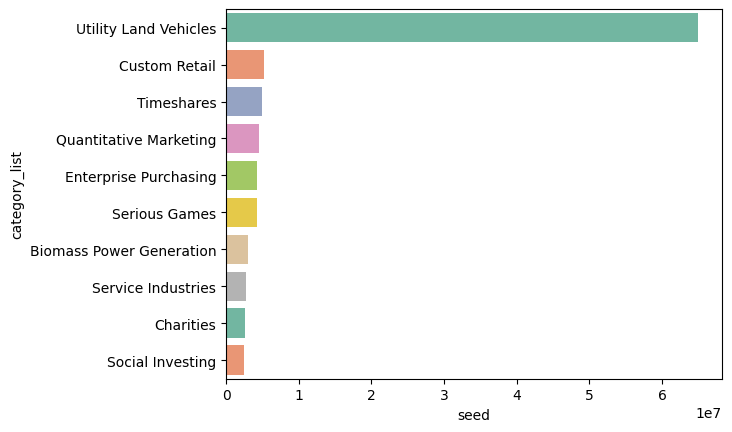

In [ ]:
df_plot = df_clean.groupby('category_list').agg({'seed':'mean'}).reset_index().sort_values('seed',ascending=False).head(10)
sns.barplot(x=df_plot['seed'], y=df_plot['category_list'],palette='Set2')

Insights: From the plot of top 10 categories Utility Land Vehicles have the largest number of avergae seed fundings.

<Axes: xlabel='seed', ylabel=' market '>

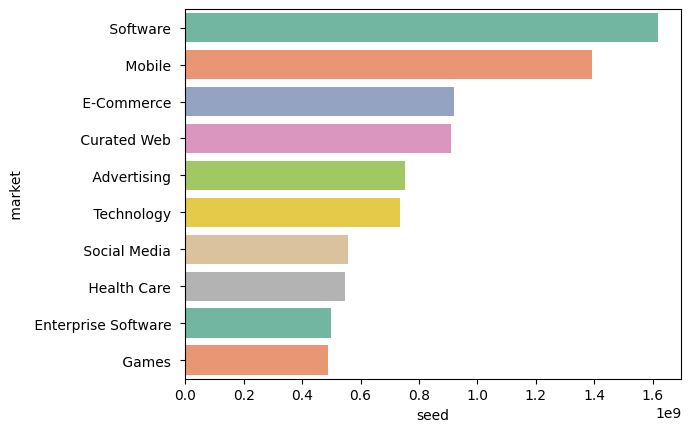

In [ ]:
df_plot = df_clean.groupby(' market ').agg({'seed':'sum'}).reset_index().sort_values('seed',ascending=False).head(10)
sns.barplot(x=df_plot['seed'], y=df_plot[' market '],palette='Set2')

Insights: From the plot of top 10 markets Software have the largest number of total seed fundings.

<Axes: xlabel='seed', ylabel=' market '>

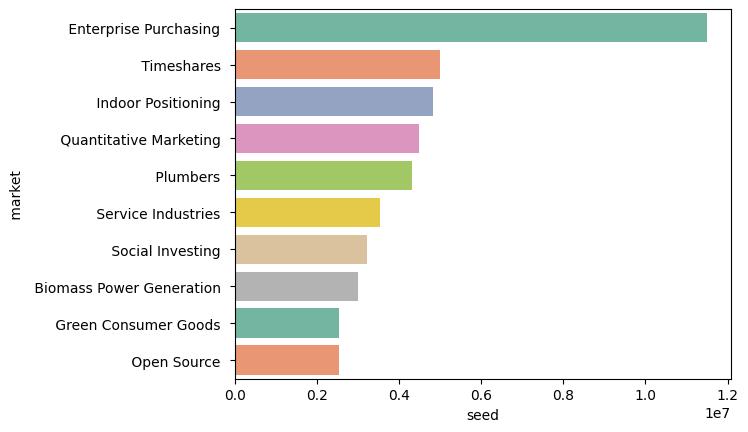

In [ ]:
df_plot = df_clean.groupby(' market ').agg({'seed':'mean'}).reset_index().sort_values('seed',ascending=False).head(10)
sns.barplot(x=df_plot['seed'], y=df_plot[' market '],palette='Set2')

Insights: From the plot of top 10 markets Enterprise Purchasing have the largest number of avergae seed fundings.

<Axes: xlabel='seed', ylabel='status'>

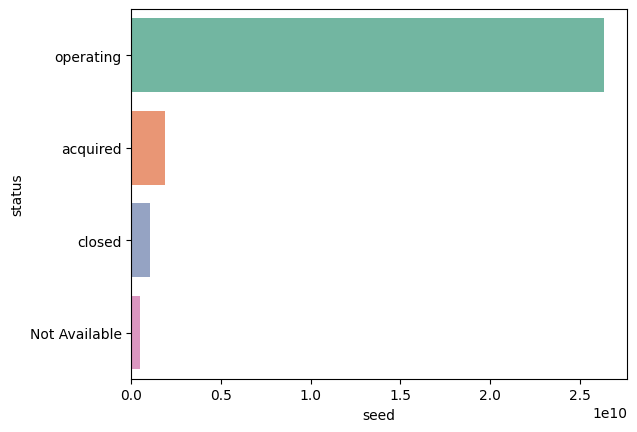

In [ ]:
df_plot = df_clean.groupby('status').agg({'seed':'sum'}).reset_index().sort_values('seed',ascending=False).head(10)
sns.barplot(x=df_plot['seed'], y=df_plot['status'],palette='Set2')

Insights: Startups that have an operating status have the largest amount of total seed fundings.

<Axes: xlabel='seed', ylabel='status'>

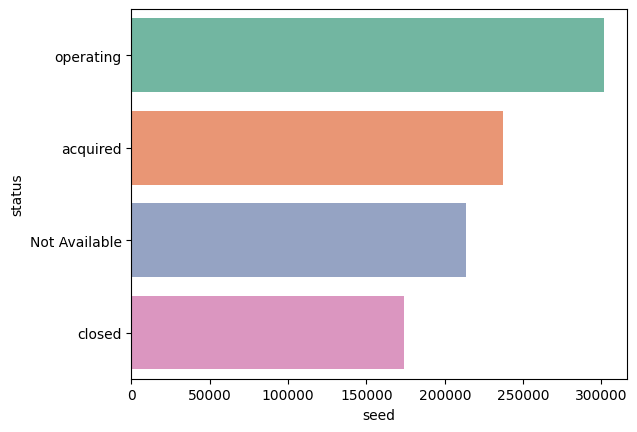

In [ ]:
df_plot = df_clean.groupby('status').agg({'seed':'mean'}).reset_index().sort_values('seed',ascending=False).head(10)
sns.barplot(x=df_plot['seed'], y=df_plot['status'],palette='Set2')

Insights: Startups that have an operating status have the largest amount of average seed fundings.

<Axes: xlabel='seed', ylabel='country_code'>

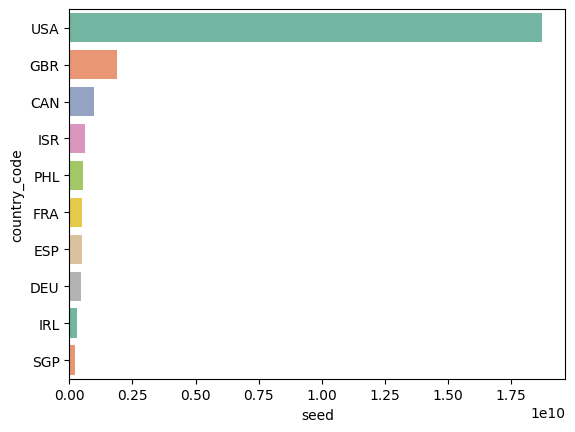

In [ ]:
df_plot = df_clean.groupby('country_code').agg({'seed':'sum'}).reset_index().sort_values('seed',ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot['seed'], y=df_plot['country_code'],palette='Set2')

Insights: From the plot of top 10 countires USA have the largest number of total seed fundings.

<Axes: xlabel='seed', ylabel='country_code'>

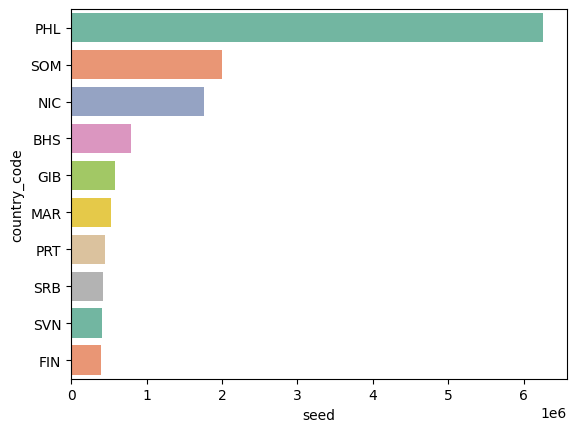

In [ ]:
df_plot = df_clean.groupby('country_code').agg({'seed':'mean'}).reset_index().sort_values('seed',ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot['seed'], y=df_plot['country_code'],palette='Set2')

Insights: From the plot of top 10 countries Philippines have the largest number of avergae seed fundings.

<Axes: xlabel='seed', ylabel='state_code'>

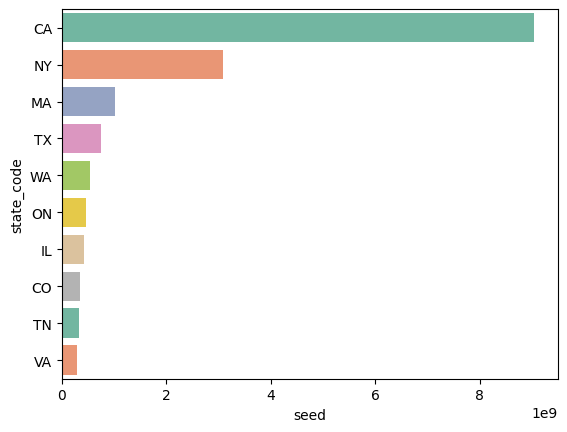

In [ ]:
df_plot = df_clean.groupby('state_code').agg({'seed':'sum'}).reset_index().sort_values('seed',ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot['seed'], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 states California have the largest number of total seed fundings.

<Axes: xlabel='seed', ylabel='state_code'>

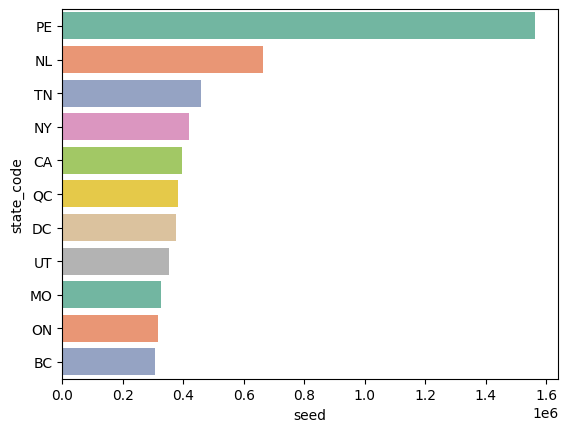

In [ ]:
df_plot = df_clean.groupby('state_code').agg({'seed':'mean'}).reset_index().sort_values('seed',ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot['seed'], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 states Prince Edward Island have the largest number of avergae seed fundings.

<Axes: xlabel='seed', ylabel='region'>

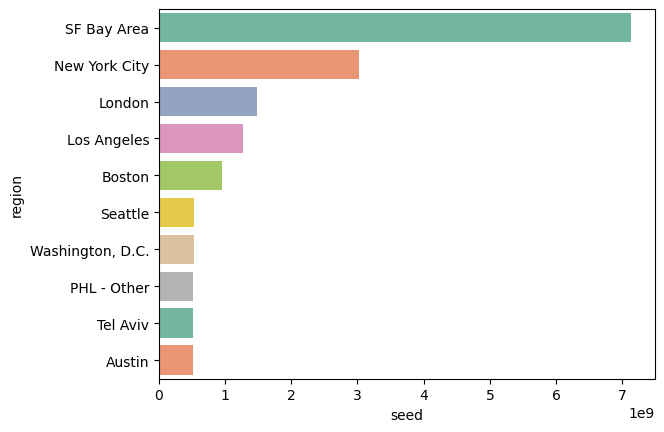

In [ ]:
df_plot = df_clean.groupby('region').agg({'seed':'sum'}).reset_index().sort_values('seed',ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot['seed'], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 cities SF Bay Area have the largest number of total seed fundings.

<Axes: xlabel='seed', ylabel='region'>

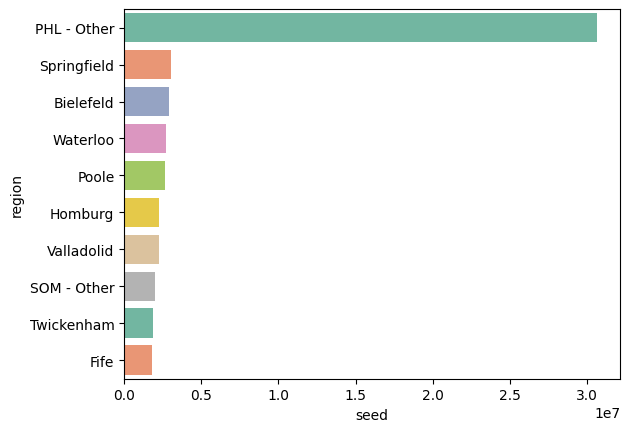

In [ ]:
df_plot = df_clean.groupby('region').agg({'seed':'mean'}).reset_index().sort_values('seed',ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot['seed'], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 cities PHL-Other have the largest number of avergae seed fundings.

<Axes: xlabel='founded_year', ylabel='seed'>

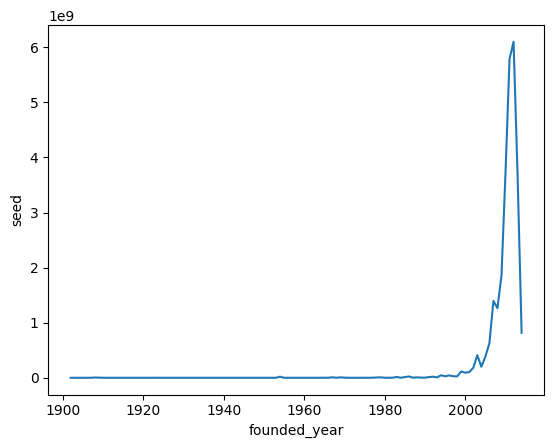

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({'seed':'sum'}).reset_index().sort_values('seed',ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot['seed'], x=df_plot['founded_year'])

Insights: From the above trend it can be seen that startups found in the 21st century recieved the largets amount of seed fundings.

<Axes: xlabel='founded_year', ylabel='seed'>

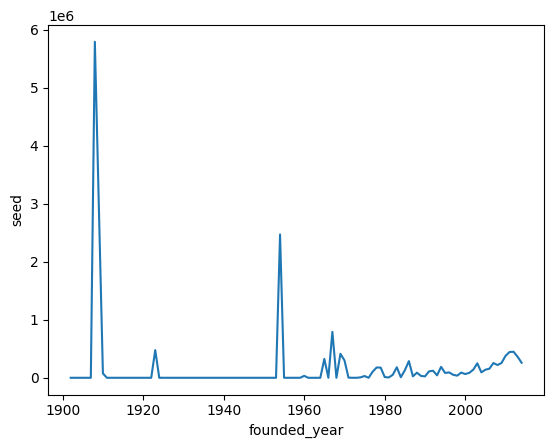

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({'seed':'mean'}).reset_index().sort_values('seed',ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot['seed'], x=df_plot['founded_year'])

Insights: The average plot indicates that large number of startups were found in the 21st century while over the years from 1900 quite alot of start ups have attracted good amount of seed fundings where the year 1910 has seen the highest spike

<Axes: xlabel='founded_month_num', ylabel='seed'>

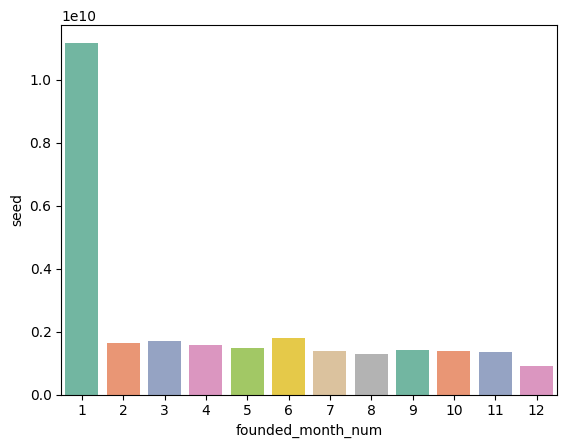

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({'seed':'sum'}).reset_index().sort_values('seed',ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot['seed'], x=df_plot['founded_month_num'],palette='Set2')

Insights: From the above plot it can be seen that start ups founded in the month of January have attracted the most amount of seed fundings

<Axes: xlabel='founded_month_num', ylabel='seed'>

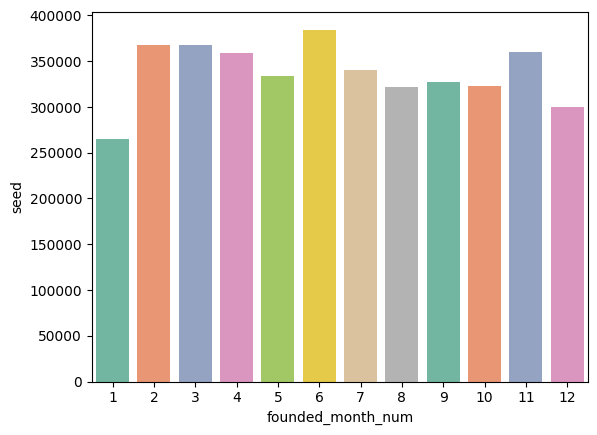

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({'seed':'mean'}).reset_index().sort_values('seed',ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot['seed'], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='seed'>

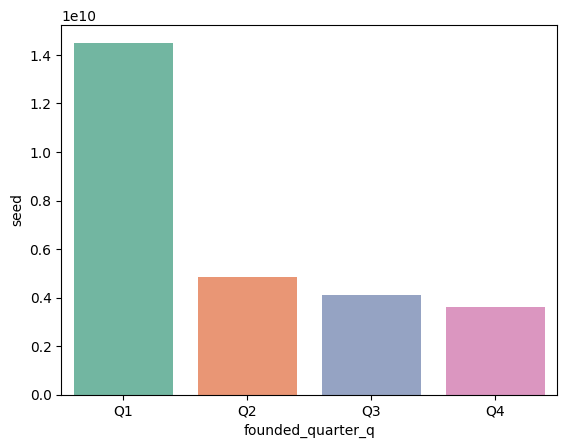

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({'seed':'sum'}).reset_index().sort_values('seed',ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot['seed'], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='seed'>

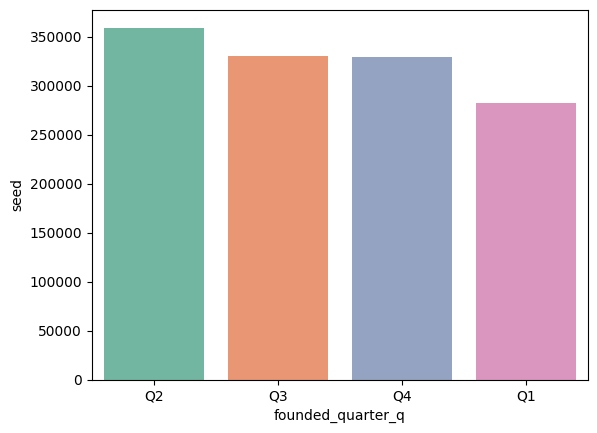

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({'seed':'mean'}).reset_index().sort_values('seed',ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot['seed'], x=df_plot['founded_quarter_q'],palette='Set2')

Insights: From both plots it is evident that startups founded in the first quarter have attracted the most amount of seed fundings

<Axes: xlabel='first_funding_at_year', ylabel='seed'>

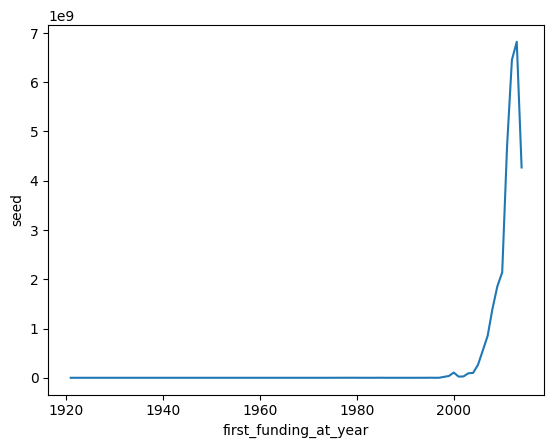

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({'seed':'sum'}).reset_index().sort_values('seed',ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot['seed'], x=df_plot['first_funding_at_year'])


Insights: It can be seen from the plot that alot of start ups that recievd their fisrt fundings in the early 21st century attracted large amount of seed fundings

<Axes: xlabel='first_funding_at_year', ylabel='seed'>

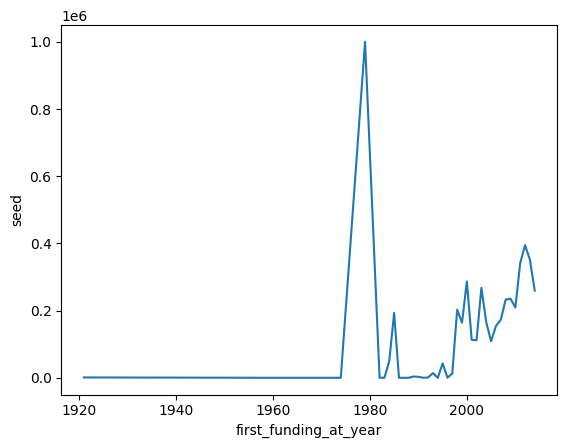

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({'seed':'mean'}).reset_index().sort_values('seed',ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot['seed'], x=df_plot['first_funding_at_year'])

Insights: It can be seen from the plots that alot of start ups recievd their fisrt fundings in the early 21st century attracted a large amount of seed funding and a spike in 1980 indicating a large seed funding during that year.

<Axes: xlabel='last_funding_at_year', ylabel='seed'>

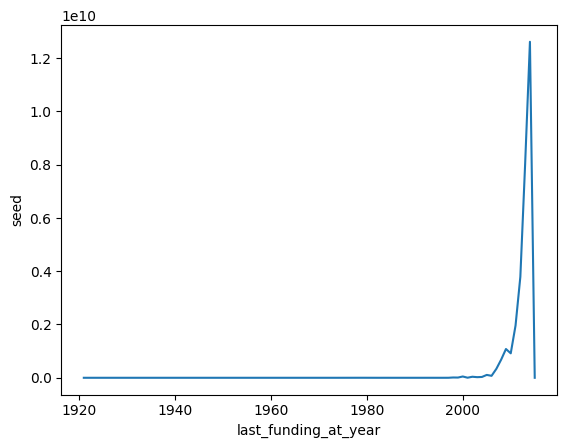

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({'seed':'sum'}).reset_index().sort_values('seed',ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot['seed'], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='seed'>

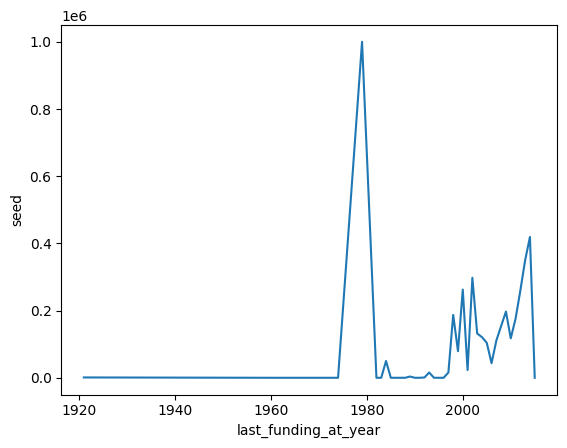

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({'seed':'mean'}).reset_index().sort_values('seed',ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot['seed'], x=df_plot['last_funding_at_year'])

Insights: It can be seen from the plots that alot of start ups that recievd their last fundings in the early 21st century attracted a large amount of seed funding and a spike in 1980 indicating a large seed funding during that year.

## Venture Funding

Venture funding, also known as venture capital (VC), is a type of investment that provides capital to startups and small- to medium-sized businesses in exchange for an ownership stake in the company.


Average and Total Analysis of the Venture Funds as shown below.

<Axes: xlabel='venture', ylabel='category_list'>

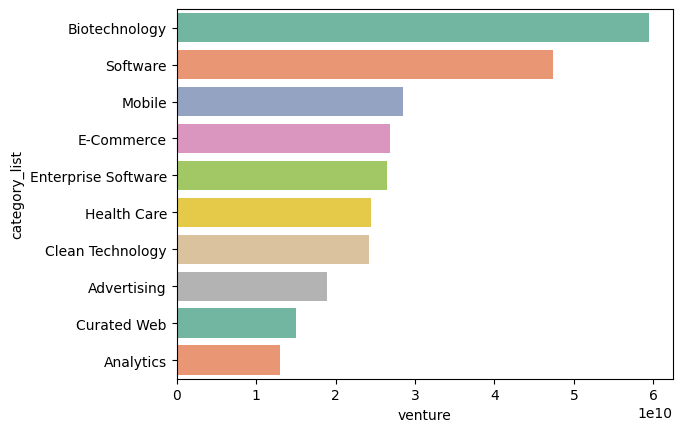

In [ ]:
df_plot = df_clean.groupby('category_list').agg({'venture':'sum'}).reset_index().sort_values('venture',ascending=False).head(10)
sns.barplot(x=df_plot['venture'], y=df_plot['category_list'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of total venture fundings.

<Axes: xlabel='venture', ylabel='category_list'>

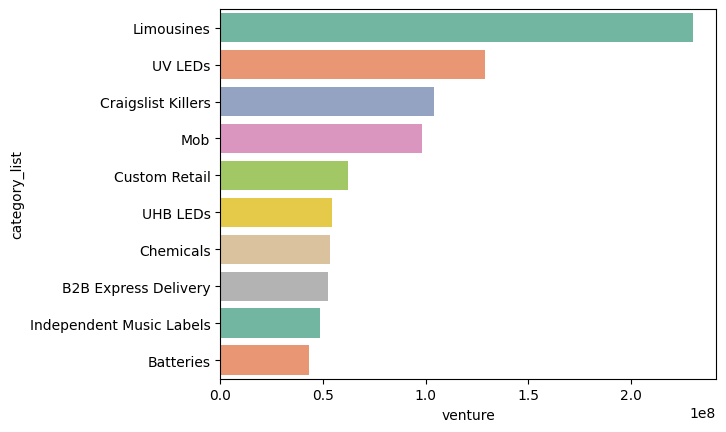

In [ ]:
df_plot = df_clean.groupby('category_list').agg({'venture':'mean'}).reset_index().sort_values('venture',ascending=False).head(10)
sns.barplot(x=df_plot['venture'], y=df_plot['category_list'],palette='Set2')

Insights: From the plot of top 10 categories Limousines have the largest number of avergae venturefundings.

<Axes: xlabel='venture', ylabel=' market '>

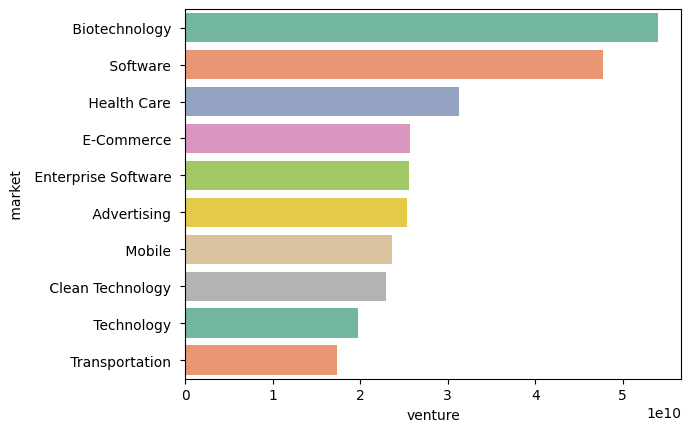

In [ ]:
df_plot = df_clean.groupby(' market ').agg({'venture':'sum'}).reset_index().sort_values('venture',ascending=False).head(10)
sns.barplot(x=df_plot['venture'], y=df_plot[' market '],palette='Set2')

Insights: From the plot of top 10 markets Biotechnology have the largest number of total venture fundings.

<Axes: xlabel='venture', ylabel=' market '>

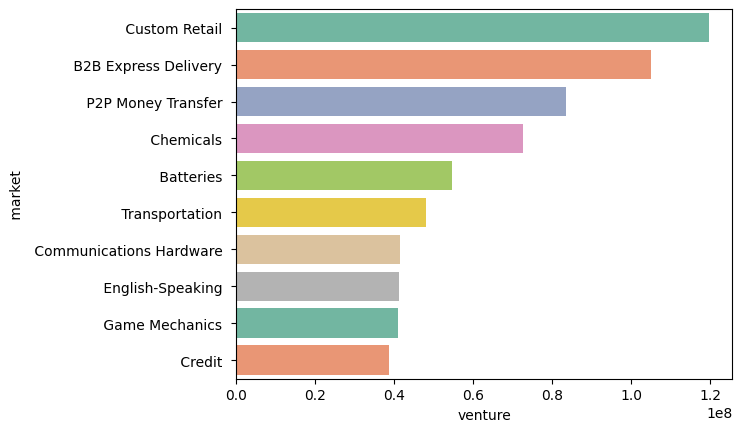

In [ ]:
df_plot = df_clean.groupby(' market ').agg({'venture':'mean'}).reset_index().sort_values('venture',ascending=False).head(10)
sns.barplot(x=df_plot['venture'], y=df_plot[' market '],palette='Set2')

Insights: From the plot of top 10 markets Custom Retail have the largest number of avergae venture fundings.

<Axes: xlabel='venture', ylabel='status'>

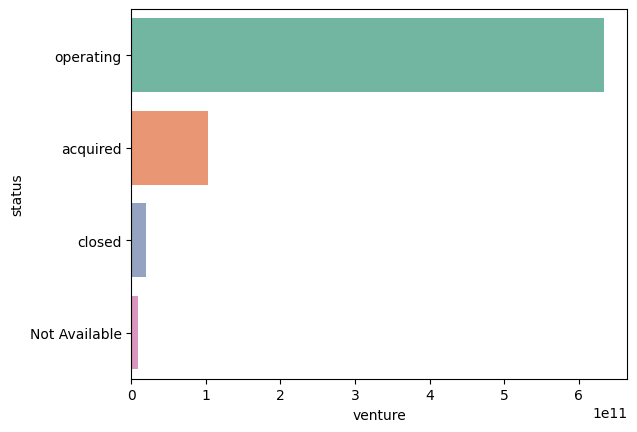

In [ ]:
df_plot = df_clean.groupby('status').agg({'venture':'sum'}).reset_index().sort_values('venture',ascending=False).head(10)
sns.barplot(x=df_plot['venture'], y=df_plot['status'],palette='Set2')

Insights: Startups that have an operating status have the largest amount of total venture fundings.

<Axes: xlabel='venture', ylabel='status'>

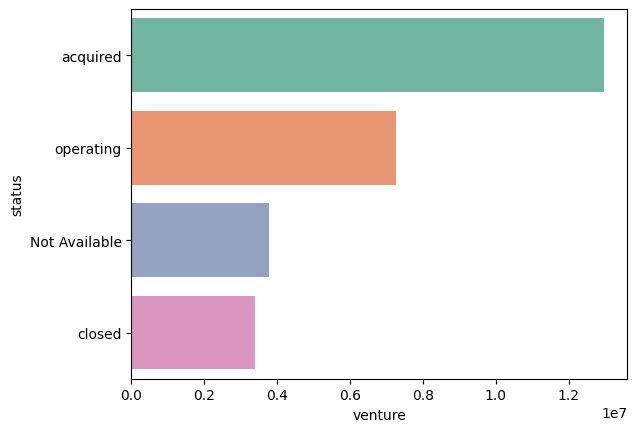

In [ ]:
df_plot = df_clean.groupby('status').agg({'venture':'mean'}).reset_index().sort_values('venture',ascending=False).head(10)
sns.barplot(x=df_plot['venture'], y=df_plot['status'],palette='Set2')

Insights: Startups that have an acquired status have the largest amount of average venture fundings.

<Axes: xlabel='venture', ylabel='country_code'>

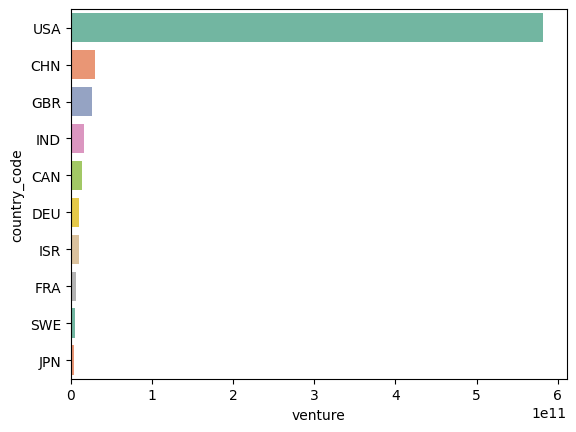

In [ ]:
df_plot = df_clean.groupby('country_code').agg({'venture':'sum'}).reset_index().sort_values('venture',ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot['venture'], y=df_plot['country_code'],palette='Set2')

Insights: From the plot of top 10 countries USA have the largest number of total venture fundings.

<Axes: xlabel='venture', ylabel='country_code'>

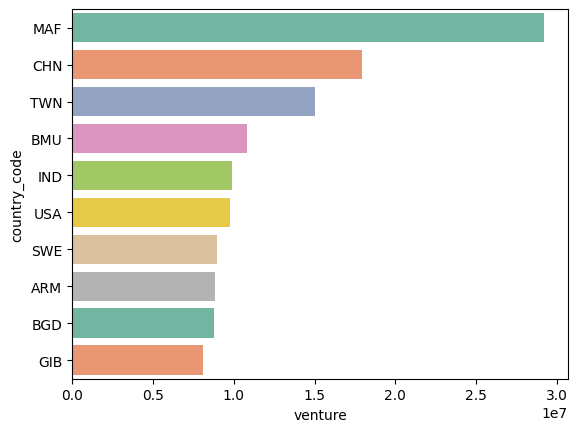

In [ ]:
df_plot = df_clean.groupby('country_code').agg({'venture':'mean'}).reset_index().sort_values('venture',ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot['venture'], y=df_plot['country_code'],palette='Set2')

Insights: From the plot of top 10 countires Saint Martin have the largest number of avergae venture fundings.

<Axes: xlabel='venture', ylabel='state_code'>

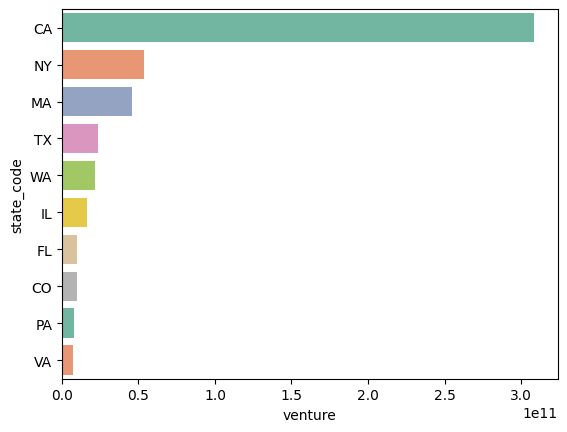

In [ ]:
df_plot = df_clean.groupby('state_code').agg({'venture':'sum'}).reset_index().sort_values('venture',ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot['venture'], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 states California have the largest number of total fundings.

<Axes: xlabel='venture', ylabel='state_code'>

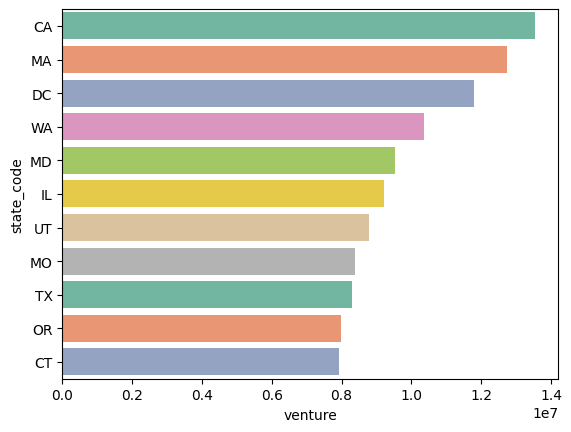

In [ ]:
df_plot = df_clean.groupby('state_code').agg({'venture':'mean'}).reset_index().sort_values('venture',ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot['venture'], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 states California have the largest number of avergae venture fundings.


<Axes: xlabel='venture', ylabel='region'>

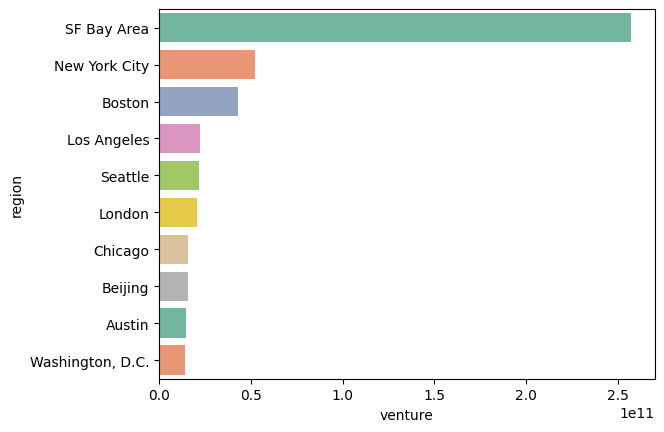

In [ ]:
df_plot = df_clean.groupby('region').agg({'venture':'sum'}).reset_index().sort_values('venture',ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot['venture'], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 cities SF Bay Area have the largest number of total venture fundings.

<Axes: xlabel='venture', ylabel='region'>

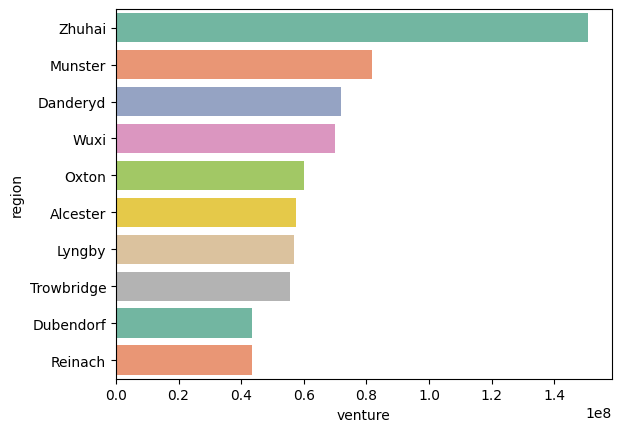

In [ ]:
df_plot = df_clean.groupby('region').agg({'venture':'mean'}).reset_index().sort_values('venture',ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot['venture'], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 cities Zhuhai have the largest number of avergae venture fundings.

<Axes: xlabel='founded_year', ylabel='venture'>

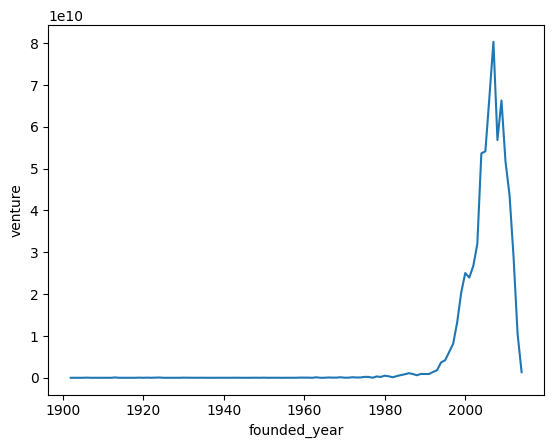

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({'venture':'sum'}).reset_index().sort_values('venture',ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot['venture'], x=df_plot['founded_year'])

Insights: From the above trend it can be seen that startups found from 1980s recieved the largets amount of venture fundings.

<Axes: xlabel='founded_year', ylabel='venture'>

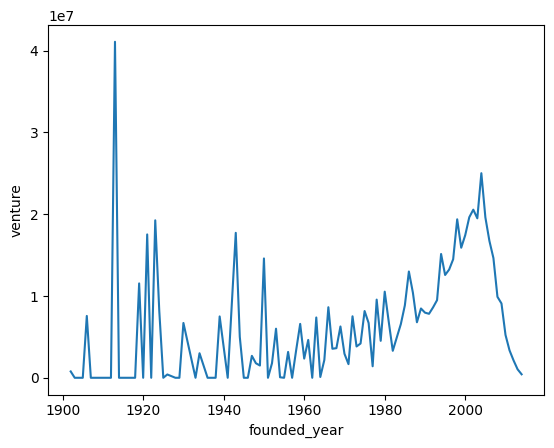

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({'venture':'mean'}).reset_index().sort_values('venture',ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot['venture'], x=df_plot['founded_year'])

Insights: The average plot indicates that large number of startups were found in the 21st century while over the years from 1900 quite alot of start ups have attracted good amount of venture fundings where the year 1910 has seen the highest spike


<Axes: xlabel='founded_month_num', ylabel='venture'>

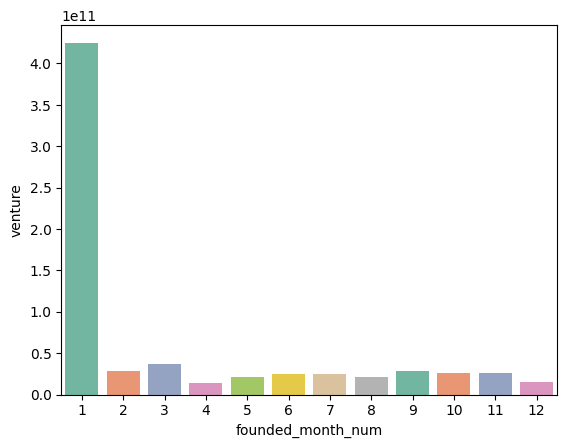

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({'venture':'sum'}).reset_index().sort_values('venture',ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot['venture'], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='venture'>

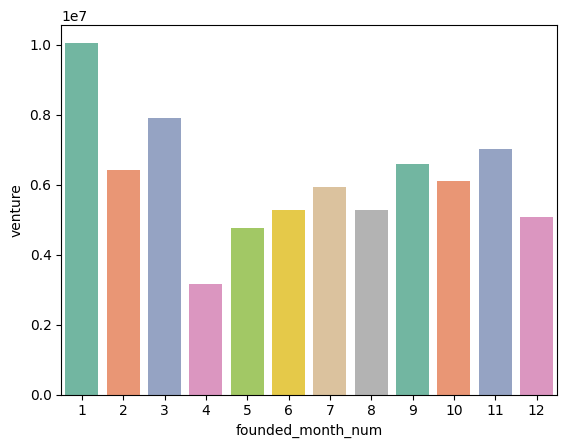

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({'venture':'mean'}).reset_index().sort_values('venture',ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot['venture'], x=df_plot['founded_month_num'],palette='Set2')

Insights: From the above plot it can be seen that start ups founded in
the month of January have attracted the most amount of venture fundings

<Axes: xlabel='founded_quarter_q', ylabel='venture'>

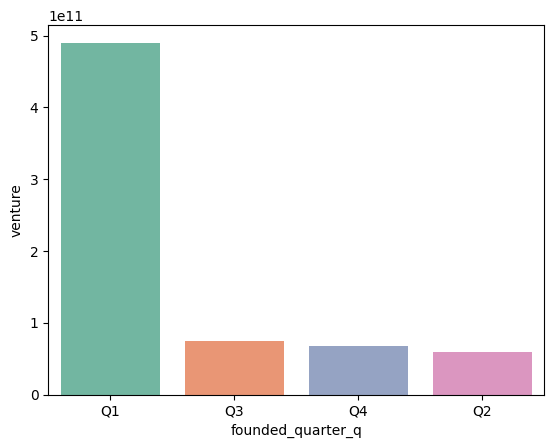

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({'venture':'sum'}).reset_index().sort_values('venture',ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot['venture'], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='venture'>

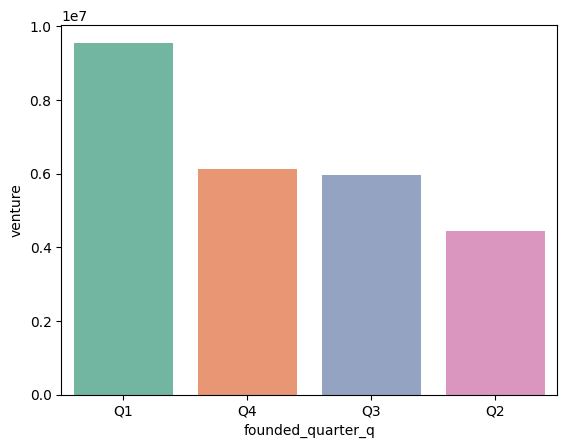

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({'venture':'mean'}).reset_index().sort_values('venture',ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot['venture'], x=df_plot['founded_quarter_q'],palette='Set2')

Insights: From both plots it is evident that startups founded in the first quarter have attracted the most amount of venture fundings

<Axes: xlabel='first_funding_at_year', ylabel='venture'>

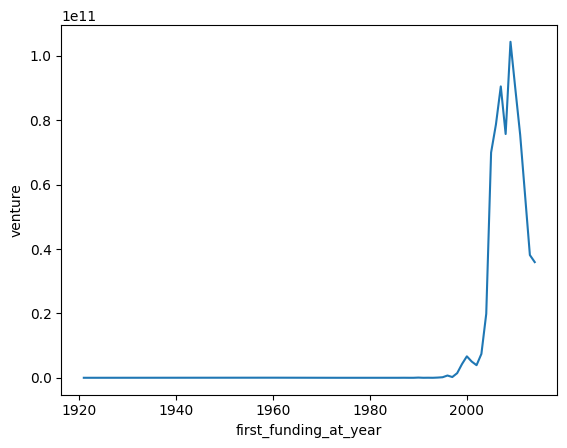

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({'venture':'sum'}).reset_index().sort_values('venture',ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot['venture'], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='venture'>

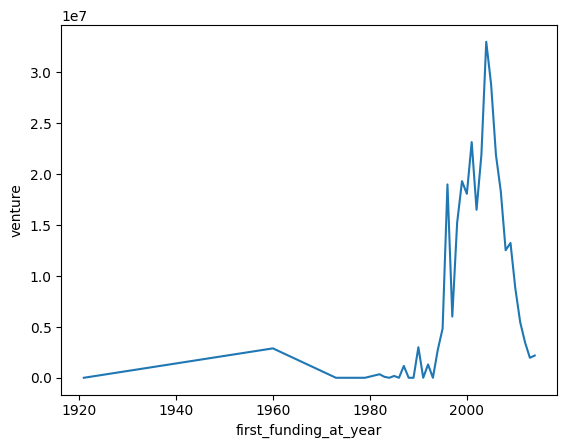

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({'venture':'mean'}).reset_index().sort_values('venture',ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot['venture'], x=df_plot['first_funding_at_year'])

Insights: From the above trend it can be seen that startups found in the 21st century recieved the largets amount of venture fundings.

<Axes: xlabel='last_funding_at_year', ylabel='venture'>

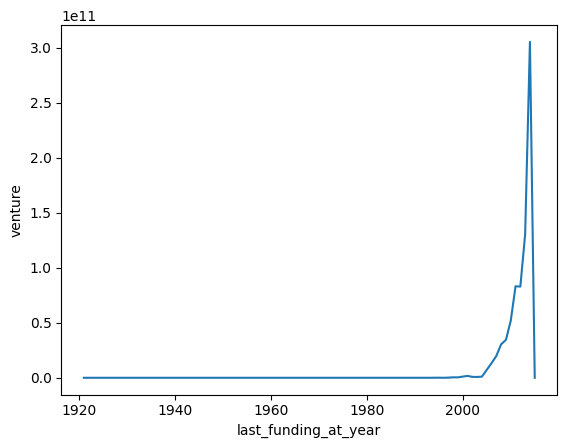

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({'venture':'sum'}).reset_index().sort_values('venture',ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot['venture'], x=df_plot['last_funding_at_year'])

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='last_funding_at_year', ylabel='venture'>

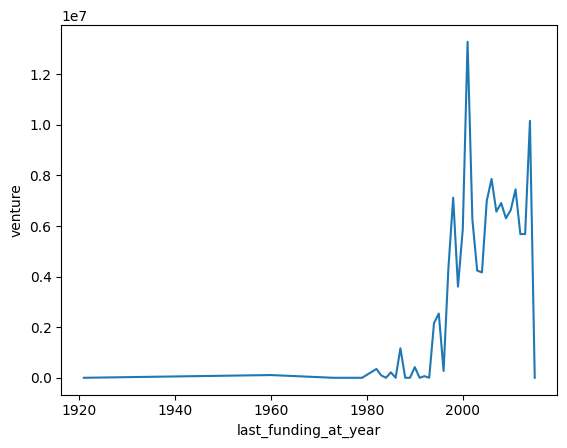

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({'venture':'mean'}).reset_index().sort_values('venture',ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot['venture'], x=df_plot['last_funding_at_year'])

Insights: It can be seen from the plots that alot of start ups that recievd their last fundings in the early 21st century attracted a large amount of venture fundings.

## Equity Crowd Funding

1. Equity crowdfunding is a method of raising capital used by startups and early-stage companies.
2. Essentially, equity crowdfunding offers the company’s securities to a number of potential investors in exchange for financing.
3. Each investor is entitled to a stake in the company proportional to their investment.


Average and Total Analysis of the Equity Crowd Funded Funds as shown below.

<Axes: xlabel='equity_crowdfunding', ylabel='category_list'>

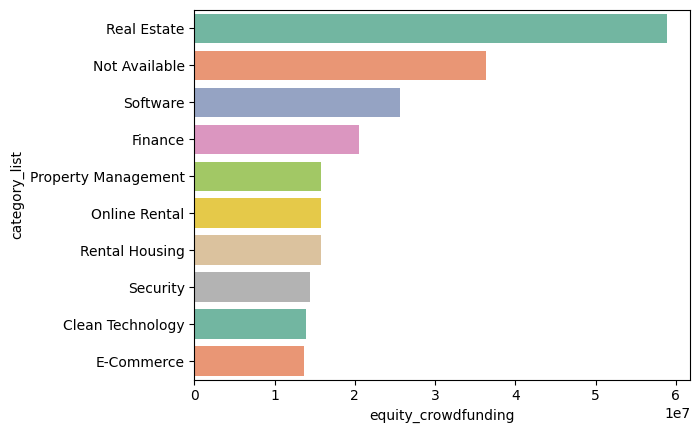

In [ ]:
df_plot = df_clean.groupby('category_list').agg({'equity_crowdfunding':'sum'}).reset_index().sort_values('equity_crowdfunding',ascending=False).head(10)
sns.barplot(x=df_plot['equity_crowdfunding'], y=df_plot['category_list'],palette='Set2')

Insights: From the plot of top 10 categories Real Estate have the largest number of total crowd fundings.

<Axes: xlabel='equity_crowdfunding', ylabel='category_list'>

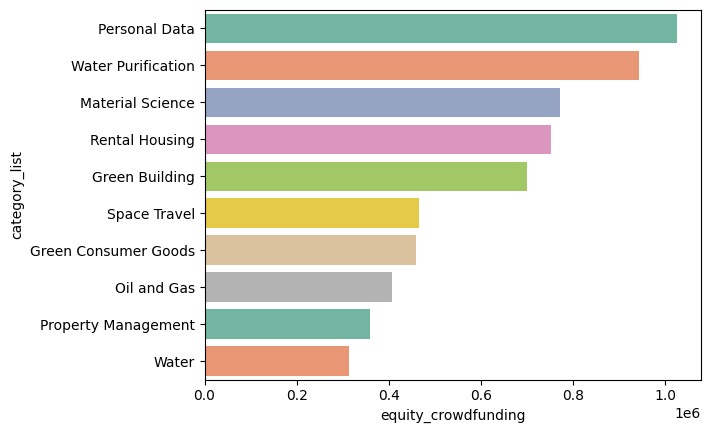

In [ ]:
df_plot = df_clean.groupby('category_list').agg({'equity_crowdfunding':'mean'}).reset_index().sort_values('equity_crowdfunding',ascending=False).head(10)
sns.barplot(x=df_plot['equity_crowdfunding'], y=df_plot['category_list'],palette='Set2')

Insights: From the plot of top 10 categories Personal Data  have the largest number of avergae crowd fundings.

<Axes: xlabel='equity_crowdfunding', ylabel=' market '>

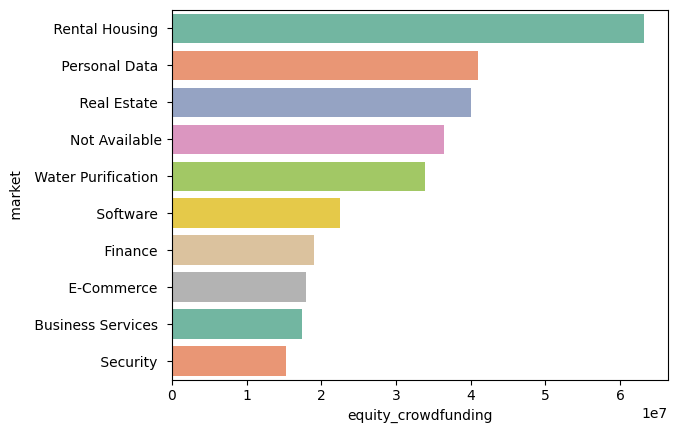

In [ ]:
df_plot = df_clean.groupby(' market ').agg({'equity_crowdfunding':'sum'}).reset_index().sort_values('equity_crowdfunding',ascending=False).head(10)
sns.barplot(x=df_plot['equity_crowdfunding'], y=df_plot[' market '],palette='Set2')

Insights: From the plot of top 10 markets Rental Housing have the largest number of total crowd fundings.

<Axes: xlabel='equity_crowdfunding', ylabel=' market '>

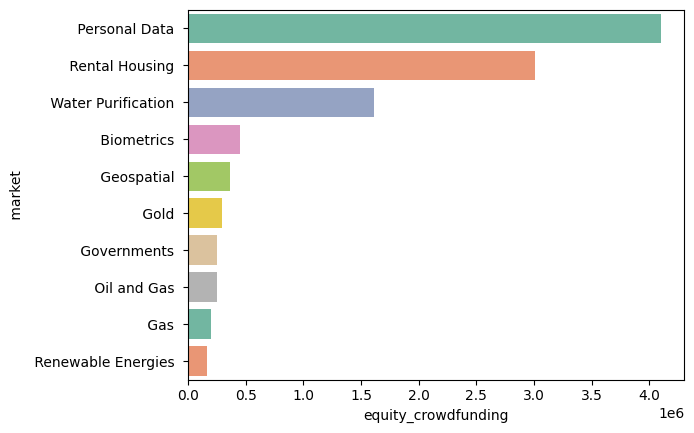

In [ ]:
df_plot = df_clean.groupby(' market ').agg({'equity_crowdfunding':'mean'}).reset_index().sort_values('equity_crowdfunding',ascending=False).head(10)
sns.barplot(x=df_plot['equity_crowdfunding'], y=df_plot[' market '],palette='Set2')

Insights: From the plot of top 10 categories Personal Data have the largest number of average crowd fundings.

<Axes: xlabel='equity_crowdfunding', ylabel='status'>

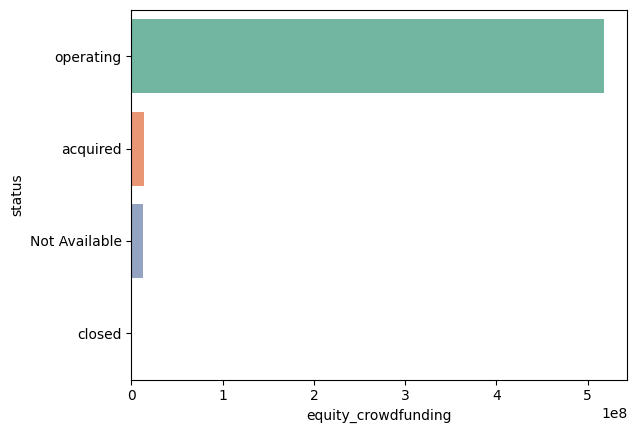

In [ ]:
df_plot = df_clean.groupby('status').agg({'equity_crowdfunding':'sum'}).reset_index().sort_values('equity_crowdfunding',ascending=False).head(10)
sns.barplot(x=df_plot['equity_crowdfunding'], y=df_plot['status'],palette='Set2')

Insights: Startups that have an operating status have the largest amount of total crowd fundings.

<Axes: xlabel='equity_crowdfunding', ylabel='status'>

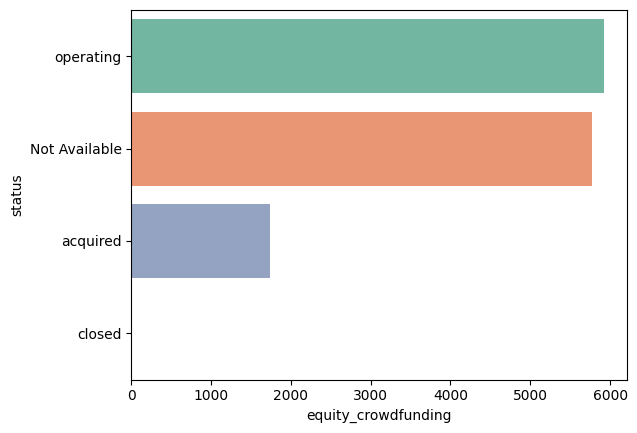

In [ ]:
df_plot = df_clean.groupby('status').agg({'equity_crowdfunding':'mean'}).reset_index().sort_values('equity_crowdfunding',ascending=False).head(10)
sns.barplot(x=df_plot['equity_crowdfunding'], y=df_plot['status'],palette='Set2')

Insights: Startups that have an operating status have the largest amount of average crowd fundings.

<Axes: xlabel='equity_crowdfunding', ylabel='country_code'>

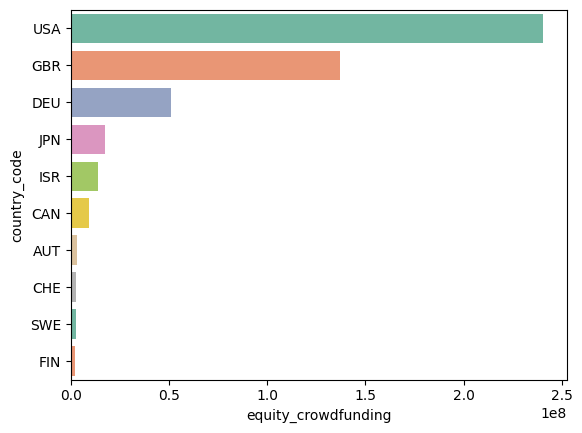

In [ ]:
df_plot = df_clean.groupby('country_code').agg({'equity_crowdfunding':'sum'}).reset_index().sort_values('equity_crowdfunding',ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot['equity_crowdfunding'], y=df_plot['country_code'],palette='Set2')

Insights: From the plot of top 10 countires USA have the largest number of total crowd fundings.

<Axes: xlabel='equity_crowdfunding', ylabel='country_code'>

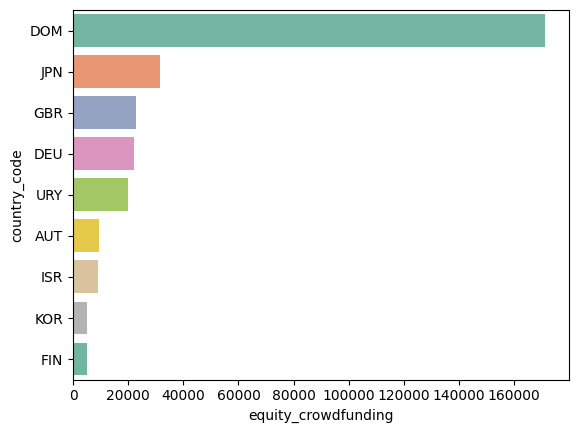

In [ ]:
df_plot = df_clean.groupby('country_code').agg({'equity_crowdfunding':'mean'}).reset_index().sort_values('equity_crowdfunding',ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot['equity_crowdfunding'], y=df_plot['country_code'],palette='Set2')

Insights: From the plot of top 10 categories Dominican Republic have the largest number of avergae crowd fundings.

<Axes: xlabel='equity_crowdfunding', ylabel='state_code'>

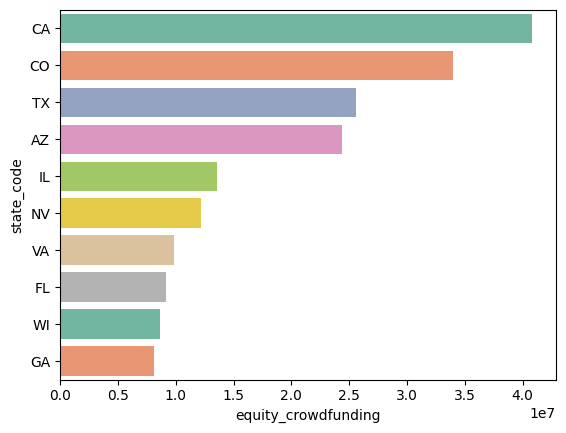

In [ ]:
df_plot = df_clean.groupby('state_code').agg({'equity_crowdfunding':'sum'}).reset_index().sort_values('equity_crowdfunding',ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot['equity_crowdfunding'], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 states Californina have the largest number of total crowd fundings.

<Axes: xlabel='equity_crowdfunding', ylabel='state_code'>

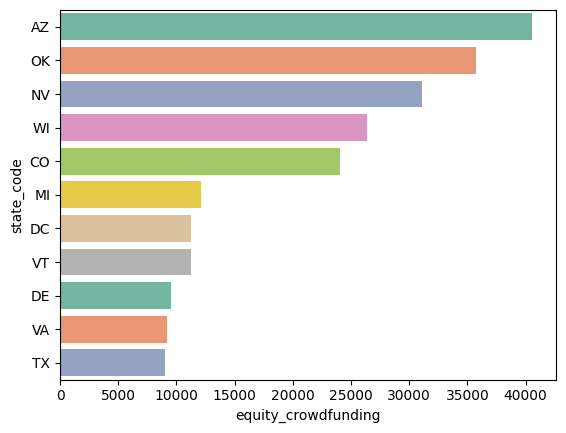

In [ ]:
df_plot = df_clean.groupby('state_code').agg({'equity_crowdfunding':'mean'}).reset_index().sort_values('equity_crowdfunding',ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot['equity_crowdfunding'], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 states Arizona have the largest number of avergae crowd fundings.



<Axes: xlabel='equity_crowdfunding', ylabel='region'>

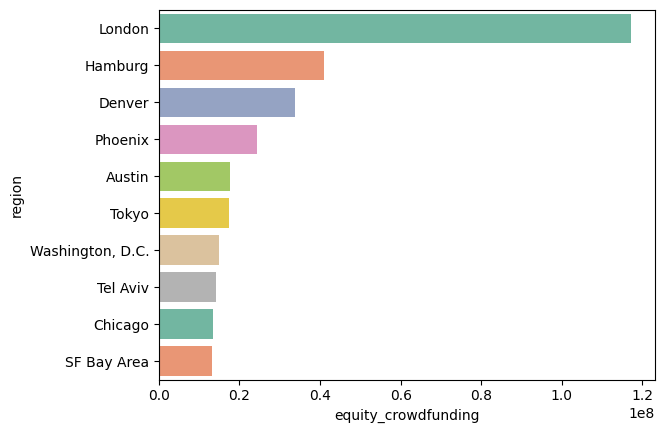

In [ ]:
df_plot = df_clean.groupby('region').agg({'equity_crowdfunding':'sum'}).reset_index().sort_values('equity_crowdfunding',ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot['equity_crowdfunding'], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 cities London have the largest number of total crowd fundings.

<Axes: xlabel='equity_crowdfunding', ylabel='region'>

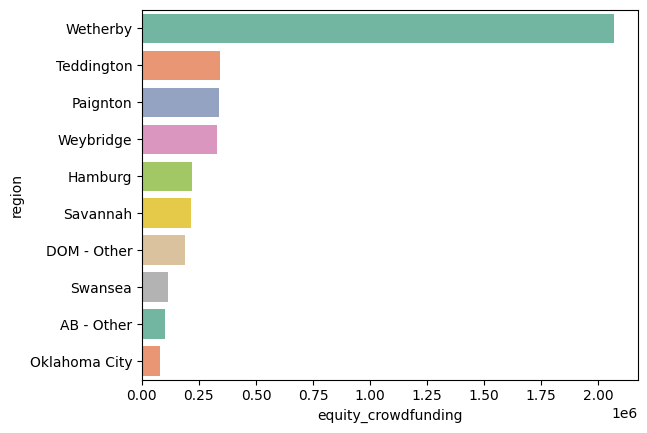

In [ ]:
df_plot = df_clean.groupby('region').agg({'equity_crowdfunding':'mean'}).reset_index().sort_values('equity_crowdfunding',ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot['equity_crowdfunding'], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 cities Wetherby have the largest number of avergae crowd fundings.

<Axes: xlabel='founded_year', ylabel='equity_crowdfunding'>

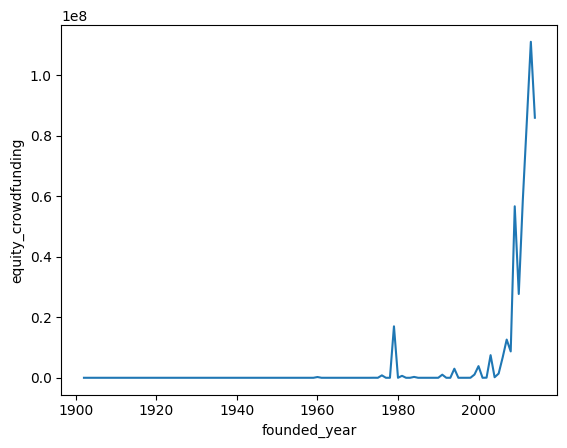

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({'equity_crowdfunding':'sum'}).reset_index().sort_values('equity_crowdfunding',ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot['equity_crowdfunding'], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='equity_crowdfunding'>

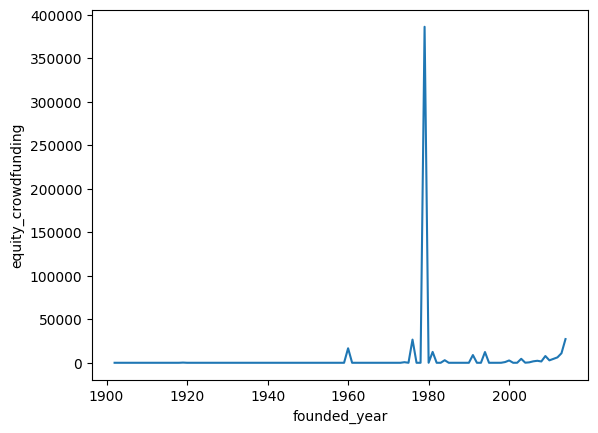

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({'equity_crowdfunding':'mean'}).reset_index().sort_values('equity_crowdfunding',ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot['equity_crowdfunding'], x=df_plot['founded_year'])

Insights: From the above trend it can be seen that startups found in the 21st century recieved the largets amount of crowd fundings where the highest spike witnessed was in the year 1980

<Axes: xlabel='founded_month_num', ylabel='equity_crowdfunding'>

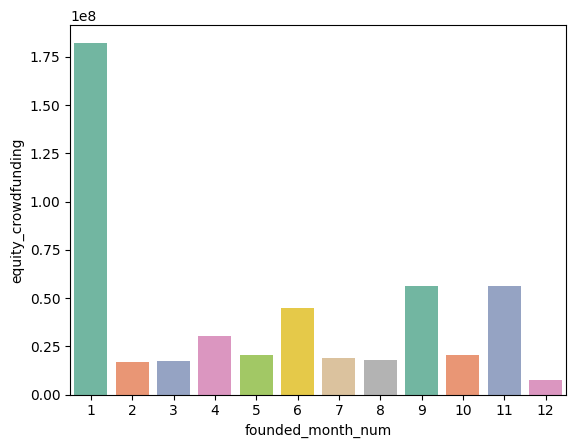

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({'equity_crowdfunding':'sum'}).reset_index().sort_values('equity_crowdfunding',ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot['equity_crowdfunding'], x=df_plot['founded_month_num'],palette='Set2')

Insights: From the above plot it can be seen that start ups founded in the month of January have attracted the most amount of crowd fundings

<Axes: xlabel='founded_month_num', ylabel='equity_crowdfunding'>

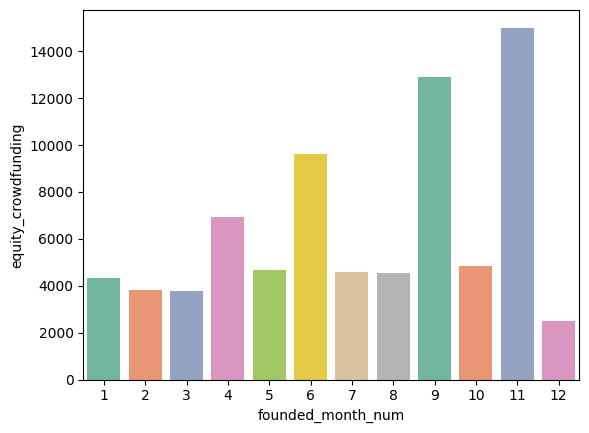

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({'equity_crowdfunding':'mean'}).reset_index().sort_values('equity_crowdfunding',ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot['equity_crowdfunding'], x=df_plot['founded_month_num'],palette='Set2')

Insights: From the above plot it can be seen that start ups founded in the month of November have attracted the highest average amount of crowd fundings

<Axes: xlabel='founded_quarter_q', ylabel='equity_crowdfunding'>

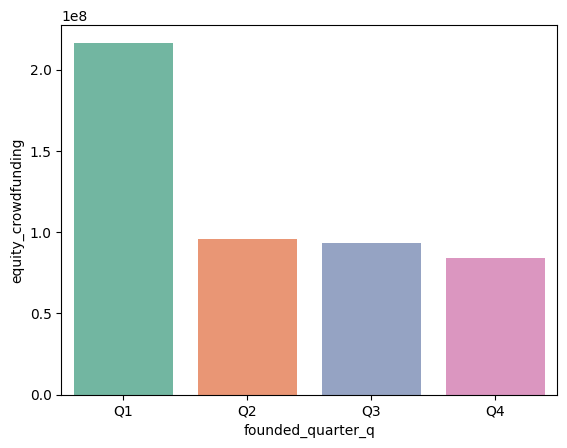

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({'equity_crowdfunding':'sum'}).reset_index().sort_values('equity_crowdfunding',ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot['equity_crowdfunding'], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='equity_crowdfunding'>

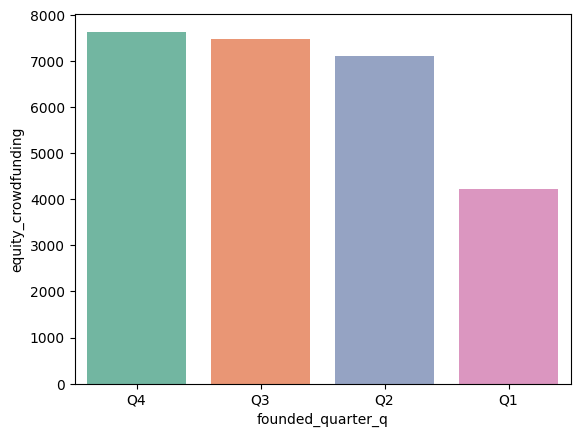

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({'equity_crowdfunding':'mean'}).reset_index().sort_values('equity_crowdfunding',ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot['equity_crowdfunding'], x=df_plot['founded_quarter_q'],palette='Set2')

Insights: From both plots it is evident that startups founded in the first quarter have attracted the most amount of crowd fundings

<Axes: xlabel='first_funding_at_year', ylabel='equity_crowdfunding'>

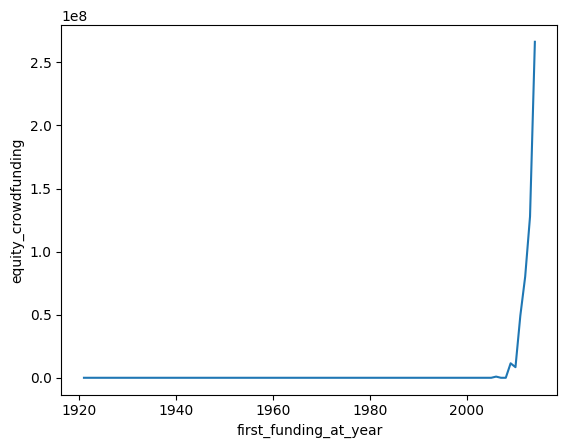

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({'equity_crowdfunding':'sum'}).reset_index().sort_values('equity_crowdfunding',ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot['equity_crowdfunding'], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='equity_crowdfunding'>

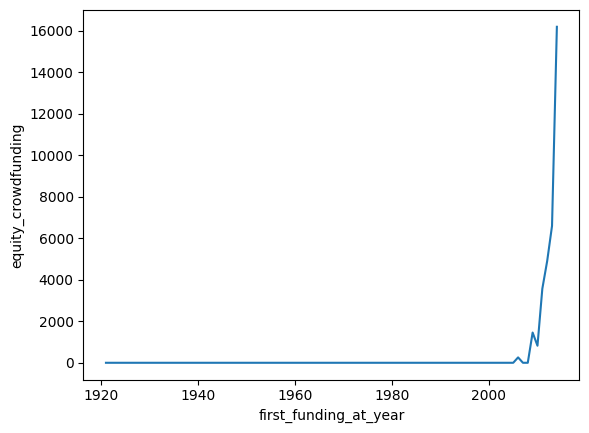

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({'equity_crowdfunding':'mean'}).reset_index().sort_values('equity_crowdfunding',ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot['equity_crowdfunding'], x=df_plot['first_funding_at_year'])

Insights: It can be seen from both plots that alot of start ups recievd their fisrt fundings in the early 21st century indicating that 21st century being the age of start ups

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='last_funding_at_year', ylabel='equity_crowdfunding'>

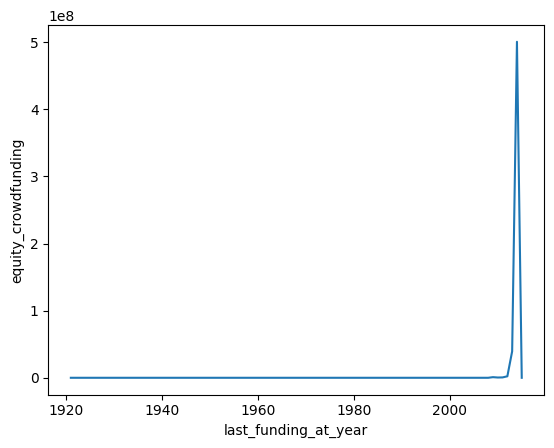

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({'equity_crowdfunding':'sum'}).reset_index().sort_values('equity_crowdfunding',ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot['equity_crowdfunding'], x=df_plot['last_funding_at_year'])

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='last_funding_at_year', ylabel='equity_crowdfunding'>

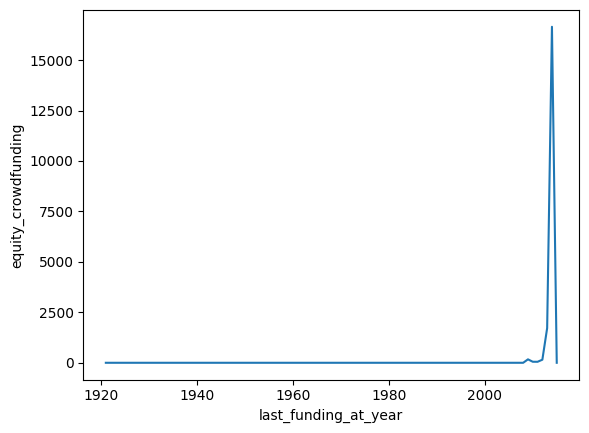

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({'equity_crowdfunding':'mean'}).reset_index().sort_values('equity_crowdfunding',ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot['equity_crowdfunding'], x=df_plot['last_funding_at_year'])

Insights: It can be seen from the plots that alot of start ups that recievd their last fundings in the early 21st century attracted a large amount of crowd fundings

## Undisclosed Funds
1. These are reserves that a company keeps but doesn't report on its balance sheet.
2. They can include money set aside for future investments or to cover liabilities


Average and Total Analysis of the Undisclosed Funds as shown below.

In [ ]:
column ='undisclosed'

<Axes: xlabel='undisclosed', ylabel='category_list'>

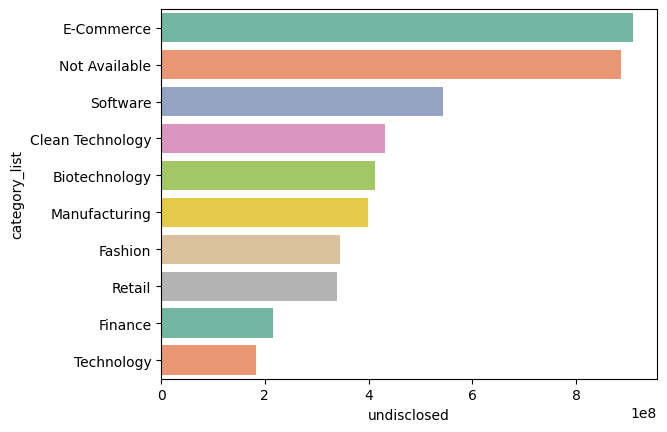

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

Insights: From the plot of top 10 categories ECommerce have the largest number of total undisclosed fundings.

<Axes: xlabel='undisclosed', ylabel='category_list'>

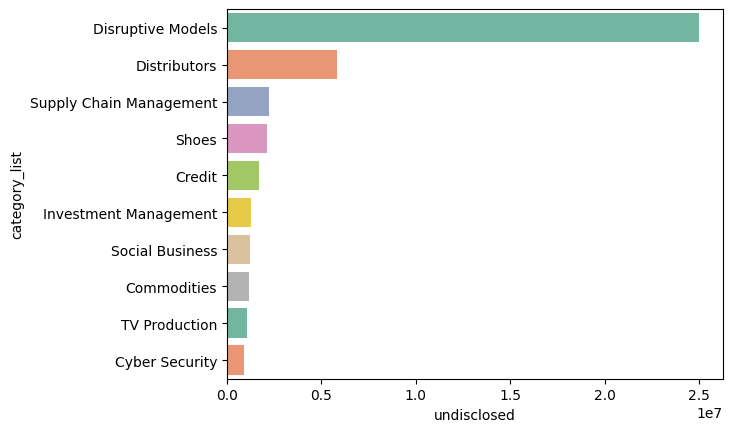

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

Insights: From the plot of top 10 categories Disruptive models have the largest number of average undisclosed fundings.

<Axes: xlabel='undisclosed', ylabel=' market '>

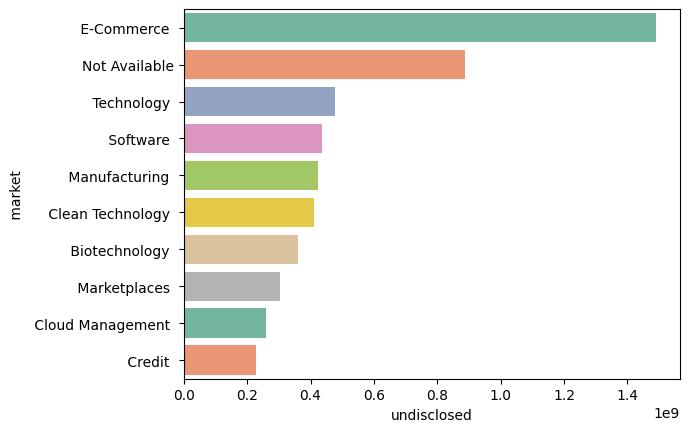

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

Insights: From the plot of top 10 markets ECommerce have the largest number of total fundings.

<Axes: xlabel='undisclosed', ylabel=' market '>

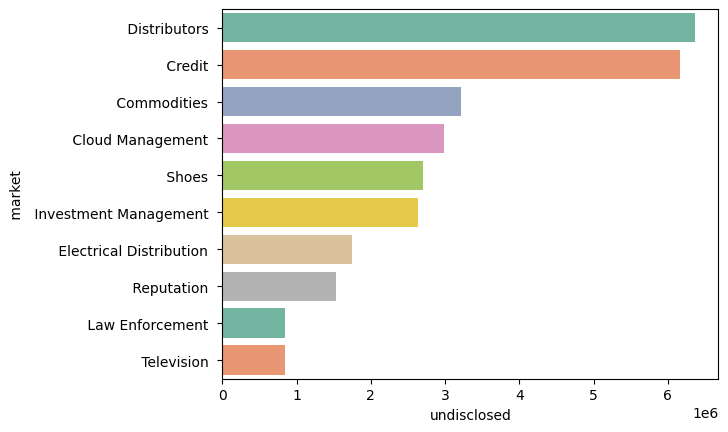

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

Insights: From the plot of top 10 markets Distributors have the largest number of avergae undisclosed fundings.

<Axes: xlabel='undisclosed', ylabel='status'>

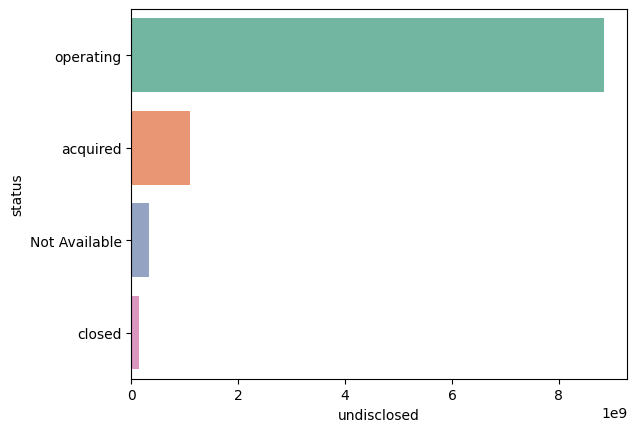

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

Insights: Startups that have an operating status have the largest amount of total undisclosed fundings.

<Axes: xlabel='undisclosed', ylabel='status'>

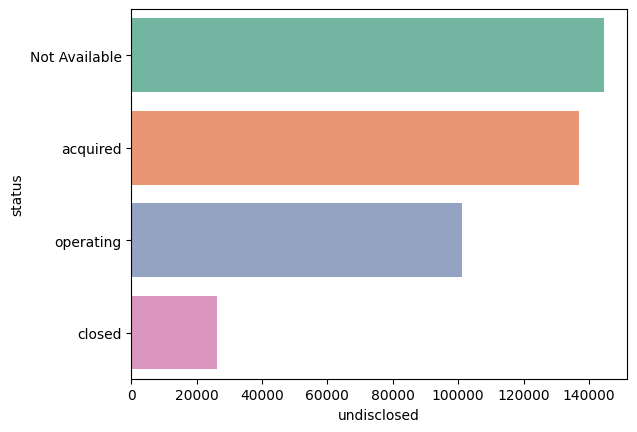

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

Insights: Startups that have an acquired status have the largest amount of average undisclosed fundings.

<Axes: xlabel='undisclosed', ylabel='country_code'>

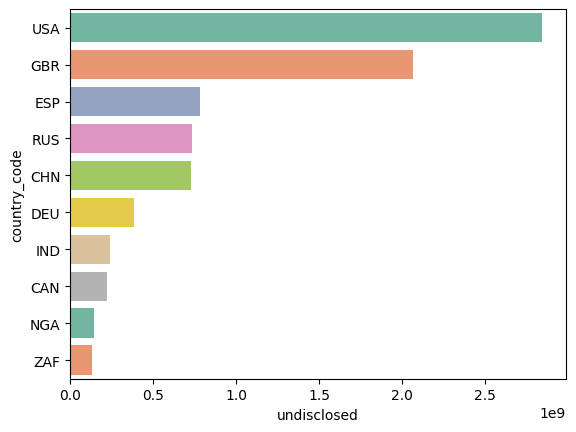

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

Insights: From the plot of top 10 countires USA have the largest number of total undisclosed fundings.

<Axes: xlabel='undisclosed', ylabel='country_code'>

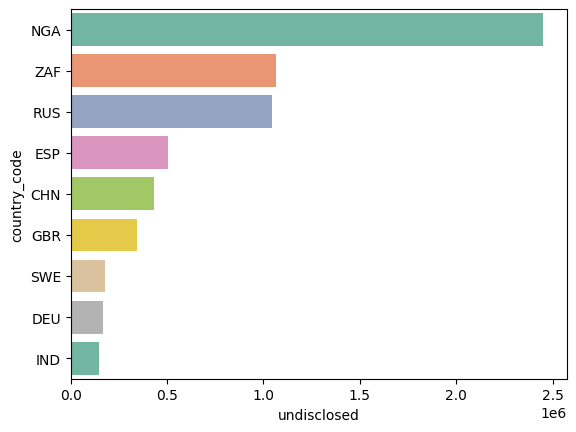

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

Insights: From the plot of top 10 countries Nigeria have the largest number of avergae undisclosed fundings.

<Axes: xlabel='undisclosed', ylabel='state_code'>

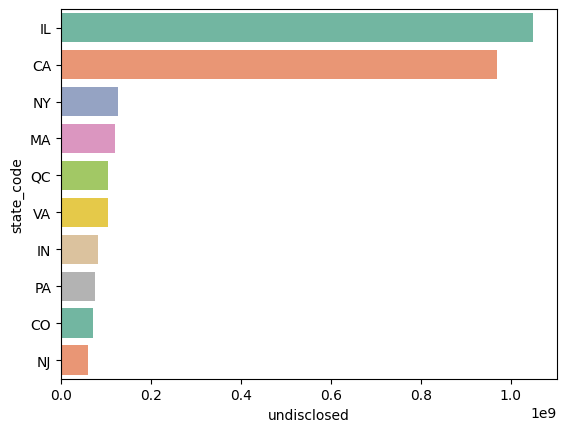

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 states Illinois have the largest number of total undisclosed fundings.

<Axes: xlabel='undisclosed', ylabel='state_code'>

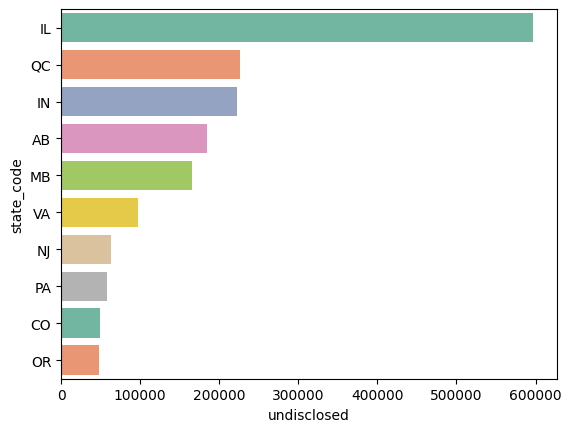

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 states Illinois have the largest number of average undisclosed fundings.

<Axes: xlabel='undisclosed', ylabel='region'>

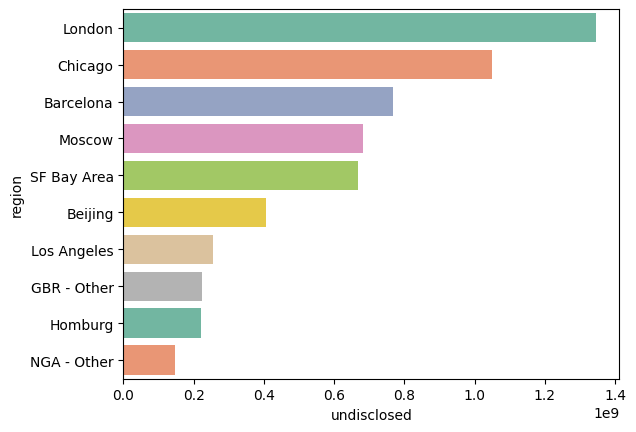

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 cities London have the largest number of total undisclosed fundings.

<Axes: xlabel='undisclosed', ylabel='region'>

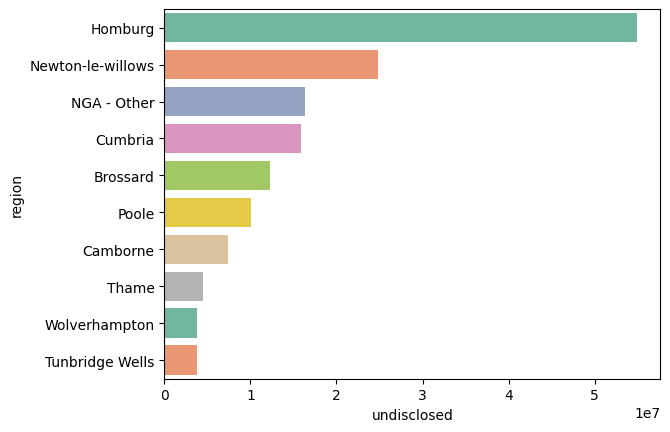

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 cities Homburg have the largest number of avergae undisclosed fundings.

<Axes: xlabel='founded_year', ylabel='undisclosed'>

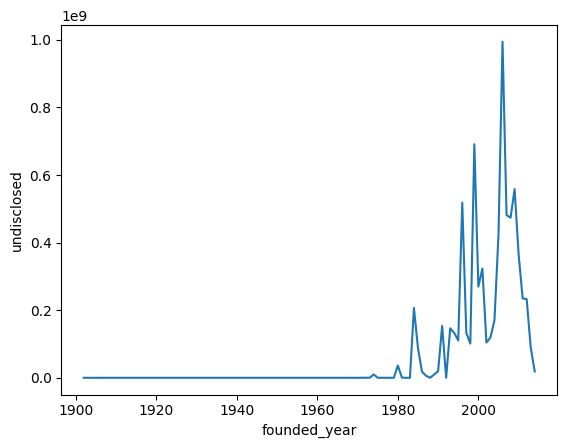

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='undisclosed'>

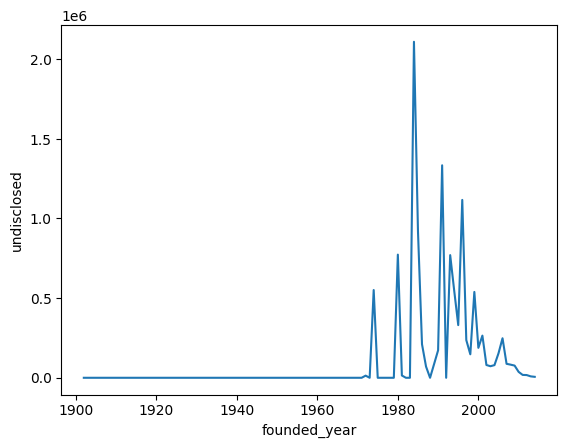

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

Insights: It can be seen from the plots that alot of start ups recievd their fisrt fundings in the early 1980s attracted a large amount of undisclosed fundings.


<Axes: xlabel='founded_month_num', ylabel='undisclosed'>

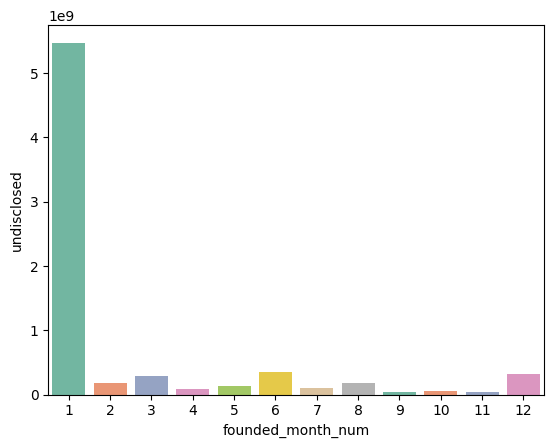

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='undisclosed'>

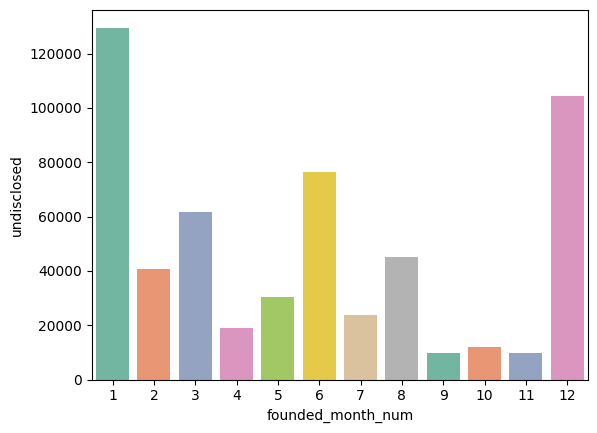

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

Insights: From the above plot it can be seen that start ups founded in the month of January have attracted the most amount of undisclosed fundings

<Axes: xlabel='founded_quarter_q', ylabel='undisclosed'>

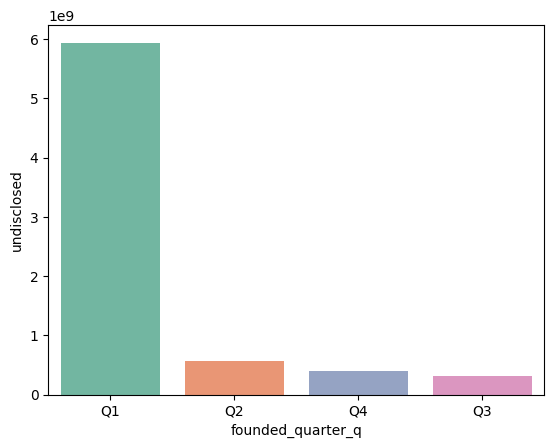

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='founded_quarter_q', ylabel='undisclosed'>

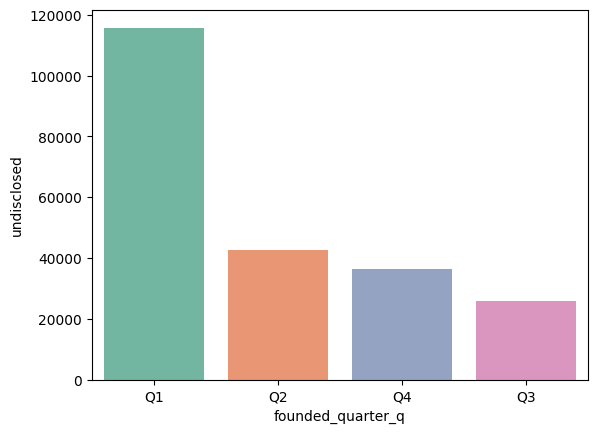

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

Insights: From both plots it is evident that startups founded in the first quarter have attracted the most amount of undisclosed fundings

<Axes: xlabel='first_funding_at_year', ylabel='undisclosed'>

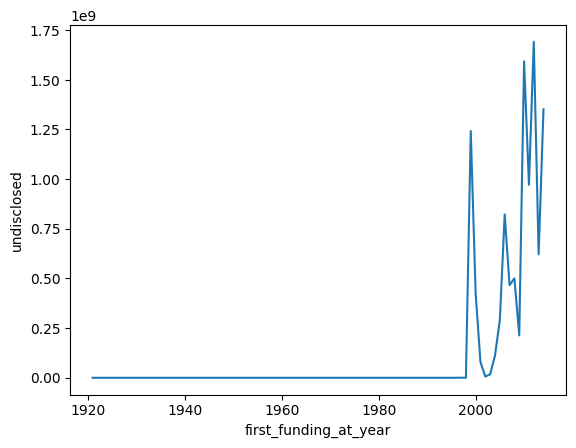

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='undisclosed'>

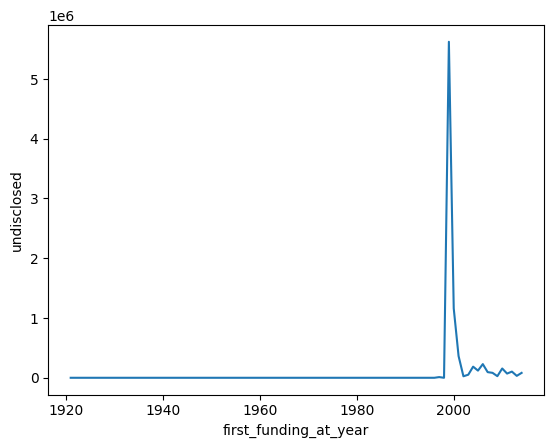

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

Insights: From the above trend it can be seen that startups found in the 21st century recieved the largets amount of undisclosed fundings.

<Axes: xlabel='last_funding_at_year', ylabel='undisclosed'>

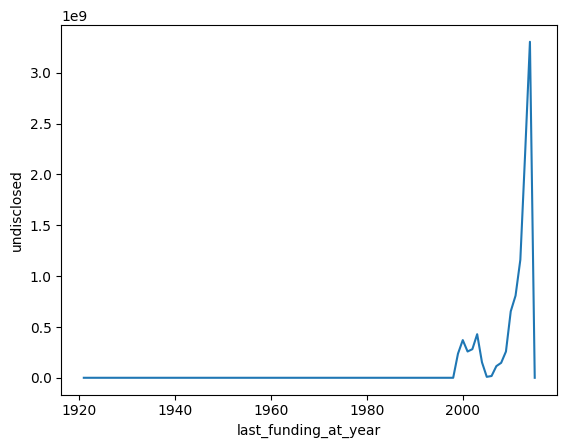

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='last_funding_at_year', ylabel='undisclosed'>

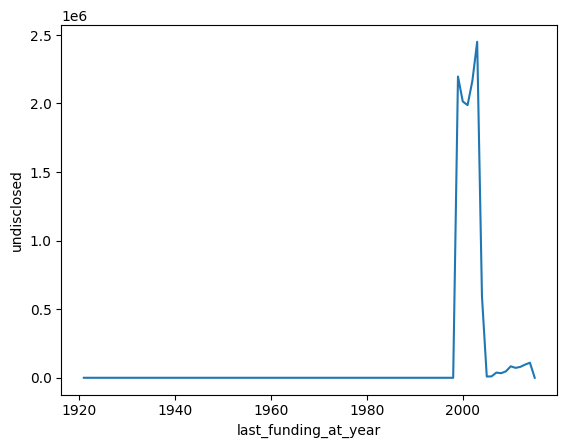

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

Insights: It can be seen from the plots that alot of start ups that recievd their last fundings in the early 21st century attracted a large amount of undisclosed funding.

## Convertible Note Funds
1. A convertible note refers to a short-term debt instrument (security) that can be converted into equity (ownership portion in a company).
2. Convertible notes are often used by seed investors who invest in startups.


Average and Total Analysis of the Convertible Note Funds as shown below.

In [ ]:
column ='convertible_note'

<Axes: xlabel='convertible_note', ylabel='category_list'>

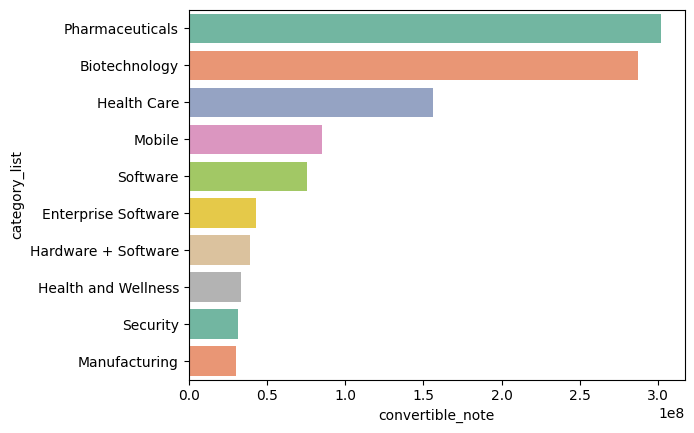

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='convertible_note', ylabel='category_list'>

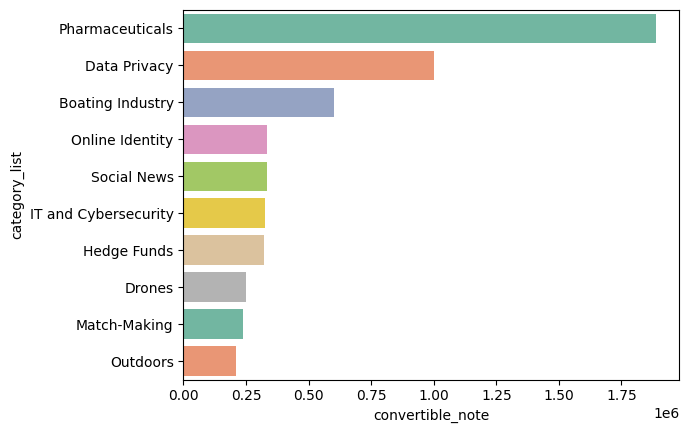

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

Insights: From the plot of top 10 categories Pharmaceuticals have the largest number of total and average convertible note fundings

<Axes: xlabel='convertible_note', ylabel=' market '>

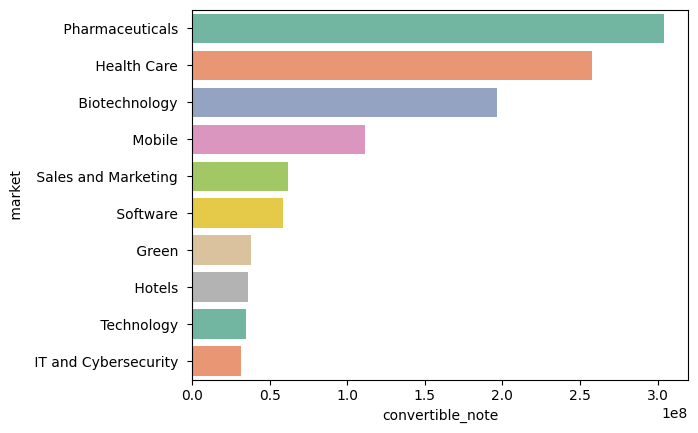

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='convertible_note', ylabel=' market '>

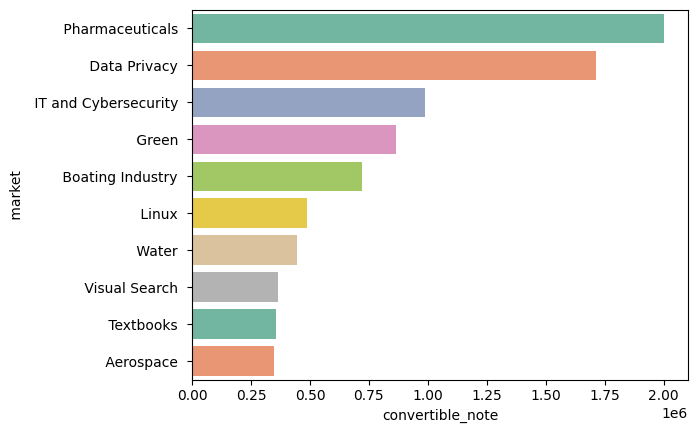

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

Insights: From the plot of top 10 markets Pharmaceuticals have the largest number of total and average convertible note fundings

<Axes: xlabel='convertible_note', ylabel='status'>

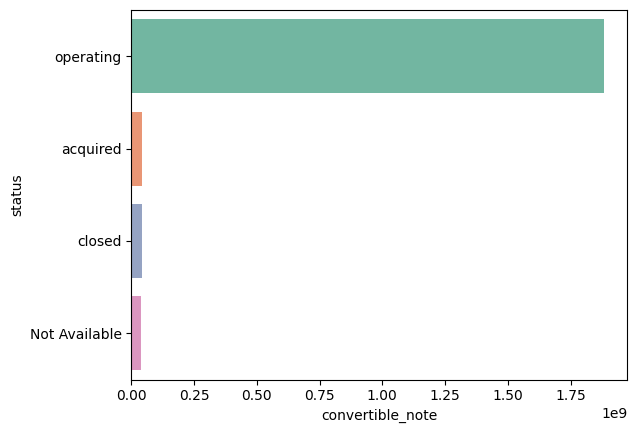

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='convertible_note', ylabel='status'>

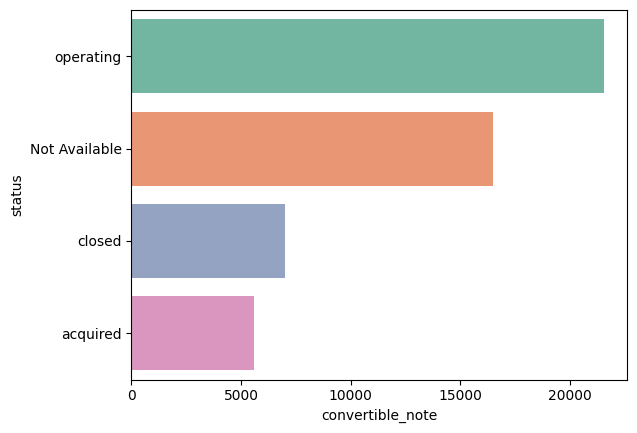

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

Insights: Startups that have an operating status have the largest amount of total convertible note fundings.

<Axes: xlabel='convertible_note', ylabel='country_code'>

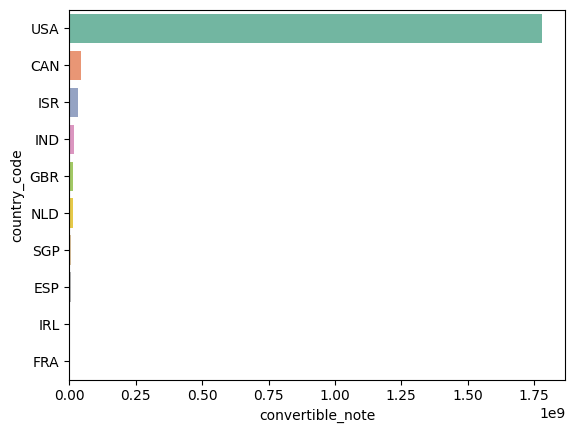

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='convertible_note', ylabel='country_code'>

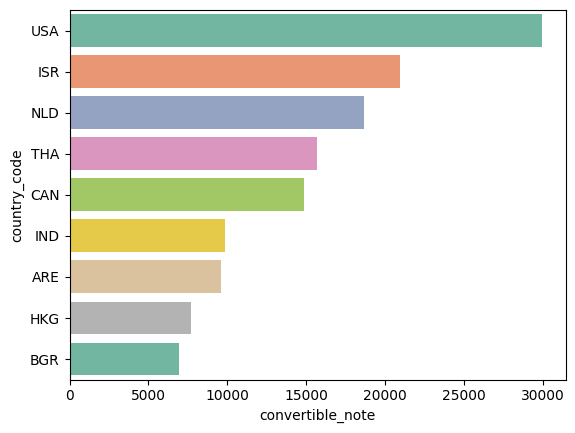

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

Insights: From the plot of top 10 countries USA have the largest number of total and average convertible note fundings.

<Axes: xlabel='convertible_note', ylabel='state_code'>

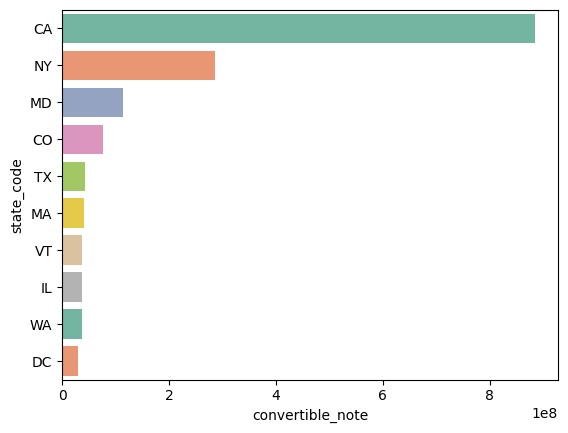

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 states California have the largest number of total convertible fundings.

<Axes: xlabel='convertible_note', ylabel='state_code'>

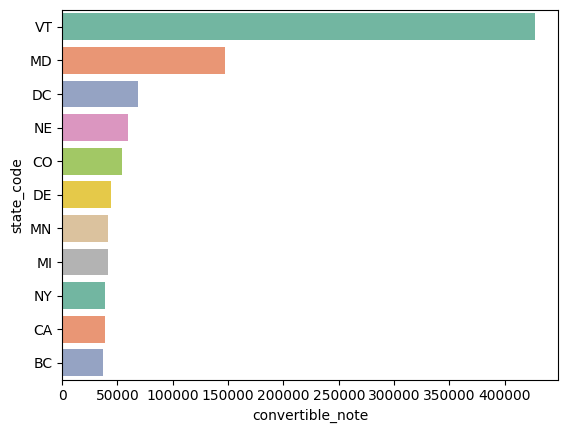

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 states Vermont have the largest number of avergae convertible note fundings.

<Axes: xlabel='convertible_note', ylabel='region'>

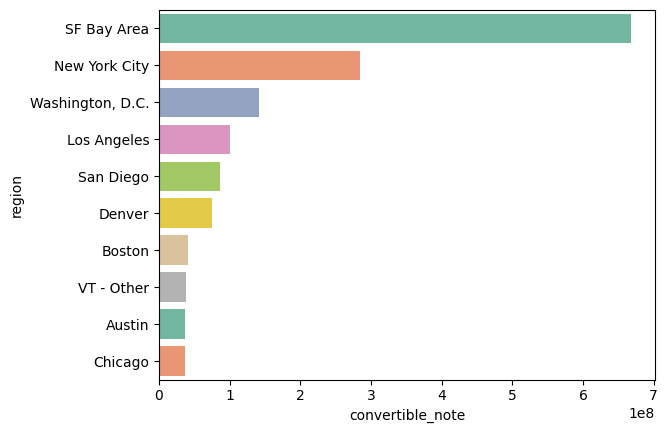

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 cities SF Bay Area have the largest number of total convertible note fundings.

<Axes: xlabel='convertible_note', ylabel='region'>

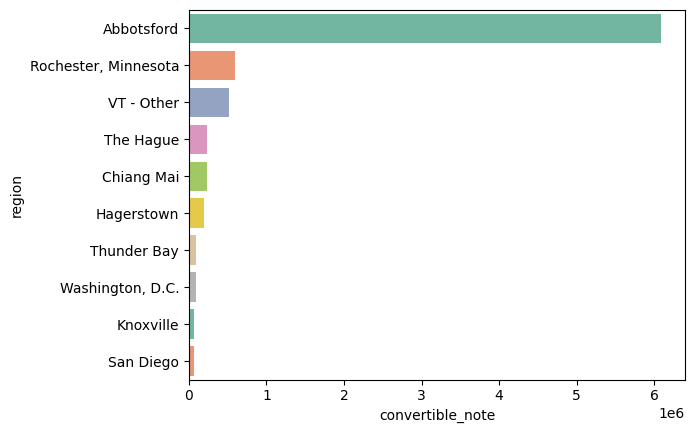

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 cities Abbostoford have the largest number of avergae convertible fundings.

<Axes: xlabel='founded_year', ylabel='convertible_note'>

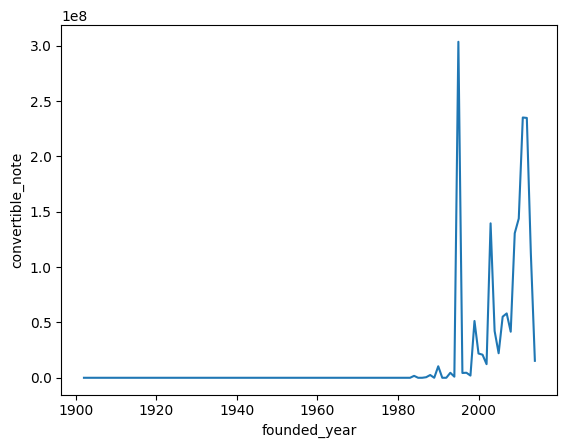

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='convertible_note'>

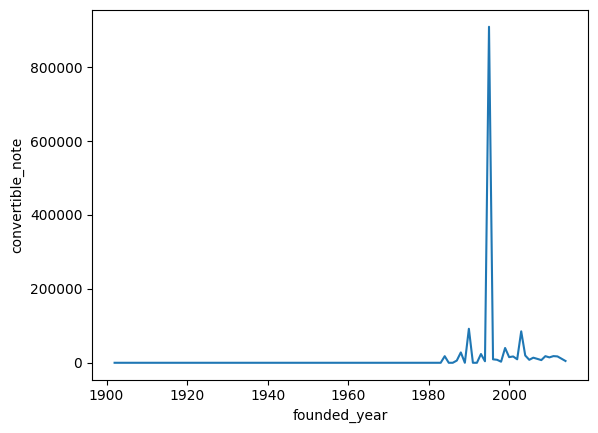

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

Insights: From the above trend it can be seen that startups found in the 21st century recieved the largest amount of convertible note fundings.

<Axes: xlabel='founded_month_num', ylabel='convertible_note'>

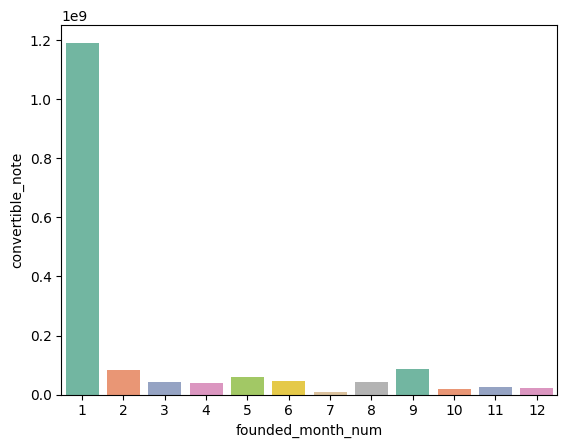

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='convertible_note'>

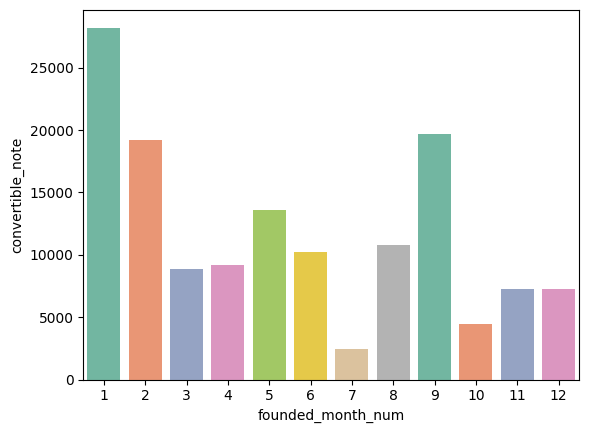

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

Insights: From the above plot it can be seen that start ups founded in the month of January have attracted the most amount of convertible note fundings

<Axes: xlabel='founded_quarter_q', ylabel='convertible_note'>

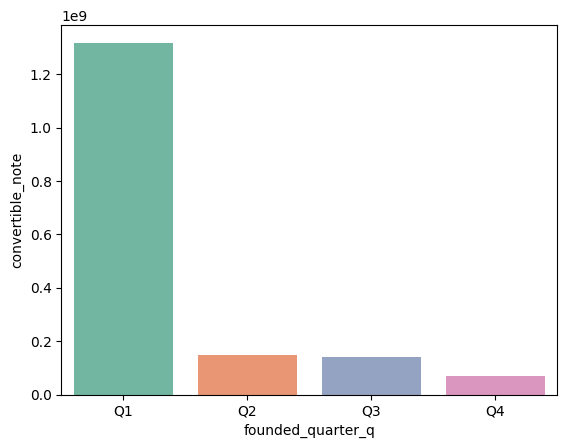

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='convertible_note'>

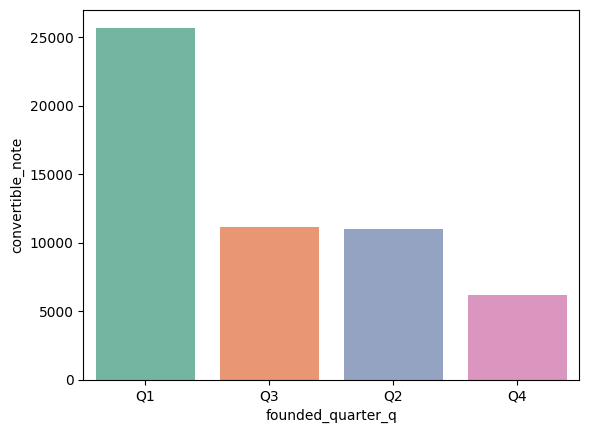

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

Insights: From both plots it is evident that startups founded in the first quarter have attracted the most amount of convertible note fundings

<Axes: xlabel='first_funding_at_year', ylabel='convertible_note'>

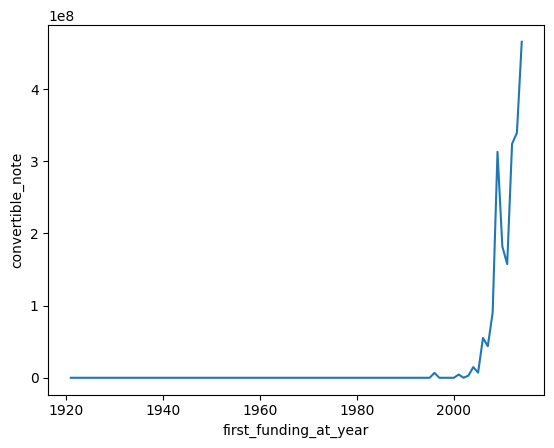

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='convertible_note'>

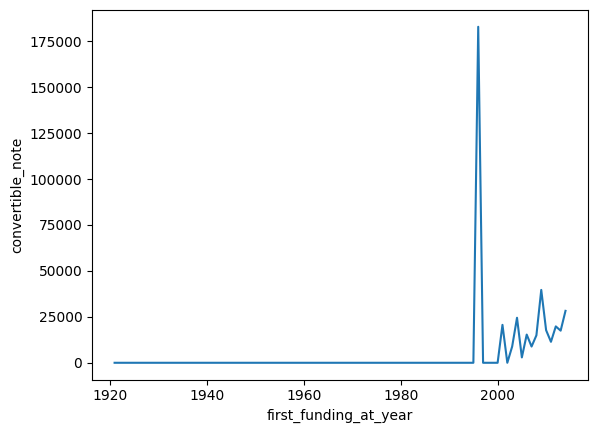

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

Insights: It can be seen from the plots that alot of start ups recievd their fisrt fundings in the early 21st century attracted a large amount of convertible note funding

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='last_funding_at_year', ylabel='convertible_note'>

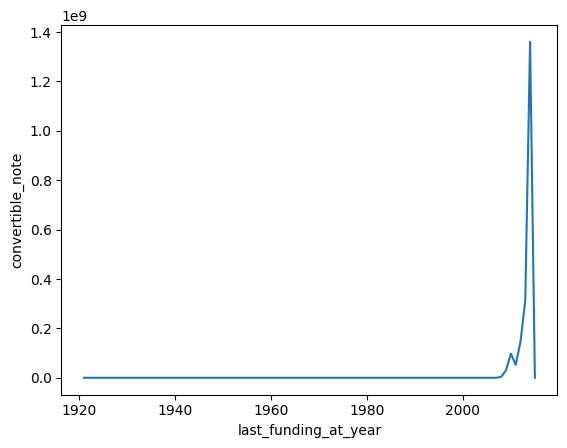

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='convertible_note'>

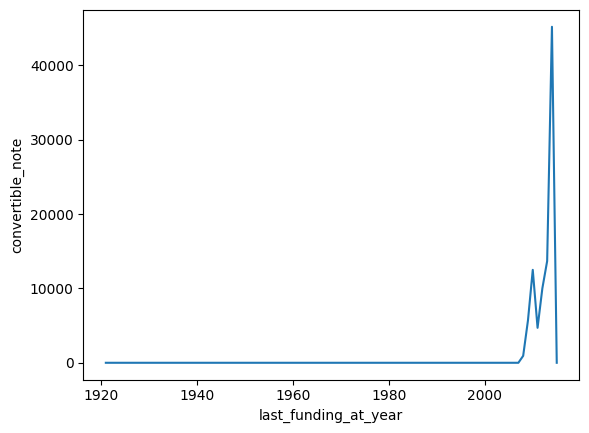

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

Insights: It can be seen from the plots that alot of start ups that recievd their last fundings in the early 21st century attracted a large amount of convertible note fundings

## Debt Financed Funds
1. Debt funding is a way to raise money by taking on debt, or borrowing money, from an external source.
2. The borrower is obligated to repay the principal amount plus interest over a set period of time.


Average and Total Analysis of the Debt Financed Funds as shown below.

In [ ]:
column ='debt_financing'

<Axes: xlabel='debt_financing', ylabel='category_list'>

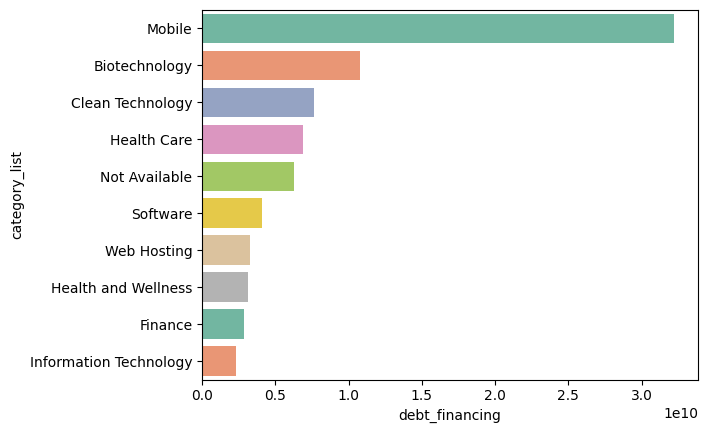

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='debt_financing', ylabel='category_list'>

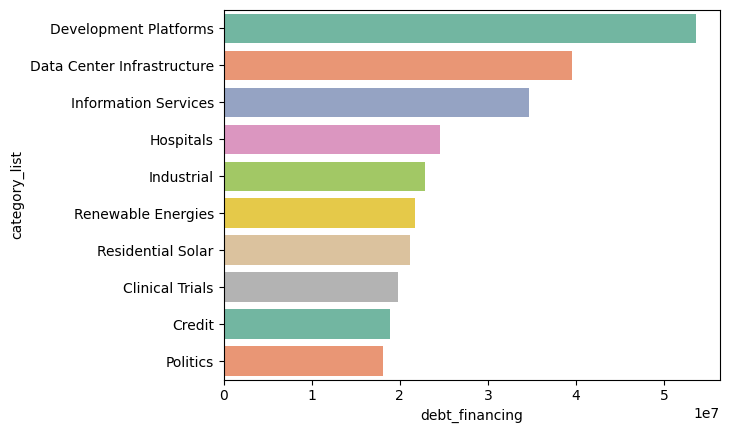

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='debt_financing', ylabel=' market '>

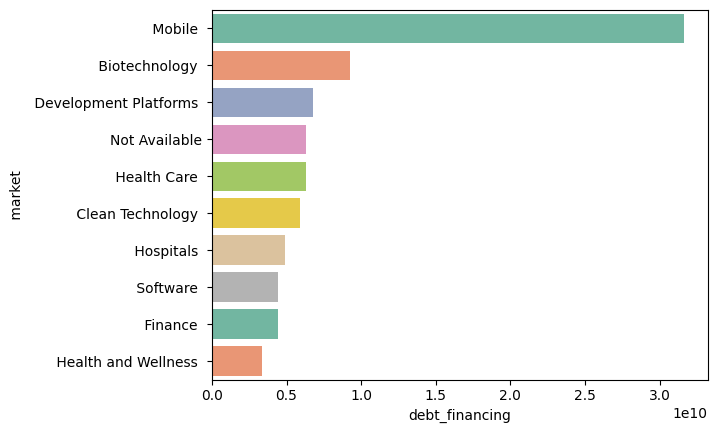

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='debt_financing', ylabel=' market '>

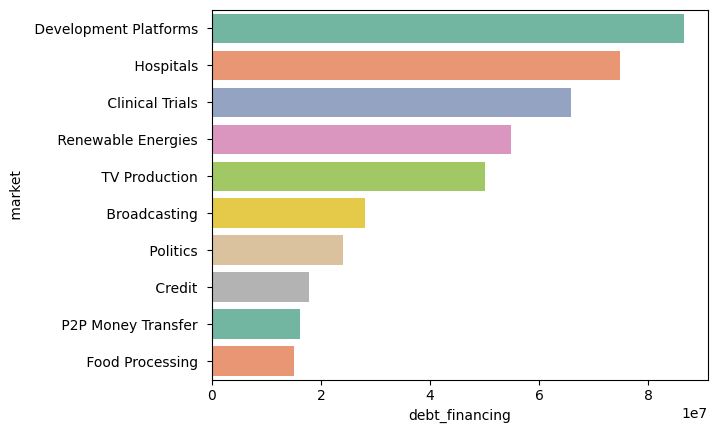

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='debt_financing', ylabel='status'>

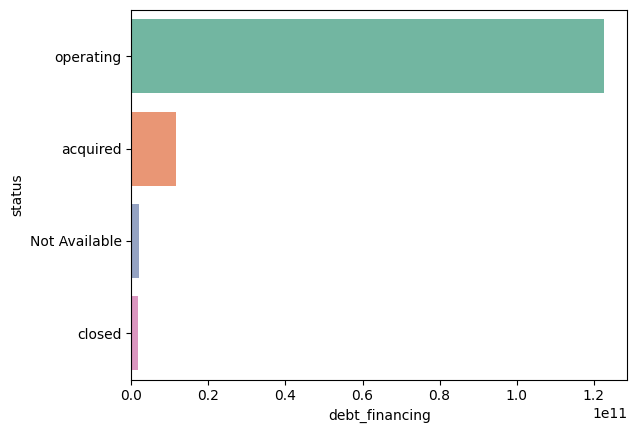

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='debt_financing', ylabel='status'>

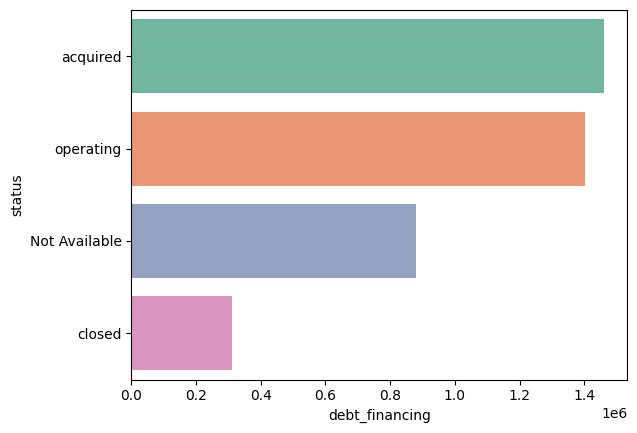

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='debt_financing', ylabel='country_code'>

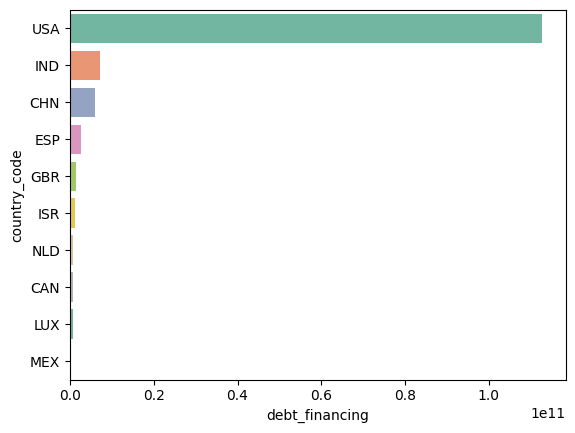

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='debt_financing', ylabel='country_code'>

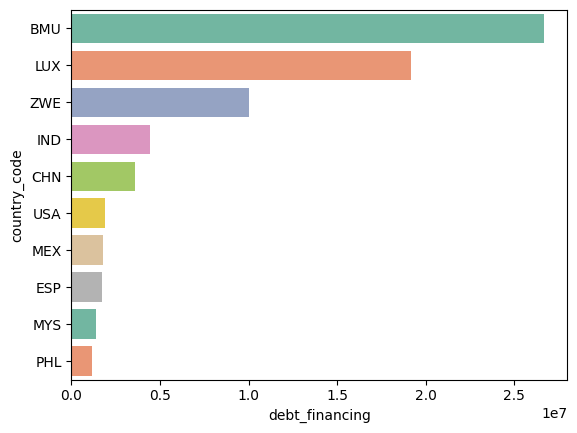

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='debt_financing', ylabel='state_code'>

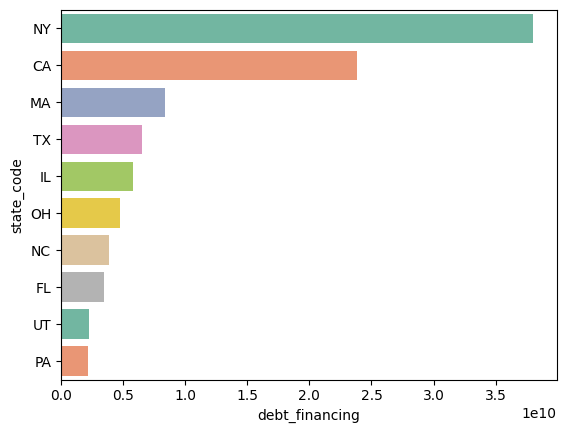

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='debt_financing', ylabel='state_code'>

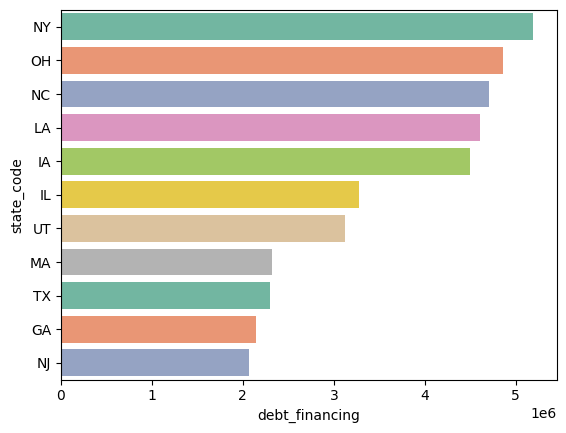

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='debt_financing', ylabel='region'>

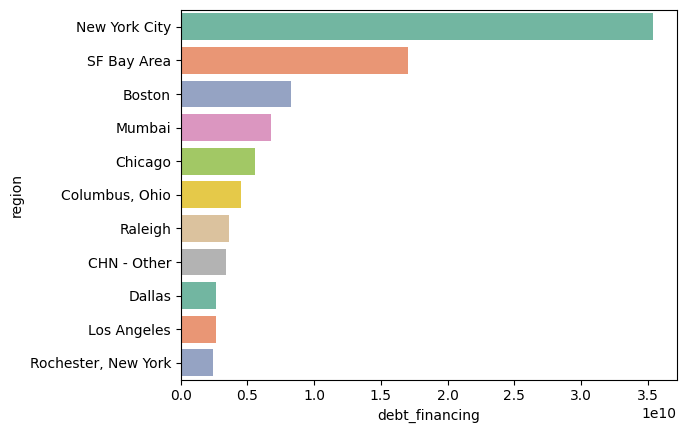

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='debt_financing', ylabel='region'>

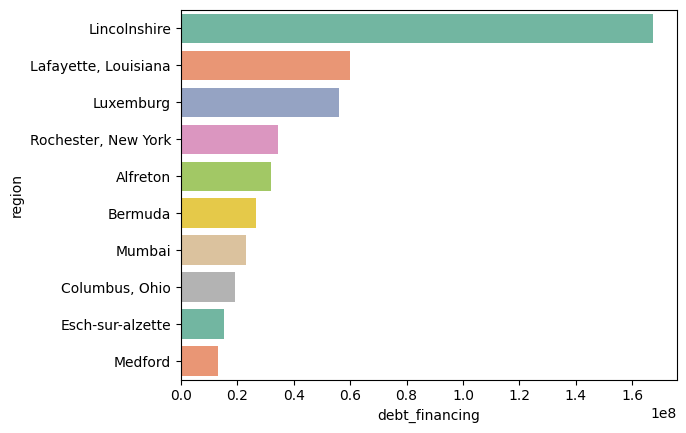

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='debt_financing'>

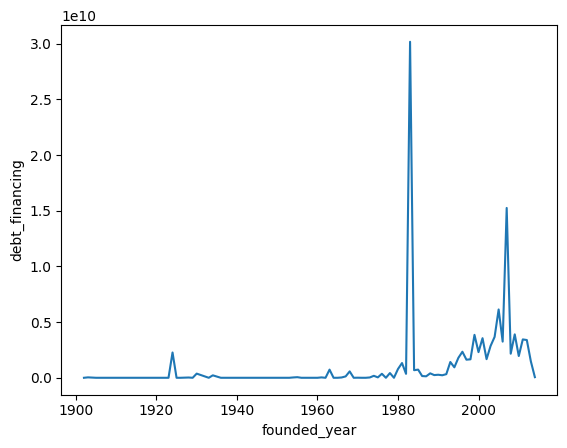

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='debt_financing'>

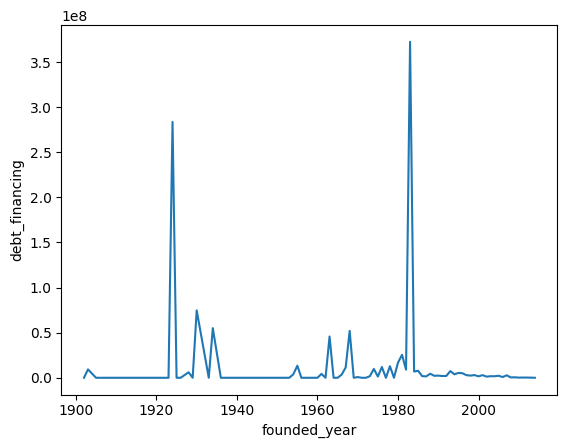

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='debt_financing'>

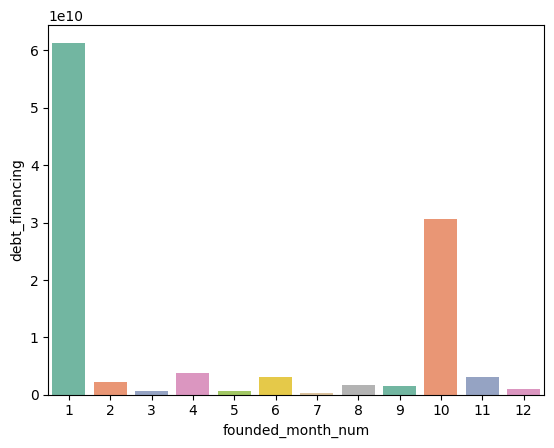

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='debt_financing'>

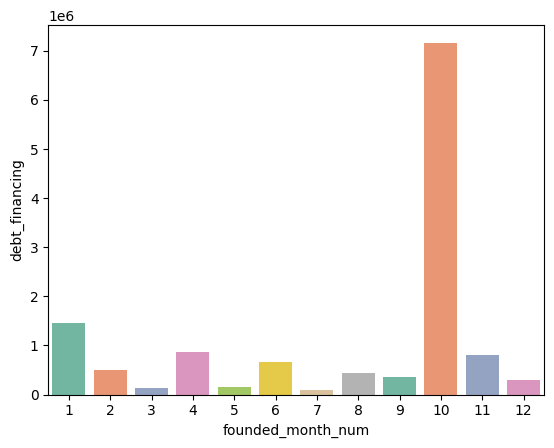

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='debt_financing'>

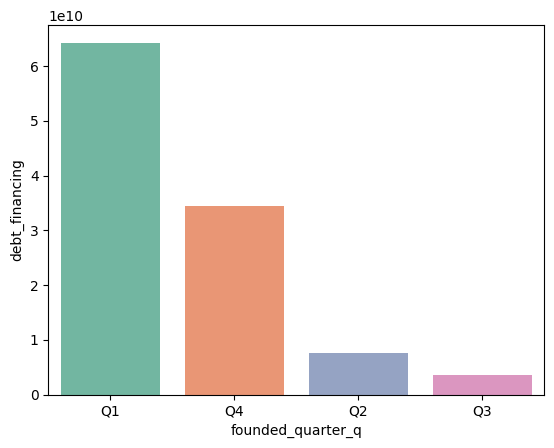

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='debt_financing'>

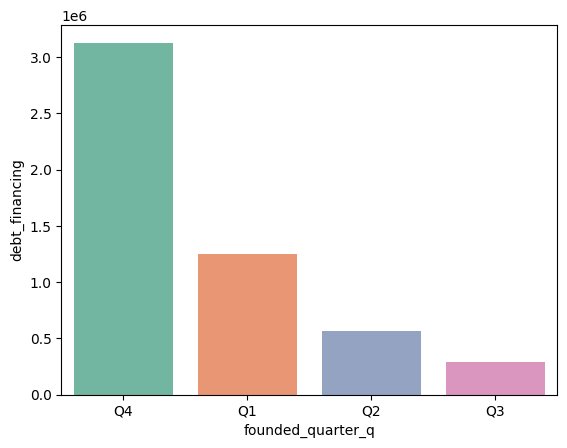

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='debt_financing'>

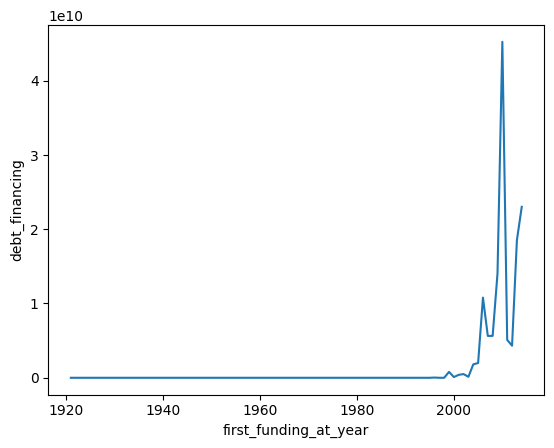

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='debt_financing'>

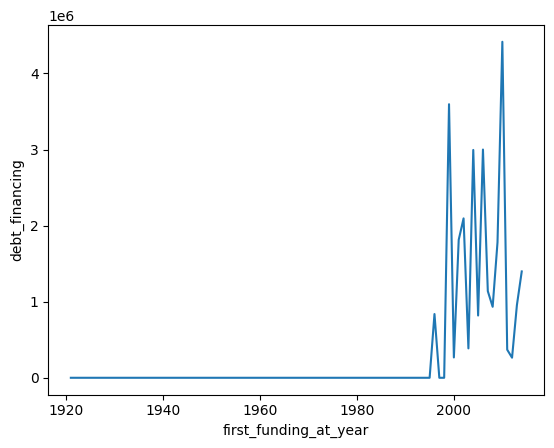

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='debt_financing'>

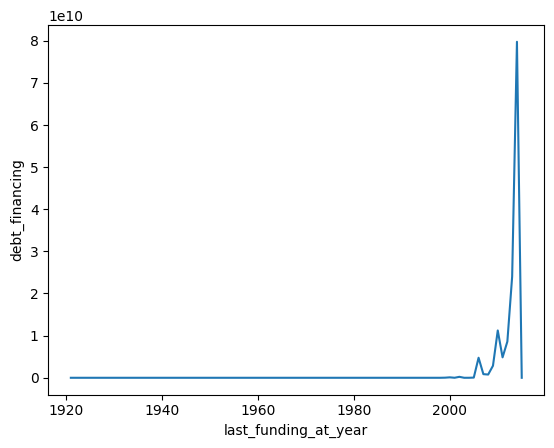

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='debt_financing'>

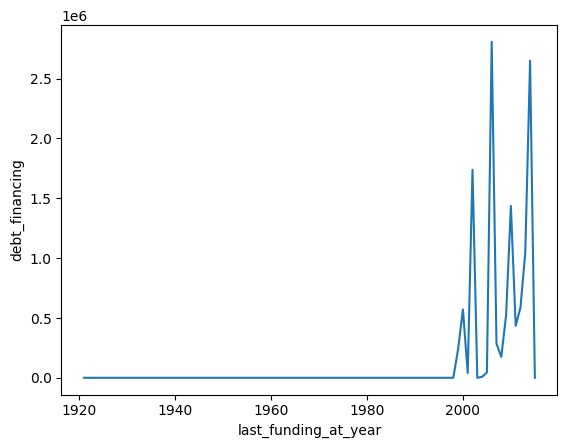

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Angel Funds
1. Angel financing refers to an investment model wherein "business angels" – essentially, high net worth individuals – provide financial backing for small businesses in exchange for equity in the company.
2. Angel financing can be a one-time investment, or it can refer to ongoing support.


Average and Total Analysis of the Angel Funds as shown below.

In [ ]:
column ='angel'

<Axes: xlabel='angel', ylabel='category_list'>

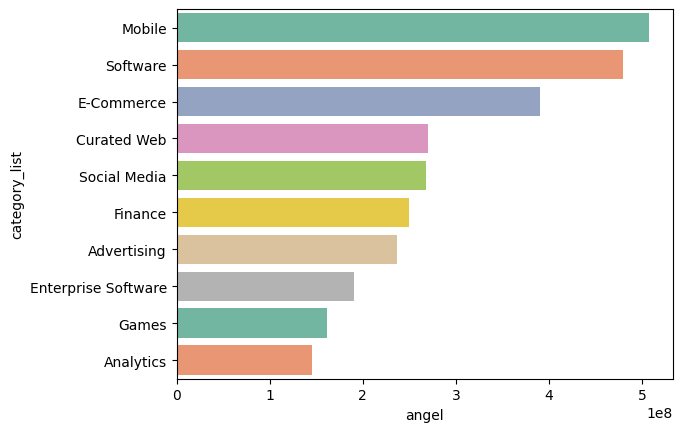

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='angel', ylabel='category_list'>

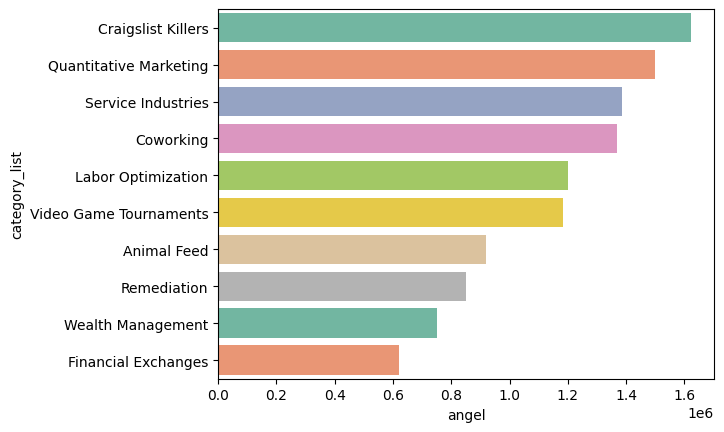

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='angel', ylabel=' market '>

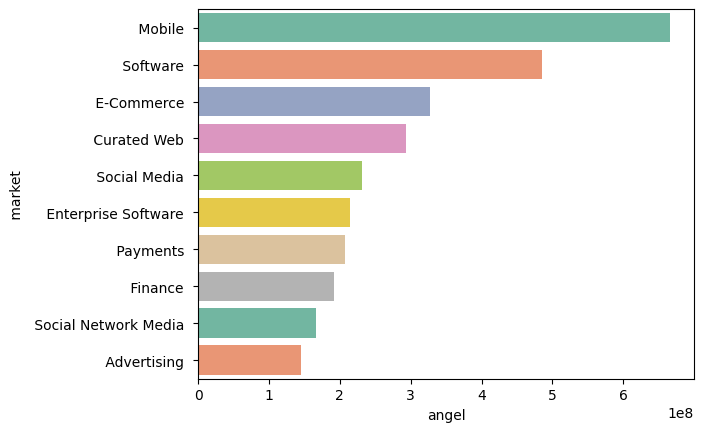

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='angel', ylabel=' market '>

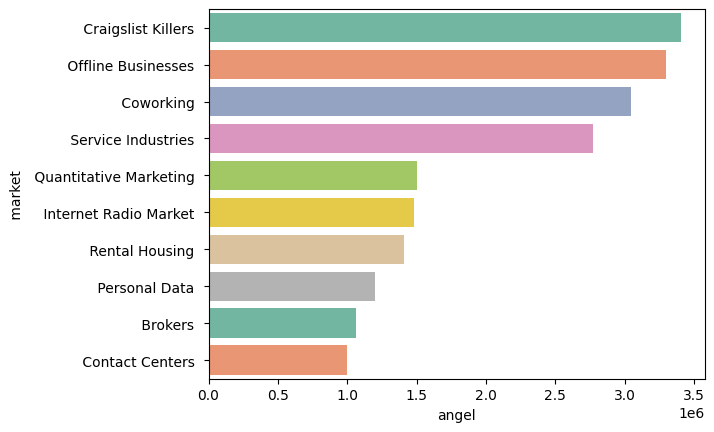

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='angel', ylabel='status'>

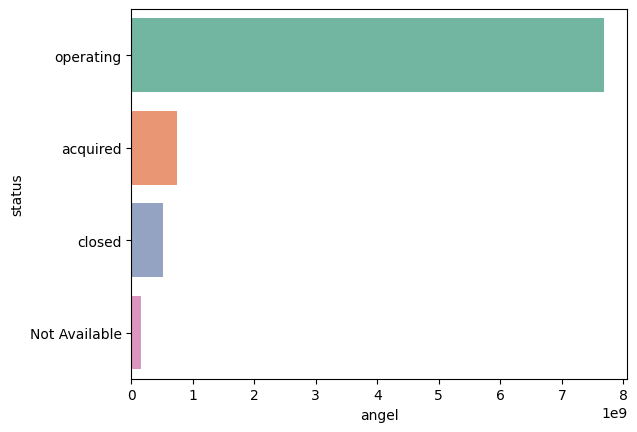

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='angel', ylabel='status'>

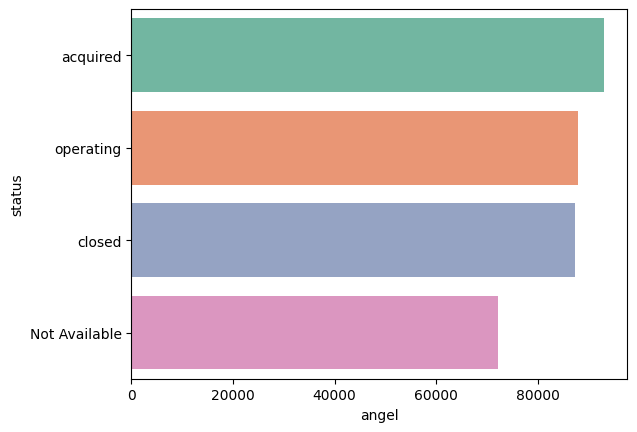

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='angel', ylabel='country_code'>

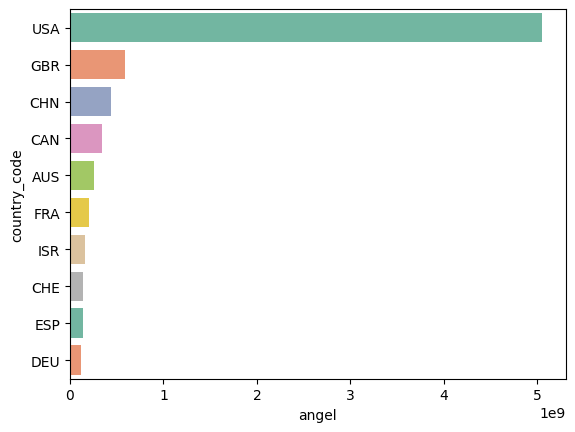

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='angel', ylabel='country_code'>

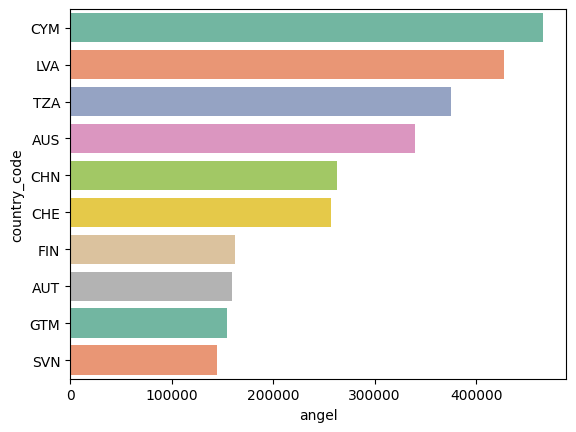

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='angel', ylabel='state_code'>

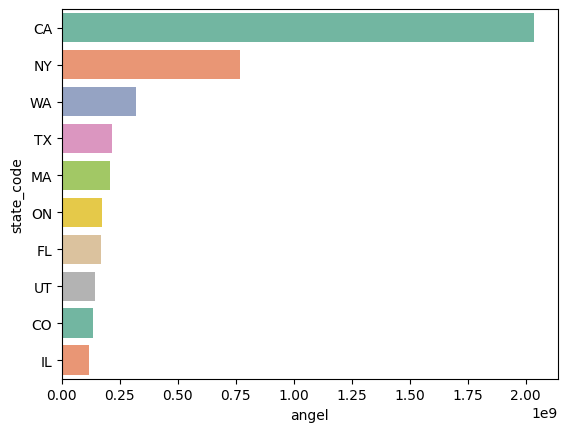

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='angel', ylabel='state_code'>

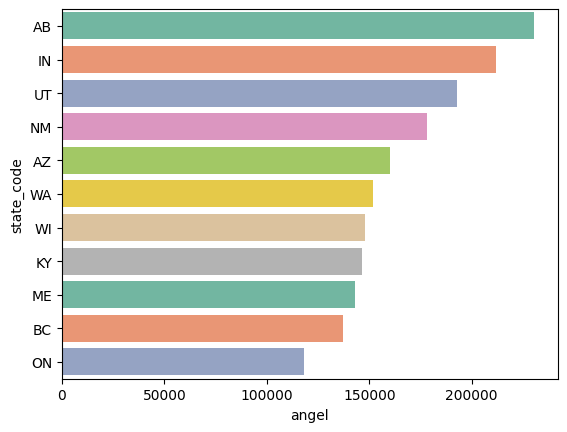

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='angel', ylabel='region'>

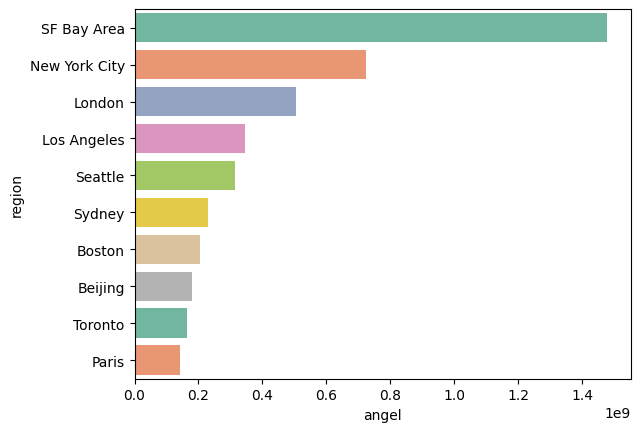

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='angel', ylabel='region'>

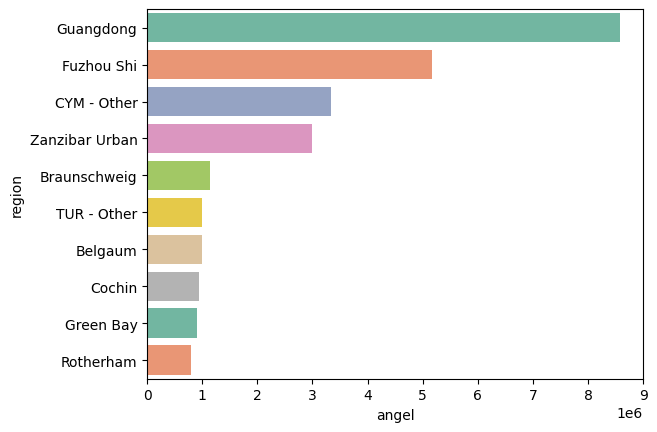

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='angel'>

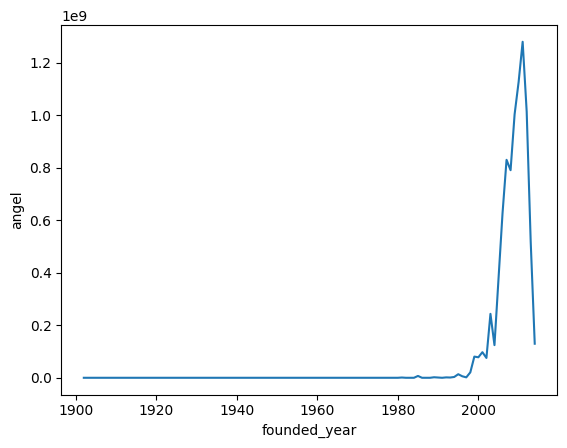

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='angel'>

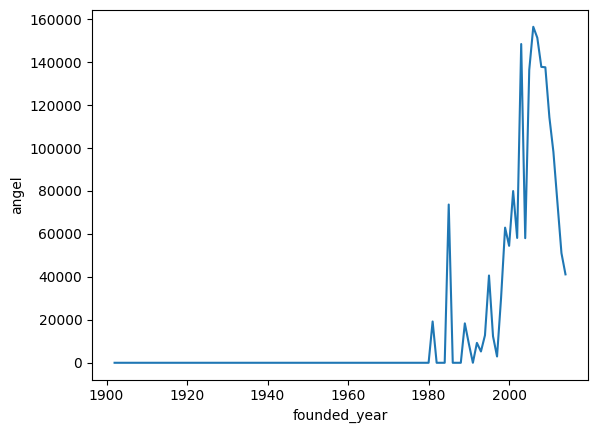

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='angel'>

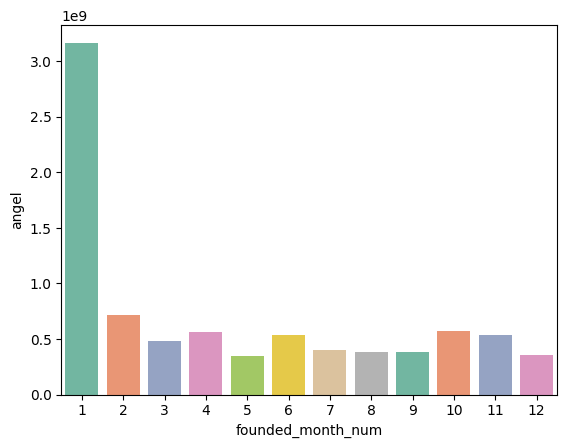

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='angel'>

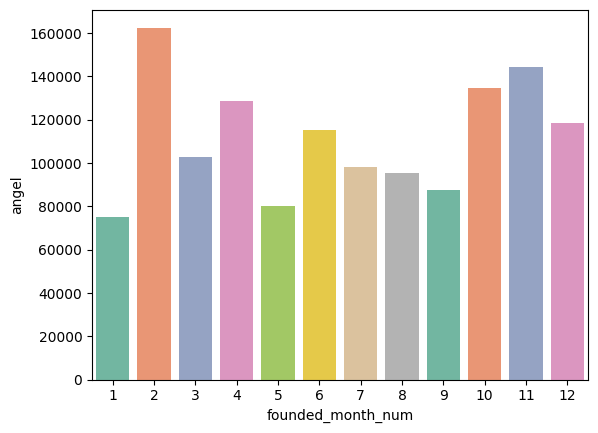

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='angel'>

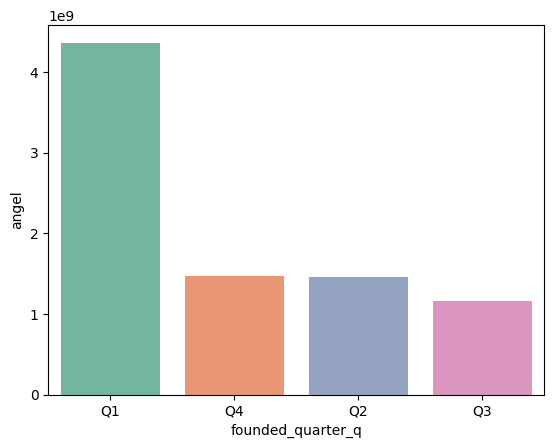

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='angel'>

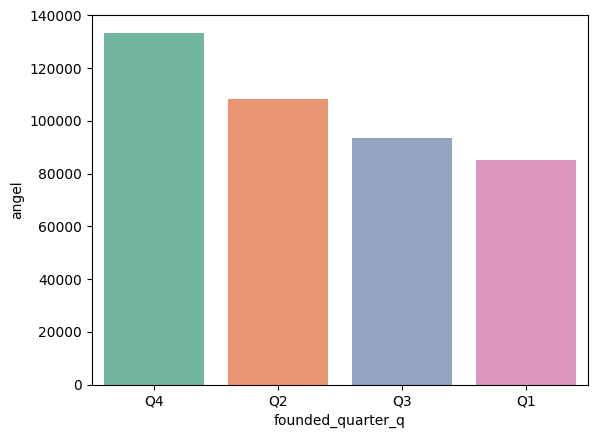

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='angel'>

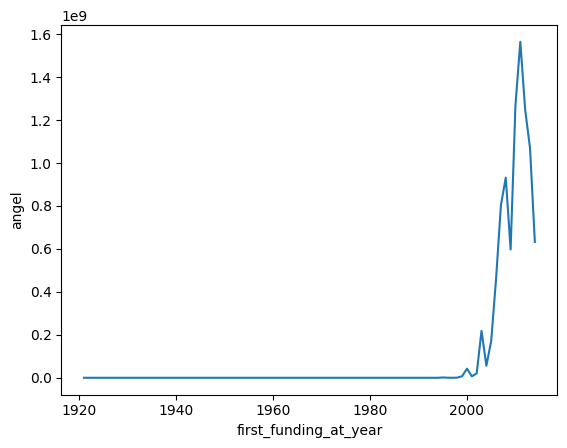

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='angel'>

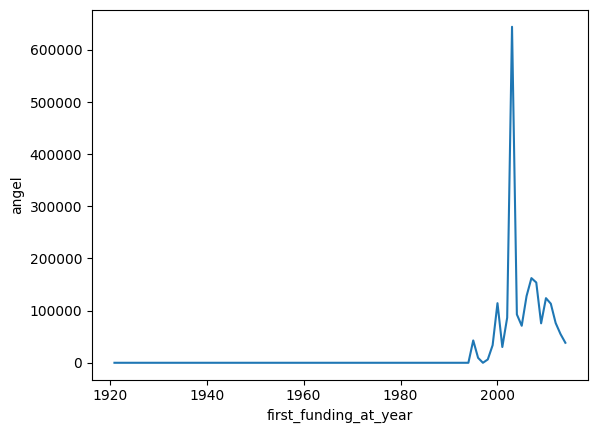

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='angel'>

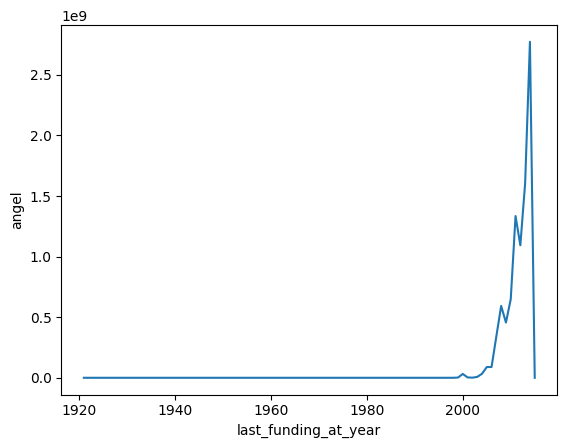

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='angel'>

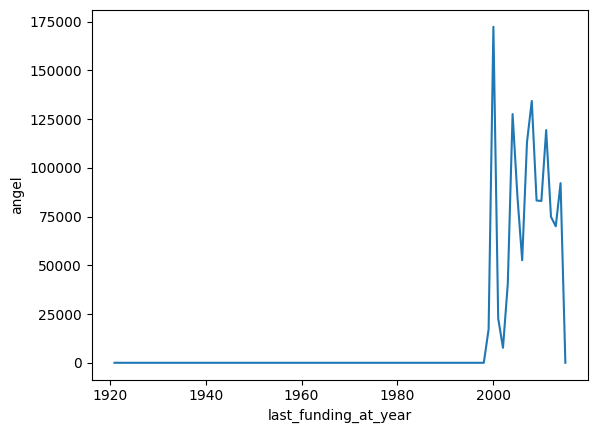

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Grant Funds
1. Grant funding is a financial award given to an individual or organization by a government, foundation, corporation, or other organization for a specific purpose.
2. Grants are different from loans because they do not need to be repaid.



Average and Total Analysis of the Grant Funds as shown below.

In [ ]:
column ='grant'

<Axes: xlabel='grant', ylabel='category_list'>

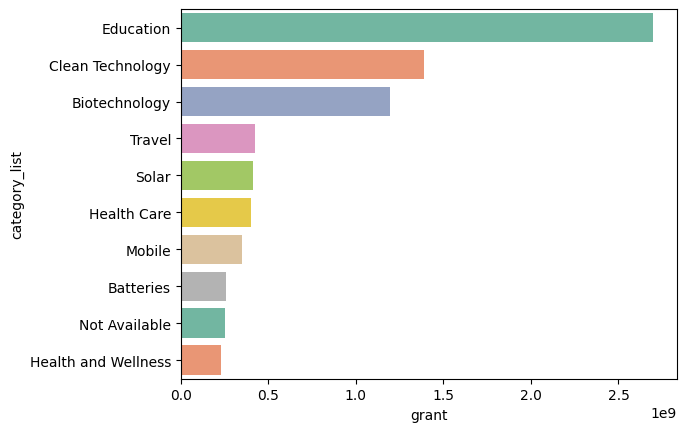

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='grant', ylabel='category_list'>

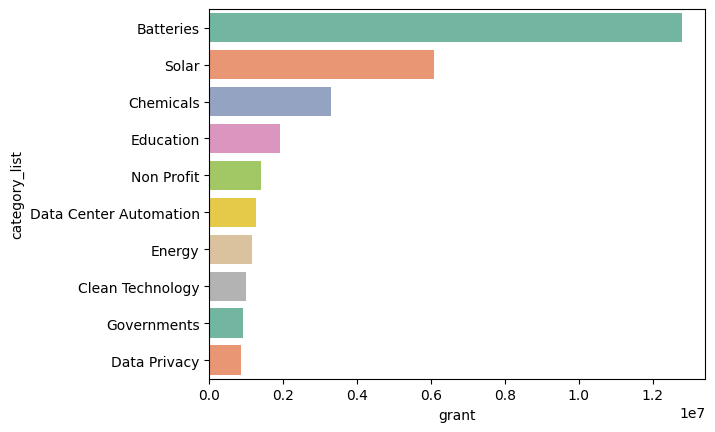

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='grant', ylabel=' market '>

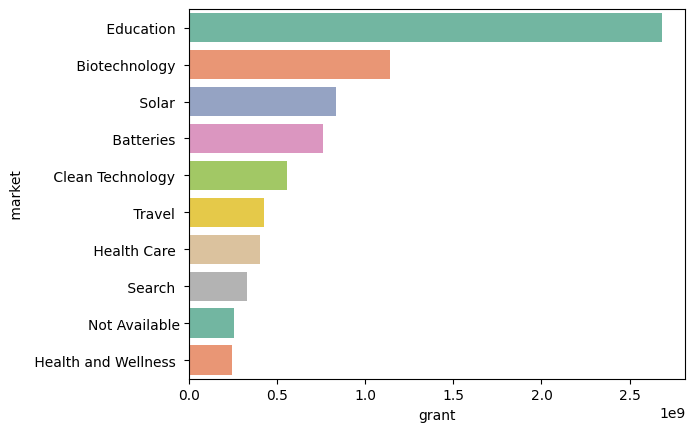

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='grant', ylabel=' market '>

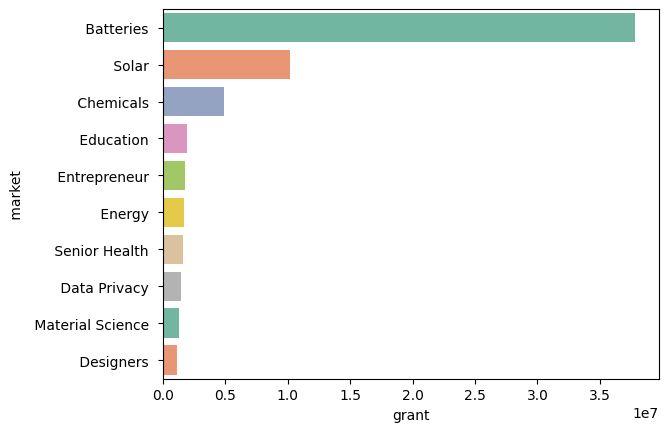

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='grant', ylabel='status'>

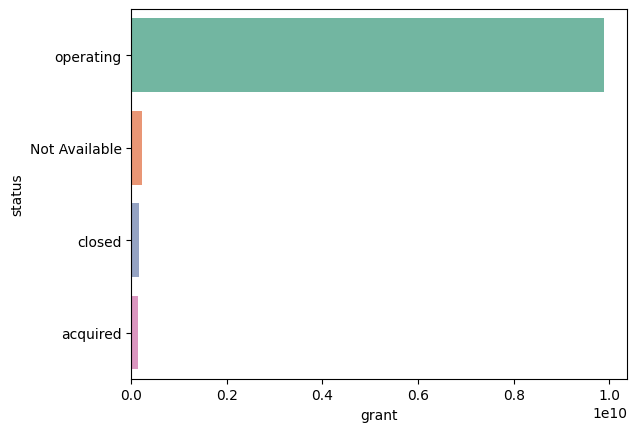

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='grant', ylabel='status'>

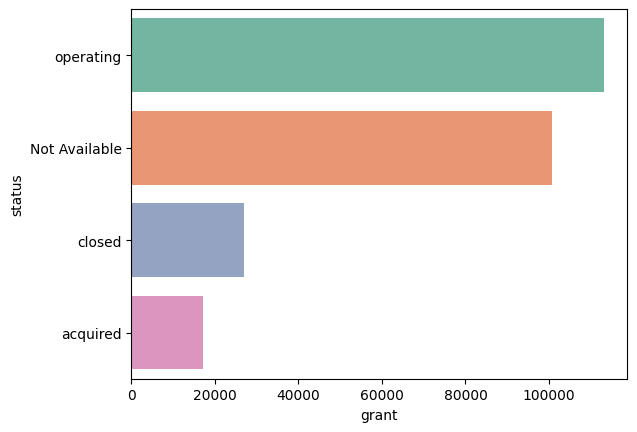

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='grant', ylabel='country_code'>

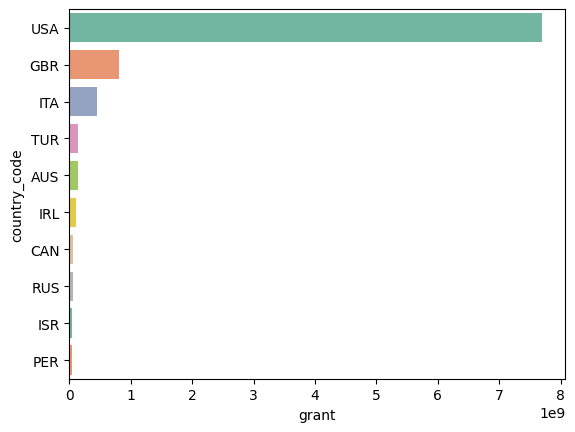

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='grant', ylabel='country_code'>

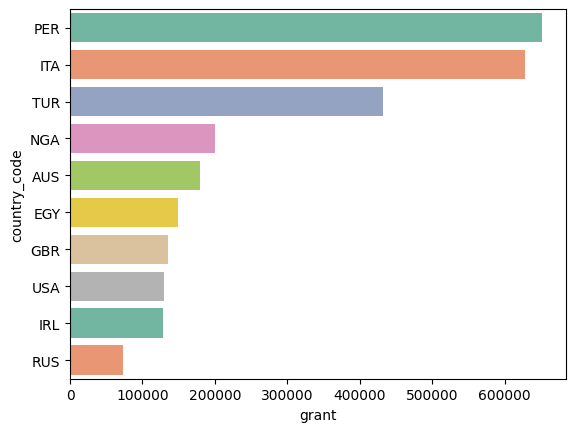

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='grant', ylabel='state_code'>

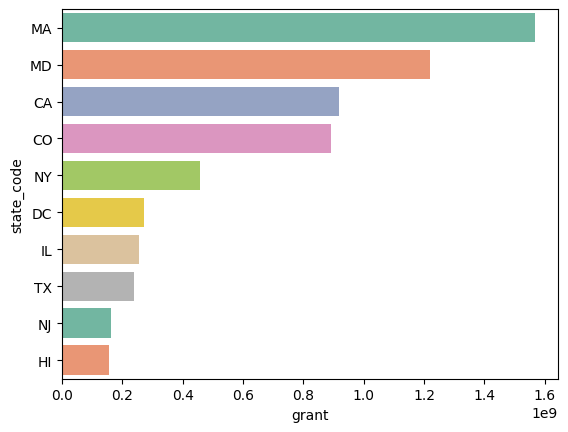

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='grant', ylabel='state_code'>

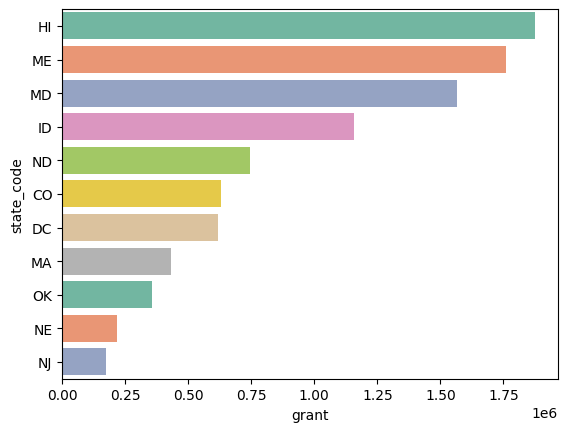

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='grant', ylabel='region'>

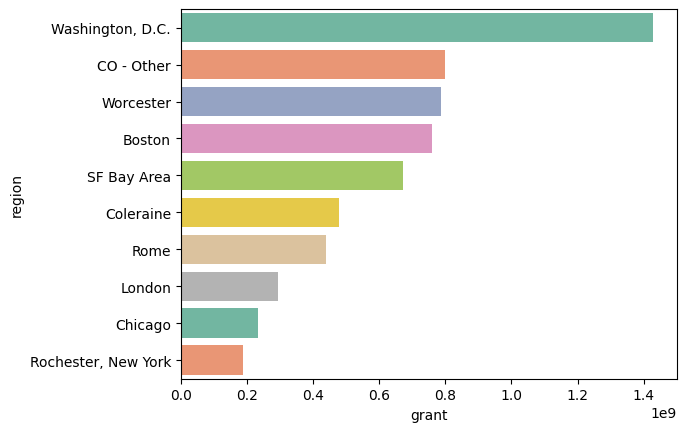

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='grant', ylabel='region'>

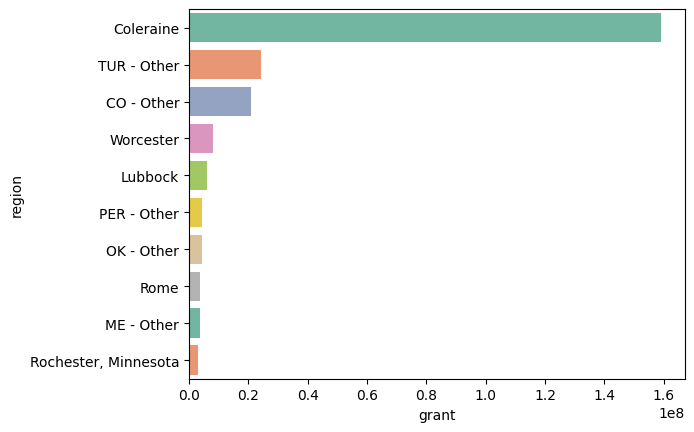

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='grant'>

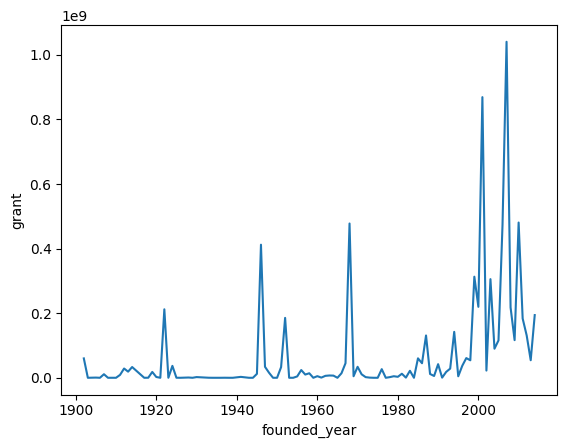

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='grant'>

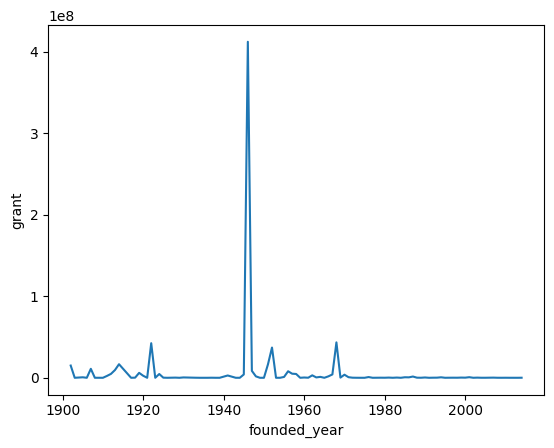

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='grant'>

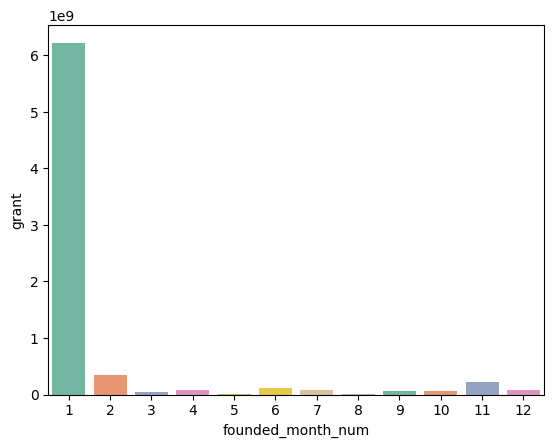

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='grant'>

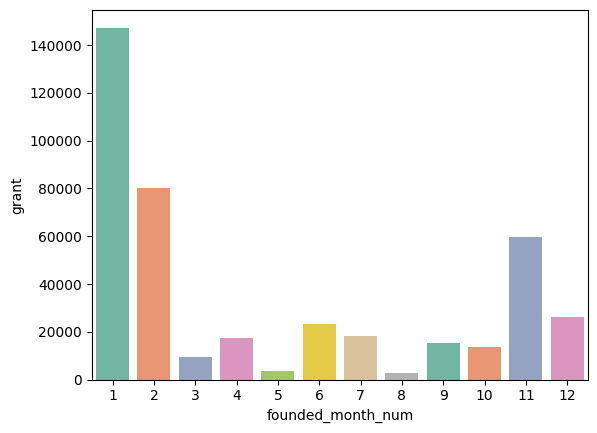

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='grant'>

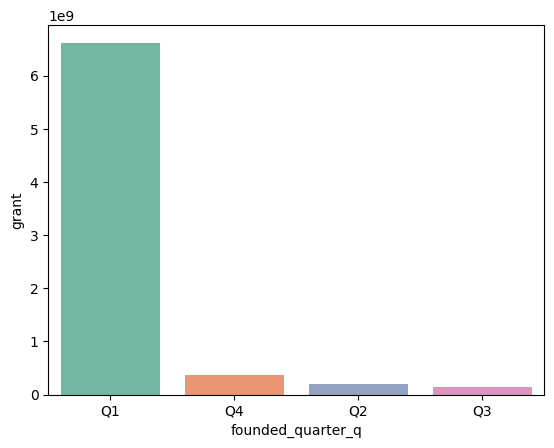

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='grant'>

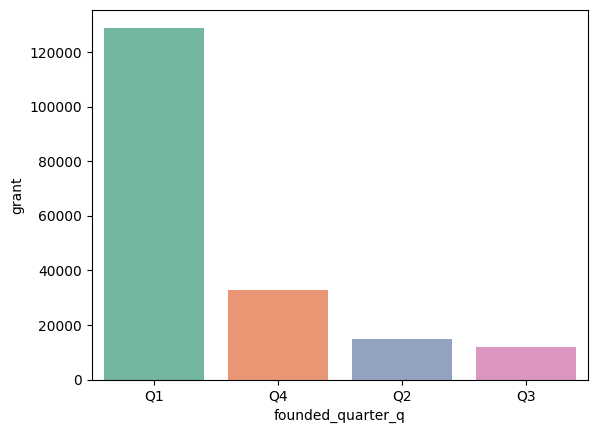

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='grant'>

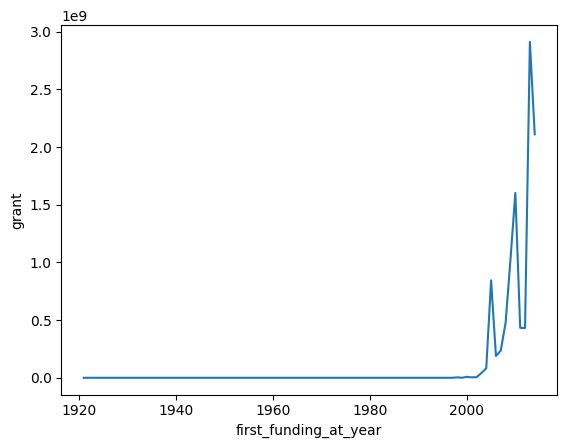

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='grant'>

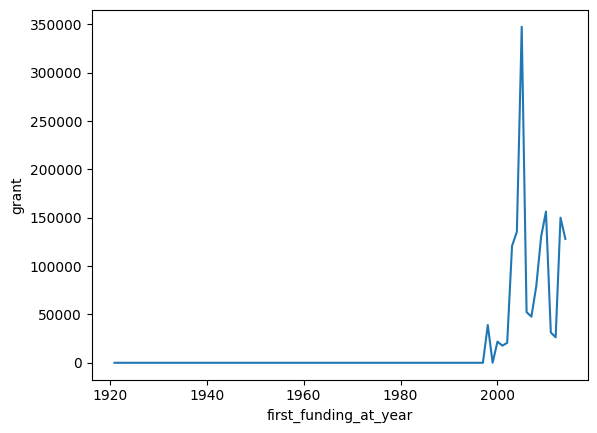

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='grant'>

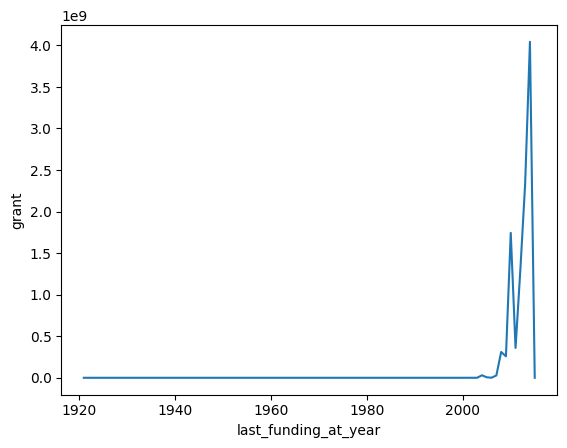

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='grant'>

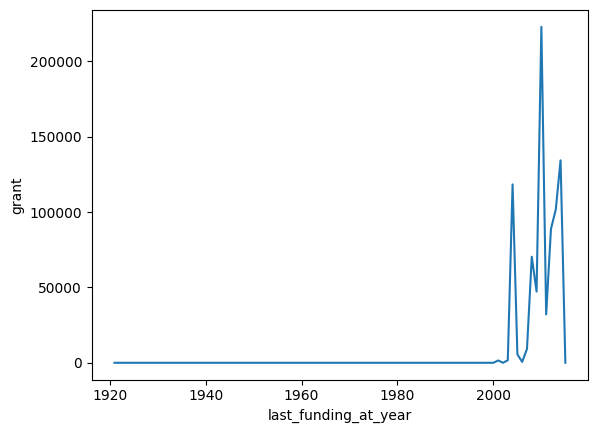

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Private Equity Funds

1. Private equity (PE) funding is a way to invest in private companies that are not publicly traded.
2. PE funds are pools of capital that are managed by a private equity firm, and investors contribute capital to become limited partners in the fund.


Average and Total Analysis of the Private Equity Funds as shown below.

In [ ]:
column ='private_equity'

<Axes: xlabel='private_equity', ylabel='category_list'>

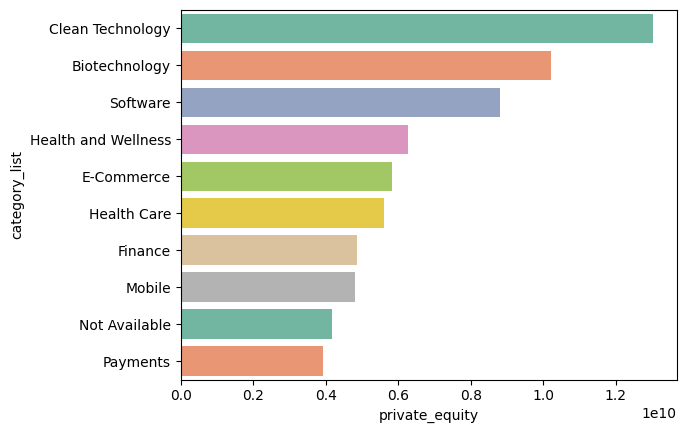

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='private_equity', ylabel='category_list'>

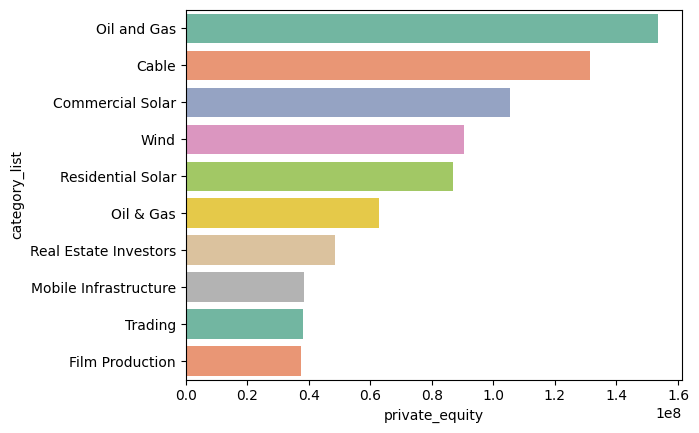

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='private_equity', ylabel=' market '>

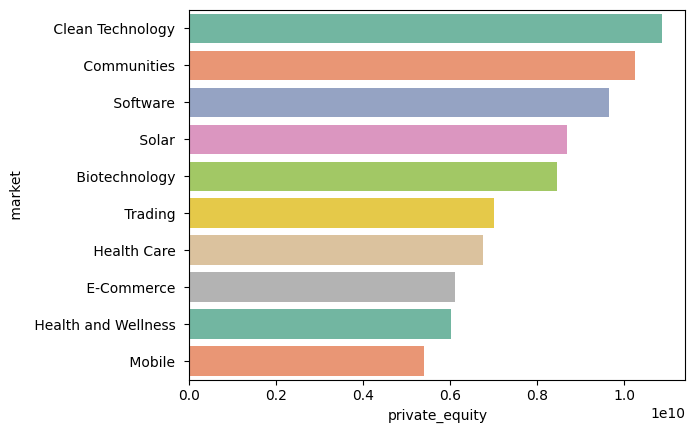

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='private_equity', ylabel=' market '>

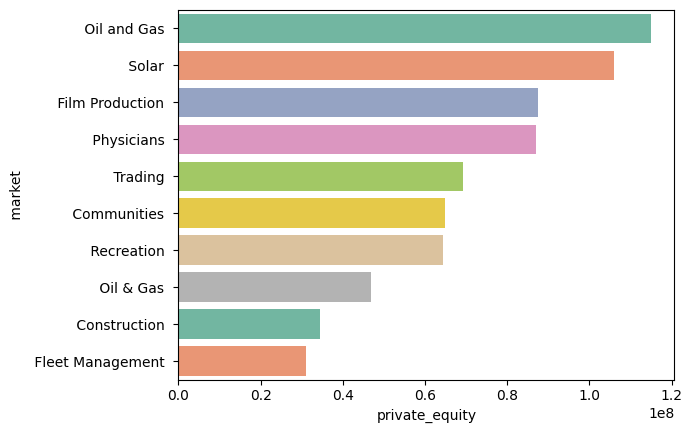

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='private_equity', ylabel='status'>

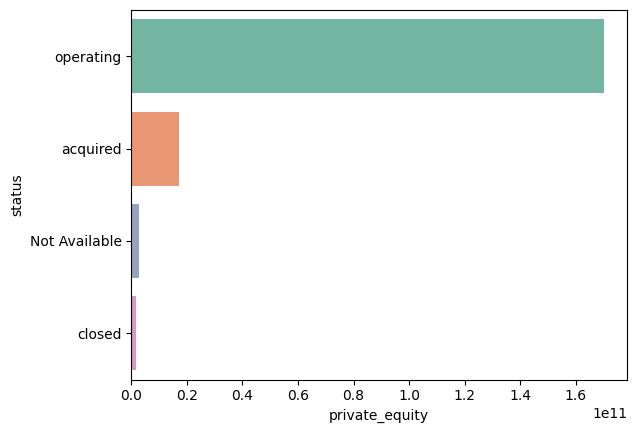

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='private_equity', ylabel='status'>

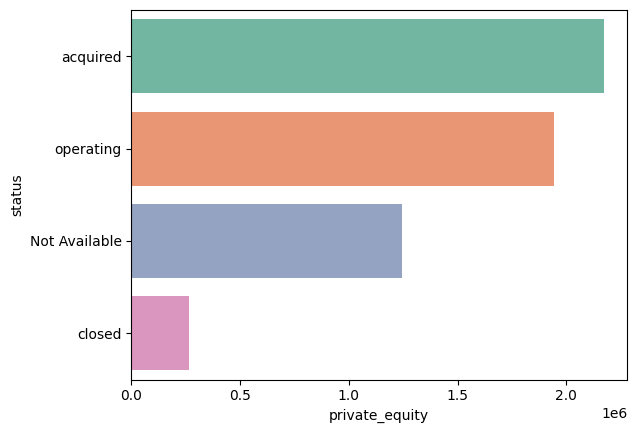

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='private_equity', ylabel='country_code'>

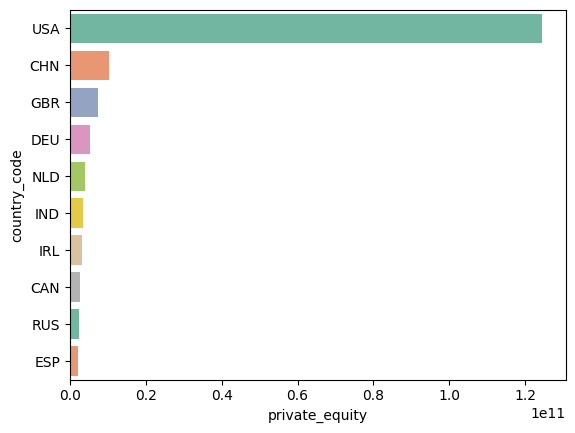

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='private_equity', ylabel='country_code'>

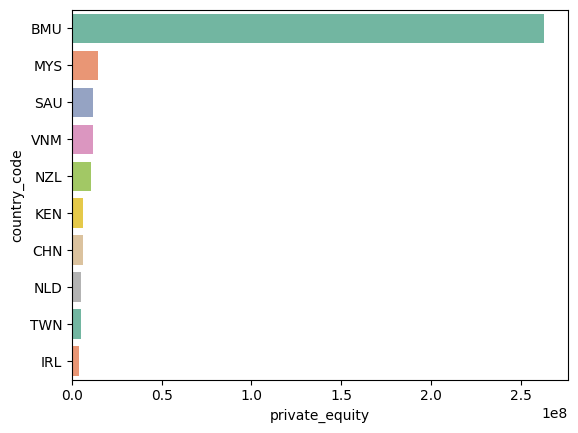

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='private_equity', ylabel='state_code'>

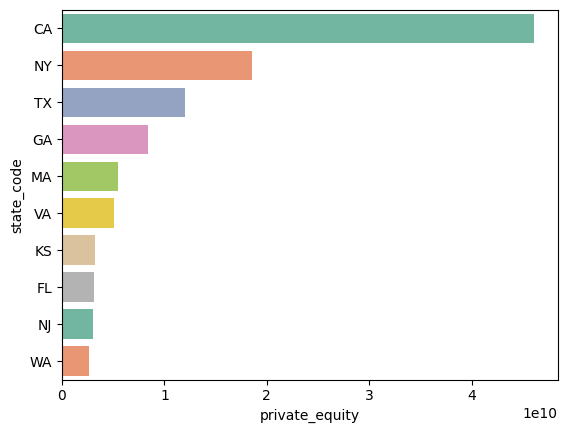

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='private_equity', ylabel='state_code'>

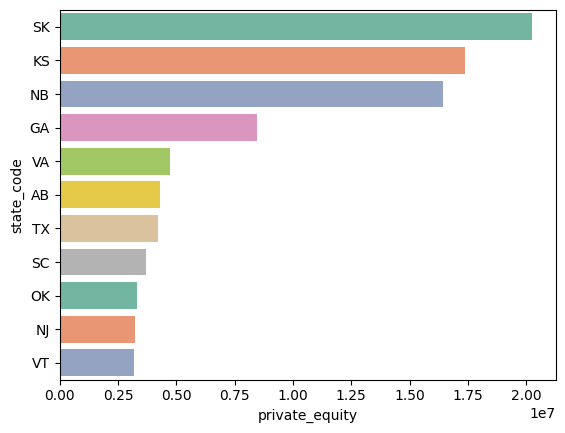

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='private_equity', ylabel='region'>

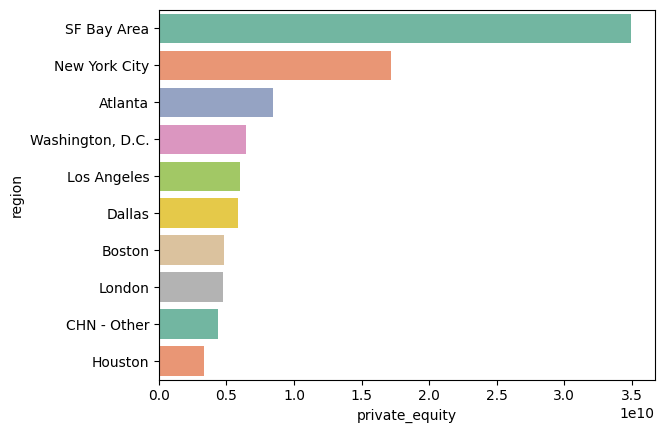

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='private_equity', ylabel='region'>

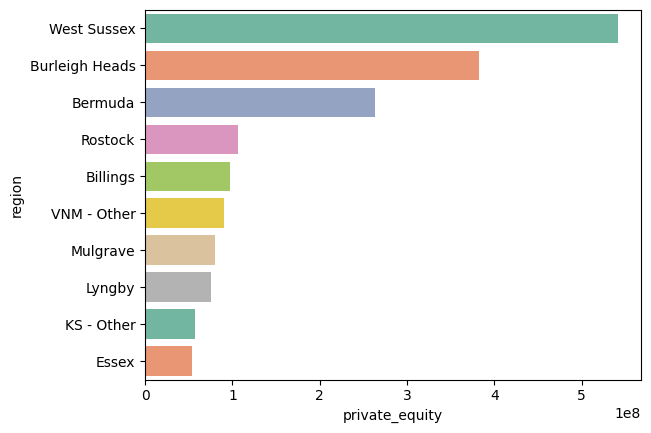

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='private_equity'>

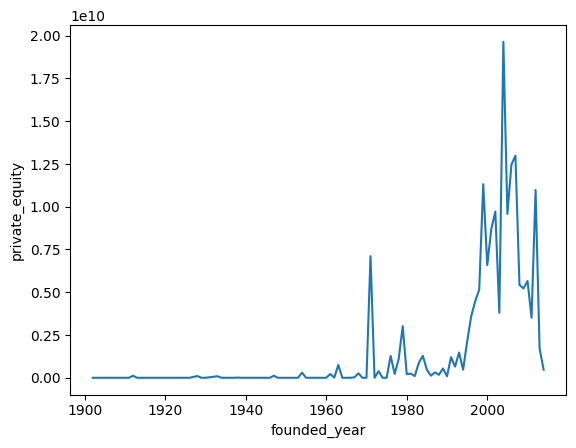

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='private_equity'>

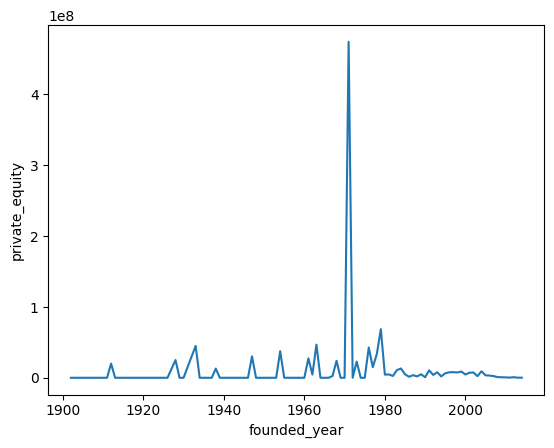

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='private_equity'>

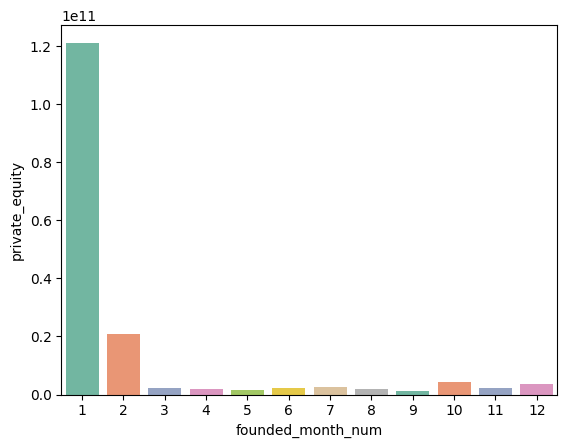

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='private_equity'>

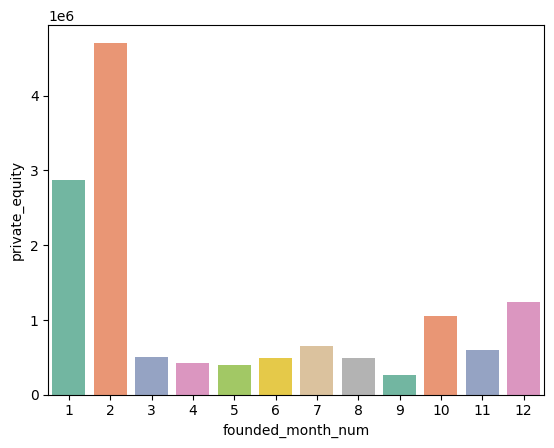

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='private_equity'>

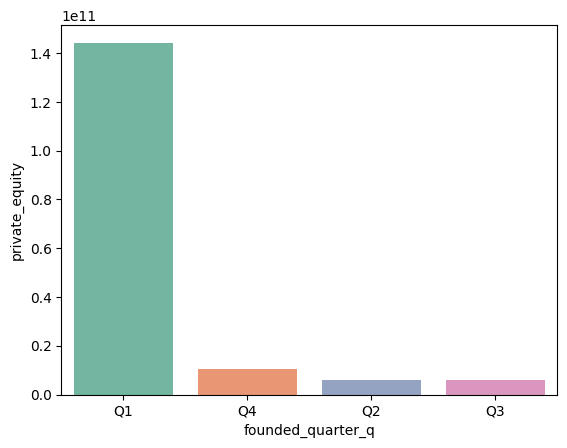

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='private_equity'>

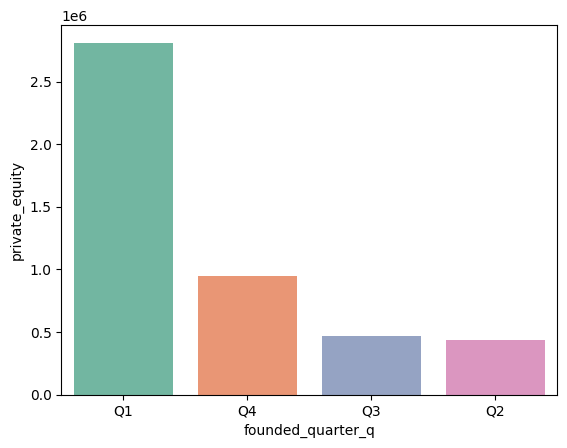

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='private_equity'>

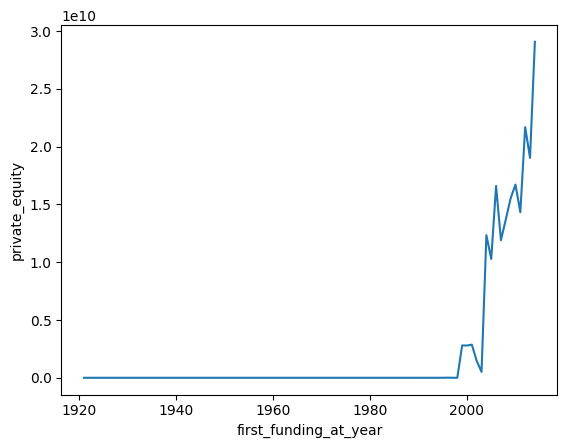

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='private_equity'>

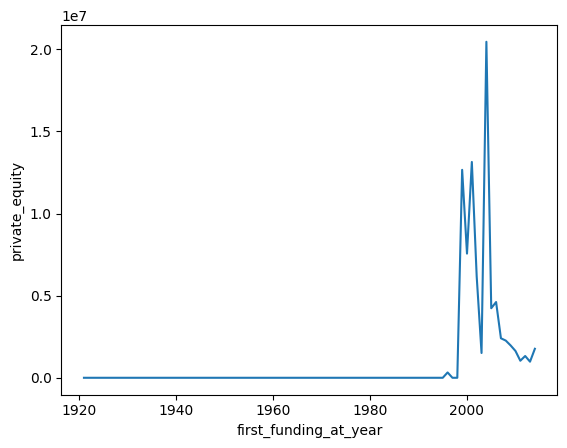

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='private_equity'>

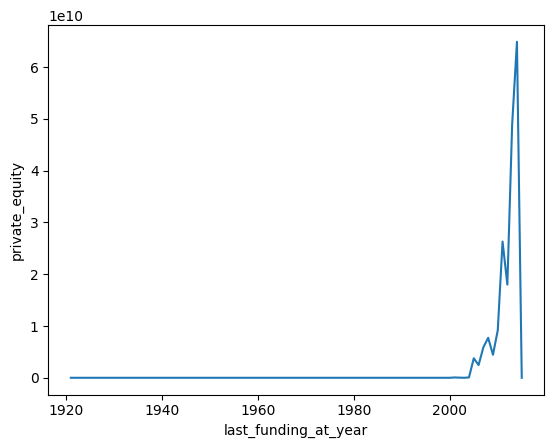

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='private_equity'>

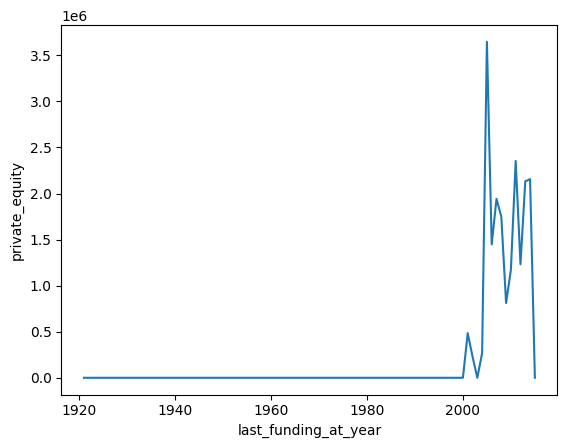

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Post IPO Equity Funds

1. Post-IPO equity funding is when a company invests in another company after it has gone public.
2. Shares that are eligible for trading on public stock exchanges after a successful initial public offering

Average and Total Analysis of the Post IPO Equity Funds as shown below.

In [ ]:
column ='post_ipo_equity'

<Axes: xlabel='post_ipo_equity', ylabel='category_list'>

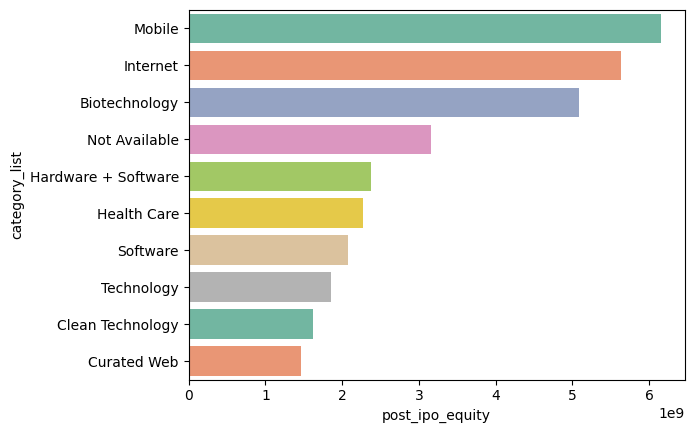

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='post_ipo_equity', ylabel='category_list'>

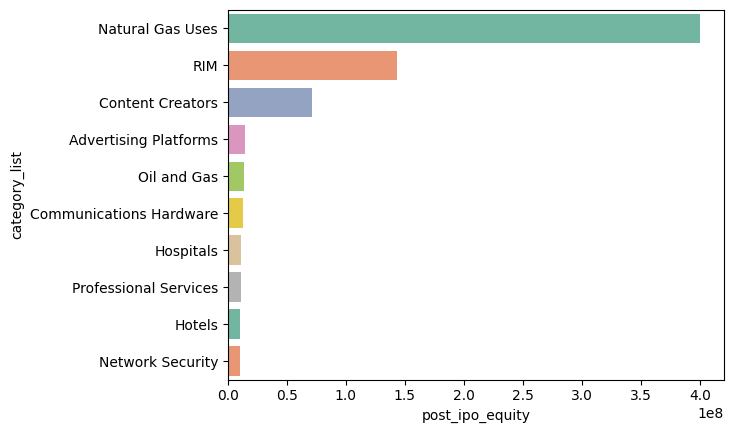

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='post_ipo_equity', ylabel=' market '>

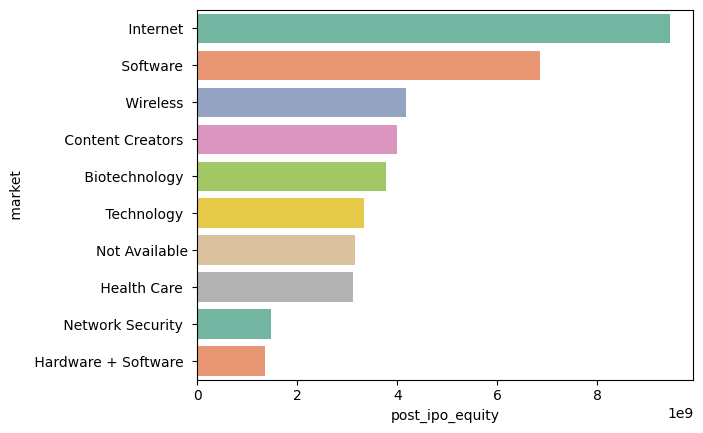

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='post_ipo_equity', ylabel=' market '>

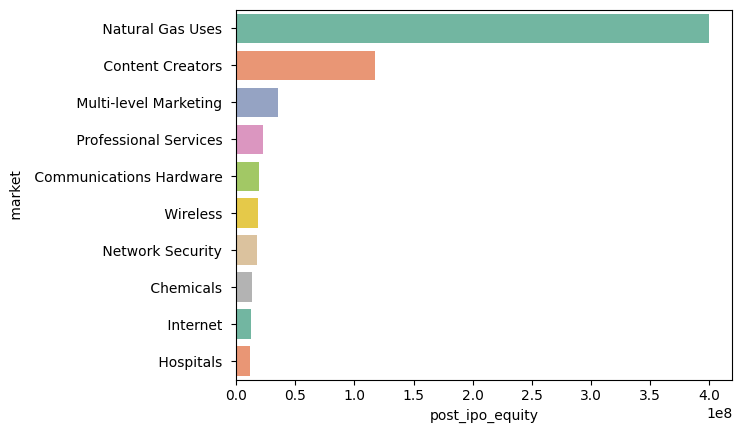

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='post_ipo_equity', ylabel='status'>

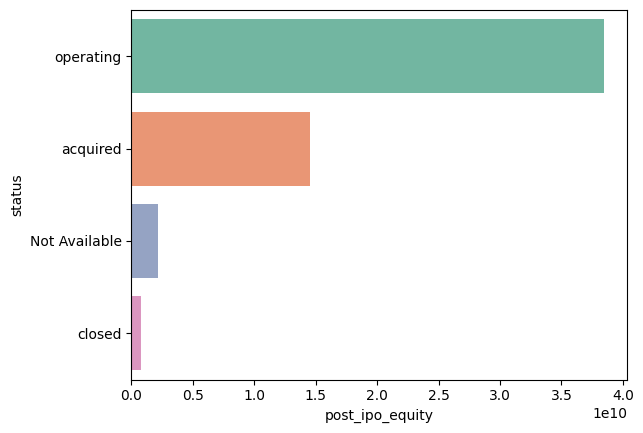

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='post_ipo_equity', ylabel='status'>

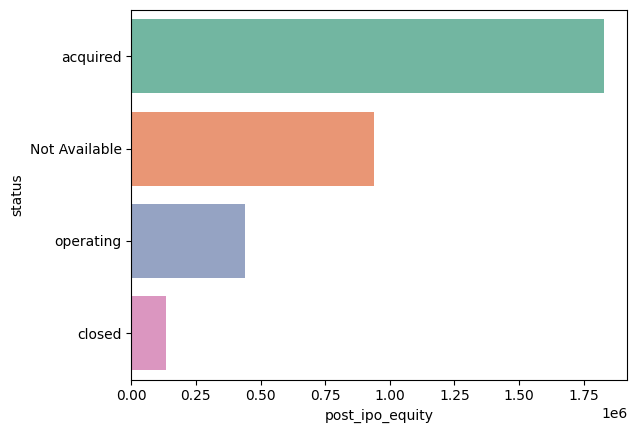

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='post_ipo_equity', ylabel='country_code'>

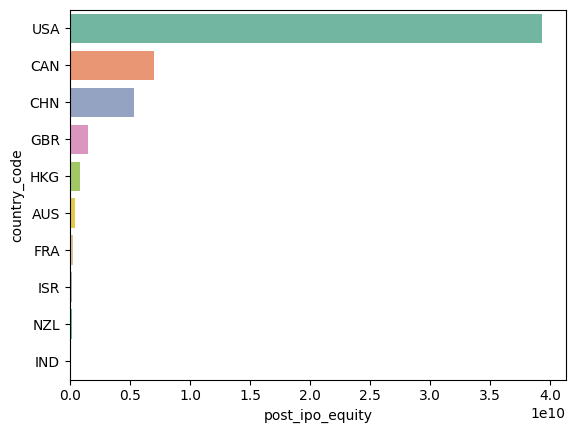

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='post_ipo_equity', ylabel='country_code'>

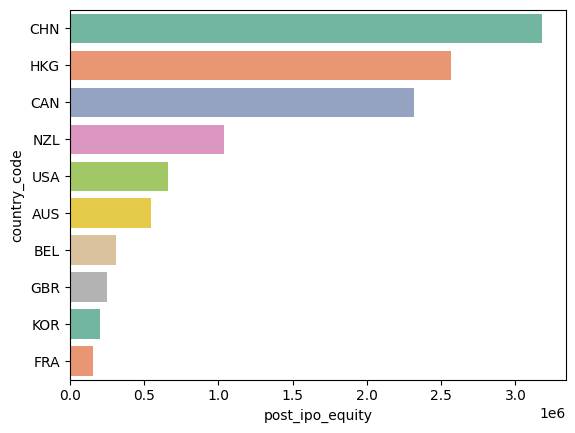

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='post_ipo_equity', ylabel='state_code'>

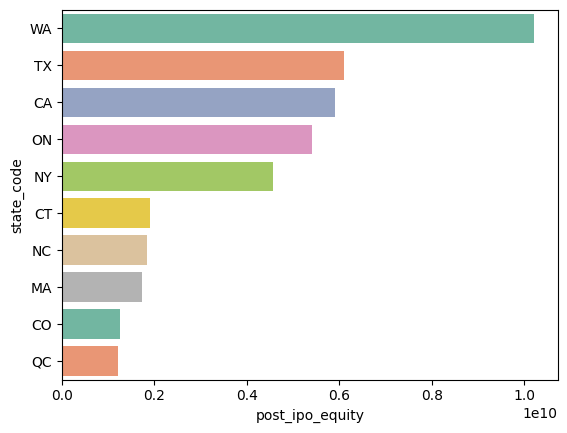

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='post_ipo_equity', ylabel='state_code'>

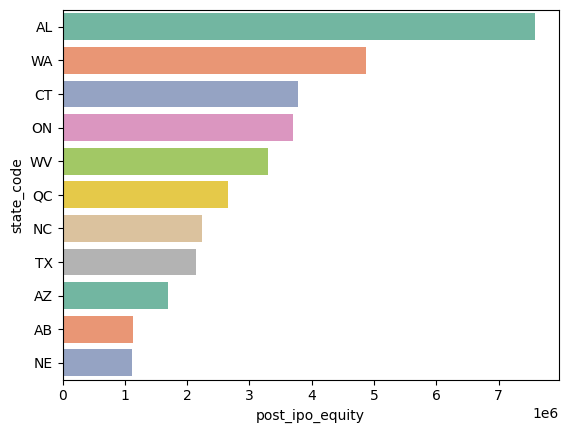

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='post_ipo_equity', ylabel='region'>

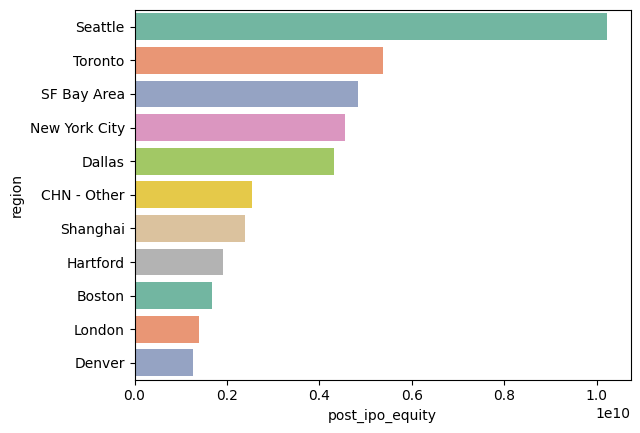

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='post_ipo_equity', ylabel='region'>

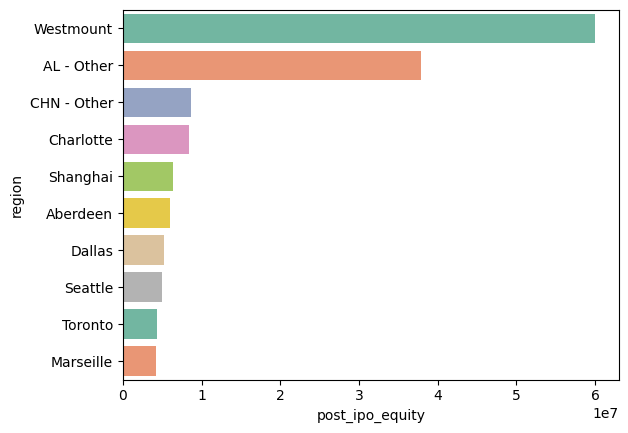

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='post_ipo_equity'>

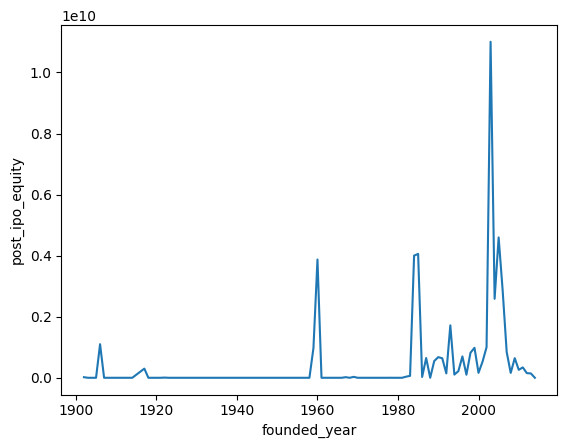

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='post_ipo_equity'>

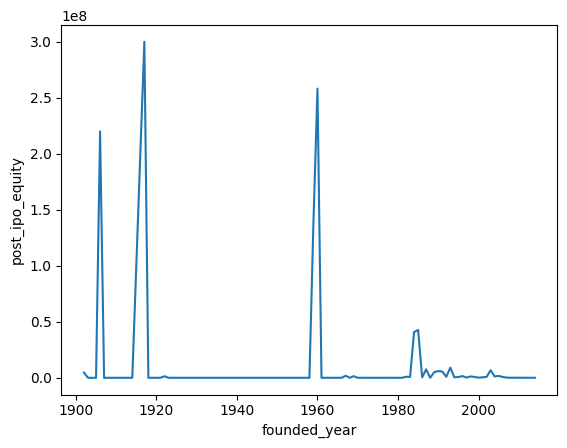

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='post_ipo_equity'>

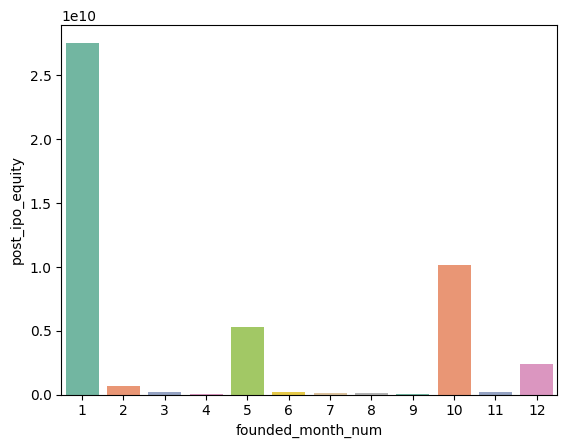

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='post_ipo_equity'>

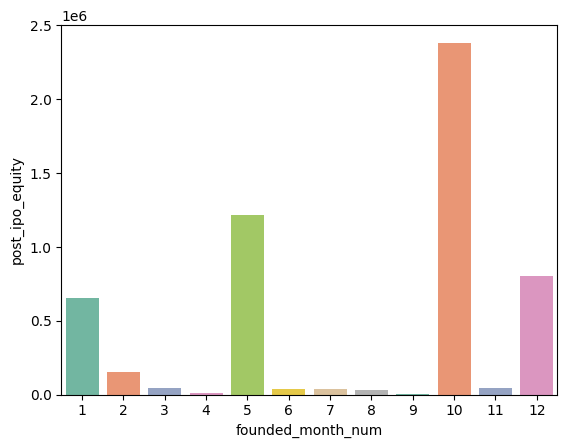

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='post_ipo_equity'>

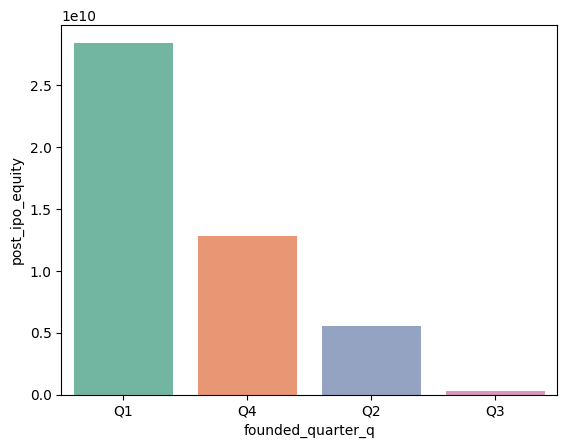

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='post_ipo_equity'>

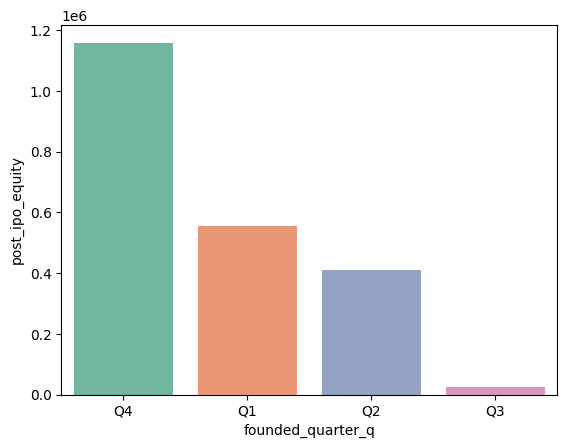

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='post_ipo_equity'>

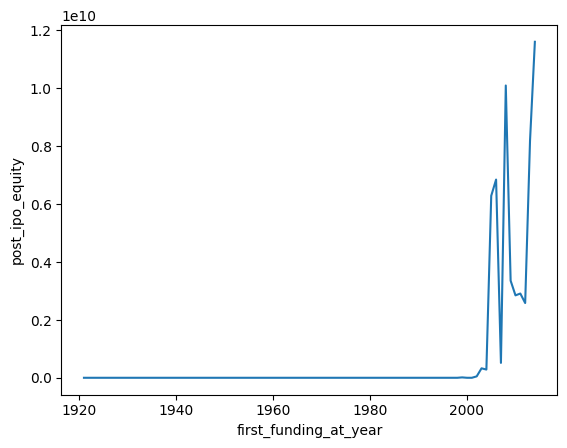

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='post_ipo_equity'>

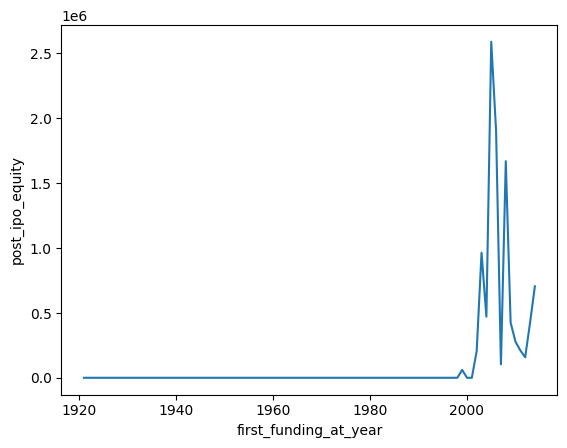

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='post_ipo_equity'>

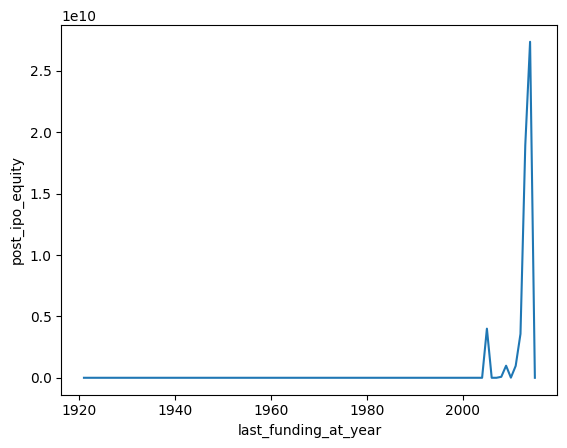

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='post_ipo_equity'>

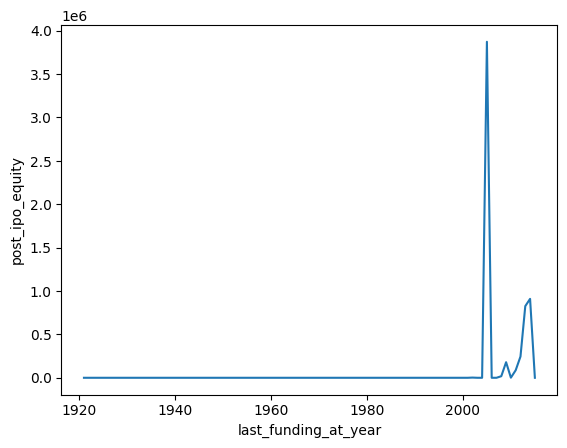

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Post IPO Debt Funds

1. Post-IPO debt funding is when a company borrows money from lenders after it has already gone public.
2. The company promises to repay the principal and interest on the debt, similar to debt financing.



Average and Total Analysis of the Post IPO Debt Funds as shown below.

In [ ]:
column ='post_ipo_debt'

<Axes: xlabel='post_ipo_debt', ylabel='category_list'>

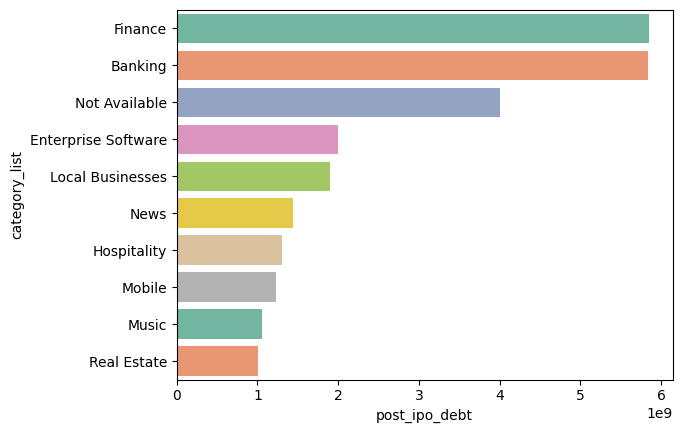

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='post_ipo_debt', ylabel='category_list'>

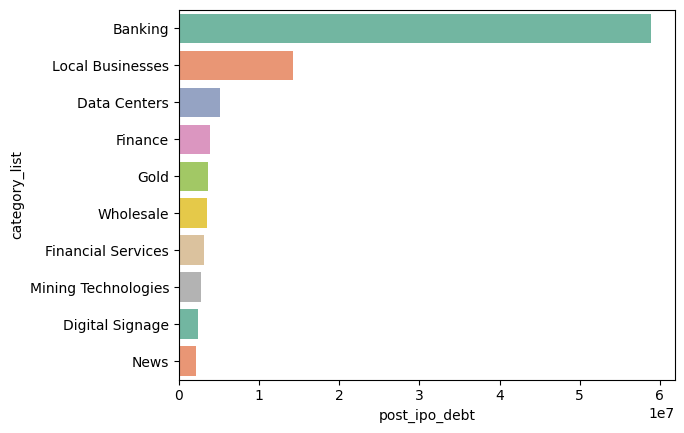

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='post_ipo_debt', ylabel=' market '>

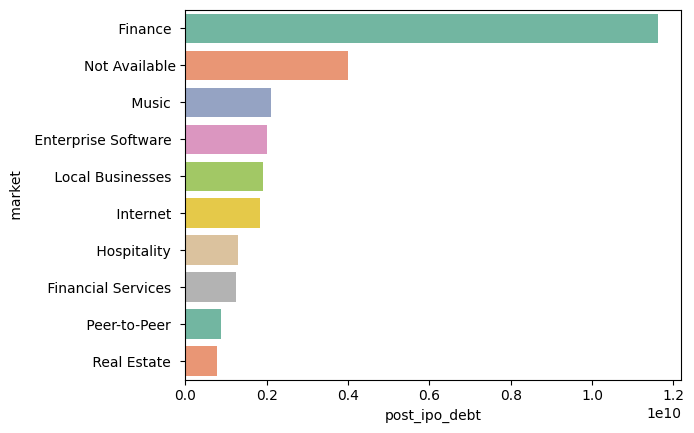

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='post_ipo_debt', ylabel=' market '>

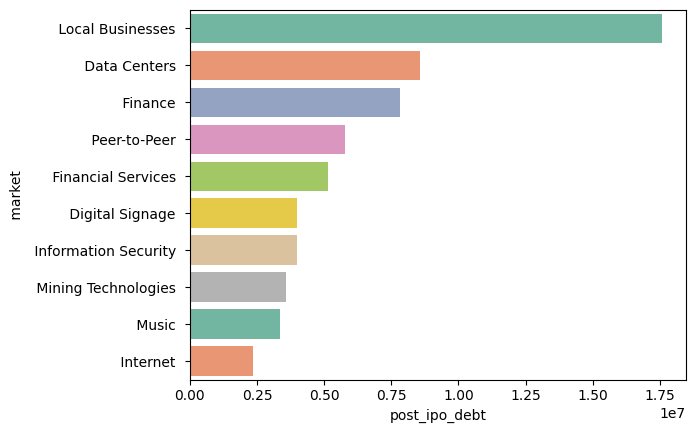

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='post_ipo_debt', ylabel='status'>

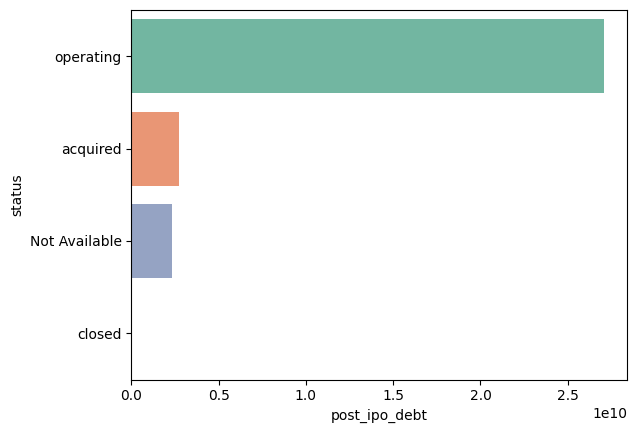

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='post_ipo_debt', ylabel='status'>

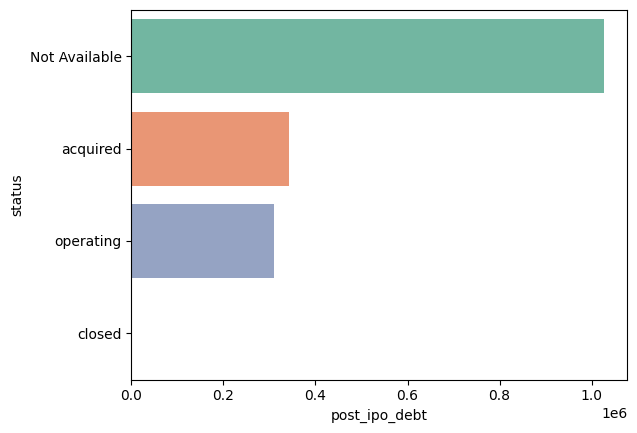

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='post_ipo_debt', ylabel='country_code'>

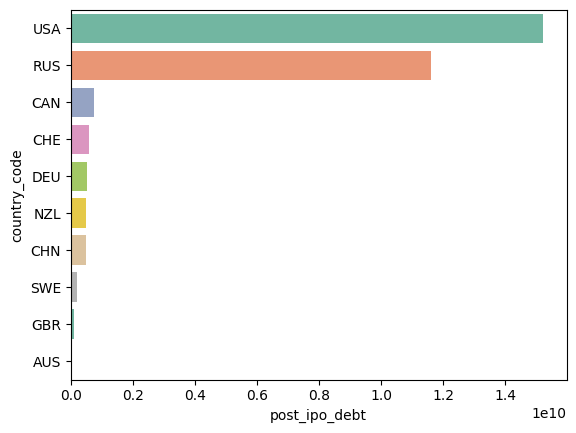

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='post_ipo_debt', ylabel='country_code'>

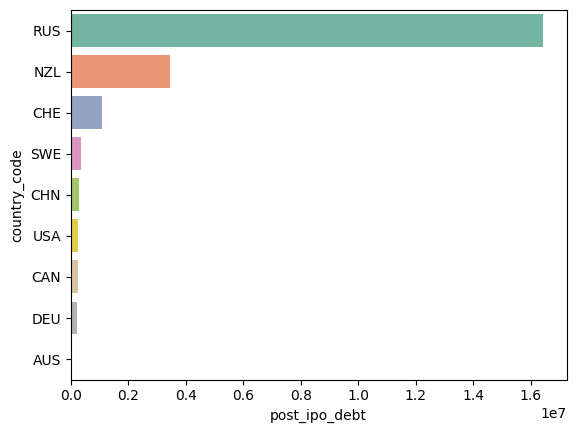

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='post_ipo_debt', ylabel='state_code'>

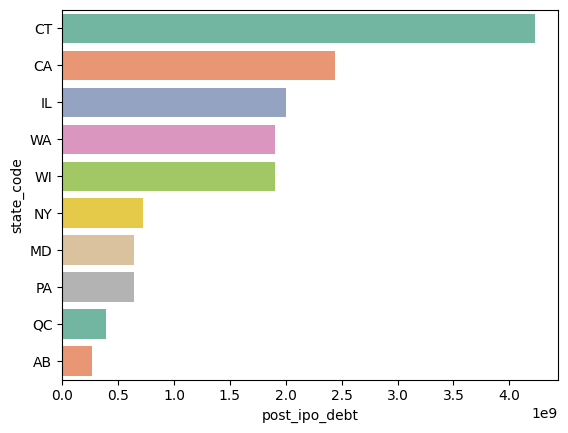

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='post_ipo_debt', ylabel='state_code'>

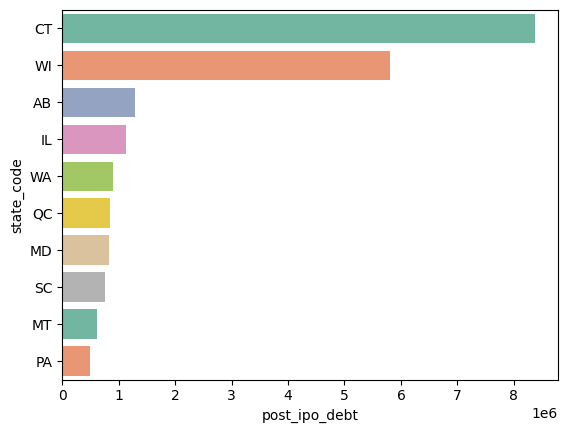

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='post_ipo_debt', ylabel='region'>

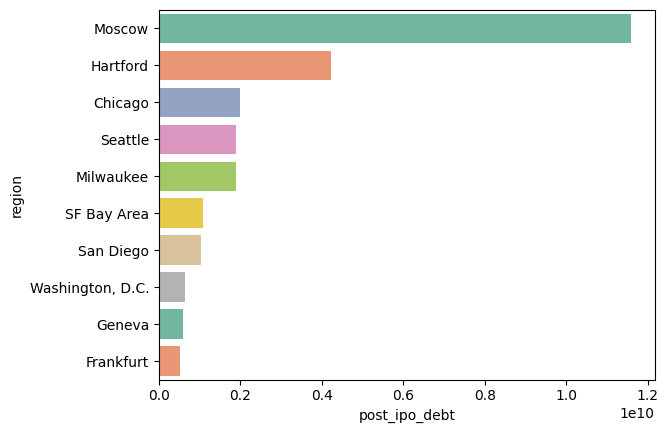

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='post_ipo_debt', ylabel='region'>

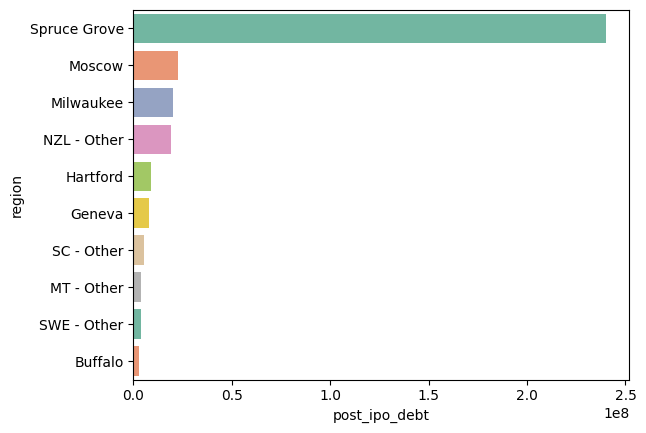

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='founded_year', ylabel='post_ipo_debt'>

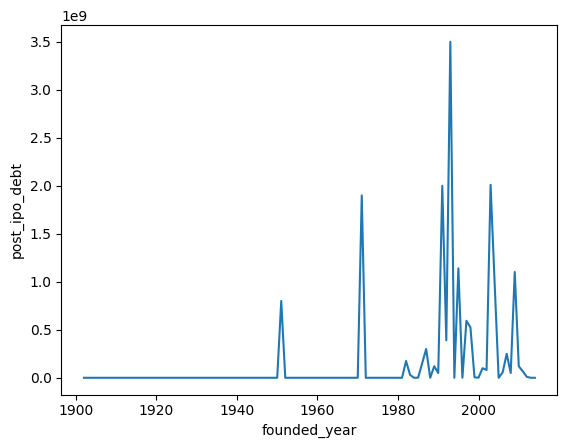

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='founded_year', ylabel='post_ipo_debt'>

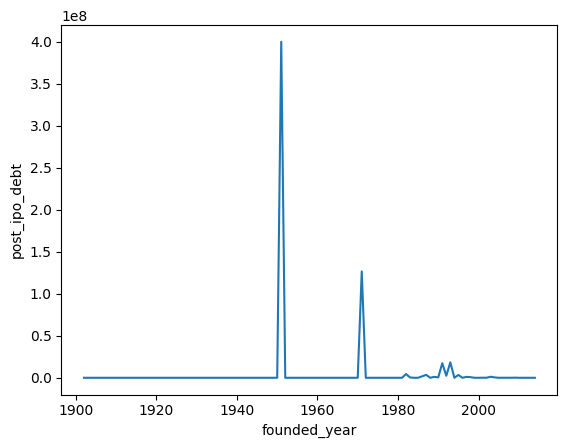

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='founded_month_num', ylabel='post_ipo_debt'>

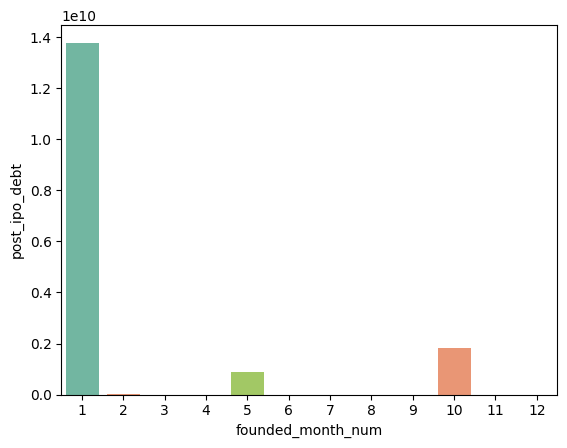

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='founded_month_num', ylabel='post_ipo_debt'>

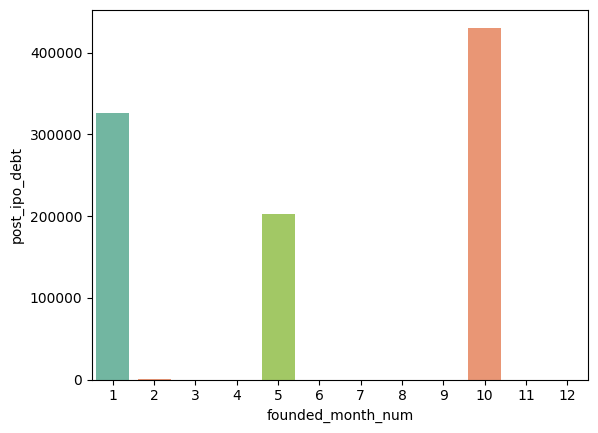

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='founded_quarter_q', ylabel='post_ipo_debt'>

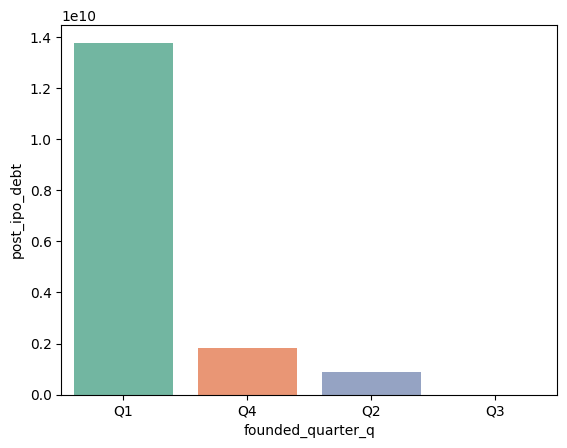

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='founded_quarter_q', ylabel='post_ipo_debt'>

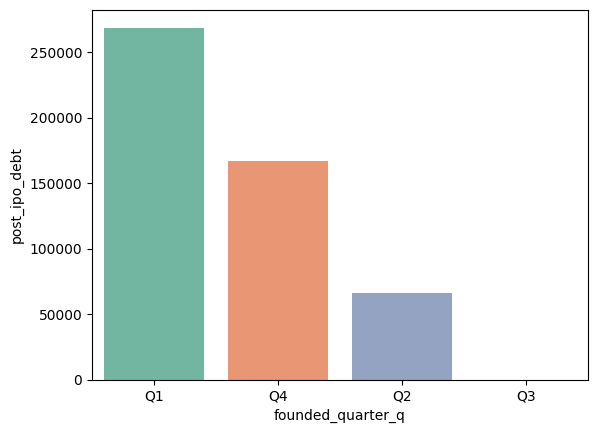

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='first_funding_at_year', ylabel='post_ipo_debt'>

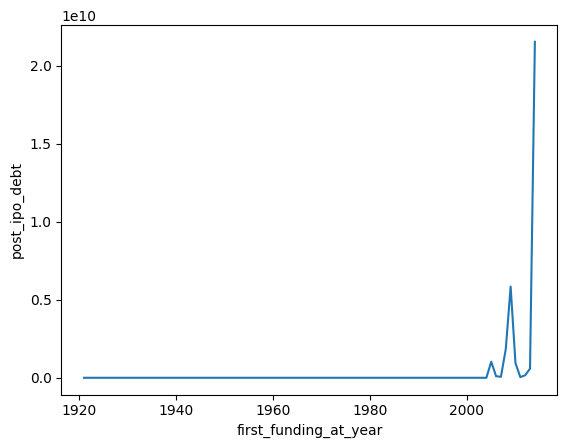

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='first_funding_at_year', ylabel='post_ipo_debt'>

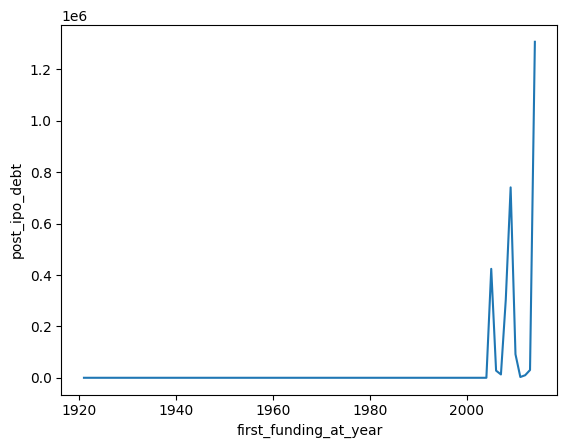

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='first_funding_at_month', ylabel='post_ipo_debt'>

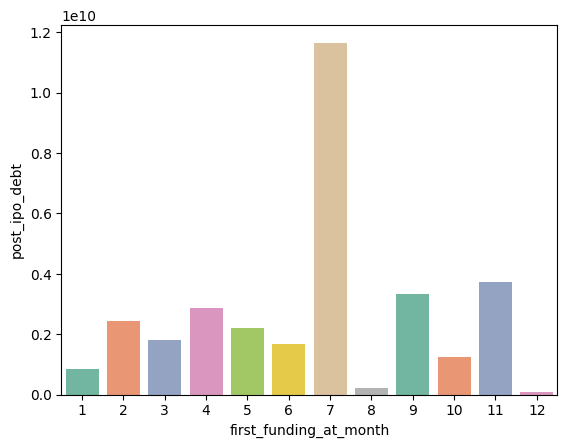

In [ ]:
df_plot = df_clean.groupby('first_funding_at_month').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
sns.barplot(y=df_plot[column], x=df_plot['first_funding_at_month'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='first_funding_at_month', ylabel='post_ipo_debt'>

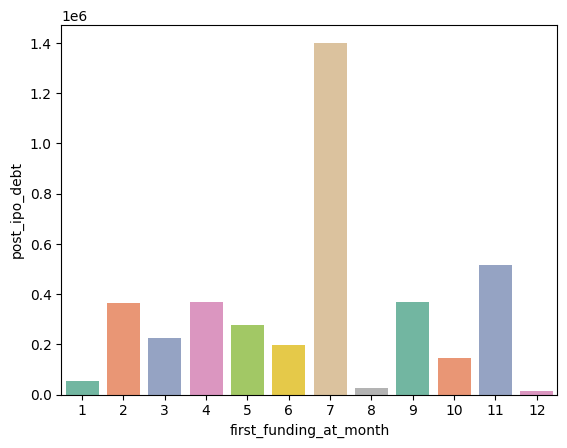

In [ ]:
df_plot = df_clean.groupby('first_funding_at_month').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
sns.barplot(y=df_plot[column], x=df_plot['first_funding_at_month'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='last_funding_at_year', ylabel='post_ipo_debt'>

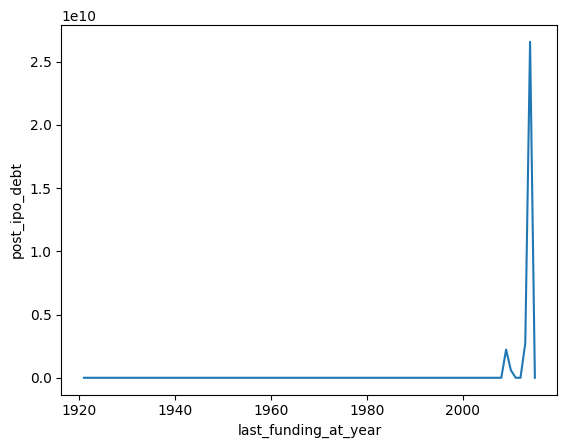

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='last_funding_at_year', ylabel='post_ipo_debt'>

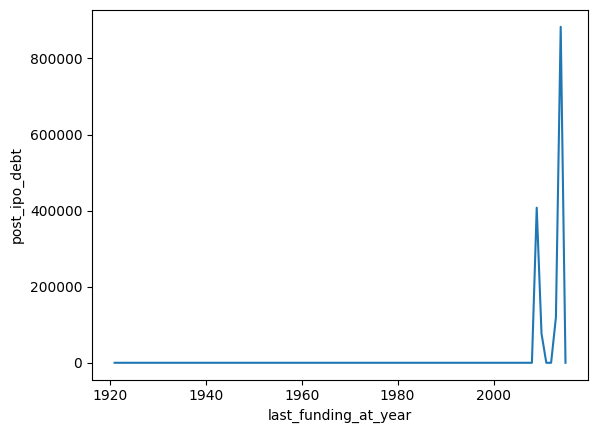

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='last_funding_at_month', ylabel='post_ipo_debt'>

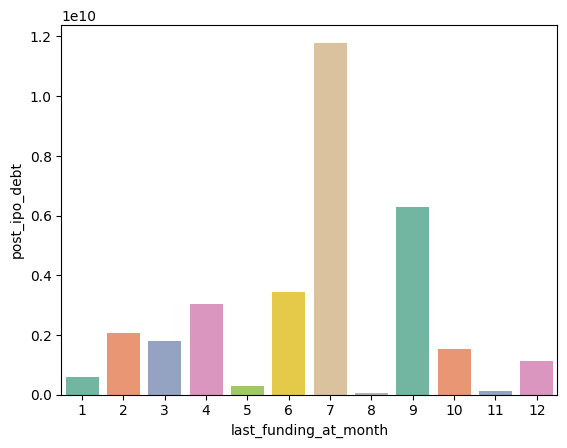

In [ ]:
df_plot = df_clean.groupby('last_funding_at_month').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
sns.barplot(y=df_plot[column], x=df_plot['last_funding_at_month'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

<Axes: xlabel='last_funding_at_month', ylabel='post_ipo_debt'>

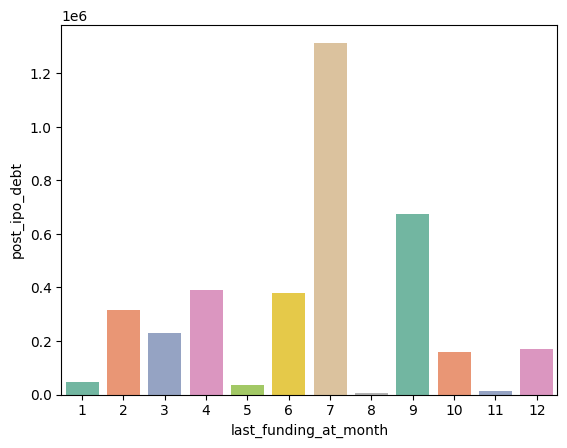

In [ ]:
df_plot = df_clean.groupby('last_funding_at_month').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
sns.barplot(y=df_plot[column], x=df_plot['last_funding_at_month'],palette='Set2')

Insights: From the plot of top 10 categories Biotechnology have the largest number of avergae funding rounds.

## Secondary Market Funds

1. Secondary market funding is the buying and selling of previously issued securities in a financial market, also known as the aftermarket.
2. The secondary market is different from the primary market, where the issuer sells securities directly to a purchaser.


Average and Total Analysis of the Secondary Market Funds as shown below.

In [ ]:
column ='secondary_market'

<Axes: xlabel='secondary_market', ylabel='category_list'>

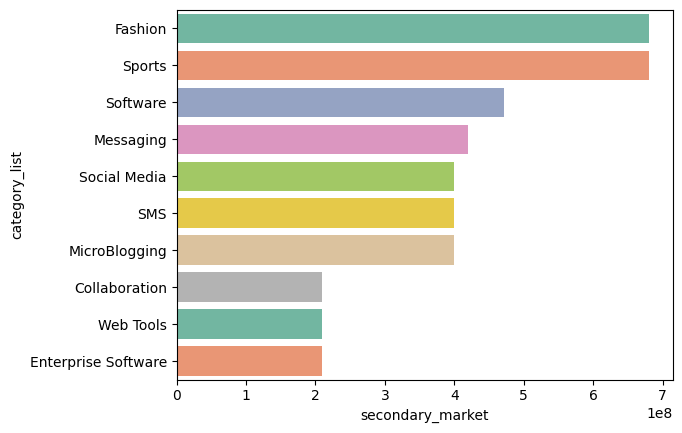

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='secondary_market', ylabel='category_list'>

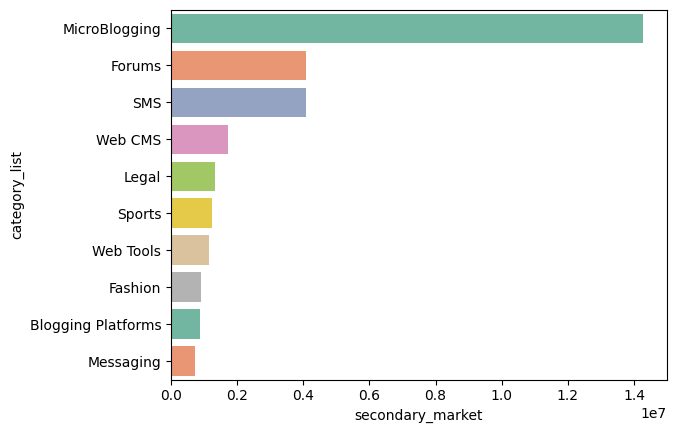

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='secondary_market', ylabel=' market '>

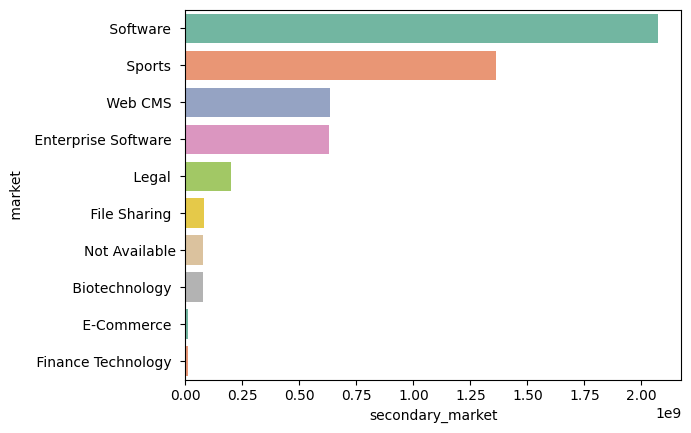

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='secondary_market', ylabel=' market '>

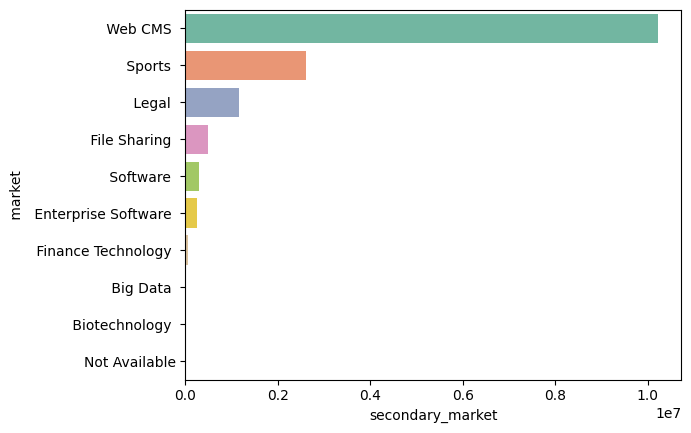

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='secondary_market', ylabel='status'>

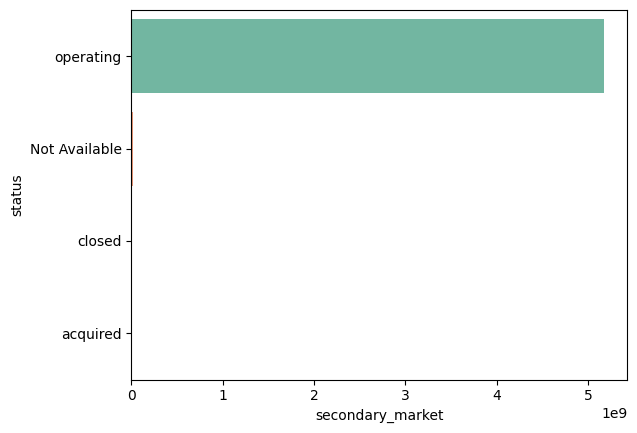

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='secondary_market', ylabel='status'>

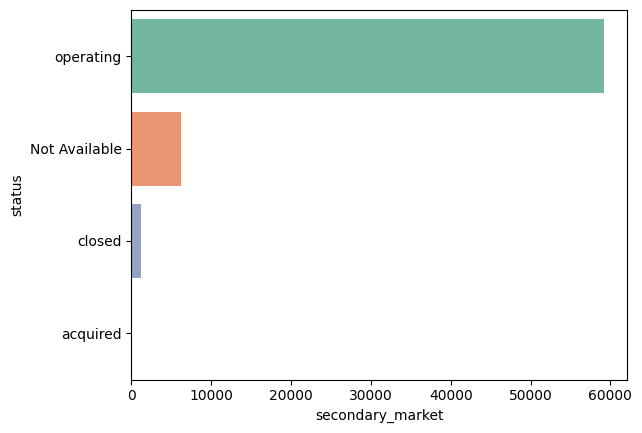

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='secondary_market', ylabel='country_code'>

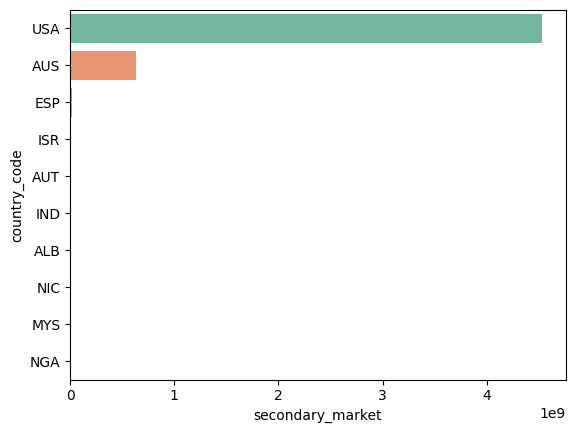

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='secondary_market', ylabel='country_code'>

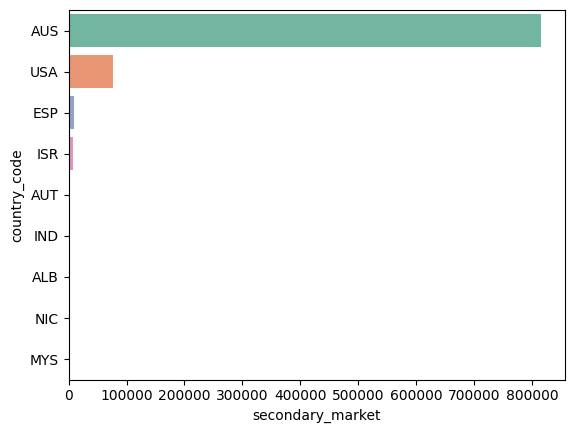

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='secondary_market', ylabel='state_code'>

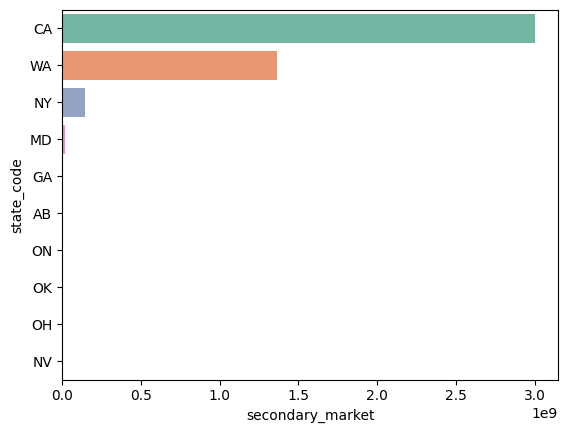

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='secondary_market', ylabel='state_code'>

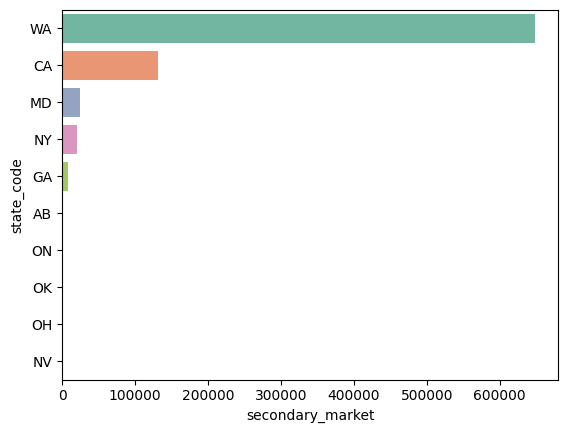

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='secondary_market', ylabel='region'>

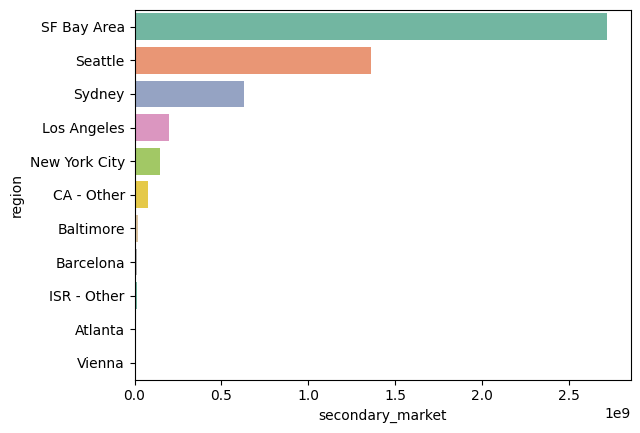

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='secondary_market', ylabel='region'>

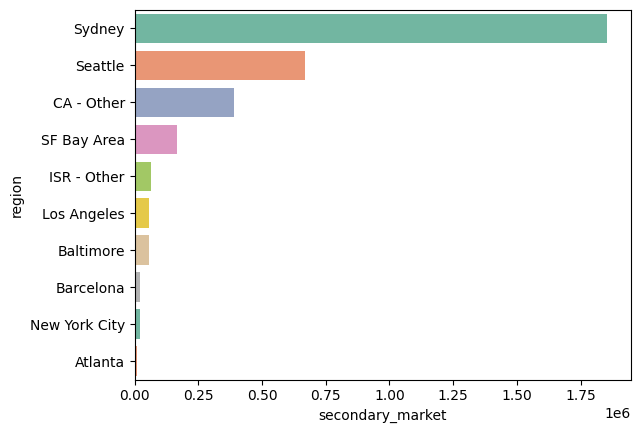

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='secondary_market'>

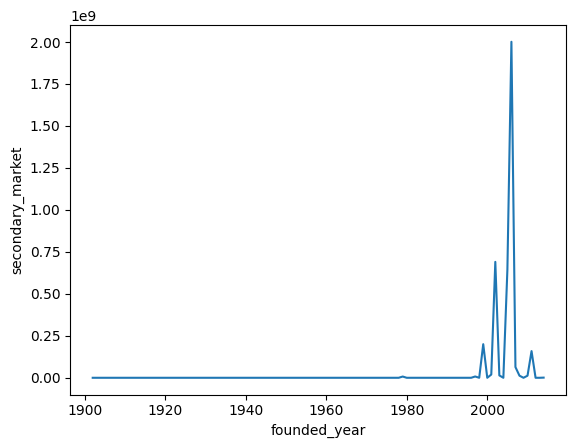

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='secondary_market'>

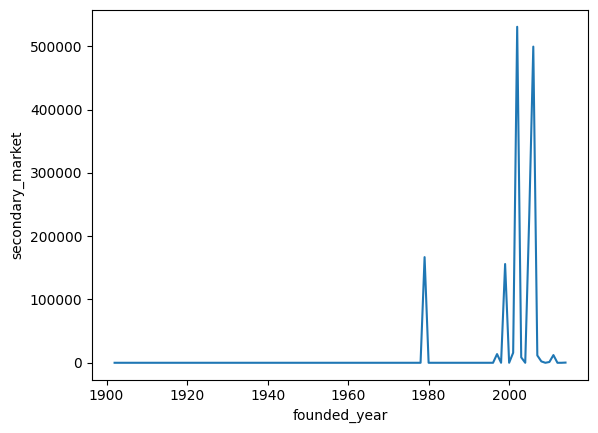

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='secondary_market'>

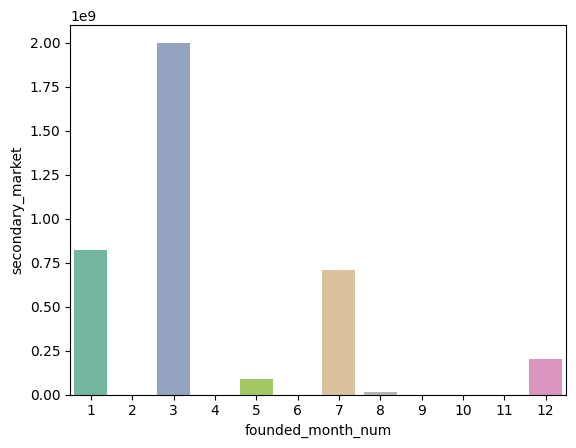

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='secondary_market'>

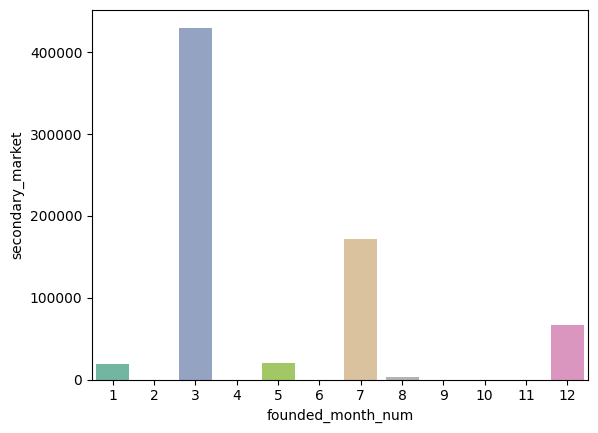

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='secondary_market'>

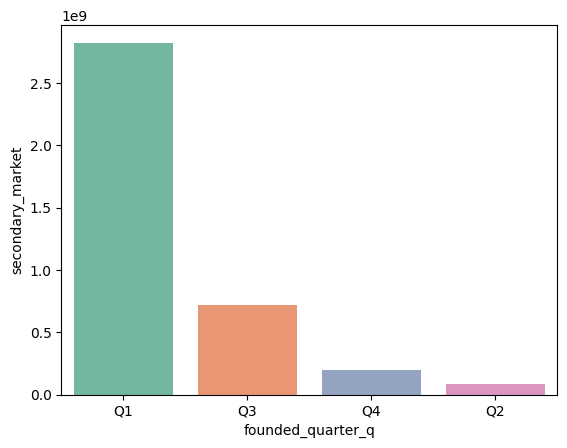

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='secondary_market'>

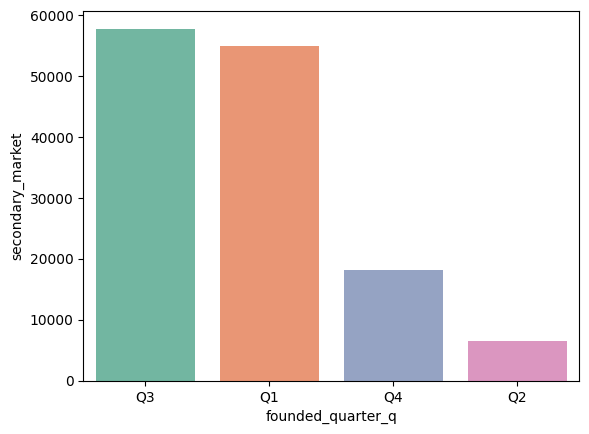

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='secondary_market'>

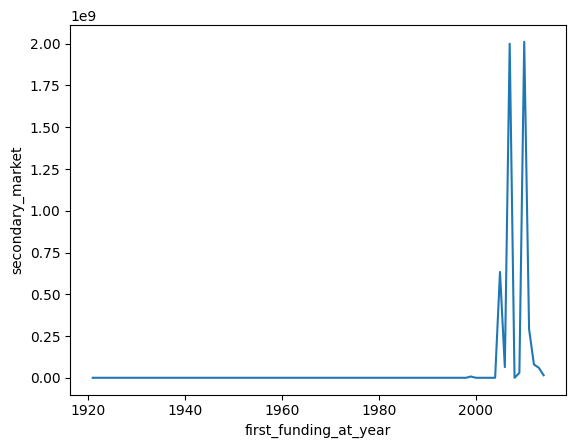

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='secondary_market'>

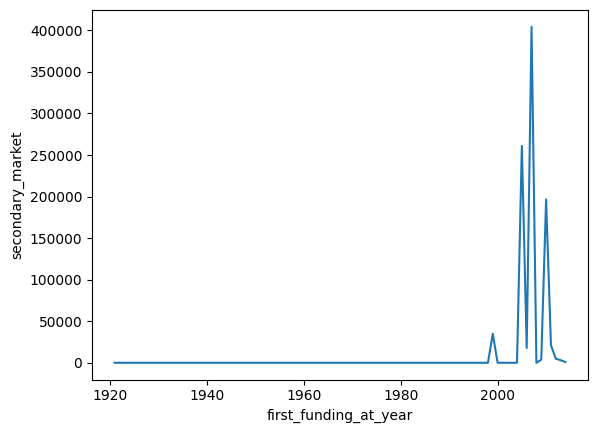

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='secondary_market'>

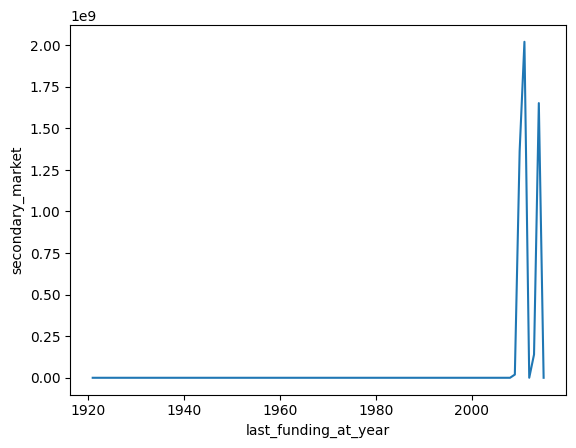

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='secondary_market'>

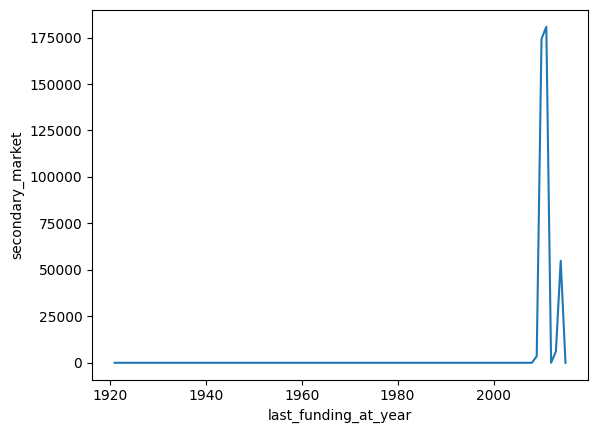

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Product Crowdfunding

1. Product crowdfunding is a way to raise money from many people to fund the development, manufacturing, and distribution of a product.
2. It's a way for entrepreneurs to access alternative funding sources and build a community around their product


Average and Total Analysis of the Product CrowdFunded Funds as shown below.

In [ ]:
column ='product_crowdfunding'

<Axes: xlabel='product_crowdfunding', ylabel='category_list'>

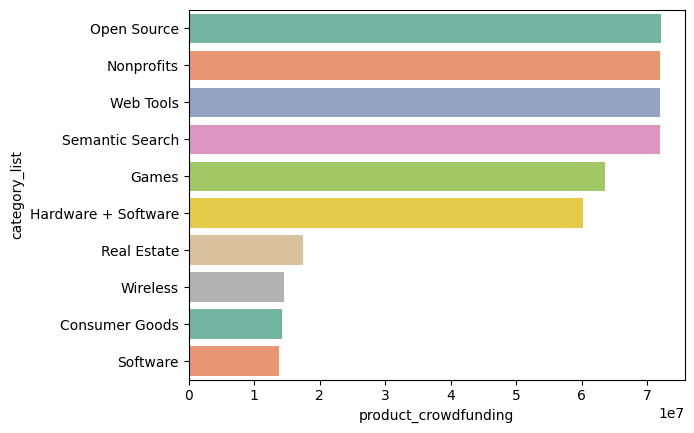

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='product_crowdfunding', ylabel='category_list'>

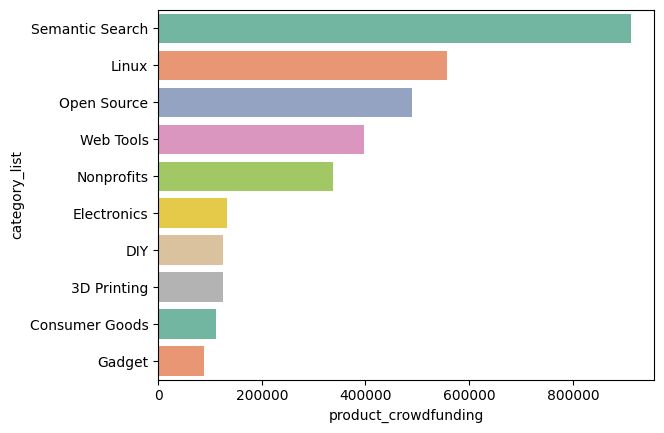

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='product_crowdfunding', ylabel=' market '>

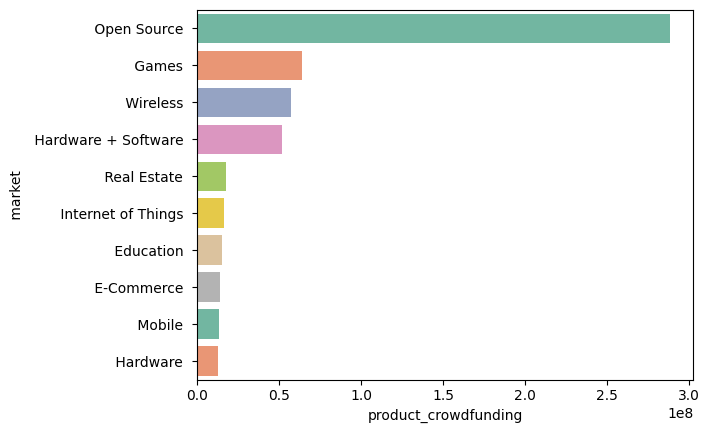

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='product_crowdfunding', ylabel=' market '>

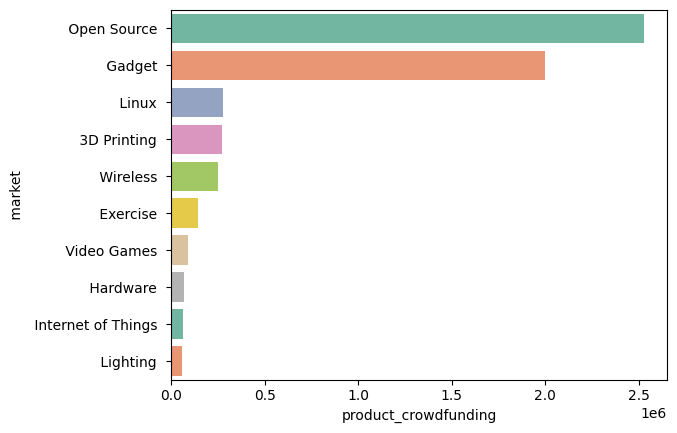

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='product_crowdfunding', ylabel='status'>

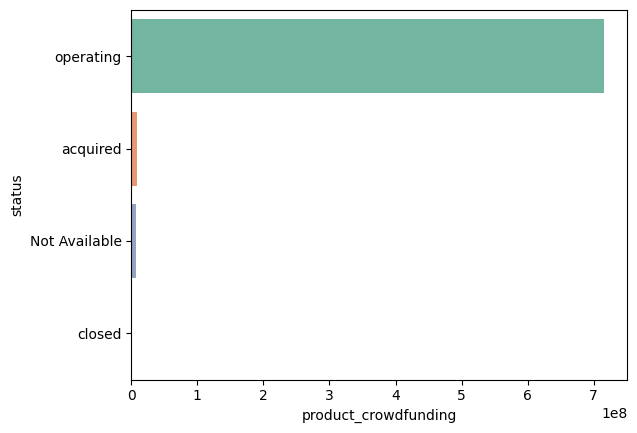

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='product_crowdfunding', ylabel='status'>

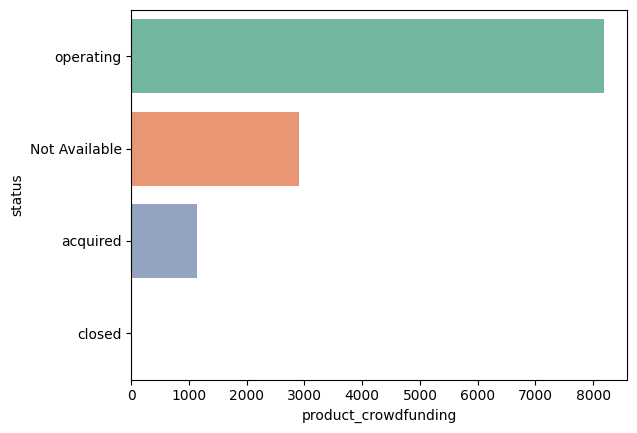

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='product_crowdfunding', ylabel='country_code'>

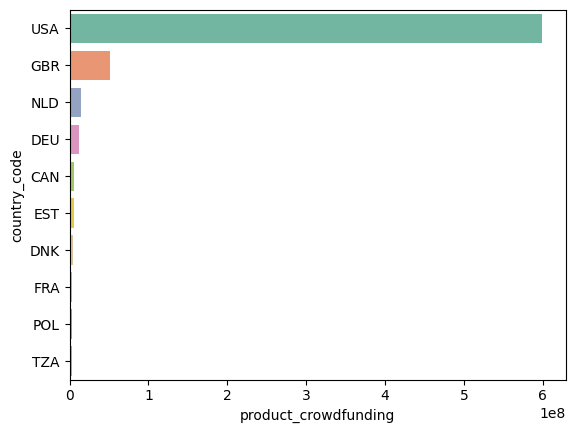

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='product_crowdfunding', ylabel='country_code'>

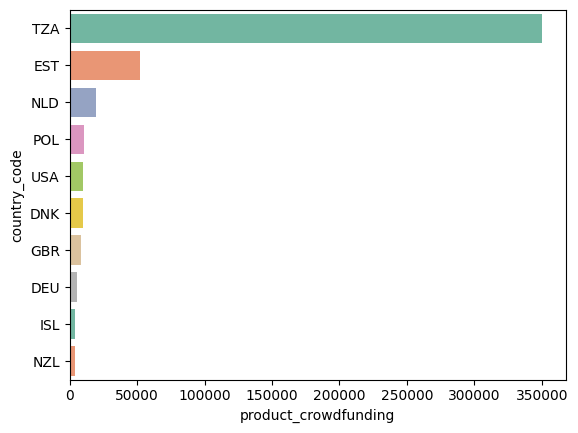

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='product_crowdfunding', ylabel='state_code'>

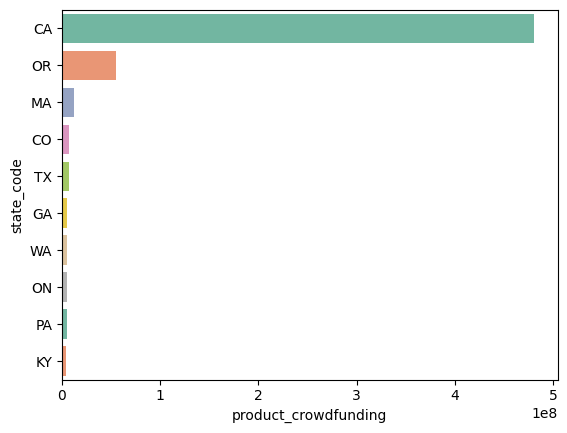

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='product_crowdfunding', ylabel='state_code'>

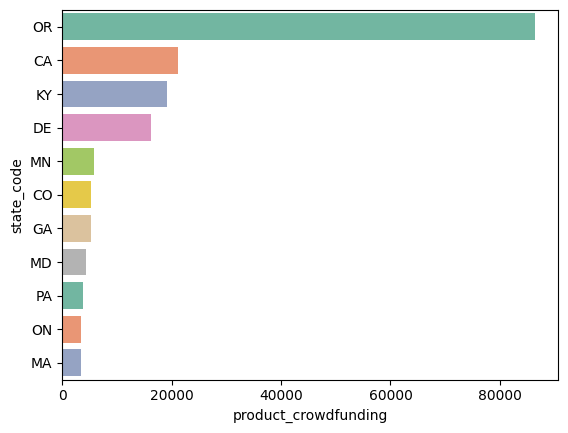

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='product_crowdfunding', ylabel='region'>

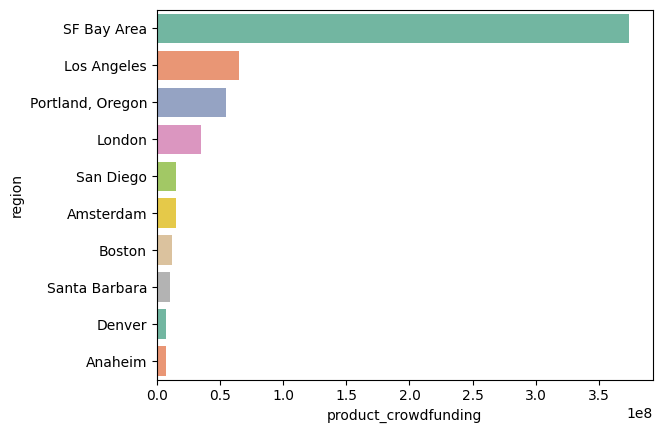

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='product_crowdfunding', ylabel='region'>

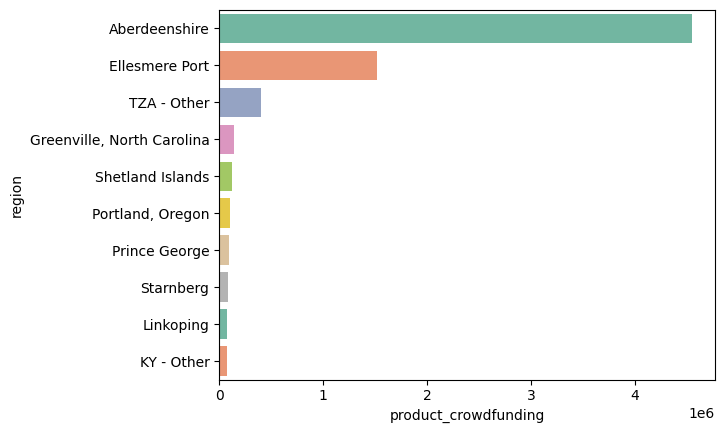

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='product_crowdfunding'>

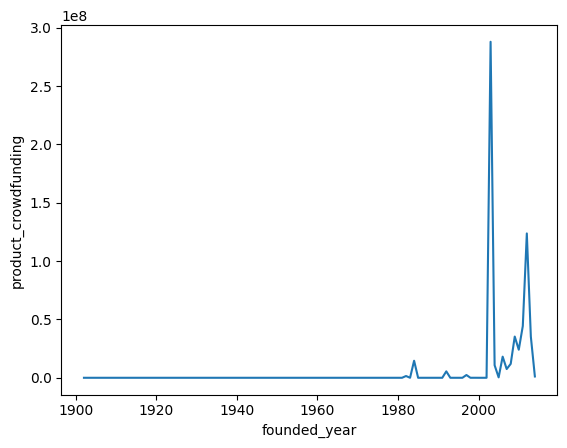

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='product_crowdfunding'>

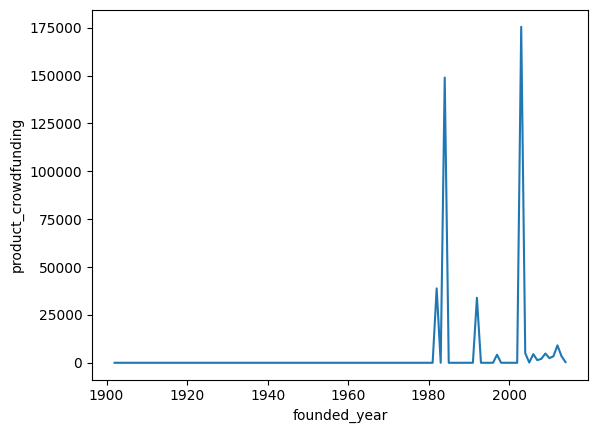

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='product_crowdfunding'>

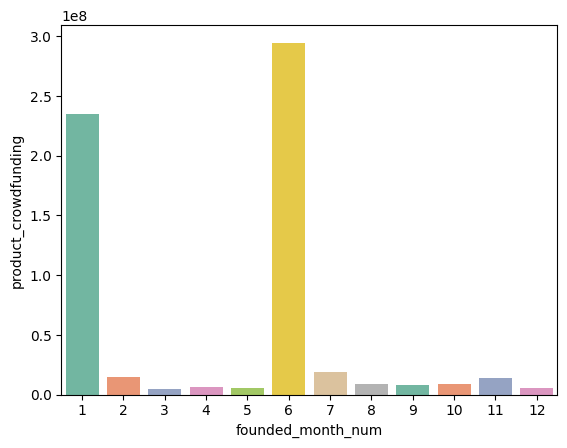

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='product_crowdfunding'>

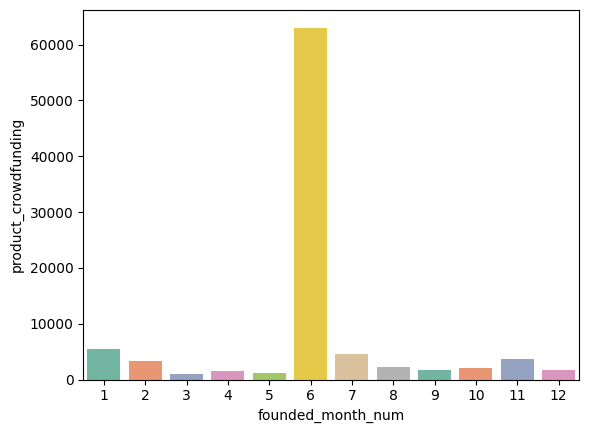

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='product_crowdfunding'>

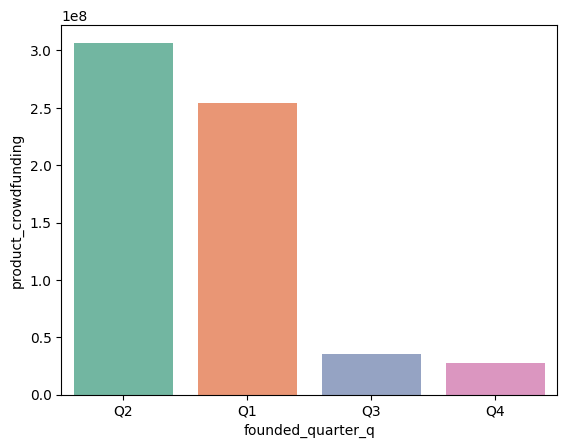

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='product_crowdfunding'>

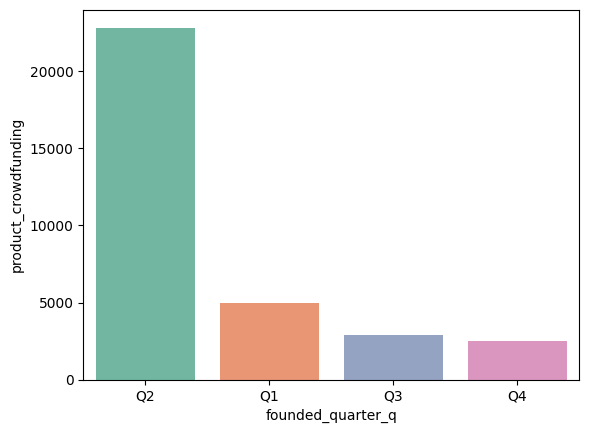

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='product_crowdfunding'>

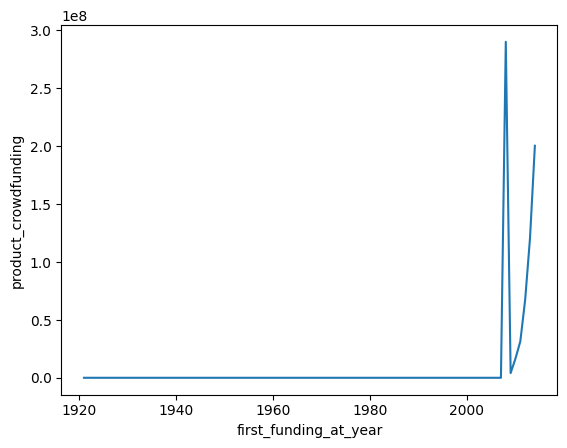

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='first_funding_at_year', ylabel='product_crowdfunding'>

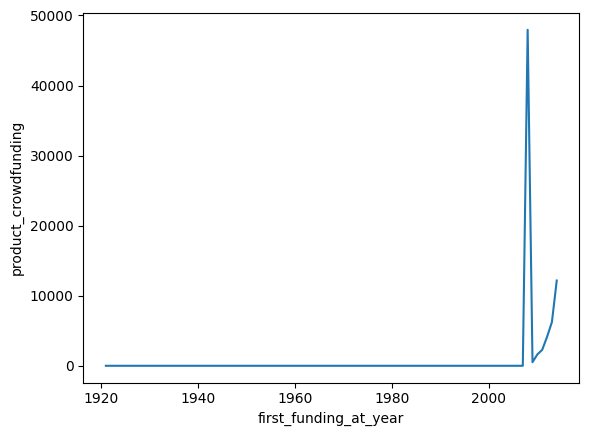

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='product_crowdfunding'>

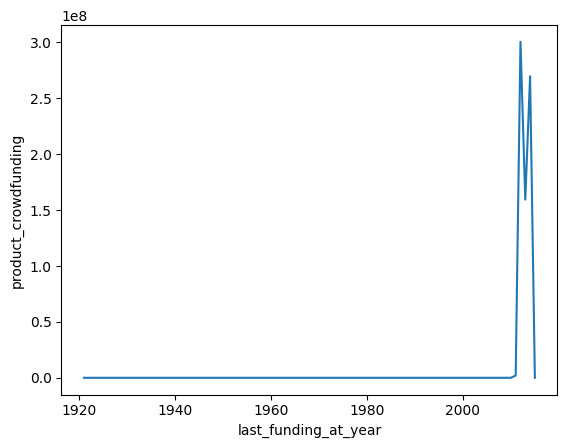

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='product_crowdfunding'>

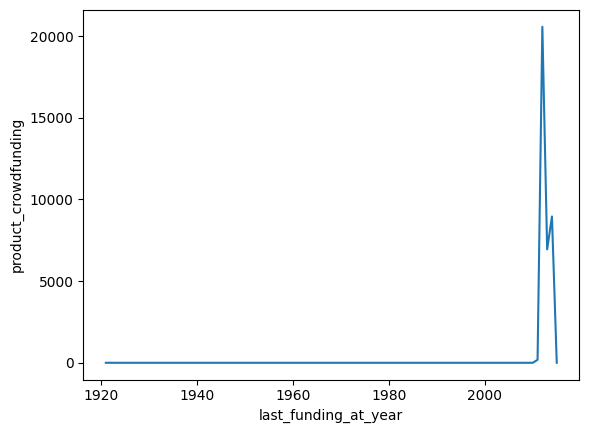

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Round_A

Average and Total Analysis of the Round A Funds as shown below.

In [ ]:
column ='round_A'

<Axes: xlabel='round_A', ylabel='category_list'>

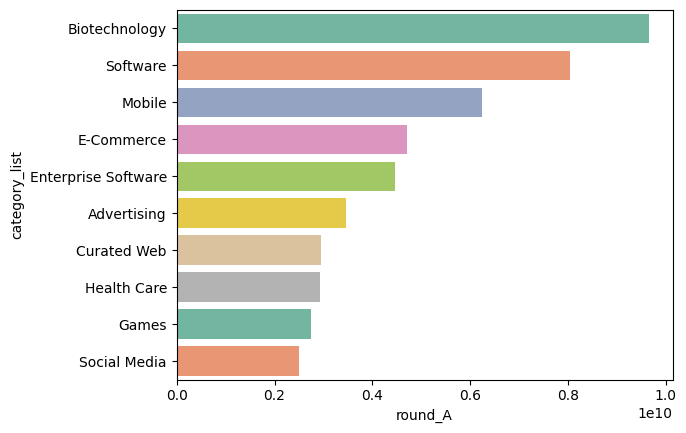

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_A', ylabel='category_list'>

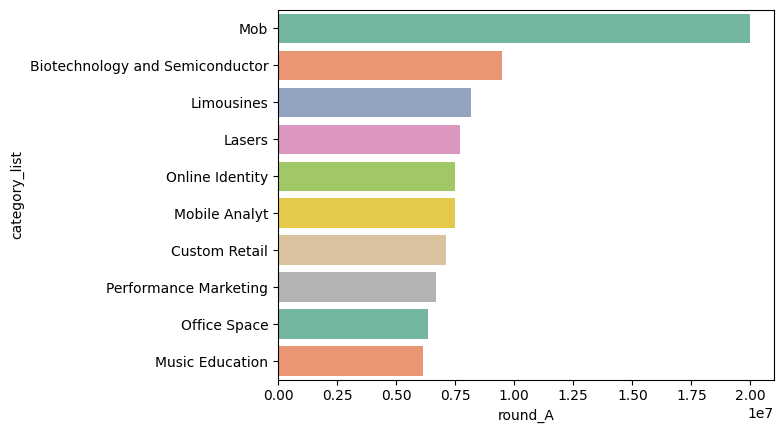

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_A', ylabel=' market '>

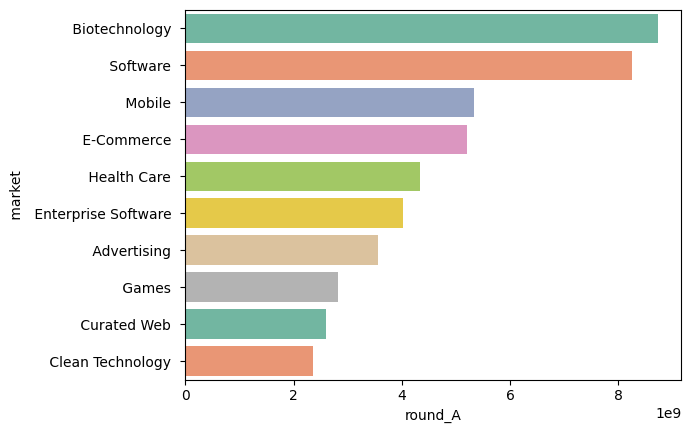

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_A', ylabel=' market '>

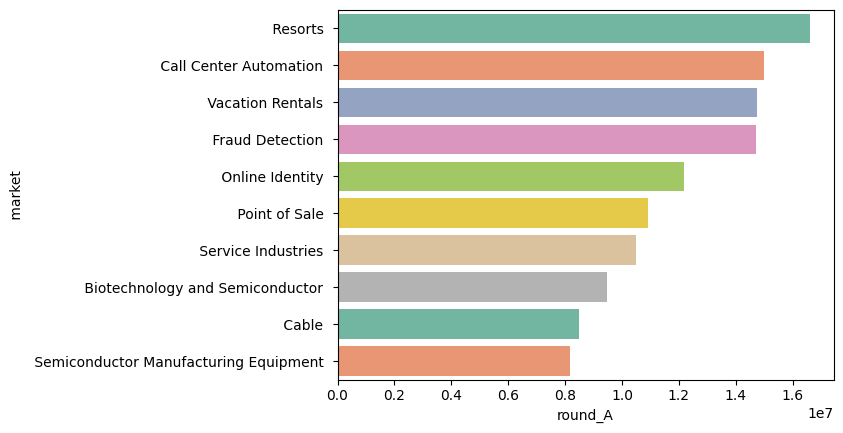

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_A', ylabel='status'>

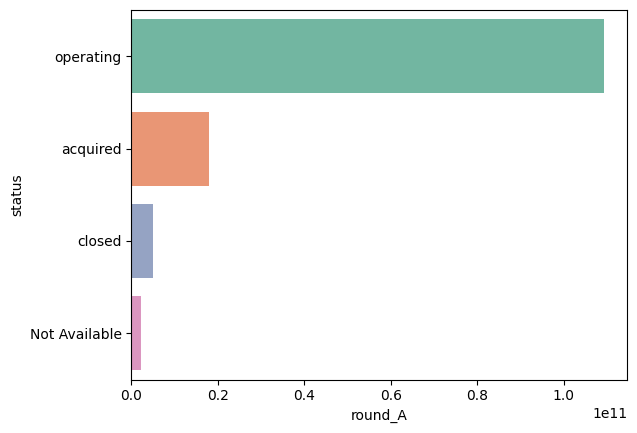

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_A', ylabel='status'>

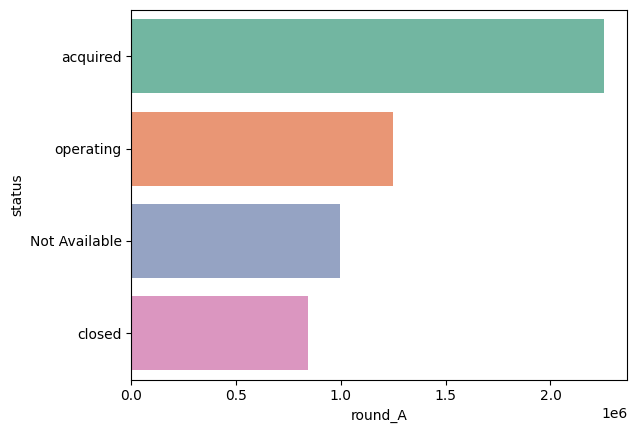

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_A', ylabel='country_code'>

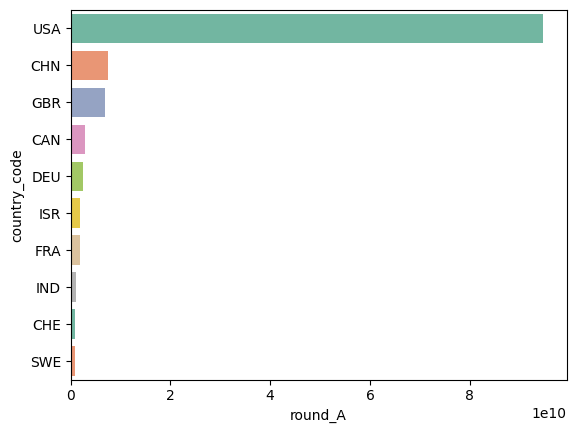

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_A', ylabel='country_code'>

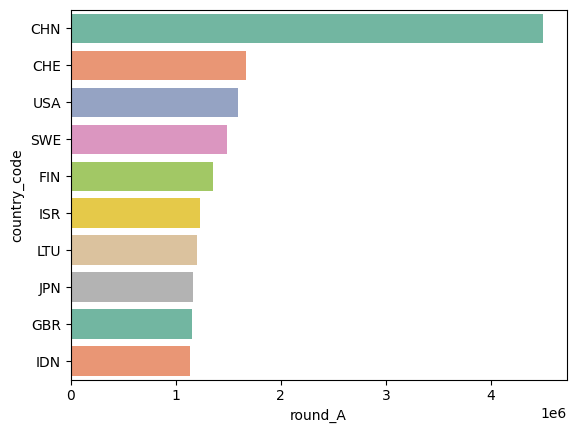

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_A', ylabel='state_code'>

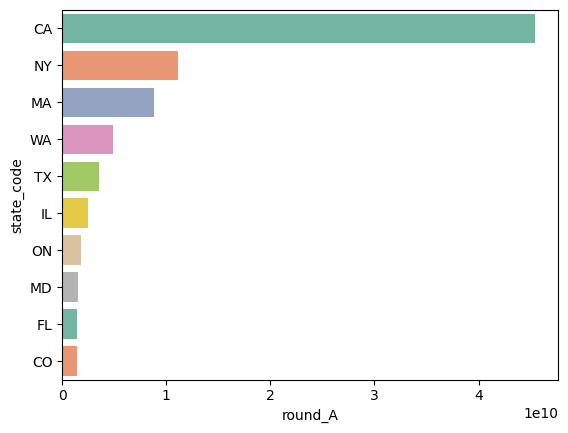

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_A', ylabel='state_code'>

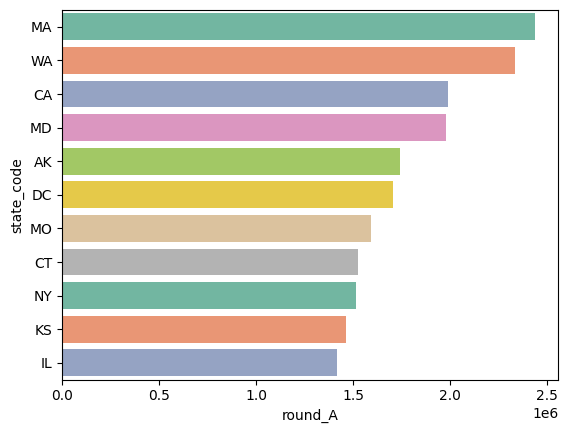

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_A', ylabel='region'>

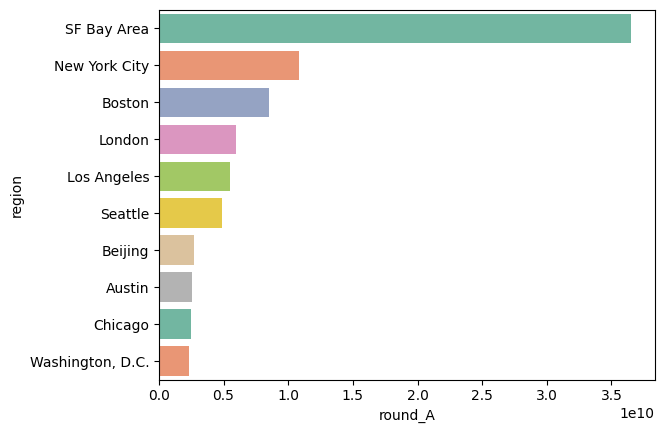

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='round_A', ylabel='region'>

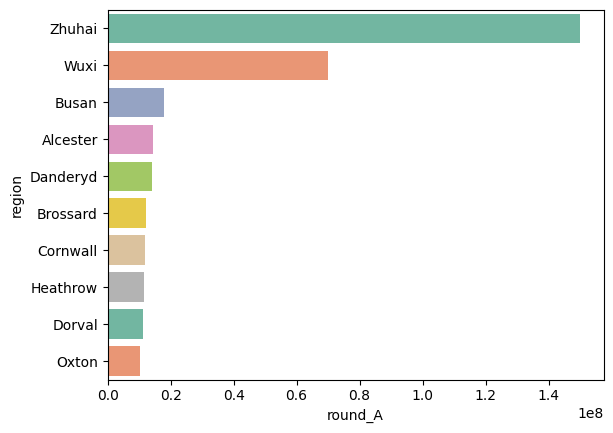

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='round_A'>

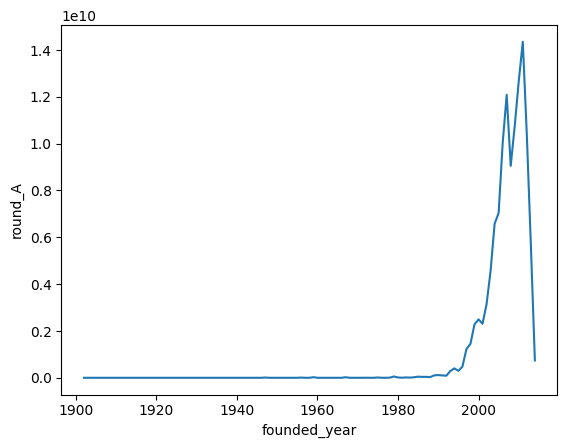

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='round_A'>

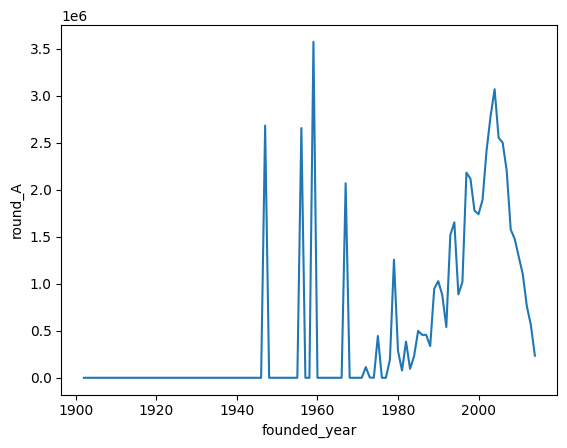

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='round_A'>

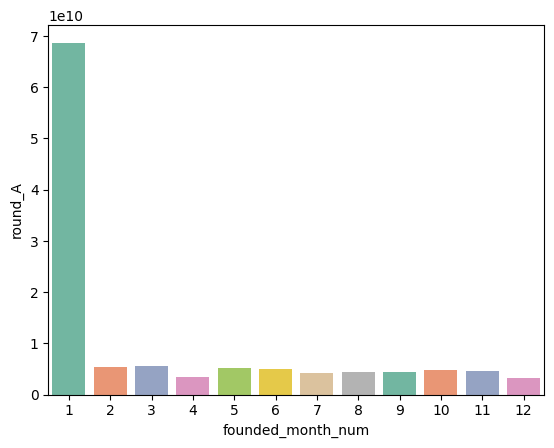

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='round_A'>

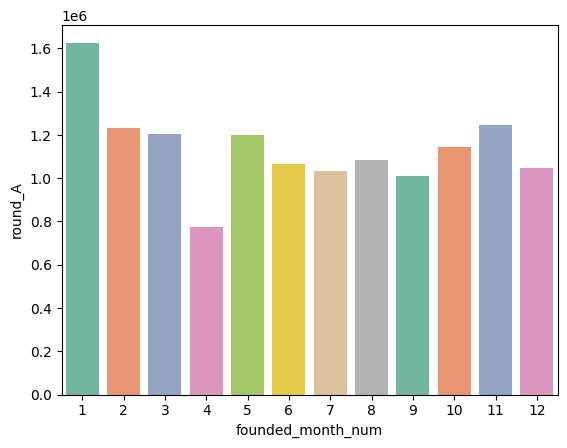

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_A'>

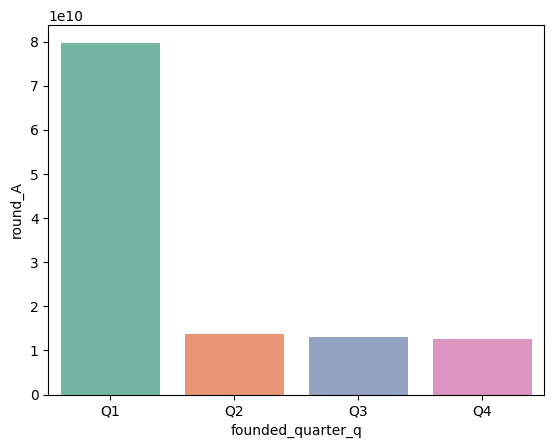

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_A'>

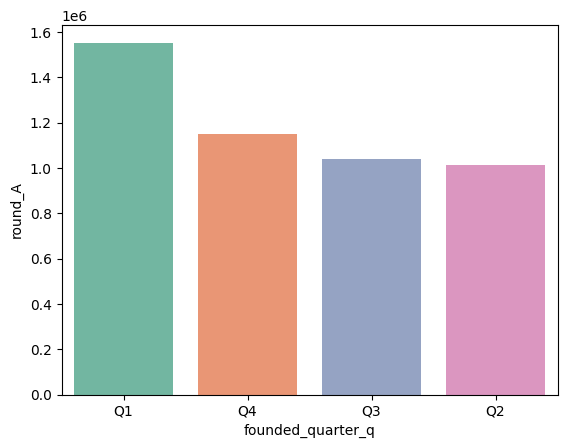

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='round_A'>

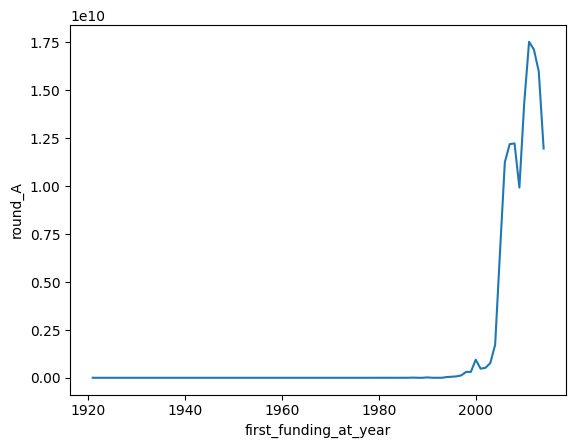

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='round_A'>

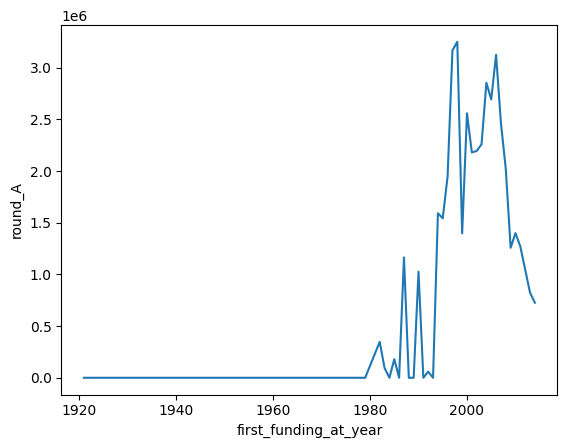

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_A'>

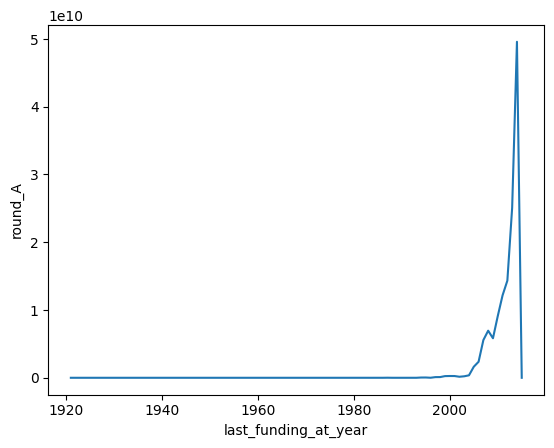

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_A'>

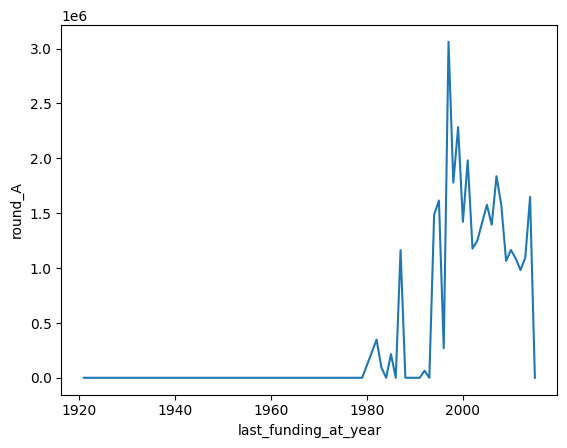

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Round_B

Average and Total Analysis of the Round B Funds as shown below.

In [ ]:
column ='round_B'

<Axes: xlabel='round_B', ylabel='category_list'>

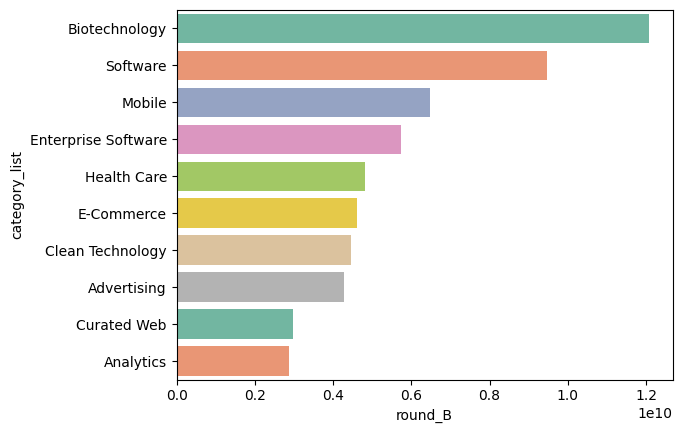

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_B', ylabel='category_list'>

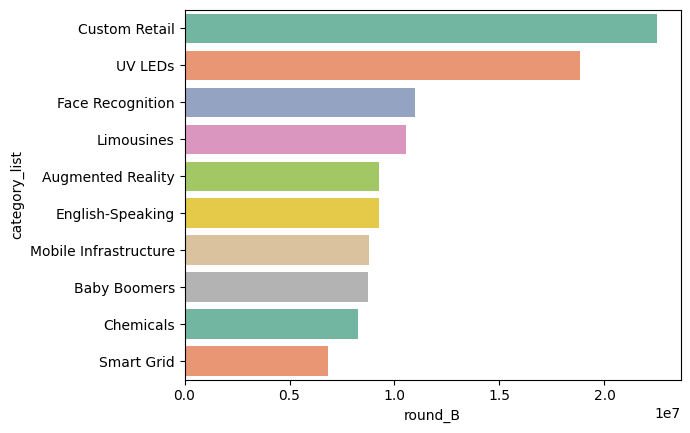

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_B', ylabel=' market '>

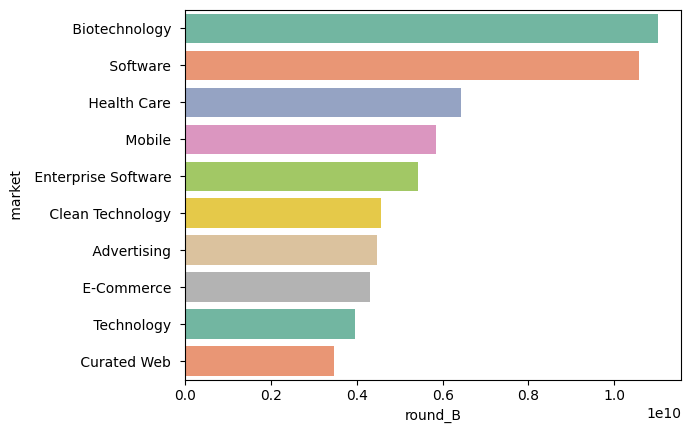

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_B', ylabel=' market '>

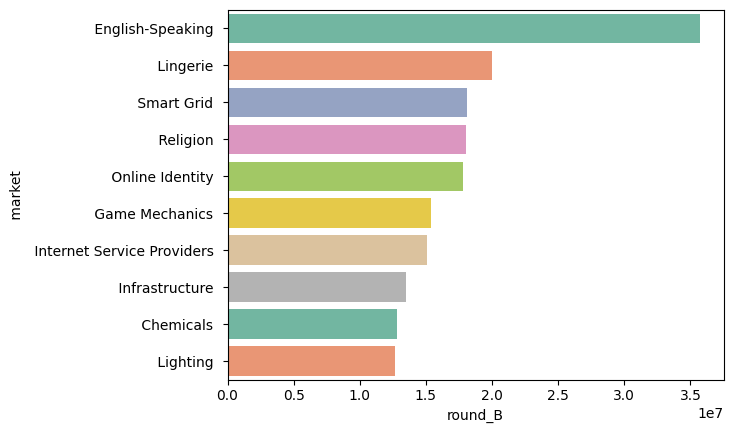

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_B', ylabel='status'>

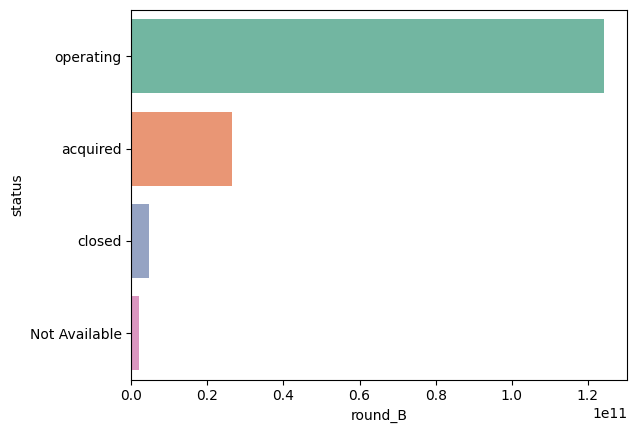

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_B', ylabel='status'>

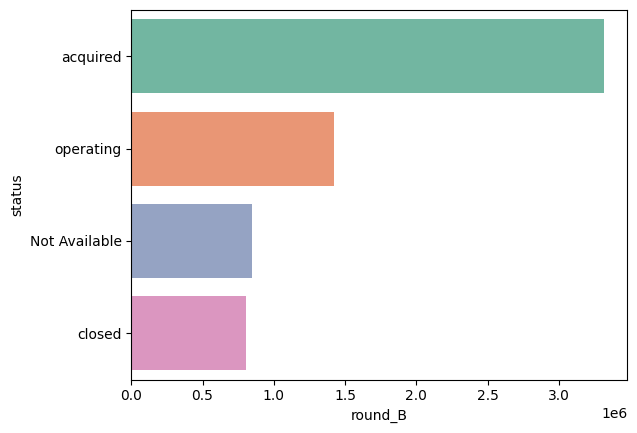

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_B', ylabel='country_code'>

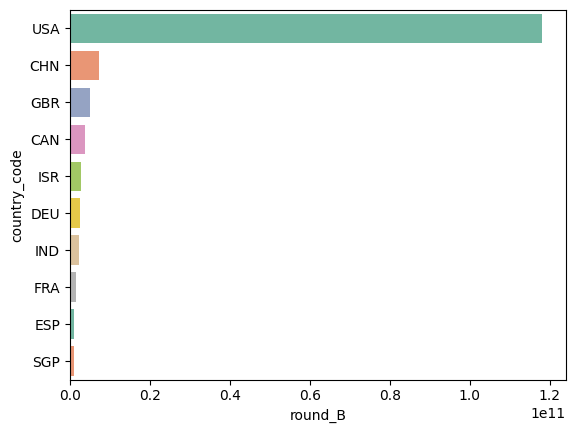

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_B', ylabel='country_code'>

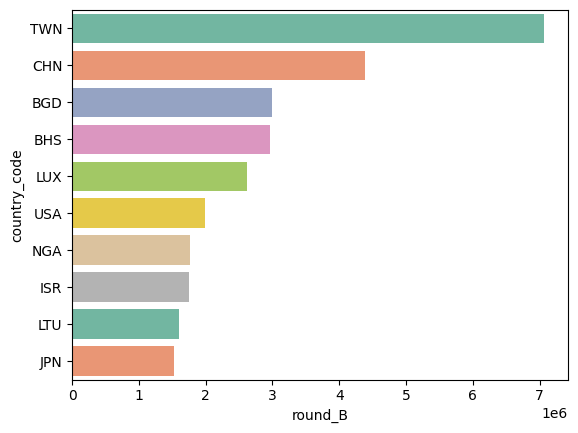

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_B', ylabel='state_code'>

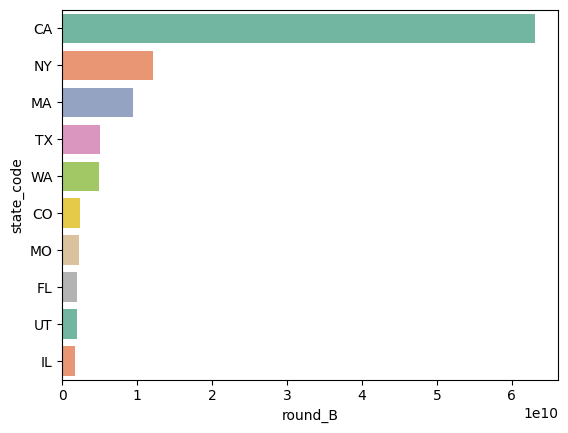

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_B', ylabel='state_code'>

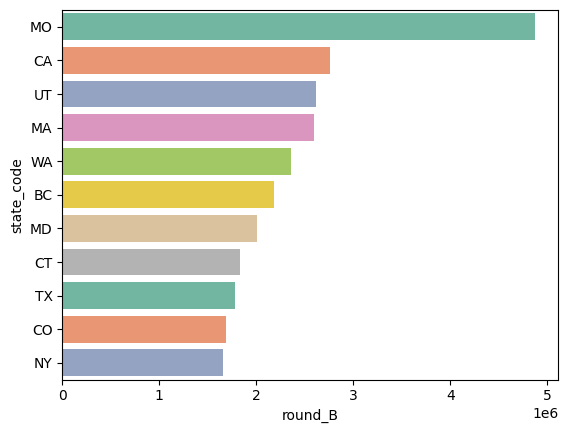

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_B', ylabel='region'>

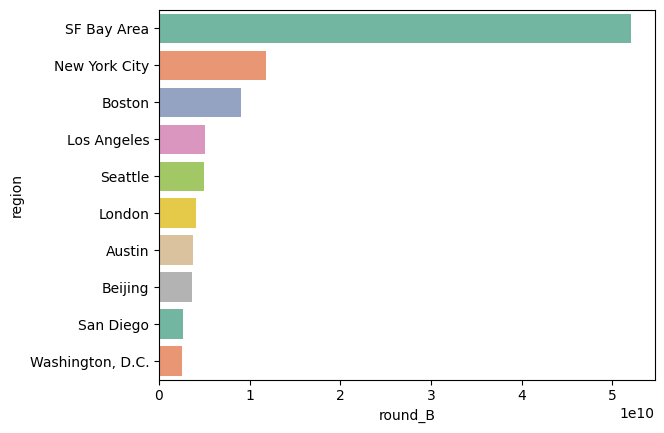

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='round_B', ylabel='region'>

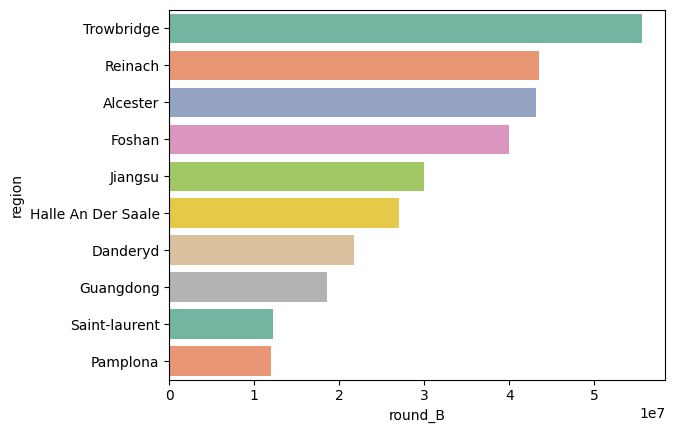

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='round_B'>

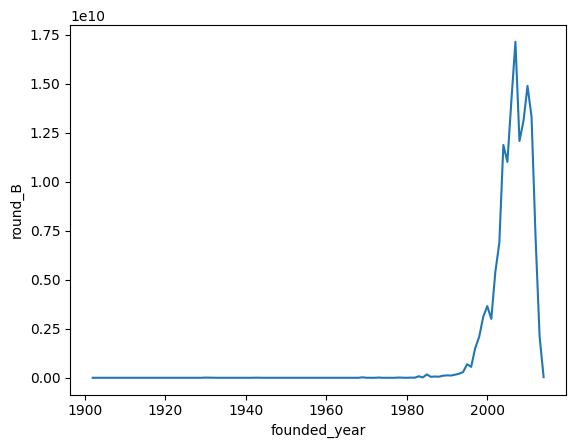

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='round_B'>

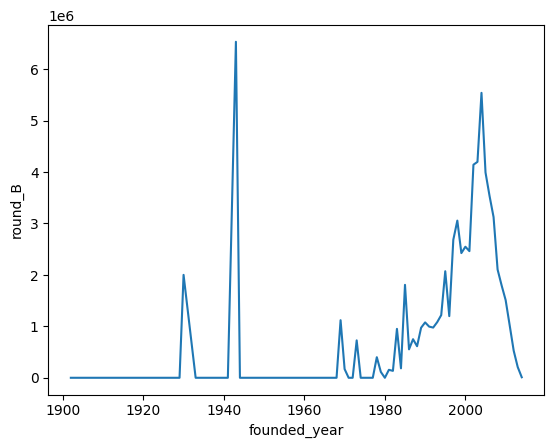

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='round_B'>

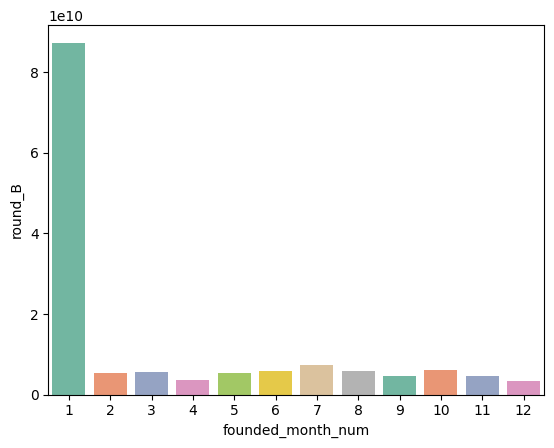

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='round_B'>

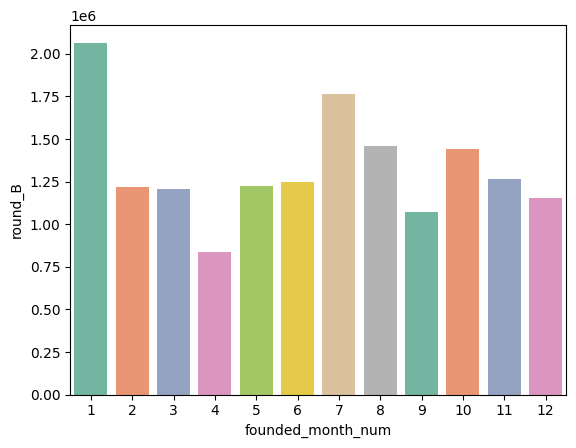

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_B'>

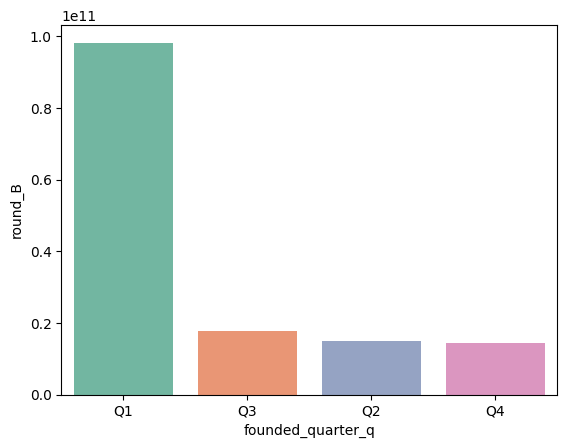

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_B'>

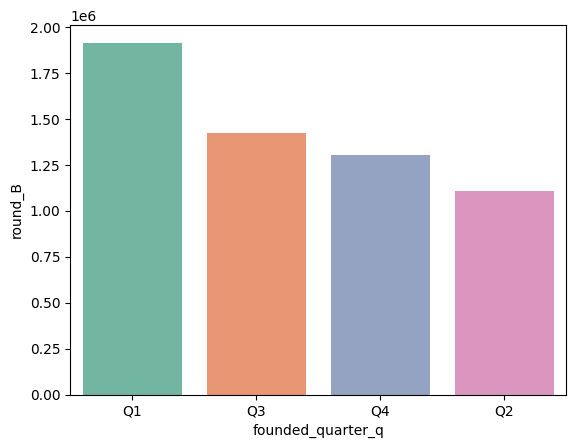

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='round_B'>

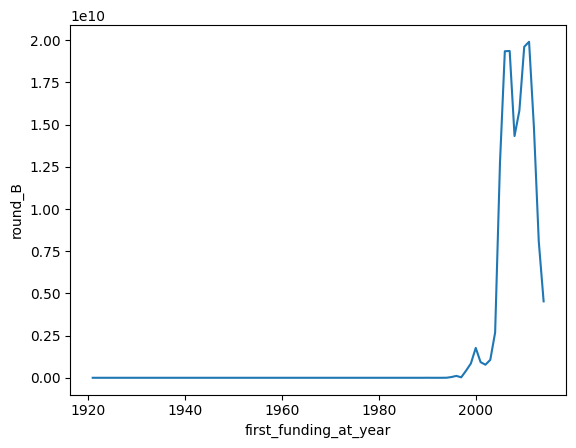

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='round_B'>

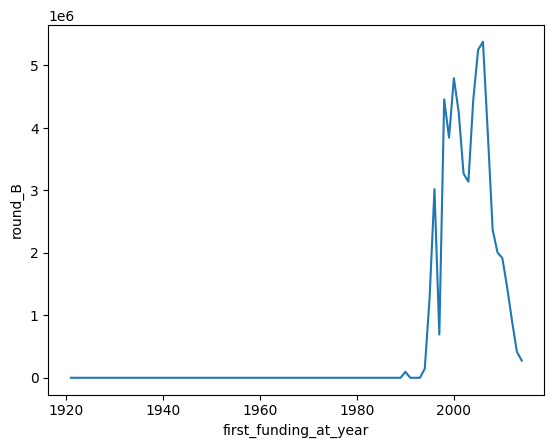

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_B'>

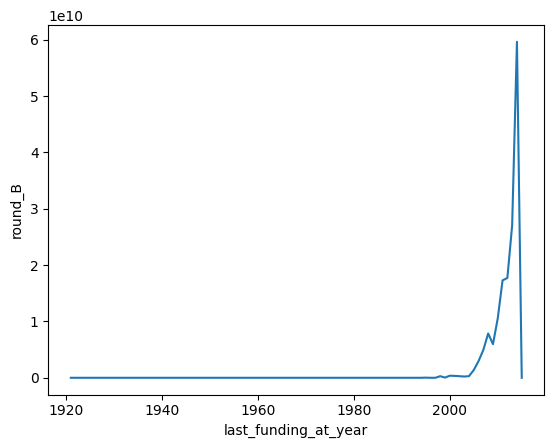

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_B'>

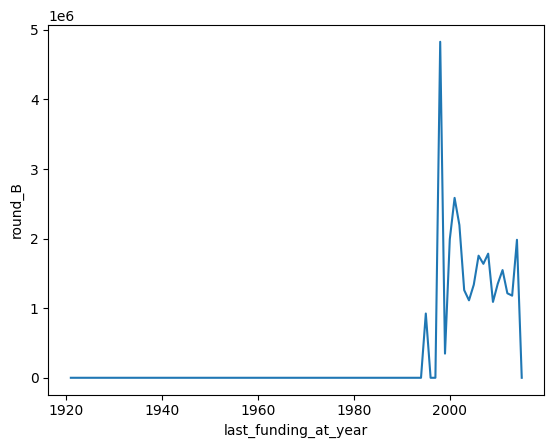

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Round_C

Average and Total Analysis of the Round C Funds as shown below.

In [ ]:
column ='round_C'

<Axes: xlabel='round_C', ylabel='category_list'>

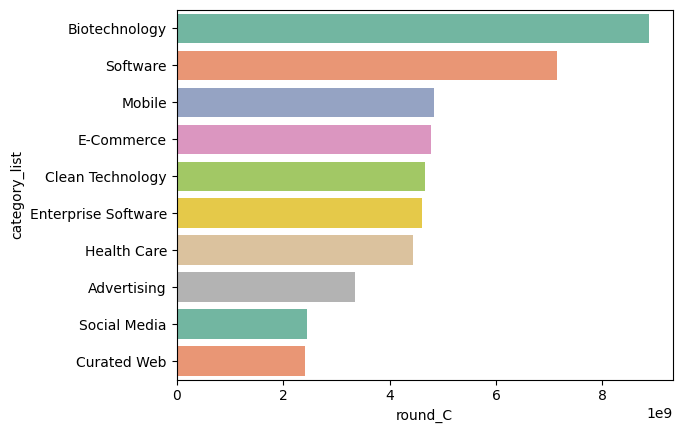

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_C', ylabel='category_list'>

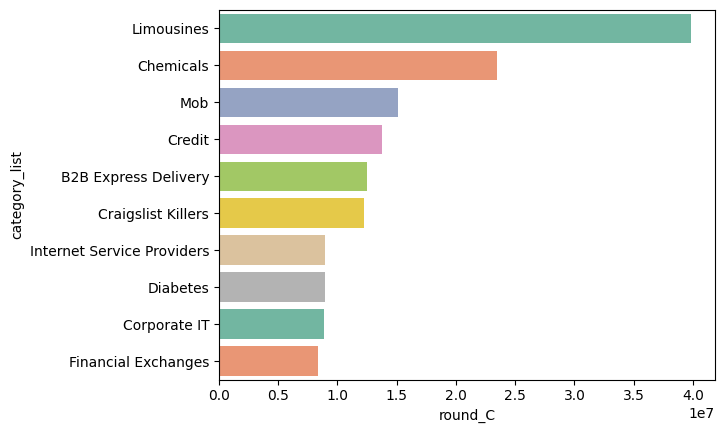

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_C', ylabel=' market '>

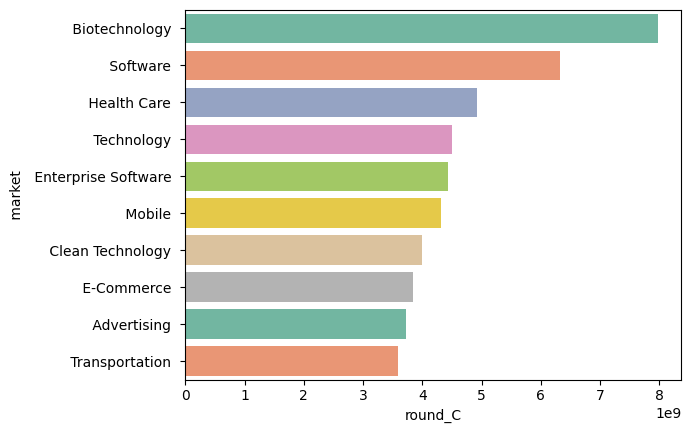

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_C', ylabel=' market '>

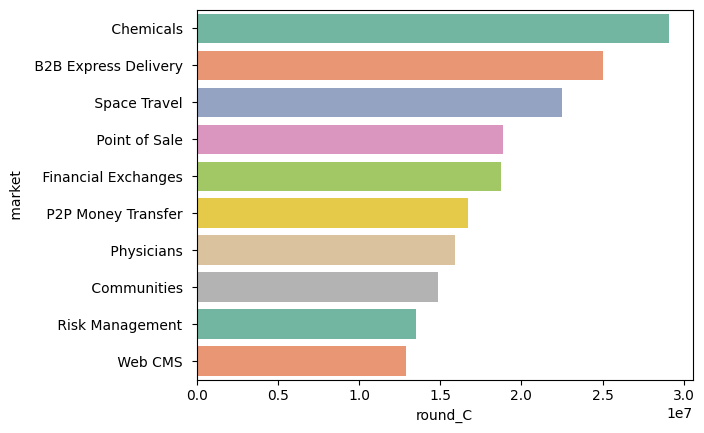

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_C', ylabel='status'>

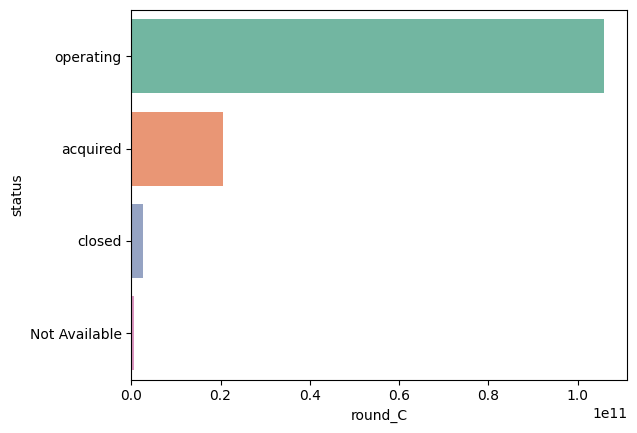

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_C', ylabel='status'>

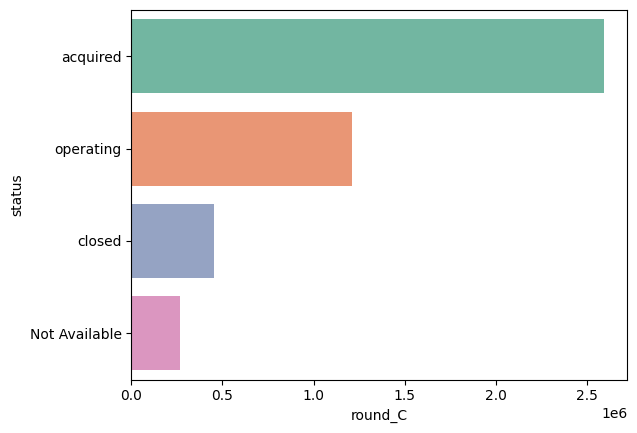

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_C', ylabel='country_code'>

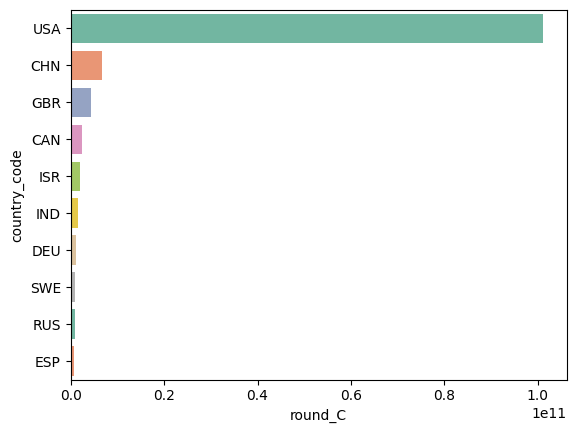

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_C', ylabel='country_code'>

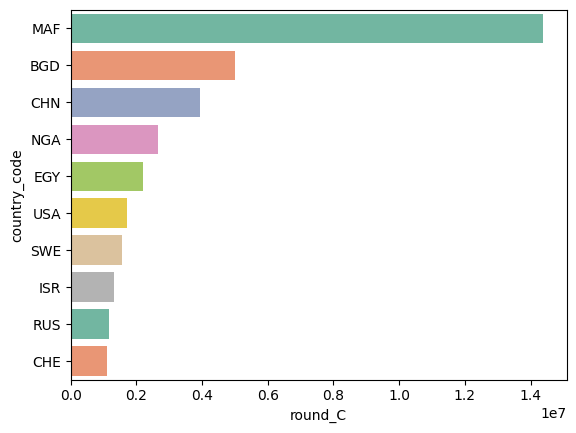

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_C', ylabel='state_code'>

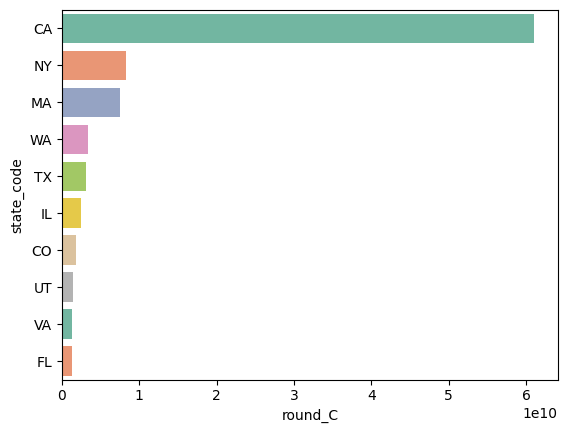

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_C', ylabel='state_code'>

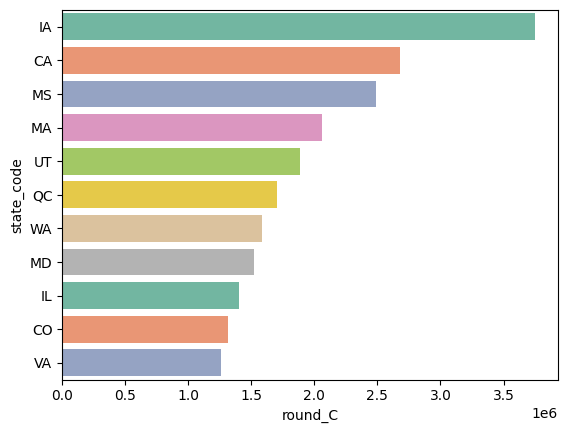

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_C', ylabel='region'>

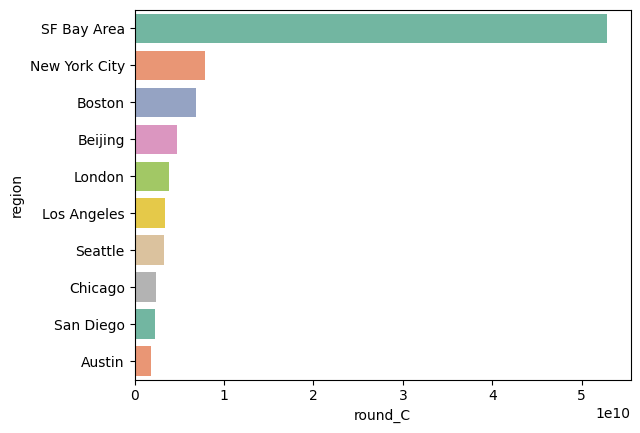

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='round_C', ylabel='region'>

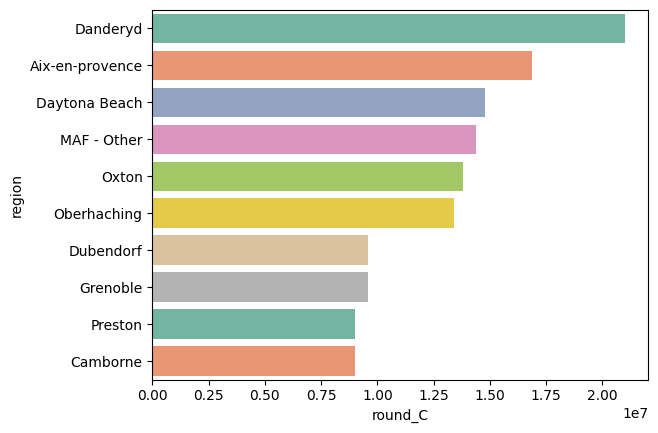

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='round_C'>

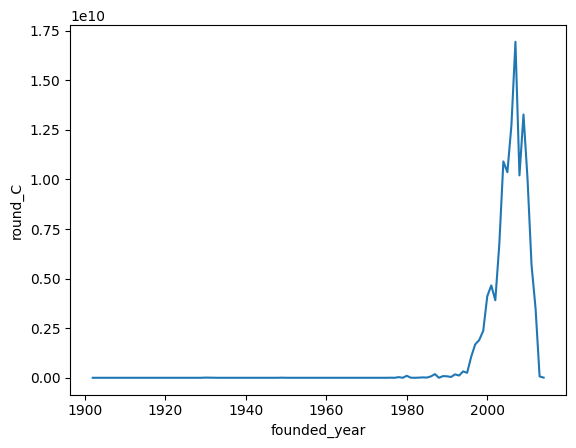

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='round_C'>

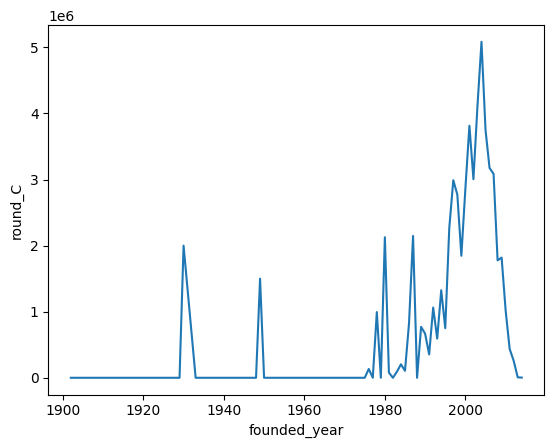

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='round_C'>

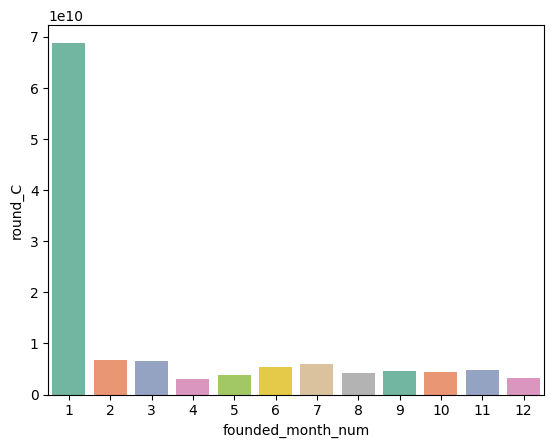

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='round_C'>

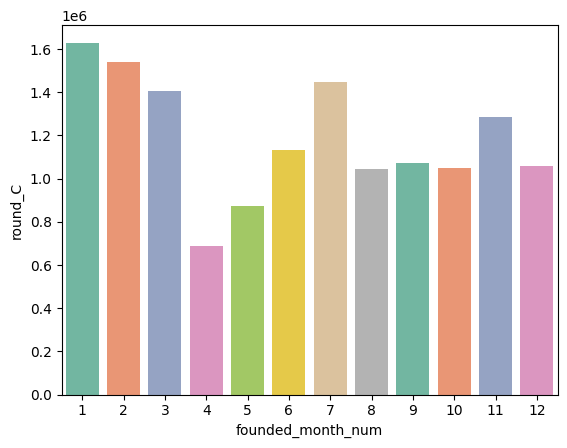

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_C'>

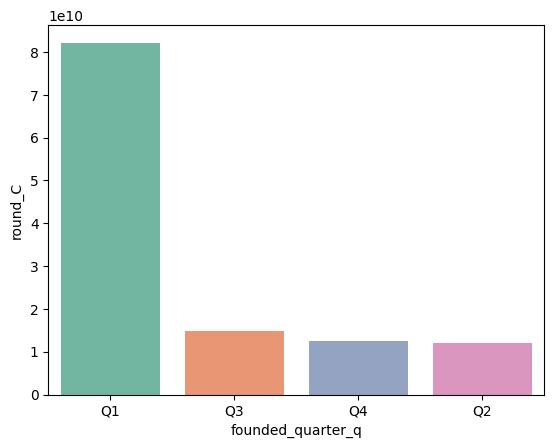

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_C'>

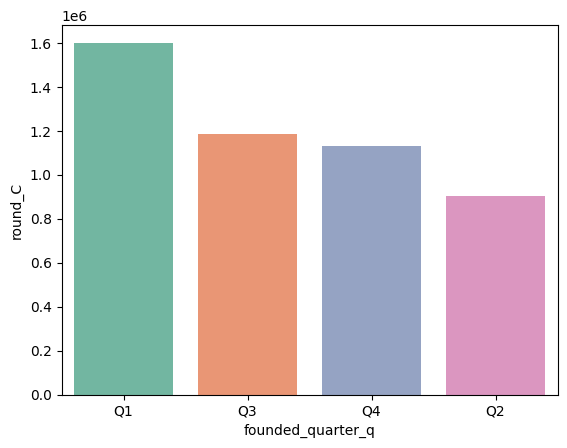

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='round_C'>

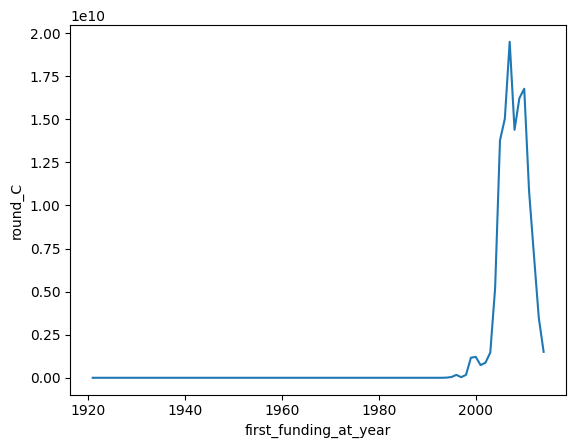

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='round_C'>

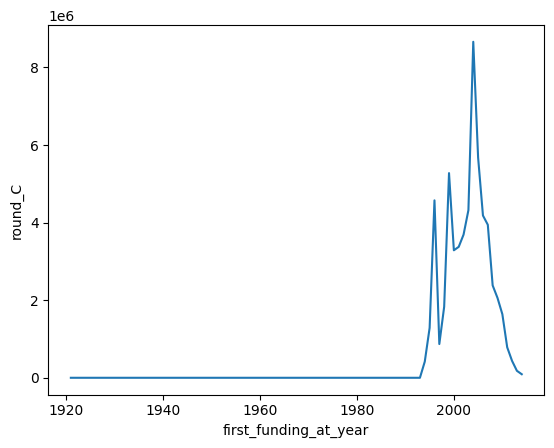

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_C'>

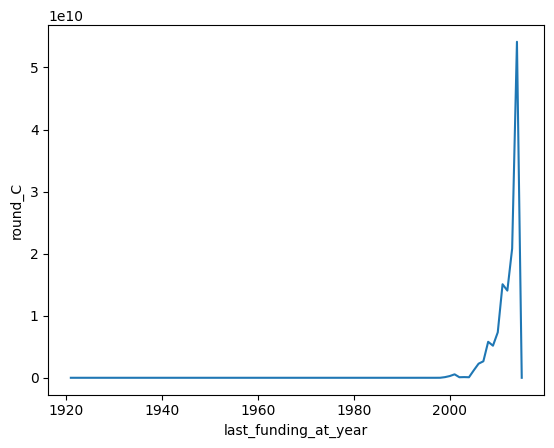

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_C'>

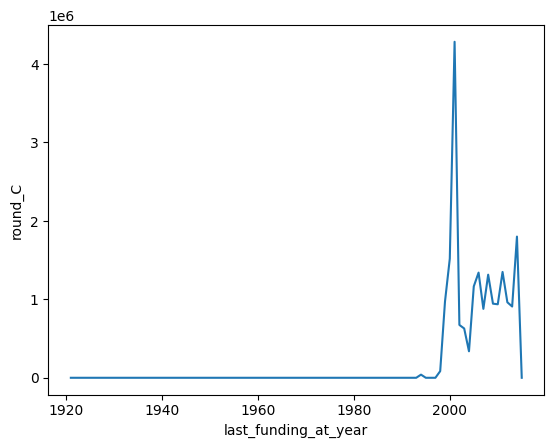

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Round_D

Average and Total Analysis of the Round D Funds as shown below.

In [ ]:
column ='round_D'

<Axes: xlabel='round_D', ylabel='category_list'>

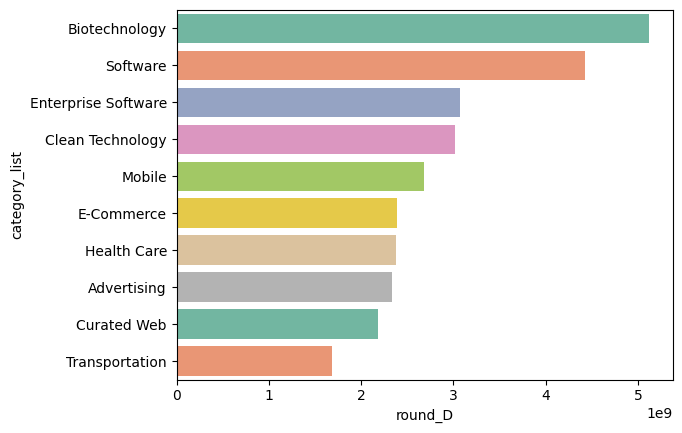

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_D', ylabel='category_list'>

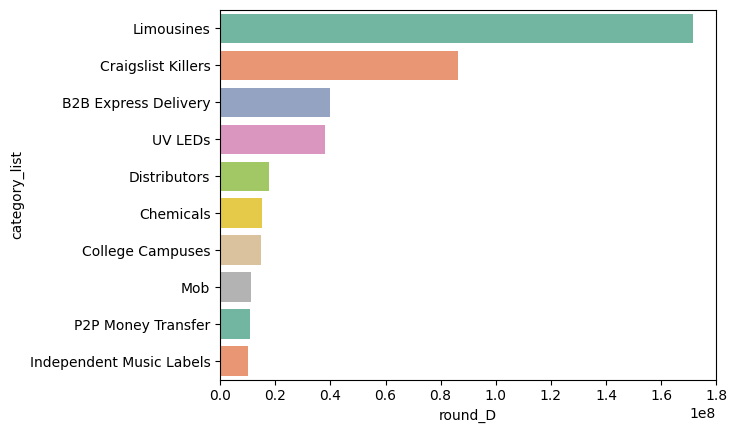

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_D', ylabel=' market '>

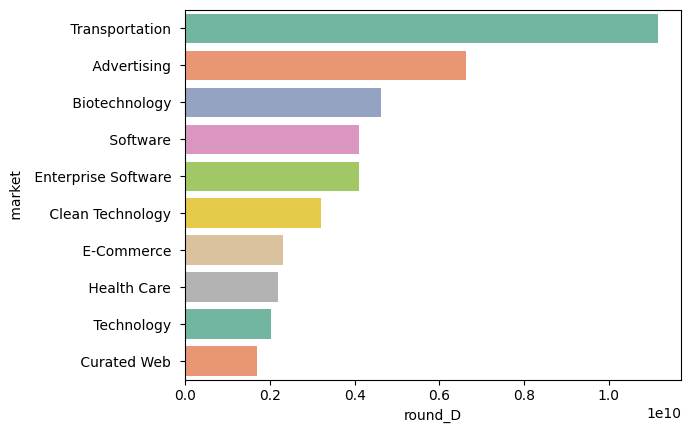

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_D', ylabel=' market '>

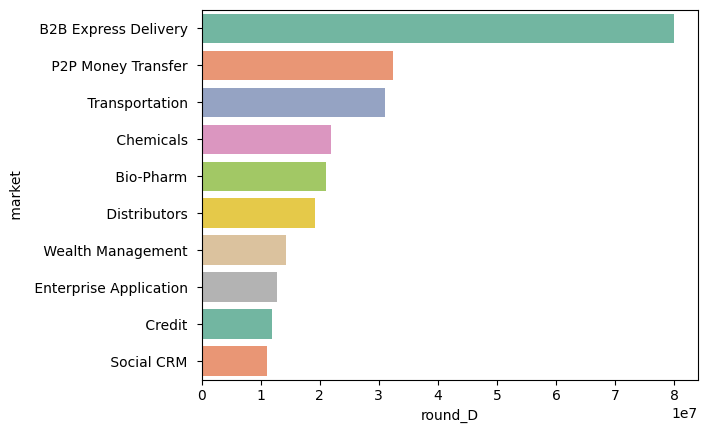

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_D', ylabel='status'>

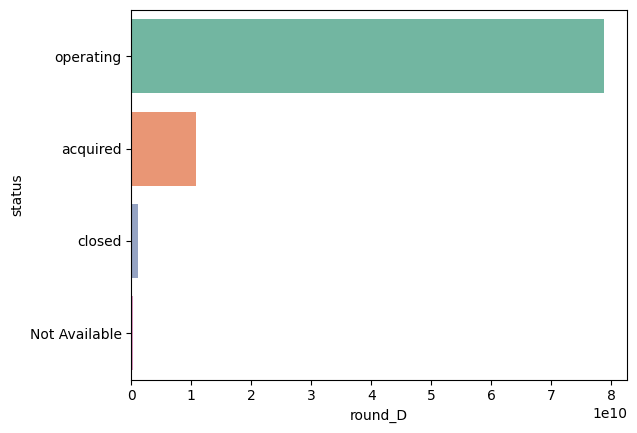

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_D', ylabel='status'>

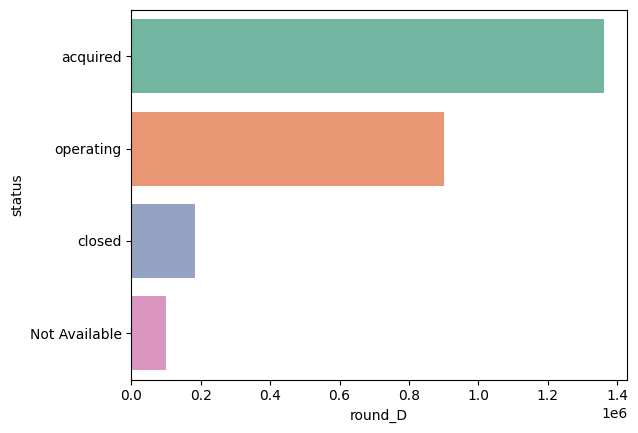

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_D', ylabel='country_code'>

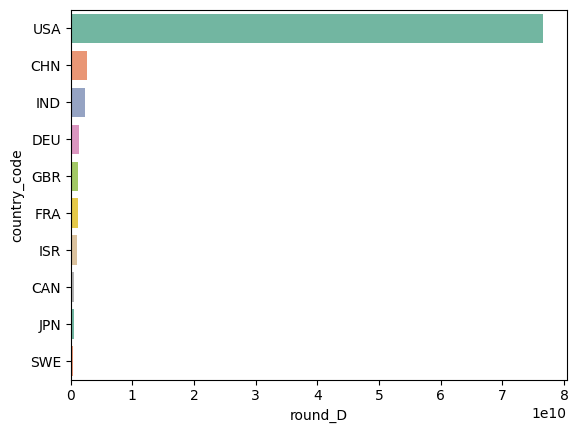

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_D', ylabel='country_code'>

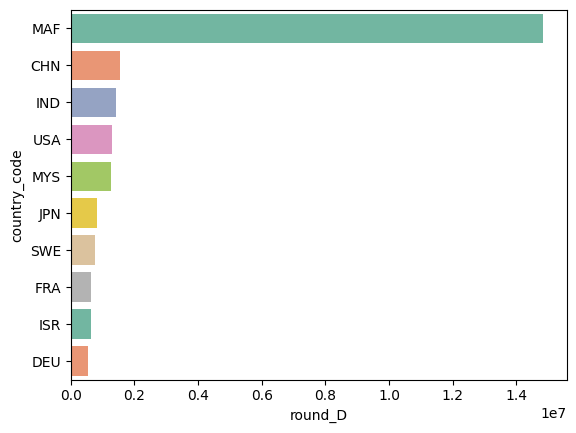

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_D', ylabel='state_code'>

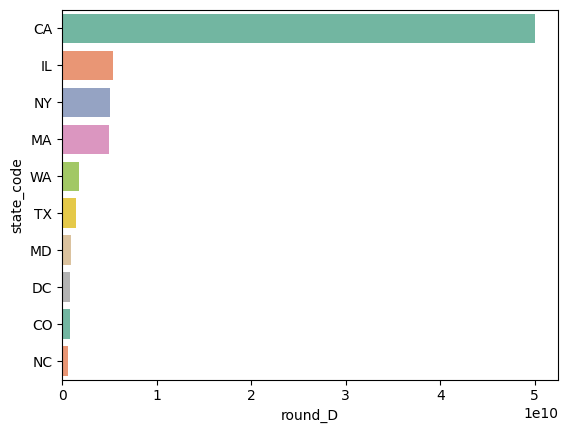

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_D', ylabel='state_code'>

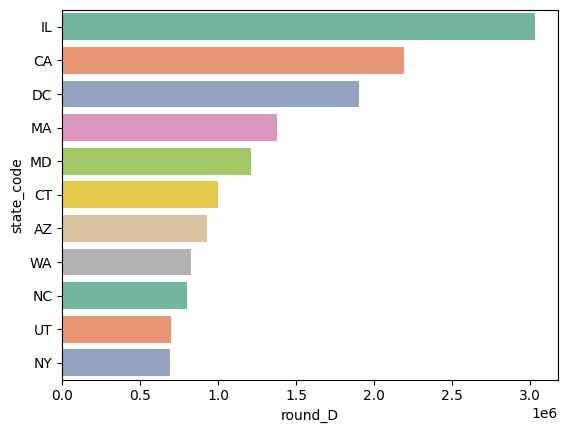

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_D', ylabel='region'>

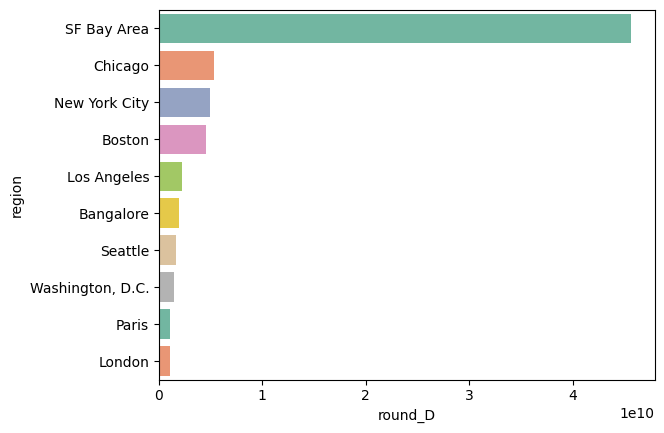

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='round_D', ylabel='region'>

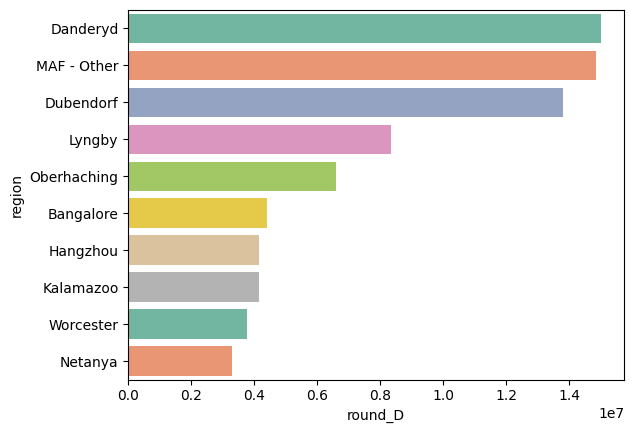

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='round_D'>

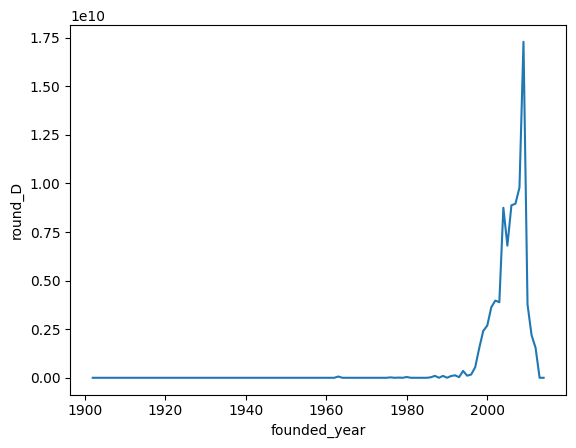

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='round_D'>

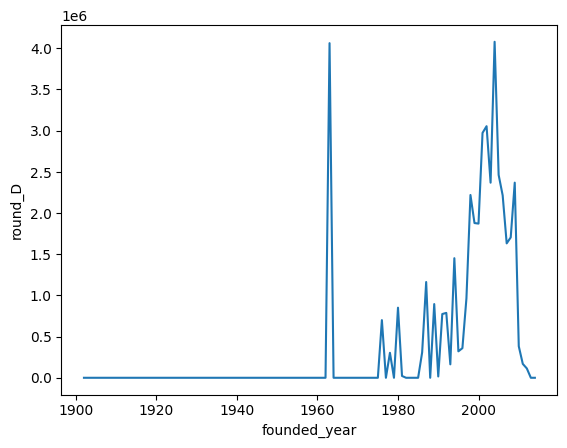

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='round_D'>

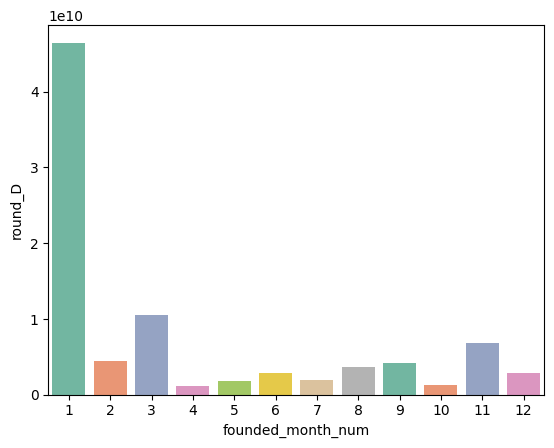

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='round_D'>

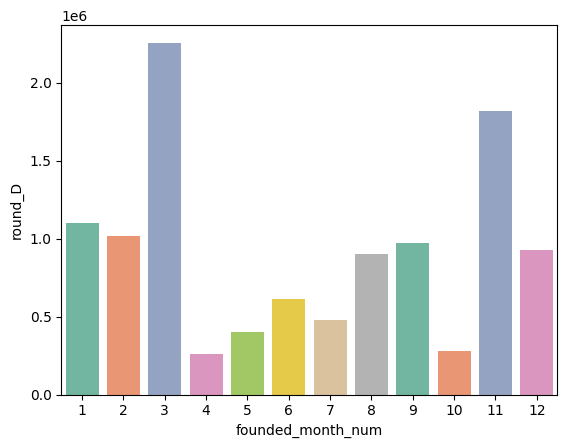

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_D'>

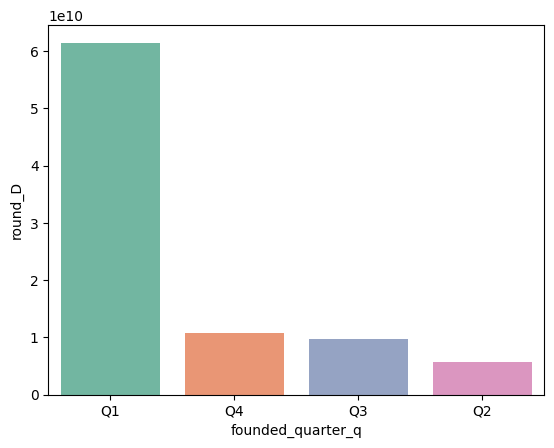

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_D'>

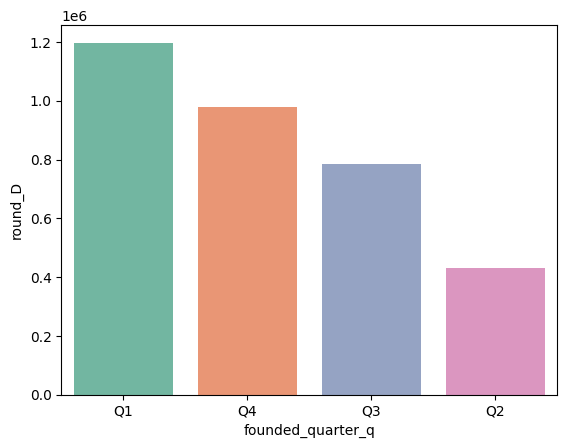

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='round_D'>

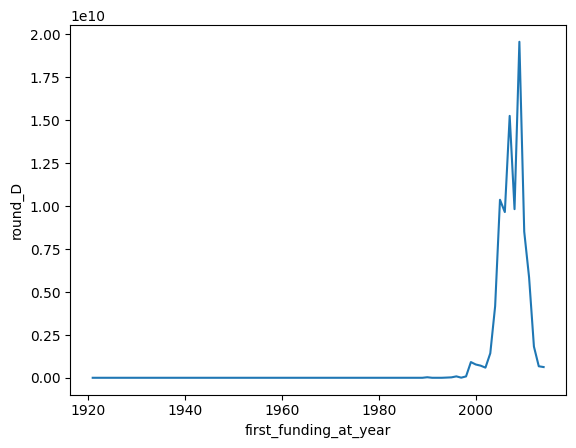

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='round_D'>

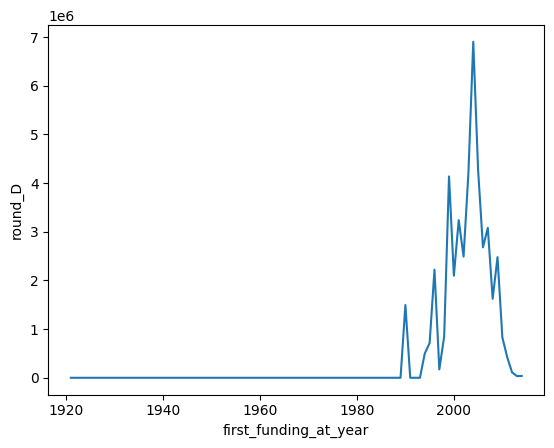

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_D'>

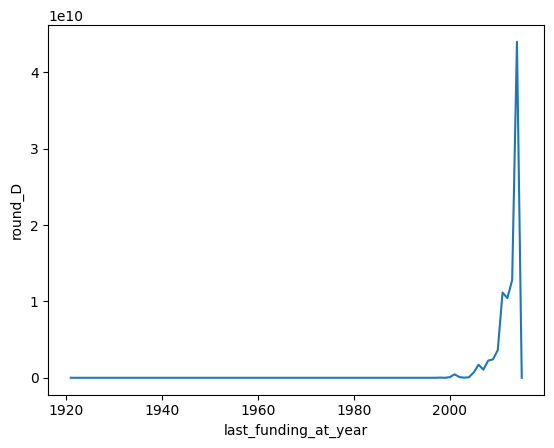

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_D'>

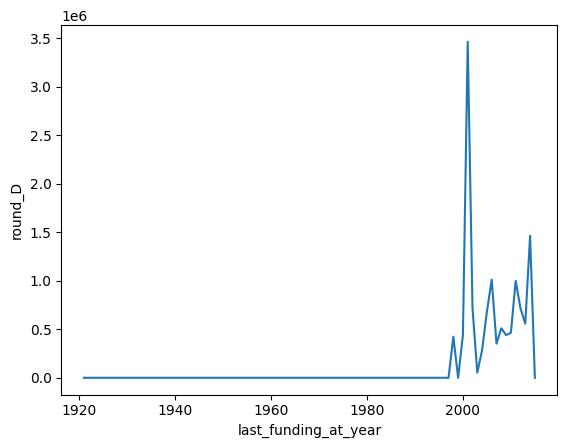

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Round_E

Average and Total Analysis of the Round E Funds as shown below.

In [ ]:
column ='round_E'

<Axes: xlabel='round_E', ylabel='category_list'>

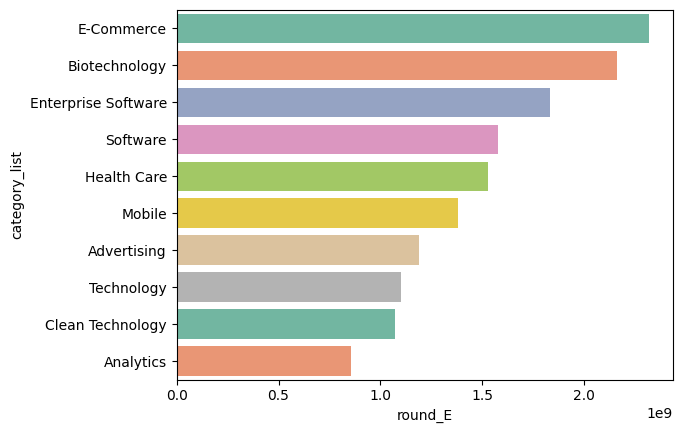

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_E', ylabel='category_list'>

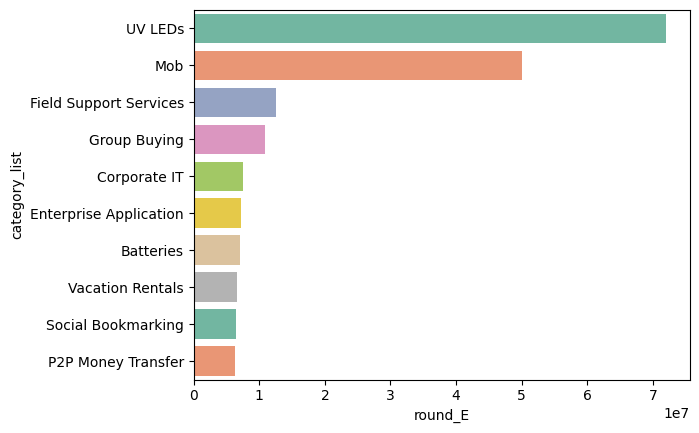

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_E', ylabel=' market '>

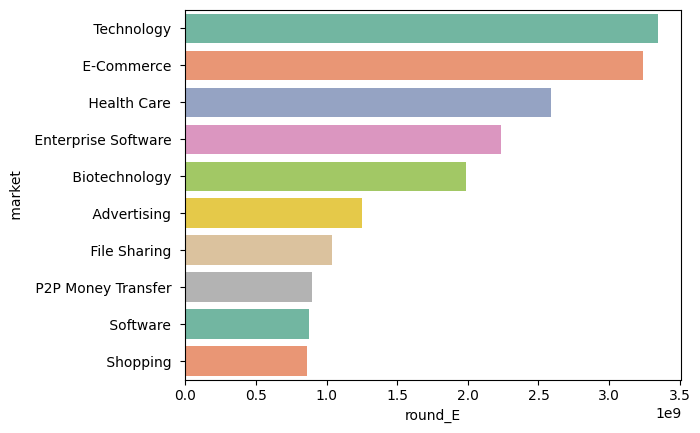

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_E', ylabel=' market '>

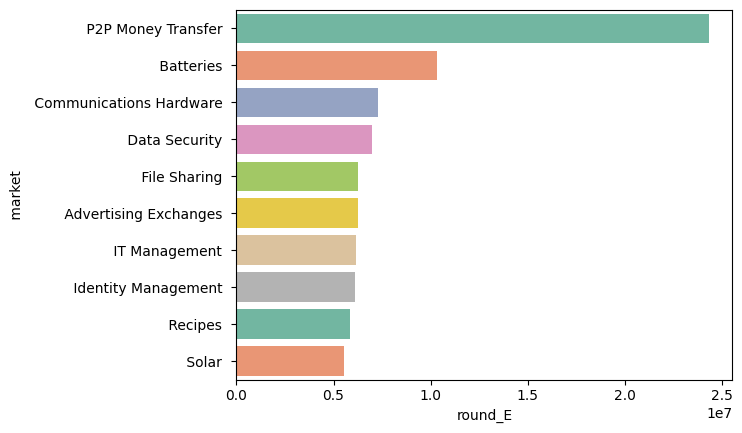

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_E', ylabel='status'>

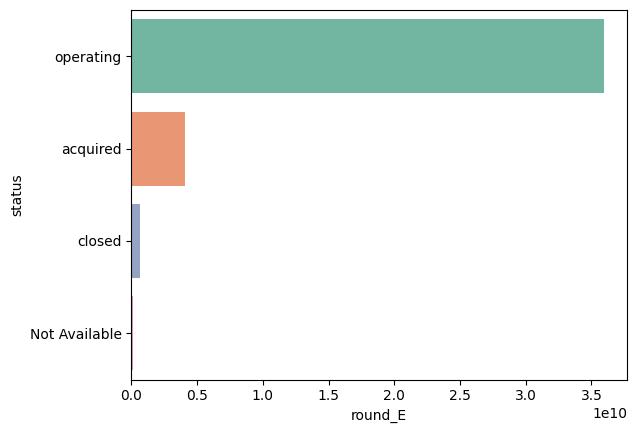

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_E', ylabel='status'>

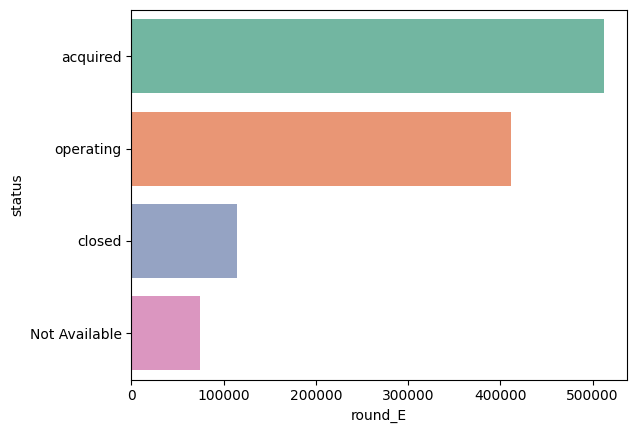

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_E', ylabel='country_code'>

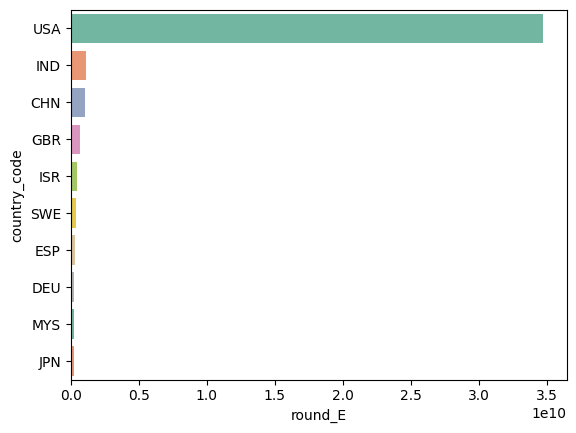

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_E', ylabel='country_code'>

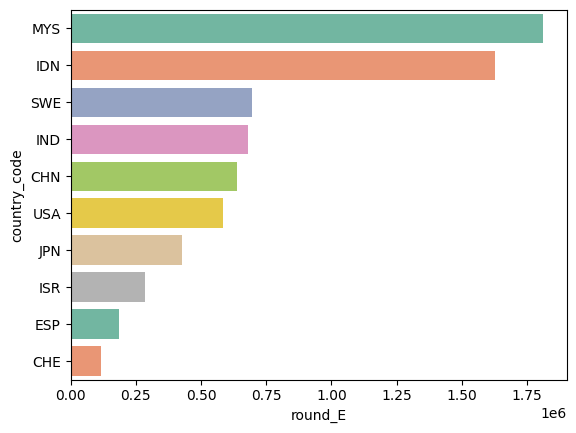

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_E', ylabel='state_code'>

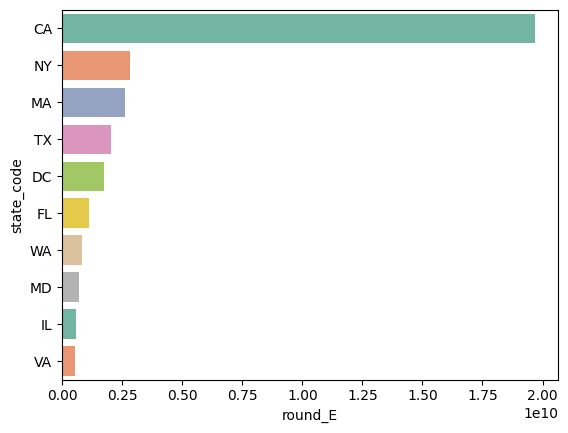

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_E', ylabel='state_code'>

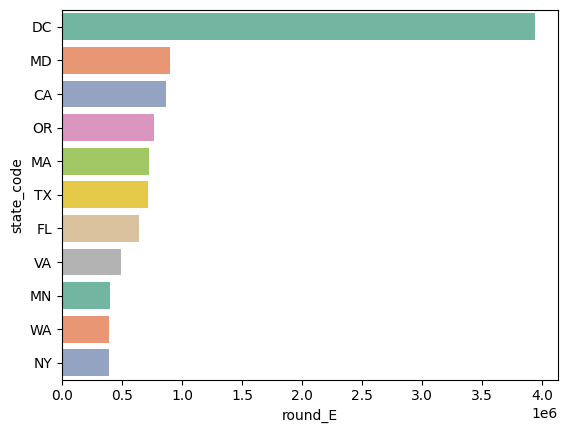

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_E', ylabel='region'>

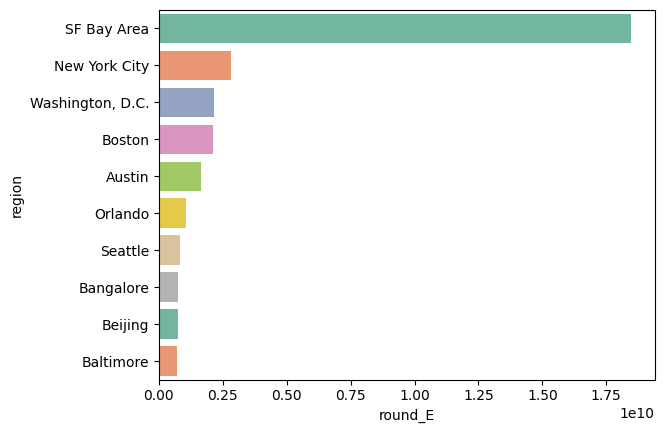

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='round_E', ylabel='region'>

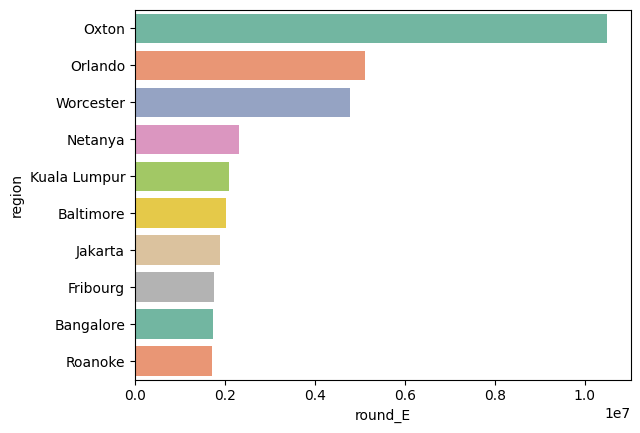

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='round_E'>

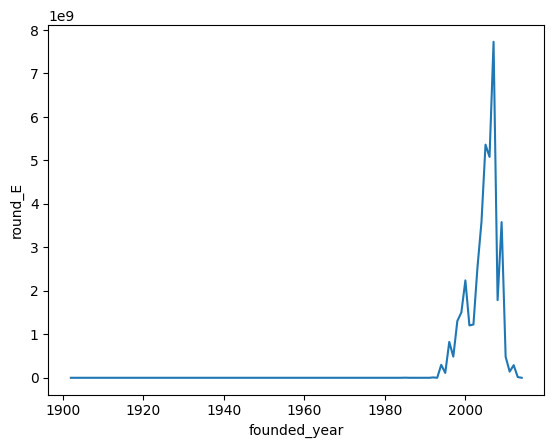

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='round_E'>

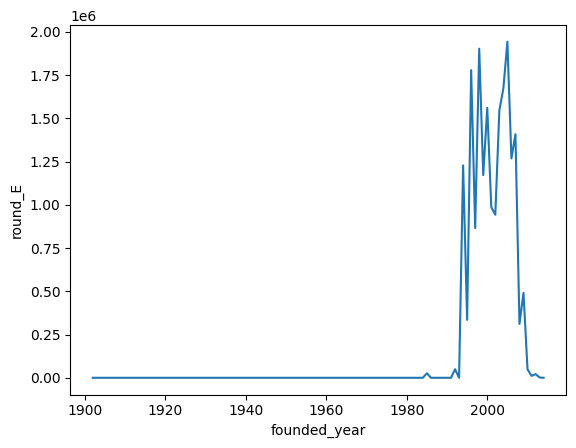

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='round_E'>

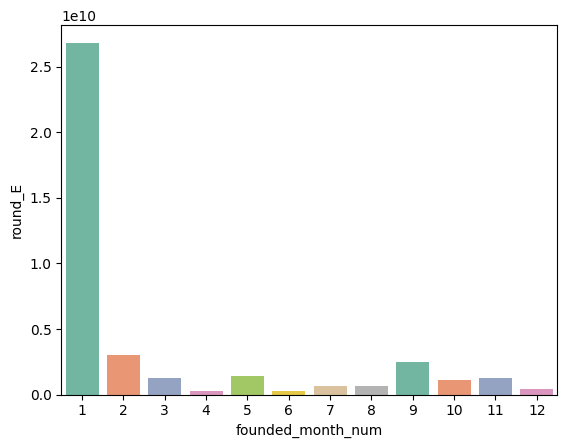

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='round_E'>

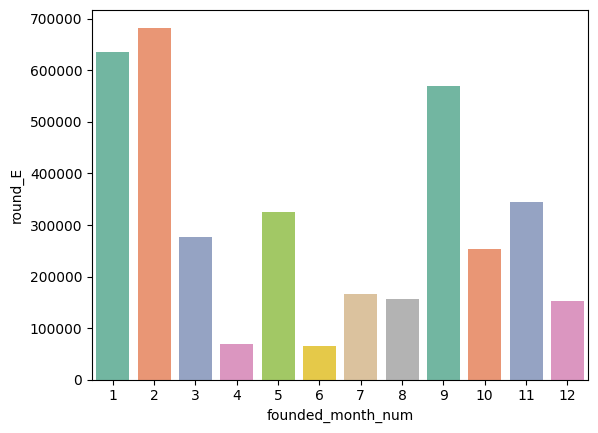

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_E'>

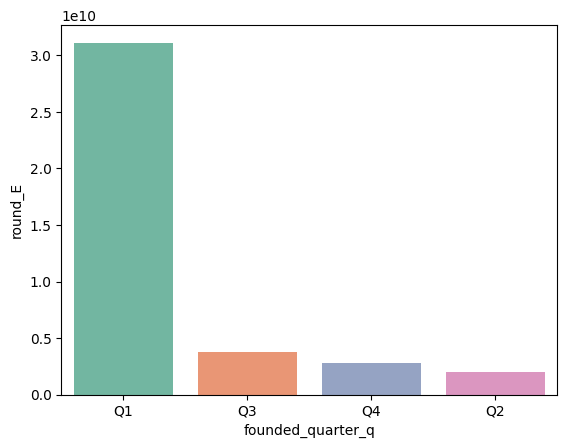

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_E'>

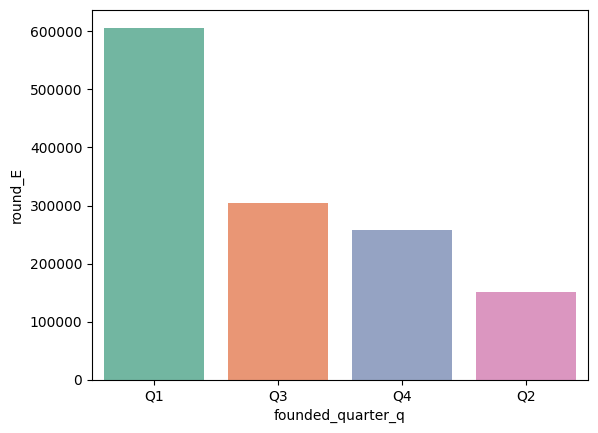

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='round_E'>

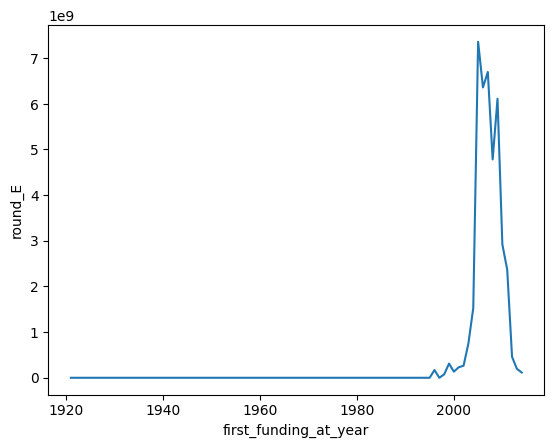

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='round_E'>

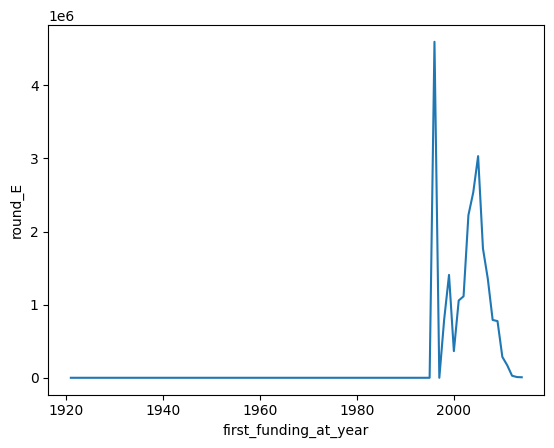

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_E'>

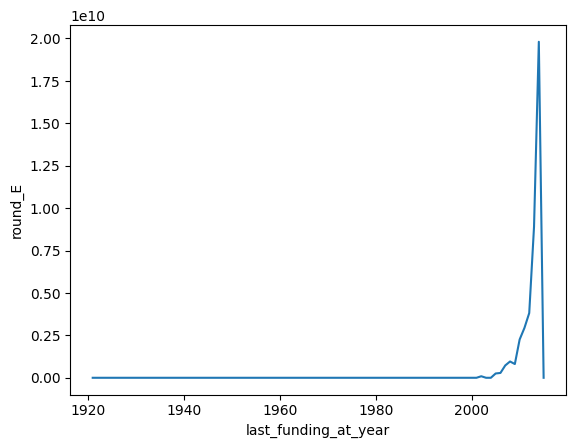

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_E'>

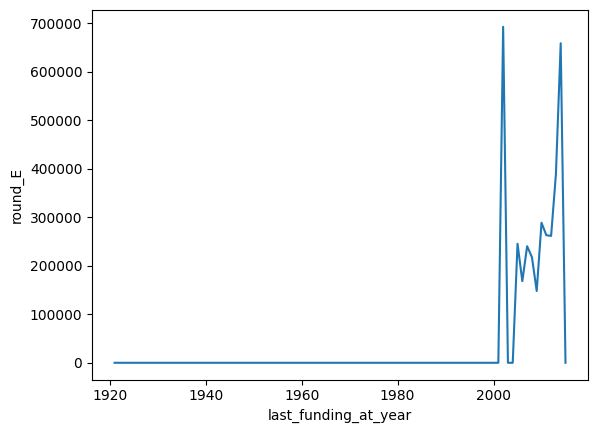

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Round_F

Average and Total Analysis of the Round F Funds as shown below.

In [ ]:
column ='round_F'

<Axes: xlabel='round_F', ylabel='category_list'>

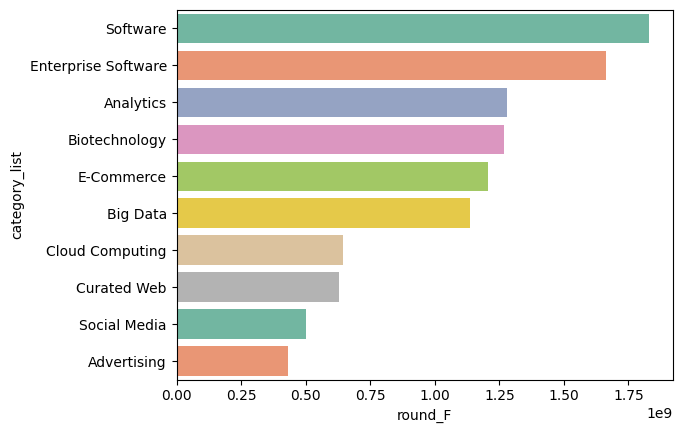

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_F', ylabel='category_list'>

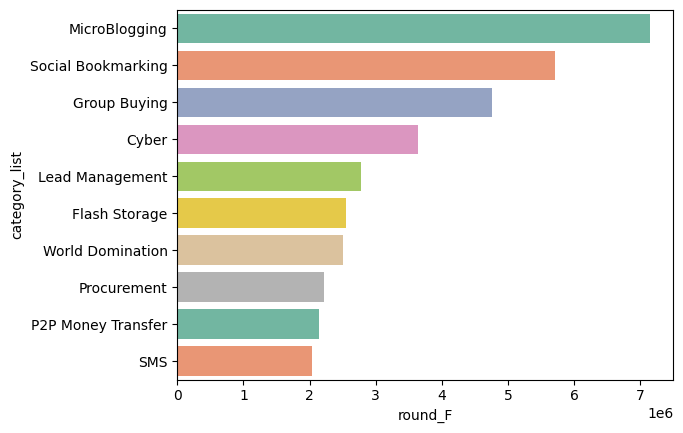

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_F', ylabel=' market '>

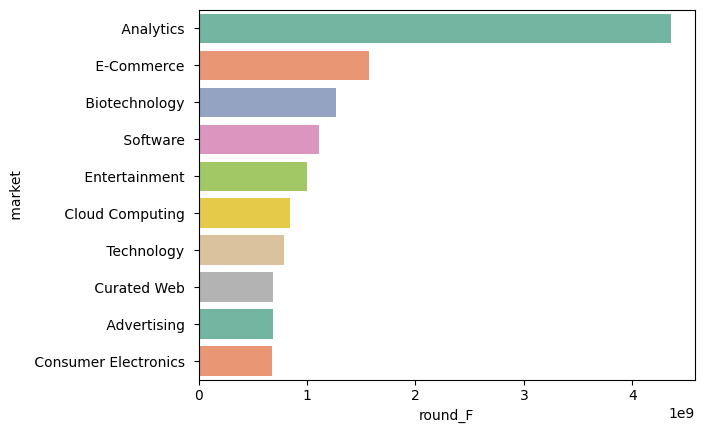

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_F', ylabel=' market '>

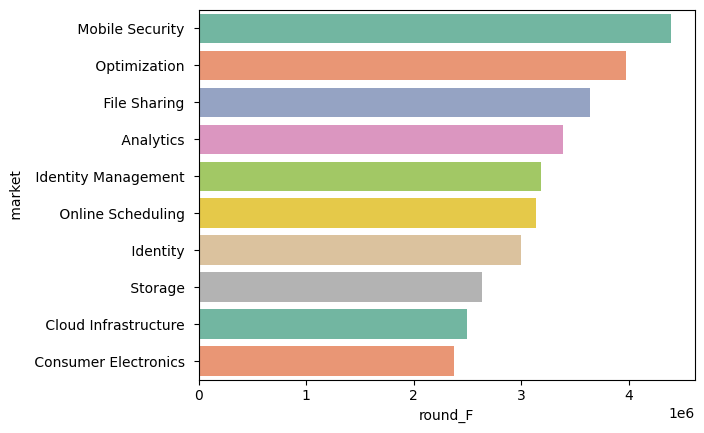

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_F', ylabel='status'>

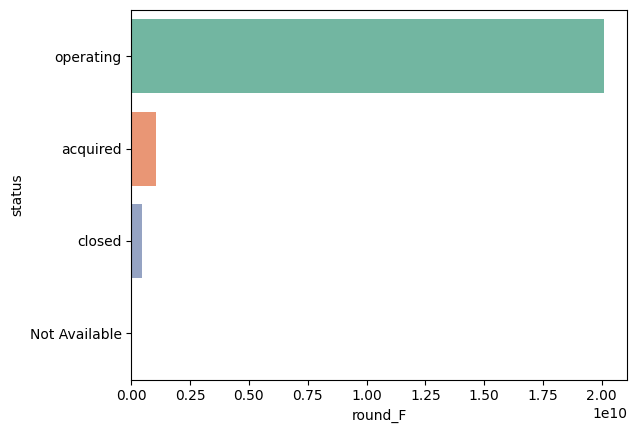

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_F', ylabel='status'>

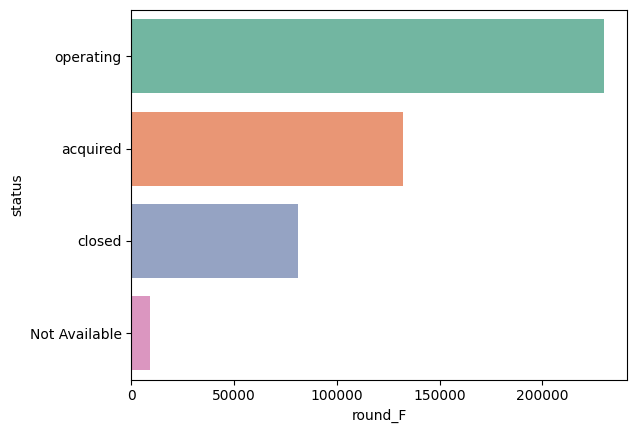

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_F', ylabel='country_code'>

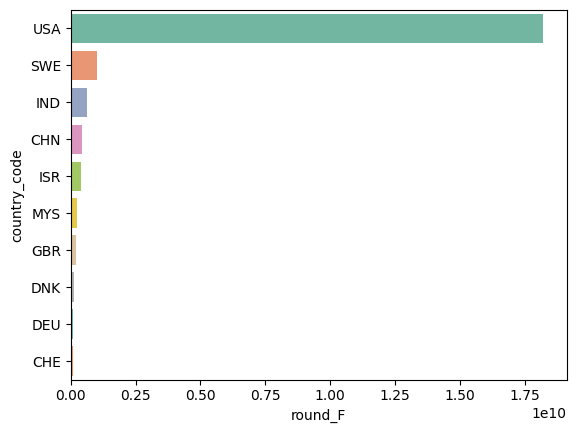

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_F', ylabel='country_code'>

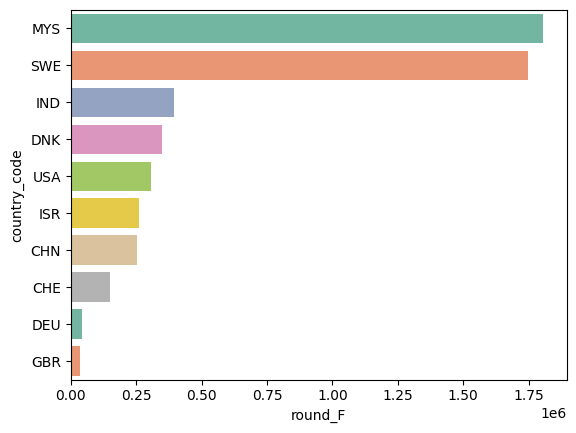

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_F', ylabel='state_code'>

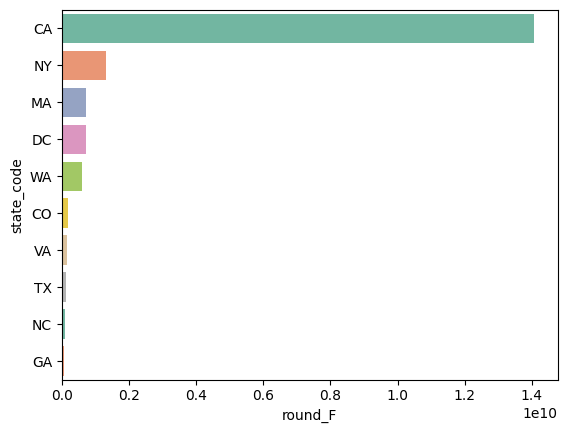

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_F', ylabel='state_code'>

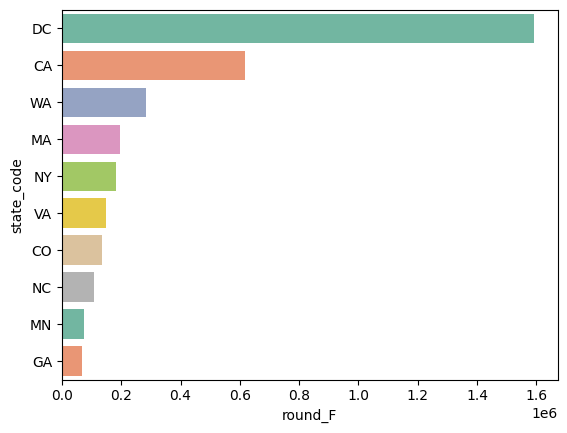

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_F', ylabel='region'>

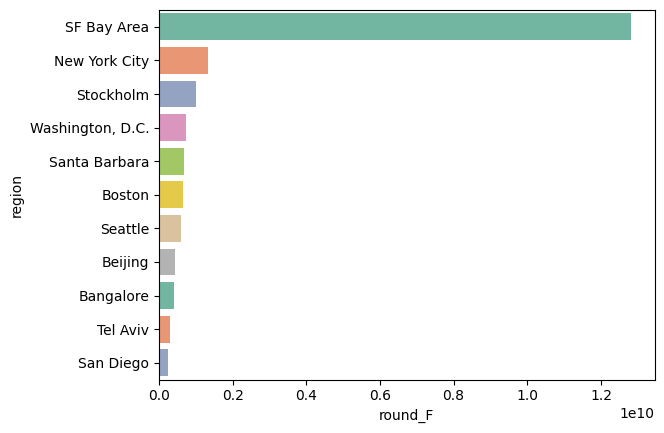

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='round_F', ylabel='region'>

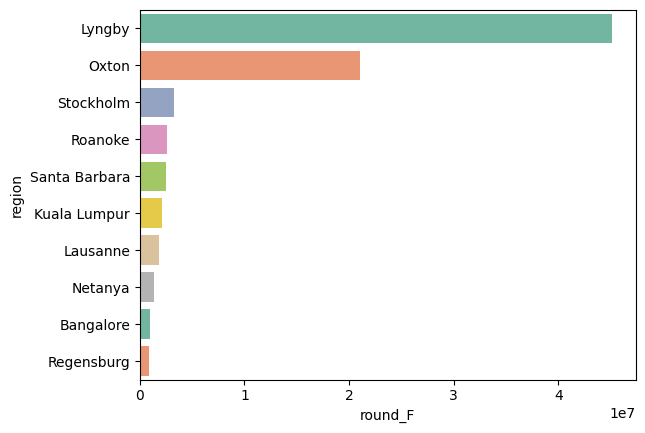

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='round_F'>

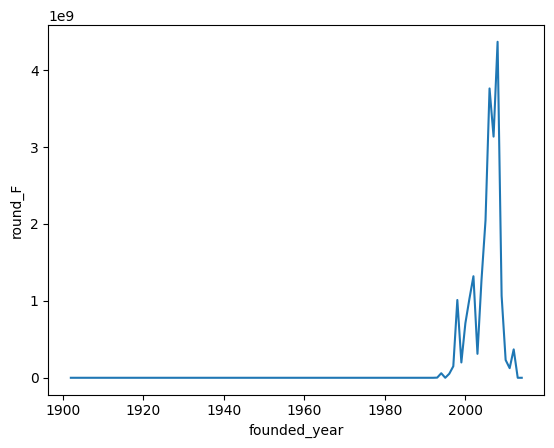

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='round_F'>

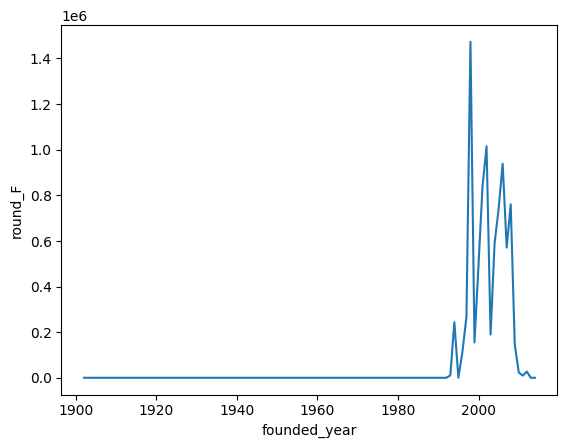

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='round_F'>

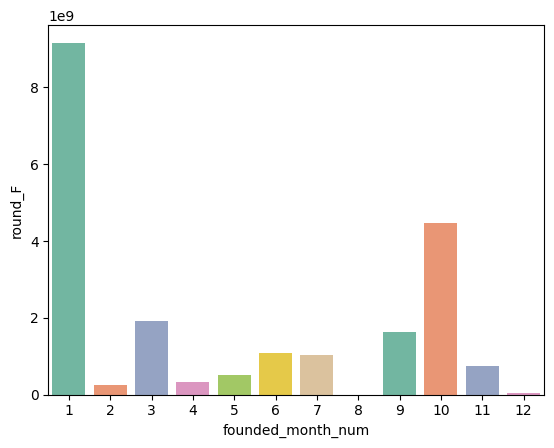

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='round_F'>

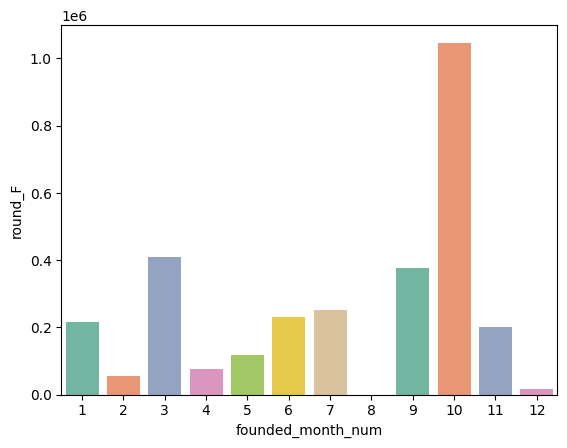

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_F'>

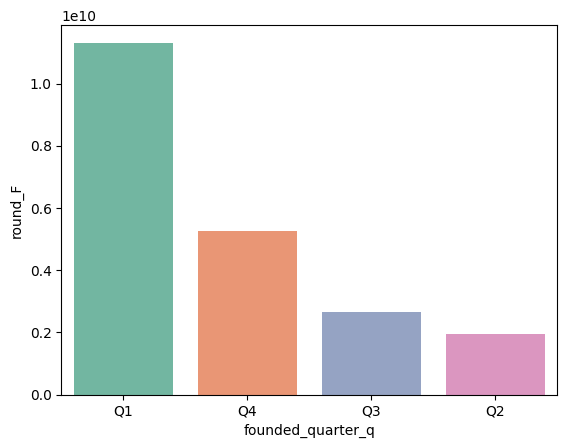

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_F'>

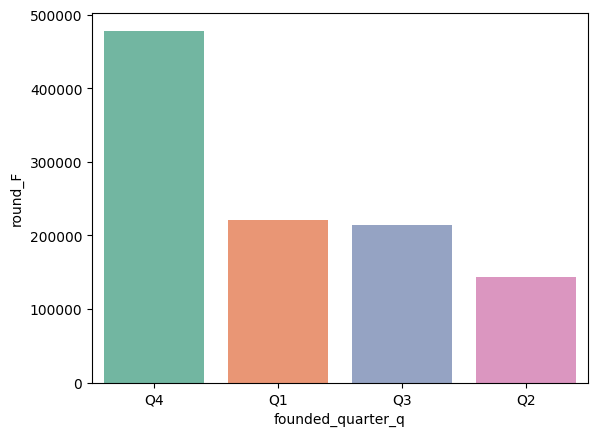

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='round_F'>

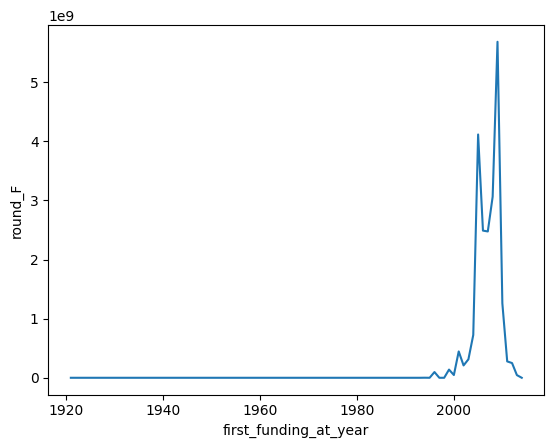

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='round_F'>

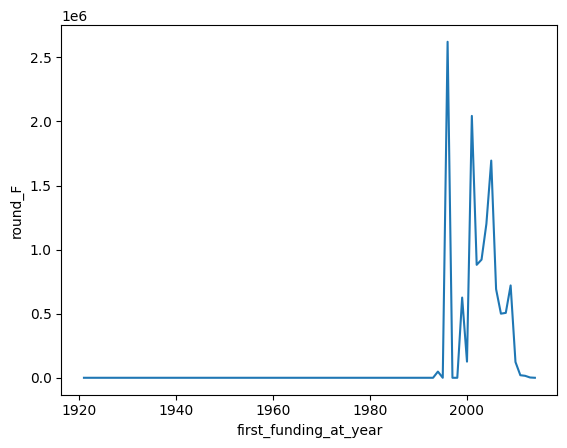

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_F'>

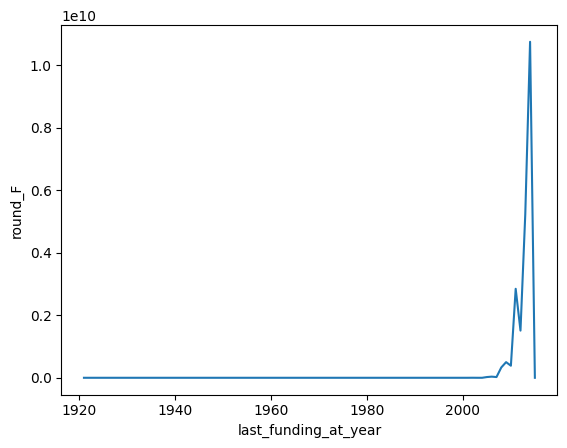

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_F'>

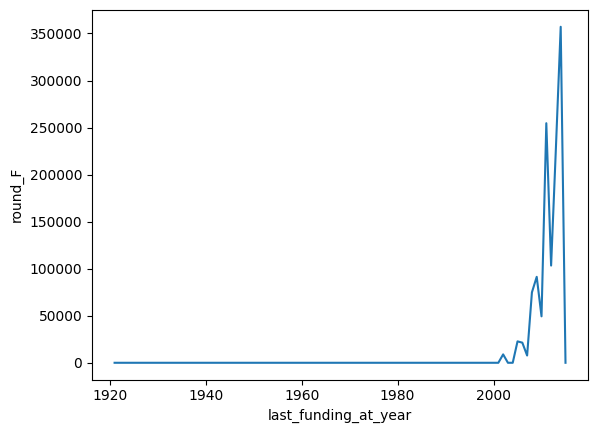

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Round_G

Average and Total Analysis of the Round G Funds as shown below.

In [ ]:
column ='round_G'

<Axes: xlabel='round_G', ylabel='category_list'>

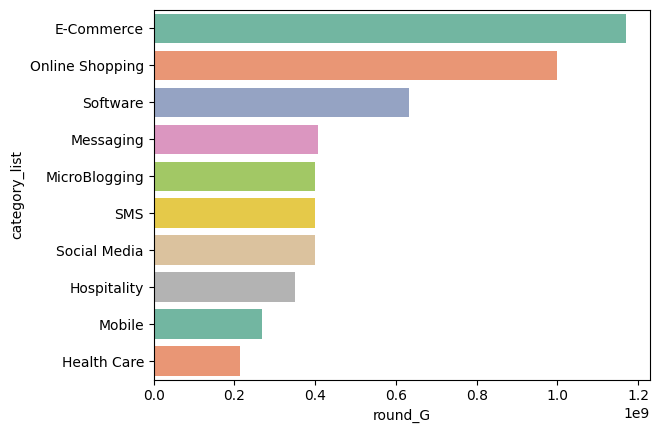

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_G', ylabel='category_list'>

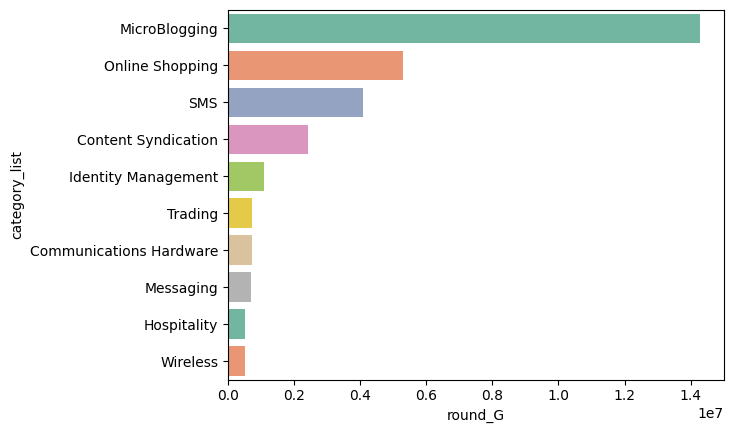

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_G', ylabel=' market '>

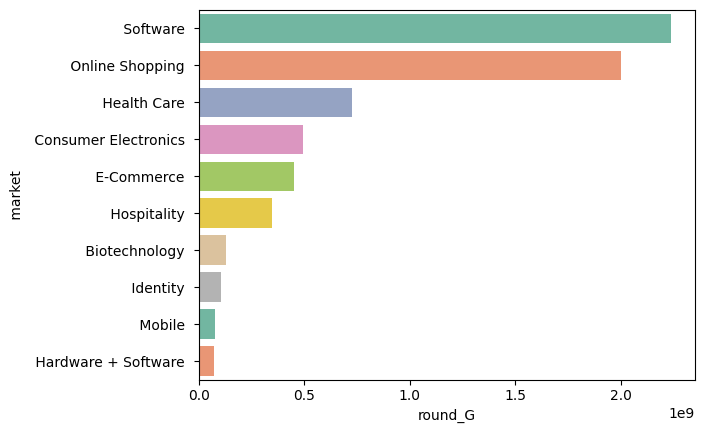

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_G', ylabel=' market '>

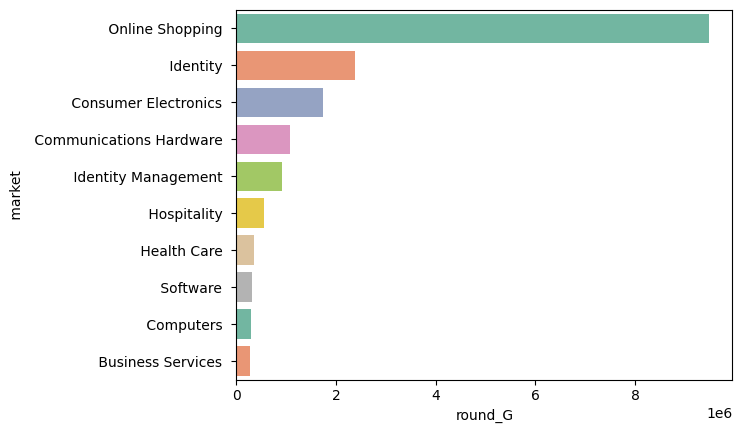

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_G', ylabel='status'>

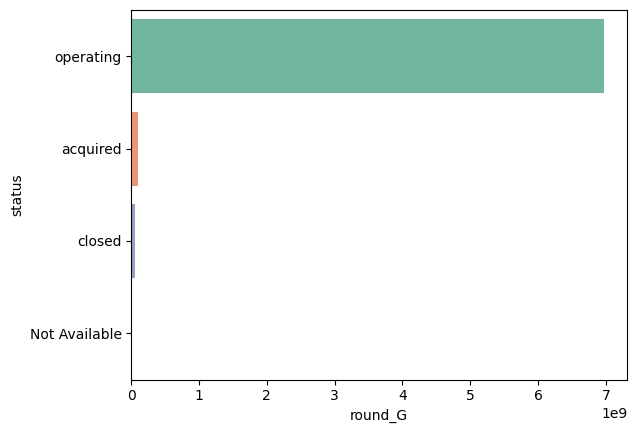

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_G', ylabel='status'>

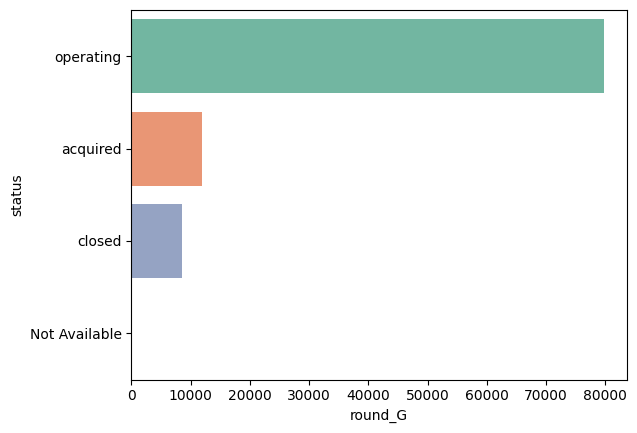

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_G', ylabel='country_code'>

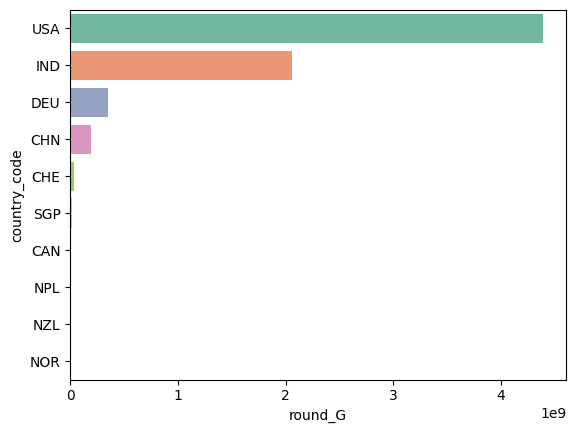

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_G', ylabel='country_code'>

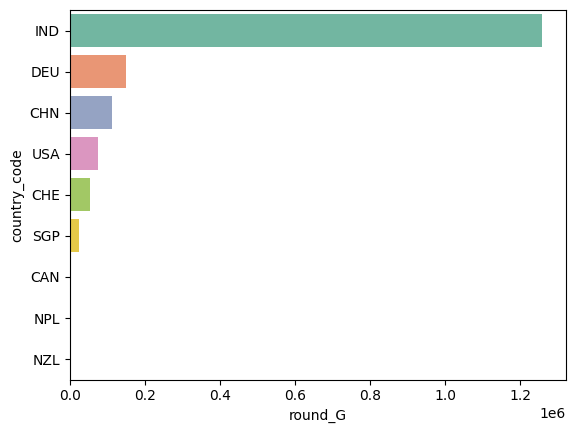

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_G', ylabel='state_code'>

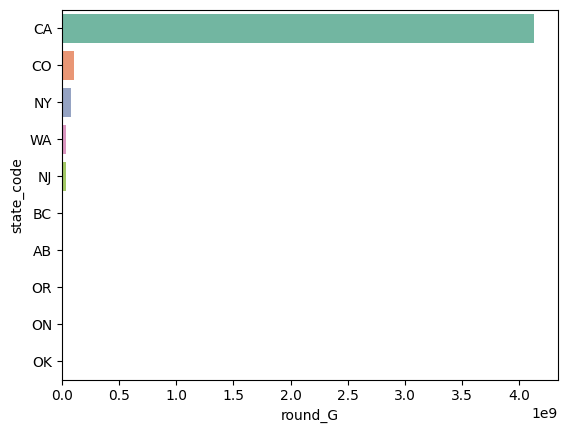

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_G', ylabel='state_code'>

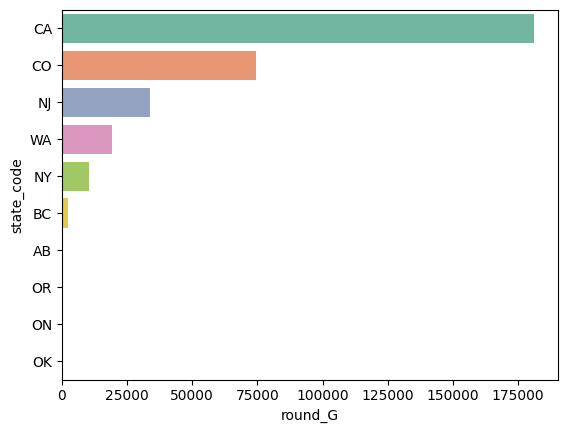

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_G', ylabel='region'>

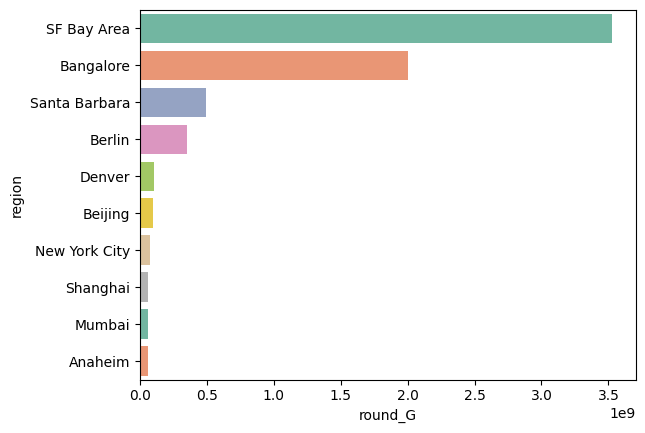

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='round_G', ylabel='region'>

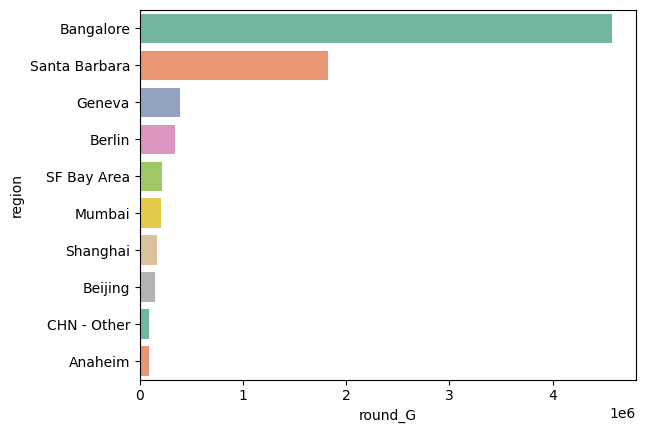

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='round_G'>

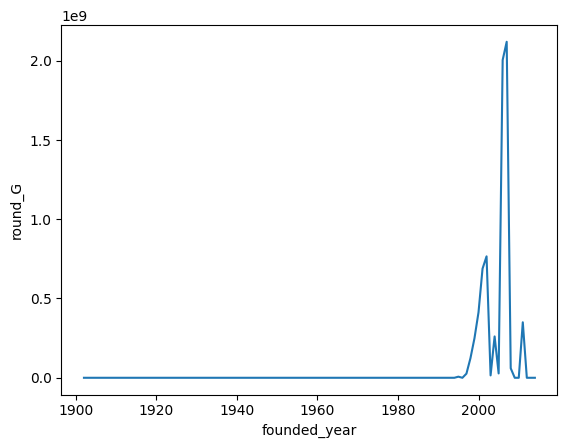

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='round_G'>

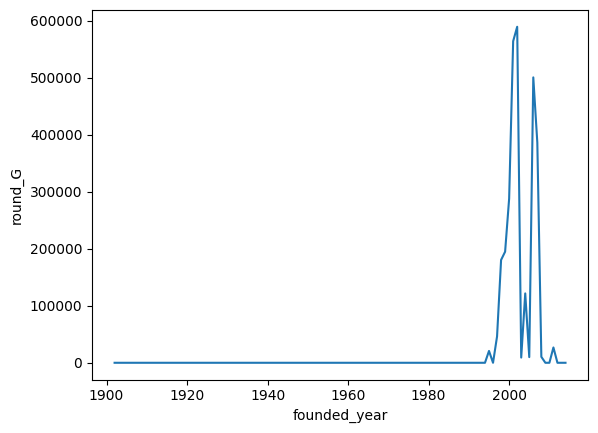

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='round_G'>

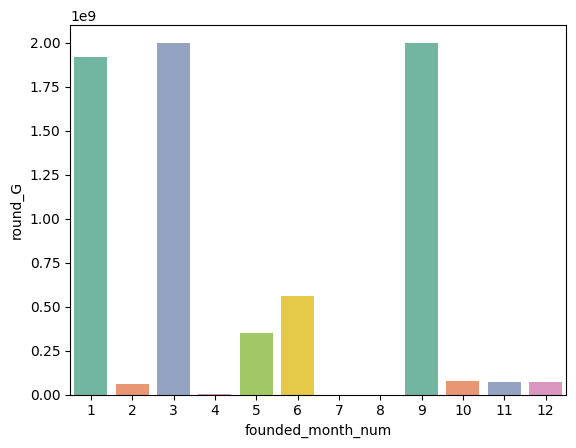

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='round_G'>

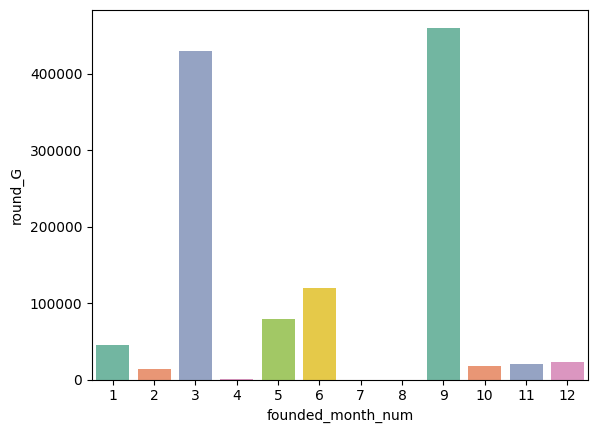

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_G'>

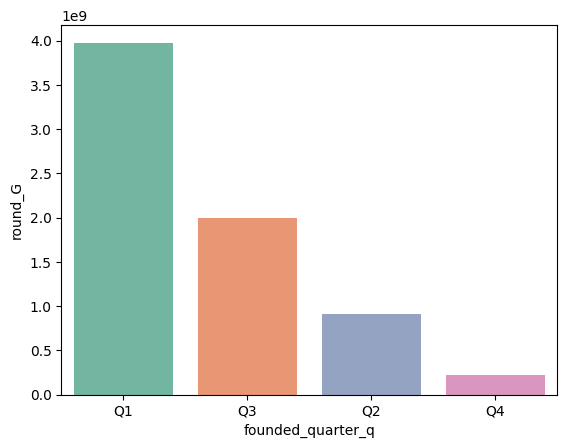

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_G'>

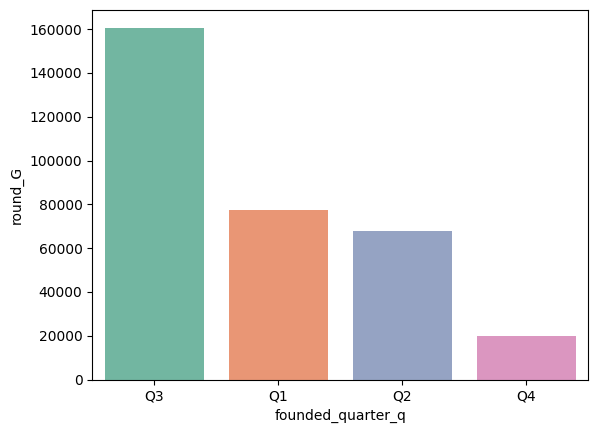

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='round_G'>

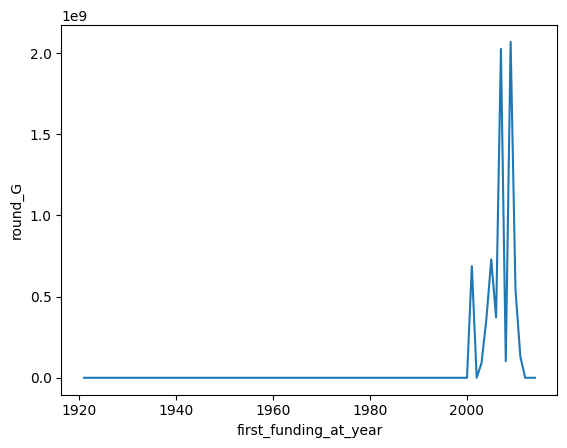

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='round_G'>

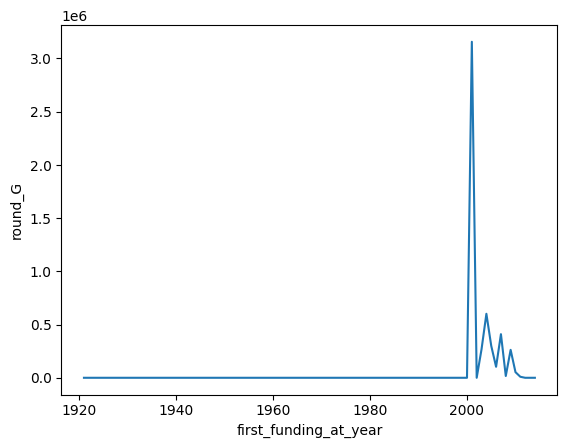

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_G'>

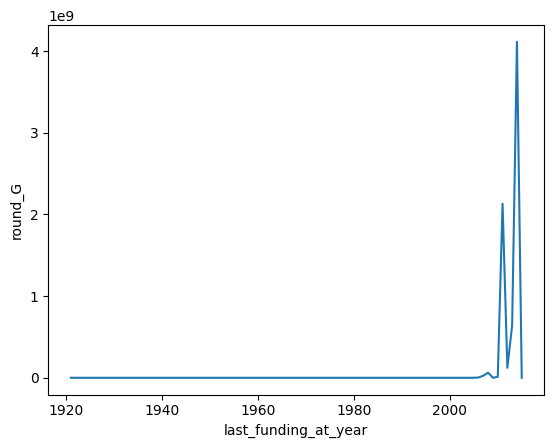

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_G'>

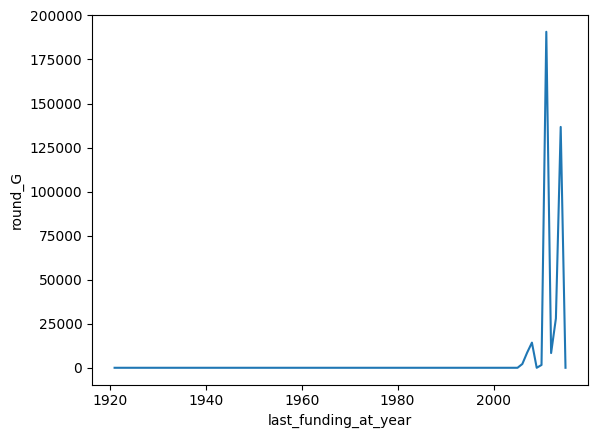

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Round_H

Average and Total Analysis of the Round H Funds as shown below.

In [ ]:
column ='round_H'

<Axes: xlabel='round_H', ylabel='category_list'>

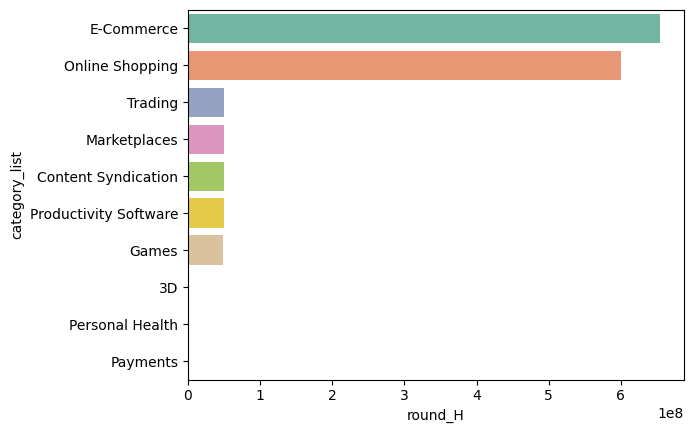

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_H', ylabel='category_list'>

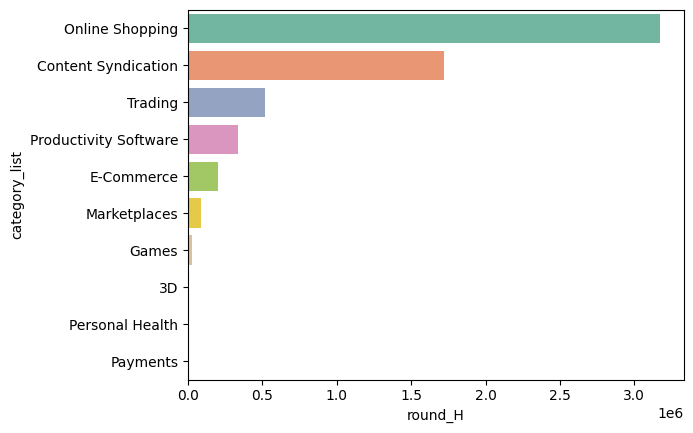

In [ ]:
df_plot = df_clean.groupby('category_list').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['category_list'],palette='Set2')

<Axes: xlabel='round_H', ylabel=' market '>

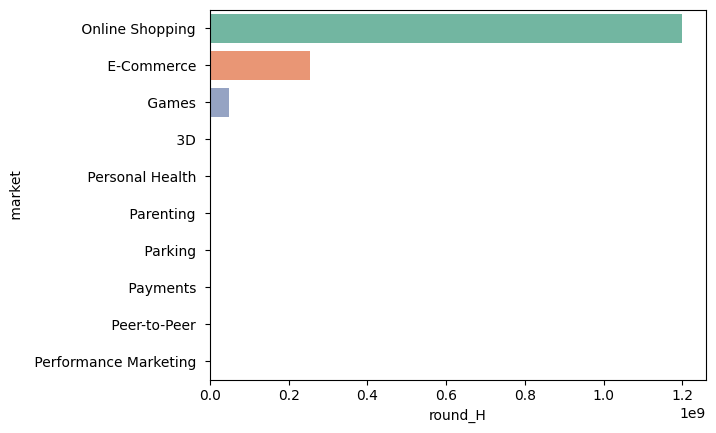

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_H', ylabel=' market '>

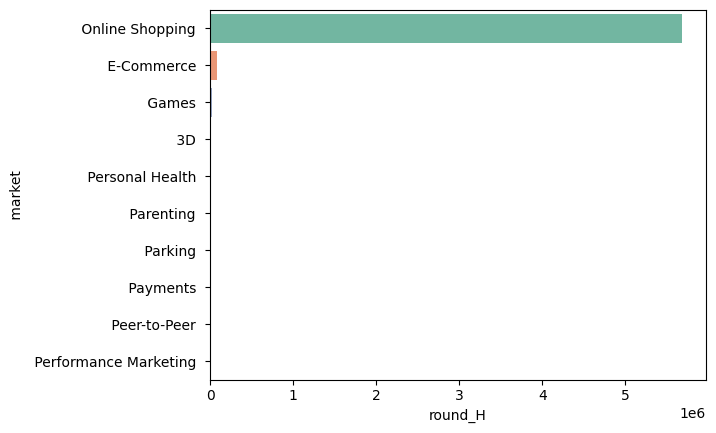

In [ ]:
df_plot = df_clean.groupby(' market ').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot[' market '],palette='Set2')

<Axes: xlabel='round_H', ylabel='status'>

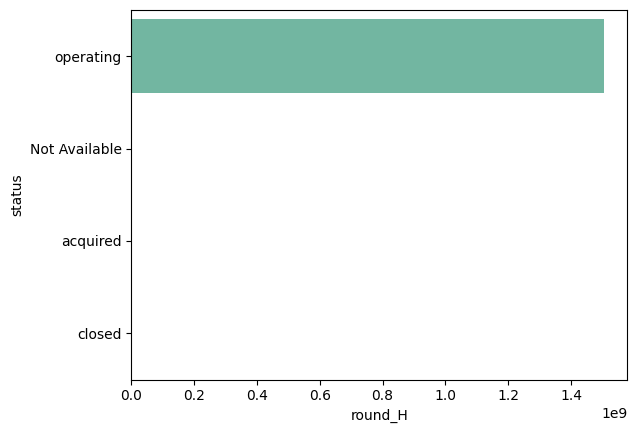

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_H', ylabel='status'>

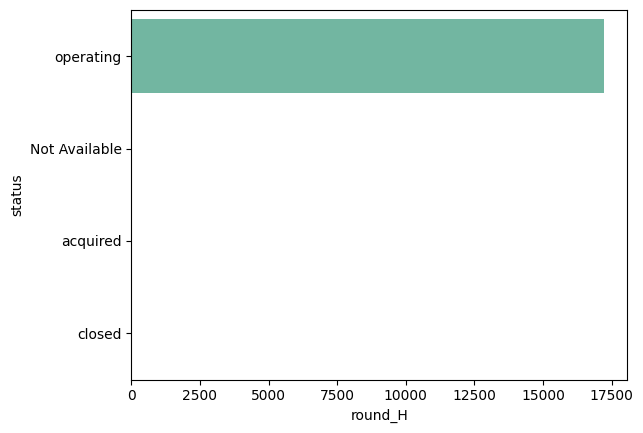

In [ ]:
df_plot = df_clean.groupby('status').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
sns.barplot(x=df_plot[column], y=df_plot['status'],palette='Set2')

<Axes: xlabel='round_H', ylabel='country_code'>

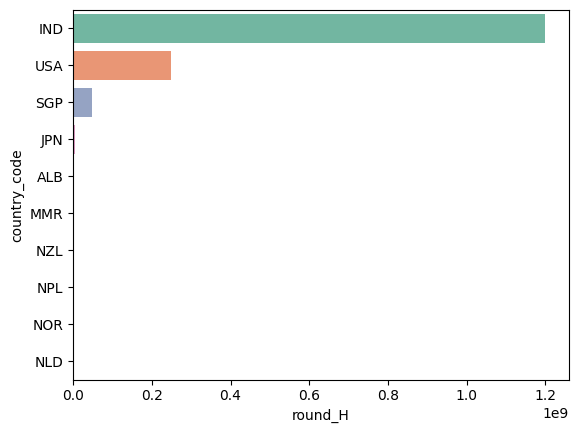

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_H', ylabel='country_code'>

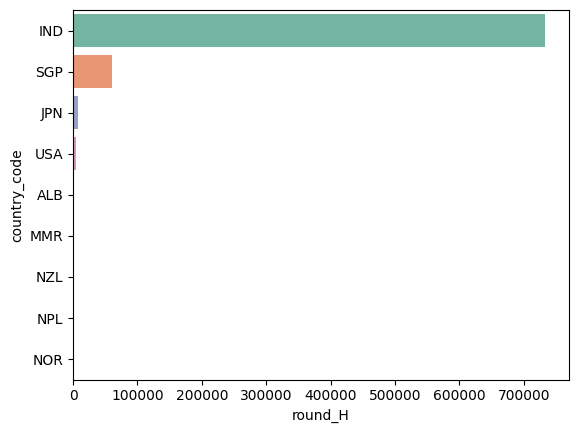

In [ ]:
df_plot = df_clean.groupby('country_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['country_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['country_code'],palette='Set2')

<Axes: xlabel='round_H', ylabel='state_code'>

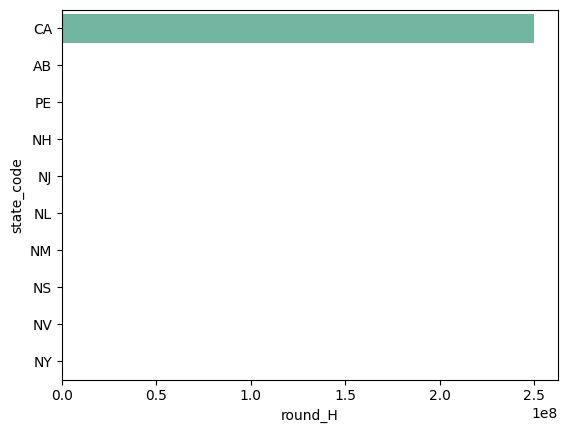

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_H', ylabel='state_code'>

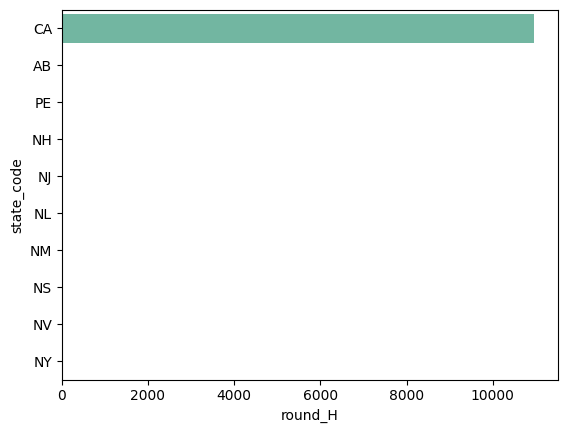

In [ ]:
df_plot = df_clean.groupby('state_code').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['state_code']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['state_code'],palette='Set2')

<Axes: xlabel='round_H', ylabel='region'>

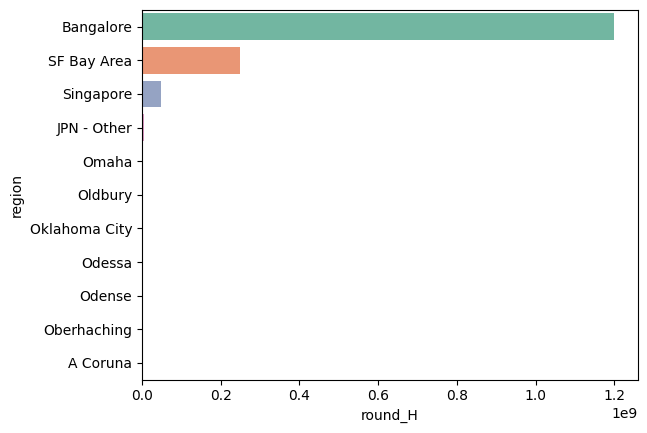

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'sum'}).reset_index().sort_values(column,ascending=False).head(11)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='round_H', ylabel='region'>

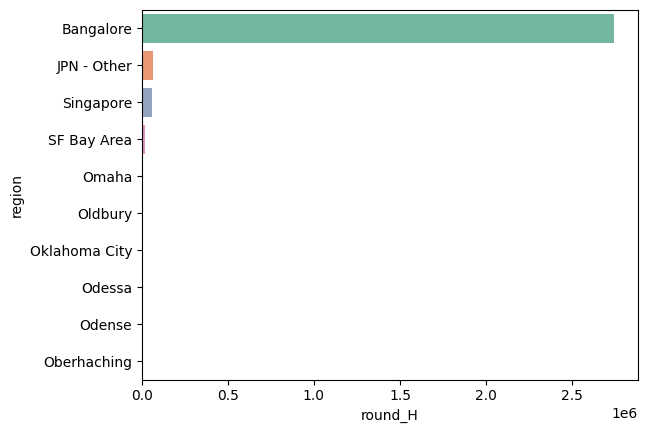

In [ ]:
df_plot = df_clean.groupby('region').agg({column:'mean'}).reset_index().sort_values(column,ascending=False).head(10)
df_plot = df_plot[df_plot['region']!='Not Available']
sns.barplot(x=df_plot[column], y=df_plot['region'],palette='Set2')

<Axes: xlabel='founded_year', ylabel='round_H'>

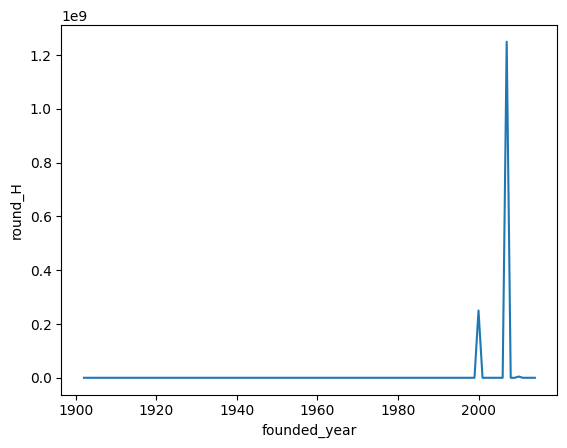

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_year', ylabel='round_H'>

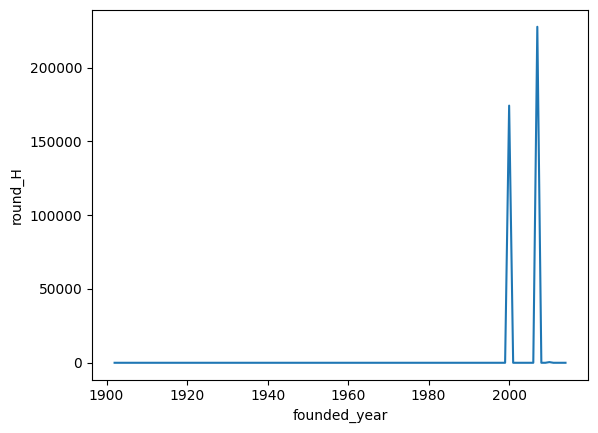

In [ ]:
df_plot = df_clean.groupby('founded_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['founded_year'])

<Axes: xlabel='founded_month_num', ylabel='round_H'>

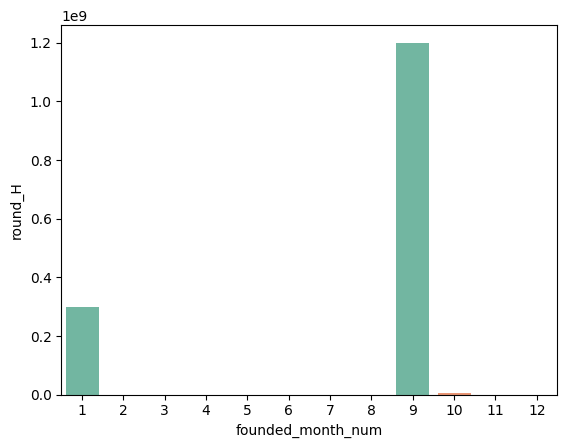

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_month_num', ylabel='round_H'>

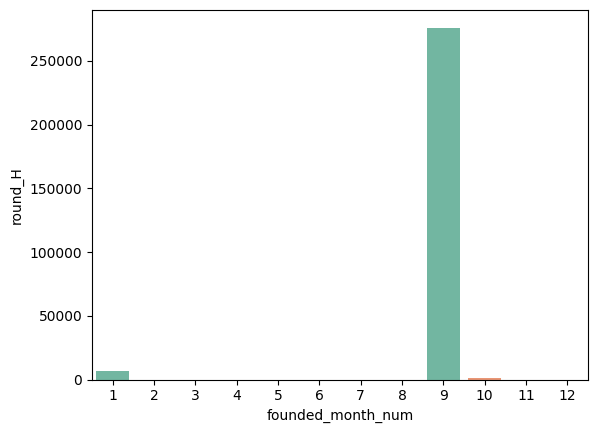

In [ ]:
df_plot = df_clean.groupby('founded_month_num').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_month_num']> 0]
sns.barplot(y=df_plot[column], x=df_plot['founded_month_num'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_H'>

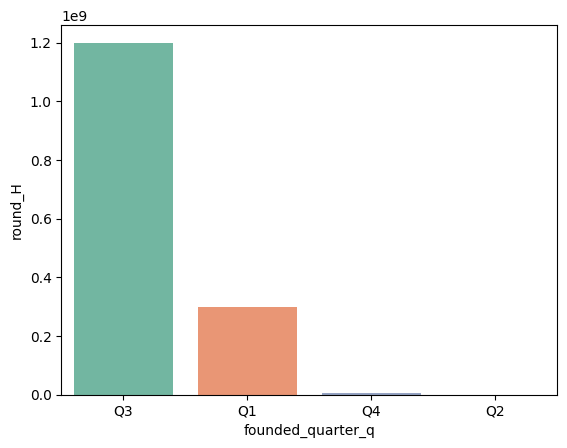

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='founded_quarter_q', ylabel='round_H'>

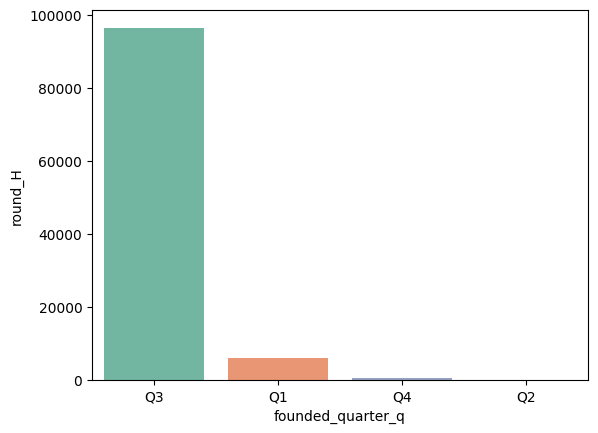

In [ ]:
df_plot = df_clean.groupby('founded_quarter_q').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['founded_quarter_q']!= 'Q0']
sns.barplot(y=df_plot[column], x=df_plot['founded_quarter_q'],palette='Set2')

<Axes: xlabel='first_funding_at_year', ylabel='round_H'>

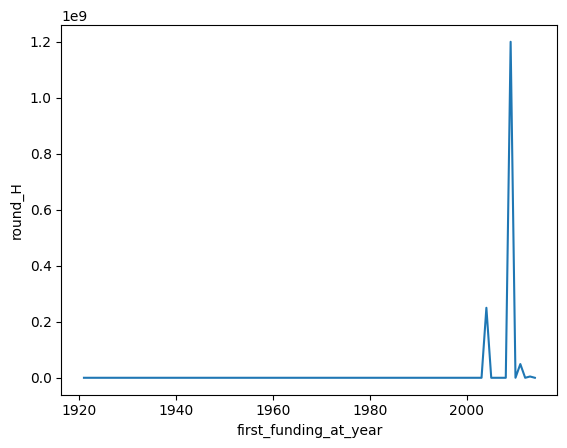

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])


<Axes: xlabel='first_funding_at_year', ylabel='round_H'>

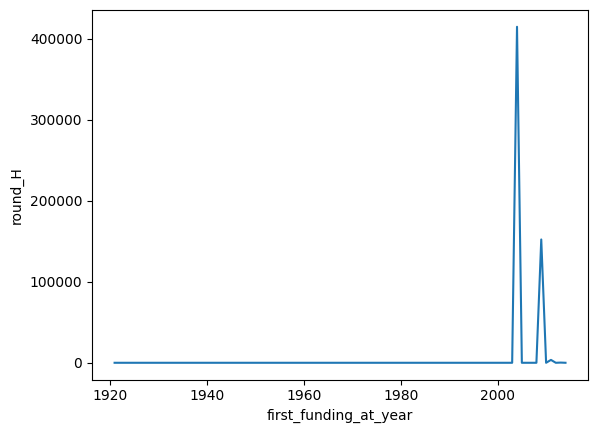

In [ ]:
df_plot = df_clean.groupby('first_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['first_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['first_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_H'>

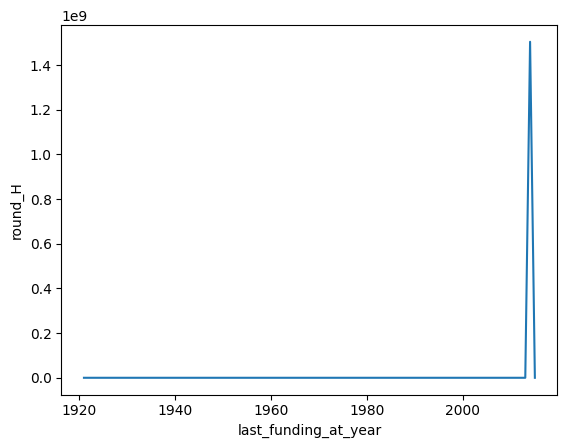

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'sum'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

<Axes: xlabel='last_funding_at_year', ylabel='round_H'>

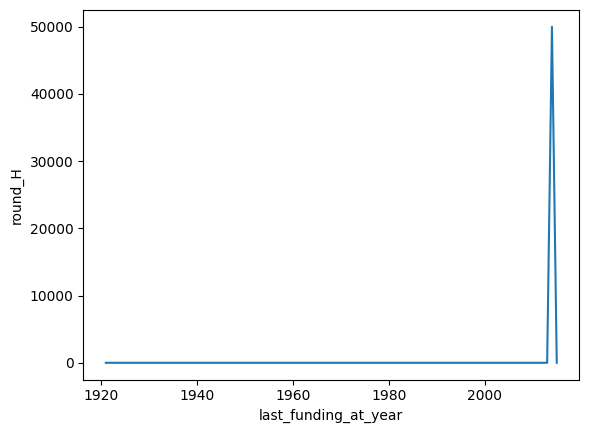

In [ ]:
df_plot = df_clean.groupby('last_funding_at_year').agg({column:'mean'}).reset_index().sort_values(column,ascending=False)
df_plot = df_plot[df_plot['last_funding_at_year']> 1000]
sns.lineplot(y=df_plot[column], x=df_plot['last_funding_at_year'])

## Tabluar Analysis

In [ ]:
agg_dict = {'seed':'sum',
 'venture':'sum',
 'equity_crowdfunding':'sum',
 'undisclosed':'sum',
 'convertible_note':'sum',
 'debt_financing':'sum',
 'angel':'sum',
 'grant':'sum',
 'private_equity':'sum',
 'post_ipo_equity':'sum',
 'post_ipo_debt':'sum',
 'secondary_market':'sum',
 'product_crowdfunding':'sum',
}

In [ ]:
attribute = 'category_list'
column = 'venture'

In [ ]:
df_clean.groupby(attribute).agg(agg_dict).reset_index().sort_values(column,ascending=False).head(10)

,category_list,seed,venture,equity_crowdfunding,undisclosed,convertible_note,debt_financing,angel,grant,private_equity,post_ipo_equity,post_ipo_debt,secondary_market,product_crowdfunding
63,Biotechnology,435184351,59451553212,4929000,411735799,287344889,10772010383,39431235,1194360753,10220041660,5089391623,796883079,79300000,6361749
693,Software,1546521908,47422006420,25637596,542757052,75644603,4092151492,479794852,70786380,8804023503,2071886793,205590000,471093789,13728429
464,Mobile,1468670815,28487793993,3625227,180598135,85339231,32242436839,507582129,349956460,4811657880,6153869702,1231396395,20000000,9322732
215,E-Commerce,940496019,26805939118,13639308,910726800,26018762,1361031373,390251036,9675575,5817222351,486626162,235000000,4700000,9747003
254,Enterprise Software,631805923,26486127159,2461553,176625874,42730932,1662771709,190643654,31472551,2285046167,269608086,2000000000,210000000,1400000
333,Health Care,340702404,24427876691,1375000,166444801,156388024,6919274297,48786460,402414079,5604667881,2273507835,362000000,2500000,6034381
105,Clean Technology,135474935,24180266430,13879518,431710718,24019380,7669131322,28085680,1386677315,13033673330,1616136303,101900000,0,3122580
8,Advertising,632320528,18977376959,3928197,156383181,7348207,790779667,236982015,3779732,2326172993,34926547,0,0,969882
166,Curated Web,879983910,15042243529,1145190,177522118,18964198,1231376812,270408703,22273996,2241536491,1462696463,0,126910000,1014981
20,Analytics,533068020,13037322956,2615200,40656561,16268286,908414054,145131287,13196219,2487591929,14263769,0,13911263,0


In [ ]:
agg_dict_rnd = {'round_A':'sum',
 'round_B':'sum',
 'round_C':'sum',
 'round_D':'sum',
 'round_E':'sum',
 'round_F':'sum',
 'round_G':'sum',
 'round_H':'sum'}

In [ ]:
attribute = 'category_list'
column = 'round_A'

In [ ]:
df_clean.groupby(attribute).agg(agg_dict_rnd).reset_index().sort_values(column,ascending=False).head(10)

,category_list,round_A,round_B,round_C,round_D,round_E,round_F,round_G,round_H
63,Biotechnology,9656487166,12076248199,8876420030,5120227612,2163462493,1268872932,128000000,0
693,Software,8032902872,9460918340,7140657357,4430169881,1576180291,1829641870,631500000,0
464,Mobile,6243842028,6469898148,4835186794,2676826584,1379568255,361334761,269067711,0
215,E-Commerce,4701625673,4614868723,4773659748,2390078381,2319059013,1204801159,1169985435,654600000
254,Enterprise Software,4464590231,5739120778,4601069406,3071643561,1835124156,1663863463,30000000,0
8,Advertising,3462689450,4273744038,3351548842,2330464004,1191787447,430000000,818427,0
166,Curated Web,2957617015,2967335635,2418025784,2182105237,830500000,628750000,63700000,0
333,Health Care,2932645358,4825176647,4439154315,2373223359,1528271391,257500004,212890114,0
301,Games,2746634515,2844414858,2363037626,834197810,175055336,47200019,19000000,49000000
679,Social Media,2491368621,2800037101,2457875648,1672429659,634966511,500000000,400000000,0


## Recomendations:

1. Among different sources of funds Venture Capital Funds have funded start ups in the past. Hence start up founders should focus on gaining access to these funds.

2. Historically it is seen that Round B has the most amount of funds accumulated so start up founders need to target the first and second round to raise maximum number of funds from investors.

3. Commonly most sector undergo funding of from 3-5 rounds

4. Start ups from Biotechnology, Mobile and Software sectors have posed the largest oppurtunities to raise funds. While Natural Gas Uses, Limousines and Oil and Gas sectors have produced large average funding figures historically.


5. Most statrtups which are operating currently have secured the highest amount of funds while acquired startups have the highest average fundings

6. USA is the prime country for prosperous startup ecosystem and investment options


7. California is one of the most successful states in the world to nurture startup ecosystem as it has startups that have received huge amount of fundings

8. SF Bay Area is the most popular city to nurture start up ecosystems and fetch large fundings

9. The 21st century has posed to be the era of start ups as the fundings in this age have increased exponentially

10. Over the years from 1900 there have been alot of start ups which have attracted large fundings

11. January month  which inturn is the 1st quarter poses to be the most successful months for start ups found during this month have attracted large amount of funds